In [1]:
import numpy as np
import pandas as pd
import pickle
import os
import torch
os.environ["TOKENIZERS_PARALLELISM"] = "false"

In [2]:
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
torch.use_deterministic_algorithms(False)
torch.backends.cudnn.benchmark = False

In [3]:
torch.cuda.is_available()

True

In [4]:
outcome='prcr_true'

In [5]:
import torch

cuda = torch.device('cuda')     # Default CUDA device
cuda0 = torch.device('cuda:0')
cuda1 = torch.device('cuda:1')  


# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device(cuda)

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(cuda))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 2 GPU(s) available.
We will use the GPU: NVIDIA A100 80GB PCIe


In [6]:
prefix = '../../'

In [7]:
all_reports = pd.read_csv(prefix + 'timc_recist_labeled_dataset_id.csv')
all_reports['report_length'] = all_reports.report_text.str.len()
all_reports['date'] = pd.to_datetime(all_reports.date)
all_reports = all_reports.sort_values(by=['obs','dfci_mrn','date'])
all_reports['text'] = all_reports["report_text"]
all_reports['text'] = all_reports.text.str.lower().str.replace("\r|\n", " ")
all_reports['text'] = all_reports.text.str.replace(r"\s+", ' ')

In [8]:
%%capture
diagnoses = pd.read_csv('../../timc_data/timepointreport.csv', low_memory=False, on_bad_lines='skip')
#diagnoses = pd.read_csv('../../timc_data/timepointreport.csv', low_memory=False)



diagnoses = diagnoses[['MRN','Protocol','Condition']].groupby(['MRN','Protocol']).first().reset_index().rename(columns={'MRN':'BWH_MRN', 'Protocol':'protocol'})
diagnoses.info()


mrn_crosswalk = pd.read_csv('/data/clin_notes_outcomes/profile_3-2024/structured_data/REQ_KK71_105304_F5_PT_INFO_STATUS_REGISTRATION.csv', low_memory=False)[['BWH_MRN','DFCI_MRN', 'GENDER_NM']]
demographics = pd.read_csv('/data/clin_notes_outcomes/profile_3-2024/structured_data/REQ_KK71_105304_F5_DEMOGRAPHICS_REGISTRATION.csv')[['DFCI_MRN','IDM_RACE_NM','HISPANIC_IND']].groupby('DFCI_MRN').first().reset_index()
demographics['white_race'] = np.where(demographics.IDM_RACE_NM == 'White', 1, 0)
mrn_crosswalk = pd.merge(mrn_crosswalk, demographics, on='DFCI_MRN')

In [9]:
#mrn_crosswalk.GENDER_NM.value_counts(), mrn_crosswalk.IDM_RACE_NM.value_counts(), mrn_crosswalk.HISPANIC_IND.value_counts()

In [10]:
diagnoses = pd.merge(diagnoses, mrn_crosswalk, on = 'BWH_MRN').groupby(['DFCI_MRN','protocol']).first().reset_index().rename(columns={'DFCI_MRN':'dfci_mrn'})[['dfci_mrn','GENDER_NM','white_race','HISPANIC_IND','protocol','Condition']]

In [11]:
diagnoses.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8648 entries, 0 to 8647
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   dfci_mrn      8648 non-null   int64 
 1   GENDER_NM     8648 non-null   object
 2   white_race    8648 non-null   int64 
 3   HISPANIC_IND  8648 non-null   object
 4   protocol      8648 non-null   object
 5   Condition     8623 non-null   object
dtypes: int64(2), object(4)
memory usage: 405.5+ KB


In [12]:
# remove duplicates
all_reports = all_reports.drop_duplicates(subset=['dfci_mrn','text'])

In [13]:
all_reports.info()

<class 'pandas.core.frame.DataFrame'>
Index: 63899 entries, 0 to 63914
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Unnamed: 0               63899 non-null  int64         
 1   dfci_mrn                 63899 non-null  int64         
 2   date                     63899 non-null  datetime64[ns]
 3   report_text              63899 non-null  object        
 4   protocol                 63899 non-null  object        
 5   overall_response         63899 non-null  object        
 6   narrative_text           63896 non-null  object        
 7   impression_text          35806 non-null  object        
 8   drop_this_obs            63899 non-null  bool          
 9   split                    63899 non-null  object        
 10  obs                      63899 non-null  int64         
 11  overall_response_factor  63899 non-null  int64         
 12  report_length            63899 non-nu

In [14]:
all_reports.shape

(63899, 14)

In [15]:
all_reports = pd.merge(diagnoses, all_reports, on=['dfci_mrn','protocol'])
all_reports.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63716 entries, 0 to 63715
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   dfci_mrn                 63716 non-null  int64         
 1   GENDER_NM                63716 non-null  object        
 2   white_race               63716 non-null  int64         
 3   HISPANIC_IND             63716 non-null  object        
 4   protocol                 63716 non-null  object        
 5   Condition                63235 non-null  object        
 6   Unnamed: 0               63716 non-null  int64         
 7   date                     63716 non-null  datetime64[ns]
 8   report_text              63716 non-null  object        
 9   overall_response         63716 non-null  object        
 10  narrative_text           63713 non-null  object        
 11  impression_text          35760 non-null  object        
 12  drop_this_obs            63716 n

In [16]:
all_reports['starttime'] = all_reports.groupby('obs').date.transform('first')
all_reports['time'] =  (all_reports['date'] - all_reports['starttime']).dt.days

In [17]:
all_reports.shape

(63716, 20)

In [18]:
all_reports.overall_response_factor.value_counts()

overall_response_factor
3    20048
0    15892
1    15377
4     9161
2     3238
Name: count, dtype: int64

In [19]:
all_reports.overall_response.value_counts()

overall_response
SD    20048
BL    15892
PR    15377
PD     9161
CR     3238
Name: count, dtype: int64

In [20]:
all_reports['prcr_true'] = np.where(all_reports.overall_response.isin(['PR','CR']), 1, 0)
all_reports['pd_true'] = np.where(all_reports.overall_response == 'PD', 1, 0)

# baseline scans get coded as -1 for both the PD and PRCR outcomes.
all_reports['outcome'] = np.where(all_reports.overall_response == 'BL', -1, 0)
all_reports['outcome'] = np.where(all_reports[outcome]==1, 1, all_reports['outcome'])
print(all_reports.outcome.value_counts())
print(all_reports.prcr_true.value_counts())
print(all_reports.pd_true.value_counts())
all_reports['is_bl'] = np.where(all_reports.overall_response == 'BL', True, False)

good_obs = all_reports.groupby('obs').is_bl.all().reset_index()
good_obs = good_obs[good_obs.is_bl == False]

all_reports = pd.merge(all_reports, good_obs[['obs']], on='obs')

print(all_reports.outcome.value_counts())
print(all_reports.prcr_true.value_counts())
print(all_reports.pd_true.value_counts())

outcome
 0    29209
 1    18615
-1    15892
Name: count, dtype: int64
prcr_true
0    45101
1    18615
Name: count, dtype: int64
pd_true
0    54555
1     9161
Name: count, dtype: int64
outcome
 0    29209
 1    18615
-1    12594
Name: count, dtype: int64
prcr_true
0    41803
1    18615
Name: count, dtype: int64
pd_true
0    51257
1     9161
Name: count, dtype: int64


In [21]:
cancer_list = all_reports.groupby('dfci_mrn').first().reset_index(drop=True).Condition.value_counts()
percentages = cancer_list/cancer_list.sum()
cancer_types = pd.DataFrame({'cancer_type':cancer_list.index, 'proportion':percentages}).reset_index(drop=True)
cancer_types.to_csv('cancer_type_distribution.csv')
cancer_types.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91 entries, 0 to 90
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   cancer_type  91 non-null     object 
 1   proportion   91 non-null     float64
dtypes: float64(1), object(1)
memory usage: 1.6+ KB


In [22]:
percentages

Condition
Breast                                0.211721
Ovarian                               0.106733
Lung Non-Small                        0.094514
Chronic Lymphocytic Leukemia (CLL)    0.055362
Renal Cell                            0.040399
                                        ...   
Neuroblastoma                         0.000249
Epithelioid Hemangioendothelioma      0.000249
Glioblastoma                          0.000249
Testicular Cancer                     0.000249
Double Hit Lymphoma                   0.000249
Name: count, Length: 91, dtype: float64

In [23]:
top_five_cancers = all_reports.Condition.value_counts().head(5).index.tolist()
#head(5).tolist()
top_five_cancers

['Breast',
 'Ovarian',
 'Lung Non-Small',
 'Chronic Lymphocytic Leukemia (CLL)',
 'Renal Cell']

In [24]:
#training = all_reports[all_reports['split'] == 'train']
validation = all_reports[all_reports['split'] == 'validation']
test = all_reports[all_reports['split'] == 'test']

In [25]:
from torch.utils import data
import torch.nn.functional as F
from transformers import AutoTokenizer

class RecistDataset(data.Dataset):
    def __init__(self, pandas_dataset):
        self.data = pandas_dataset
        self.max_doc_len = 512
        self.tokenizer = AutoTokenizer.from_pretrained("medicalai/ClinicalBERT")
        self.observations = self.data.obs.unique()
        
    def __len__(self):
        # how many observations (pt-trial combos) in the dataset
        return len(self.observations)
    
    def __getitem__(self, index):
        # get data for observation corresponding to index passed
        thisobs = self.observations[index]
        obs = self.data[self.data.obs == thisobs].copy().reset_index(drop=True)
        
        obs['date'] = pd.to_datetime(obs['date'])
        obs = obs.sort_values(by=['date'])

        start_times = torch.tensor(obs.time / 365, dtype=torch.float32)

    
        y_outcome = torch.tensor(obs['outcome'], dtype=torch.float32)

        text = obs.text.tolist()
        
        
        encoded_list = self.tokenizer(text, padding='max_length', max_length=self.max_doc_len, truncation=True)
        input_ids = torch.tensor(encoded_list['input_ids'], dtype=torch.long)
        attention_mask = torch.tensor(encoded_list['attention_mask'], dtype=torch.long) 
        
        return input_ids, attention_mask, start_times, y_outcome

    

        

/homes10/klkehl/miniconda3/envs/vllm2/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [26]:
#model 
import math
from transformers import AutoModel
from torch.nn import functional as F
import torch.nn as nn
from torch import Tensor
from torch.utils.data import DataLoader
from torch.nn import LSTM, Linear, Embedding, Conv1d, MaxPool1d, GRU, LSTMCell, GRUCell, Dropout, AdaptiveMaxPool1d
from recistmodels import HTransformer
    
    

###### from: https://pytorch.org/tutorials/beginner/transformer_tutorial.html
class PositionalEncoding(nn.Module):

    def __init__(self, d_model: int, dropout: float = 0.0, max_len: int = 150):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)

        position = torch.arange(max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * (-math.log(10000.0) / d_model))
        pe = torch.zeros(max_len, 1, d_model)
        pe[:, 0, 0::2] = torch.sin(position * div_term)
        pe[:, 0, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe)

    def forward(self, x: Tensor) -> Tensor:
        """
        Arguments:
            x: Tensor, shape ``[seq_len, batch_size, embedding_dim]``
        """
        x = x + self.pe[:x.size(0)]
        return self.dropout(x)

    
class RecistModel(nn.Module):


    def __init__(self):
        super(RecistModel, self).__init__()
        
        self.day_tensor_dim = 768
        self.per_doc_hidden_dim = 256
        
        self.final_hidden_dim = 128
        self.class_output_dim=1
      
        self.note_bert = AutoModel.from_pretrained('medicalai/ClinicalBERT')
            
        self.per_doc_hidden = Linear(self.day_tensor_dim, self.per_doc_hidden_dim)
        
        self.day_transformer = HTransformer(emb=self.per_doc_hidden_dim, heads=4, depth=1)
        
        self.day_position_encoding = PositionalEncoding(self.per_doc_hidden_dim)
        
        self.final_hidden = Linear(self.per_doc_hidden_dim, self.final_hidden_dim)
        
        self.recist_out = Linear(self.final_hidden_dim, self.class_output_dim)

        

        

    def forward(self, input_ids, mask, start_times):

        
        input_ids = input_ids.squeeze(0)
        mask = mask.squeeze(0)
        start_times = start_times.squeeze(0) # now (num_docs,)
        
        main = self.note_bert(input_ids, mask)
        main = main.last_hidden_state[:,0,:].squeeze(1)
              
        main = self.per_doc_hidden(main)

        # batch = sequence_length, embedding
        # permute to get position encoding along temporal dimension


        # add a single batch dimension, then position encode, then remove batch dimension
        main = main.unsqueeze(1)
        main = self.day_position_encoding(main)
        main = main.squeeze(1)
        
        # figure out unique start times.
        unique_start_times = torch.unique(start_times)
        
        # loop over unique start times
        day_tensor_list = []
        for start_time in unique_start_times:
            day_input = main[start_times == start_time]
            
            # batch of 1 axis back
            day_input = day_input.unsqueeze(0)

            day_output = torch.max(day_input, axis=1)[0]

            day_tensor_list.append(day_output)
        day_tensors = torch.cat(day_tensor_list)
        

        # batch axis back for hierarchical transformer
        day_tensors = day_tensors.unsqueeze(0)
        main = self.day_transformer(day_tensors)
        main = self.final_hidden(main)
        main = F.relu(main)
        
        # remove batch axis again
        main = main.squeeze(0)
        main = self.recist_out(main).squeeze(1)
               
        return main


In [27]:
validation_full = validation[validation['text'].notna()]
test_full = test[test['text'].notna()]


In [28]:
top_five_cancers

['Breast',
 'Ovarian',
 'Lung Non-Small',
 'Chronic Lymphocytic Leukemia (CLL)',
 'Renal Cell']

In [29]:
model_paths = ['/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt',
               '/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt',
               '/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt',
               '/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt',
               '/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt']

In [30]:
from utils_102023 import eval_model

validation set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.8022176181706568
Outcome probability: 0.16589861751152074
Average precision score: 0.41
Best F1: 0.5090909090909091


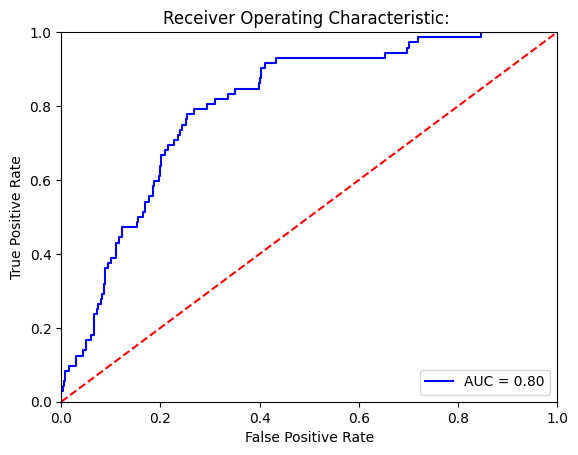

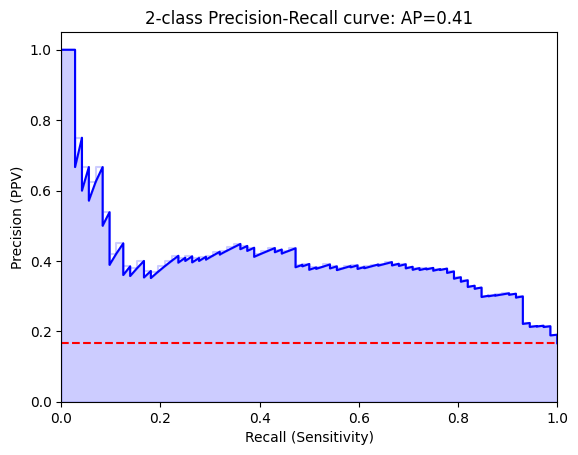

Threshold for best F1:
-0.8178011
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[270  92]
 [ 16  56]]


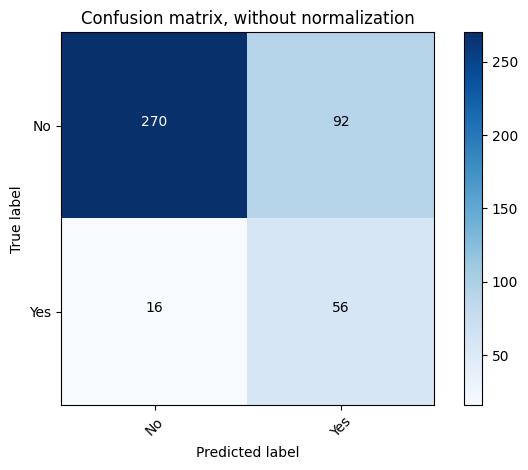

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.94      0.75      0.83       362
         Yes       0.38      0.78      0.51        72

    accuracy                           0.75       434
   macro avg       0.66      0.76      0.67       434
weighted avg       0.85      0.75      0.78       434

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[330  32]
 [ 49  23]]


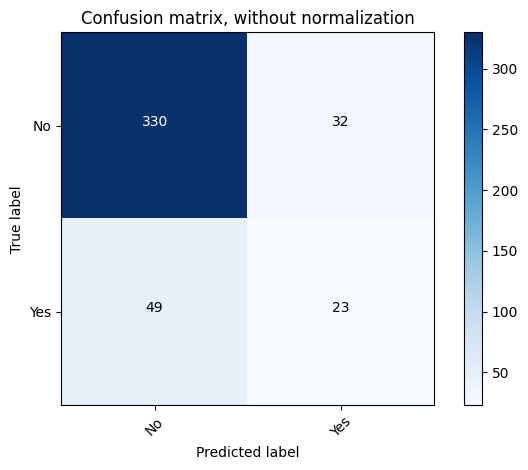

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.91      0.89       362
         Yes       0.42      0.32      0.36        72

    accuracy                           0.81       434
   macro avg       0.64      0.62      0.63       434
weighted avg       0.80      0.81      0.80       434



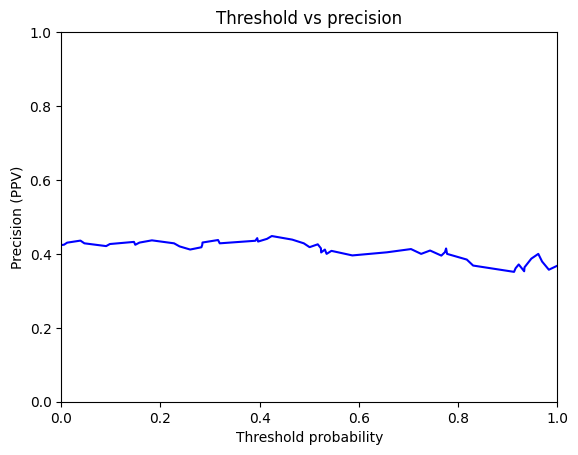

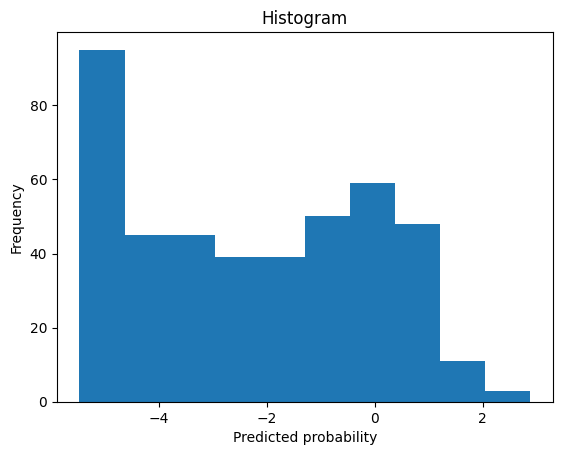

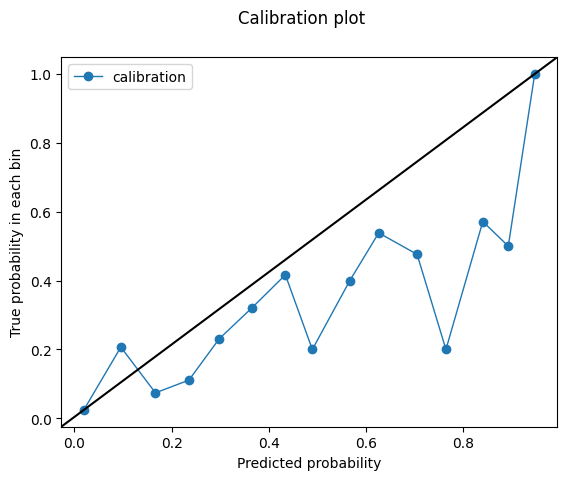

-0.8178011
validation set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.7785451197053407
Outcome probability: 0.16589861751152074
Average precision score: 0.37
Best F1: 0.4979591836734694


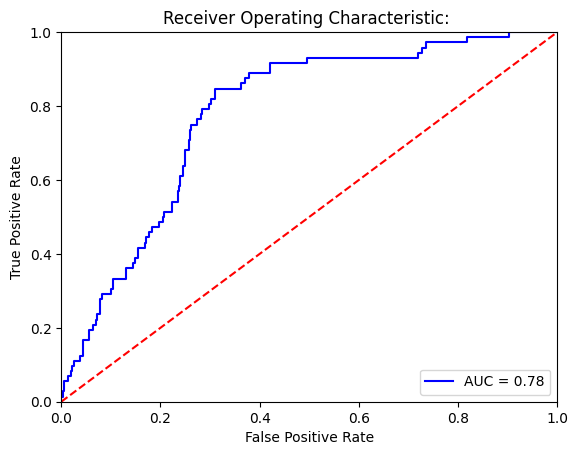

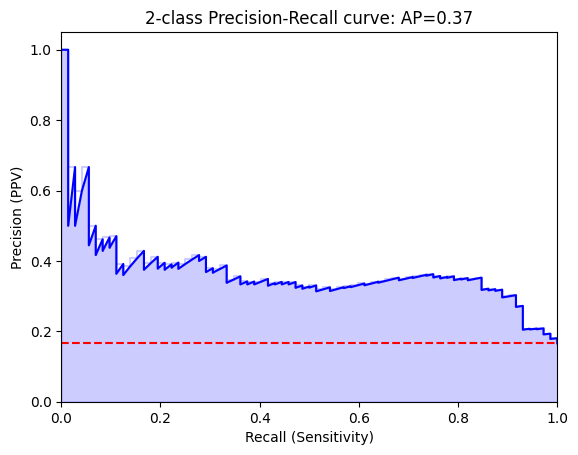

Threshold for best F1:
-0.88470155
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[250 112]
 [ 11  61]]


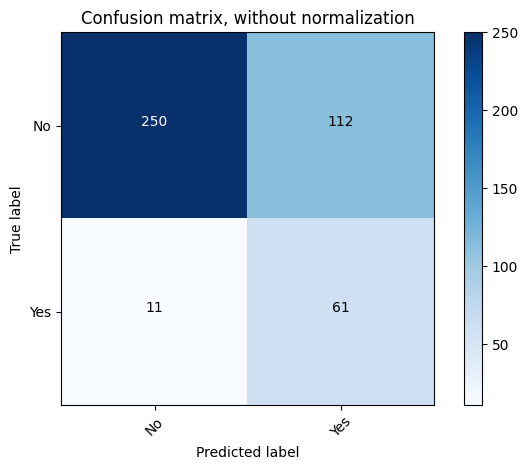

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.96      0.69      0.80       362
         Yes       0.35      0.85      0.50        72

    accuracy                           0.72       434
   macro avg       0.66      0.77      0.65       434
weighted avg       0.86      0.72      0.75       434

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[323  39]
 [ 48  24]]


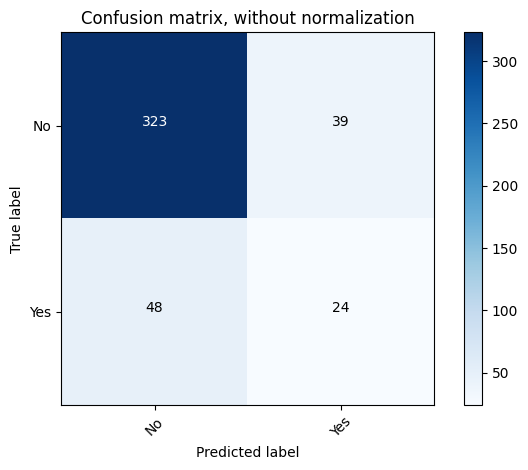

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.89      0.88       362
         Yes       0.38      0.33      0.36        72

    accuracy                           0.80       434
   macro avg       0.63      0.61      0.62       434
weighted avg       0.79      0.80      0.79       434



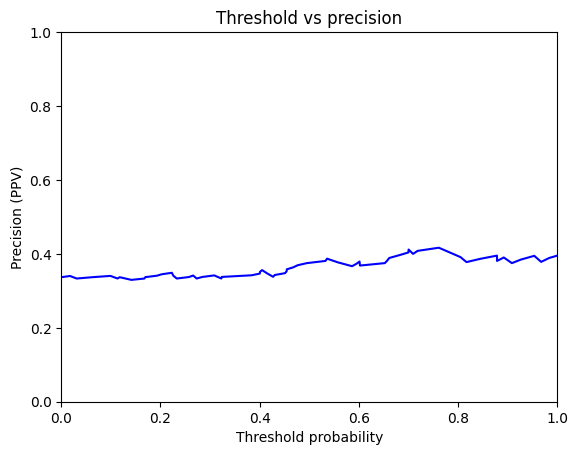

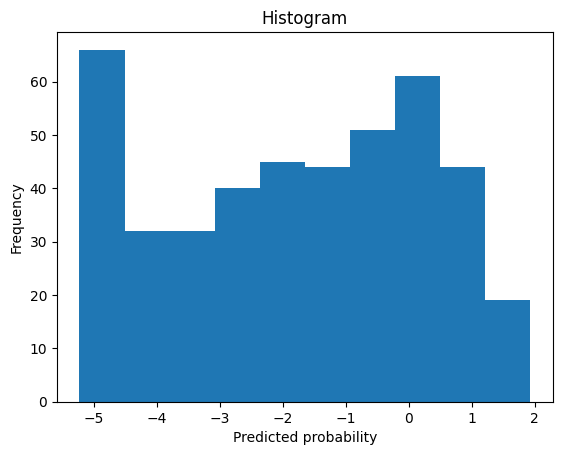

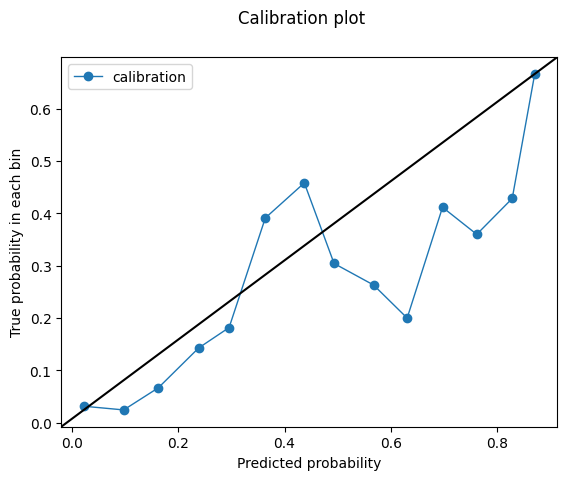

-0.88470155
validation set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.7599370779619399
Outcome probability: 0.16589861751152074
Average precision score: 0.36
Best F1: 0.44609665427509293


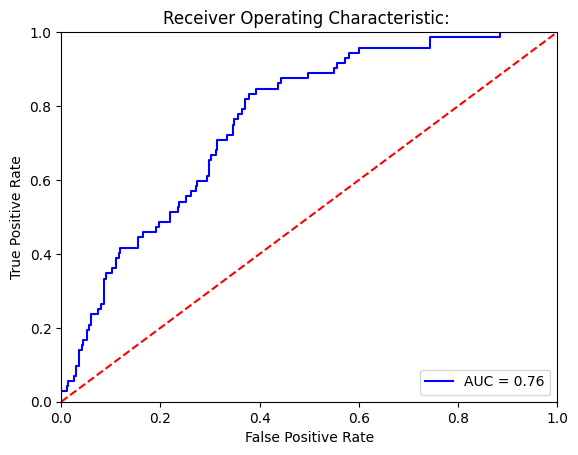

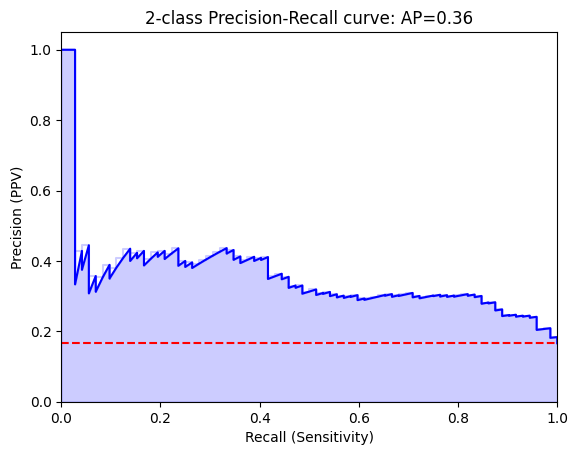

Threshold for best F1:
-1.4374697
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[225 137]
 [ 12  60]]


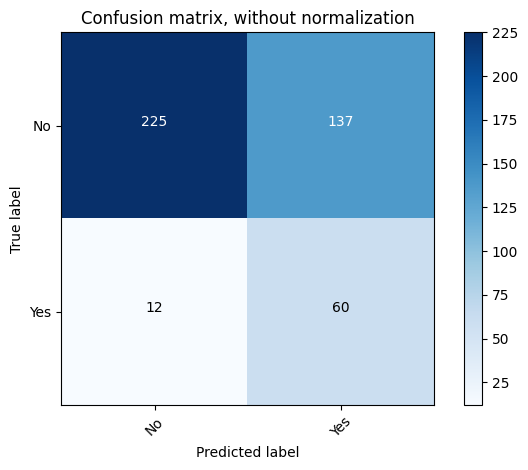

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.95      0.62      0.75       362
         Yes       0.30      0.83      0.45        72

    accuracy                           0.66       434
   macro avg       0.63      0.73      0.60       434
weighted avg       0.84      0.66      0.70       434

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[346  16]
 [ 61  11]]


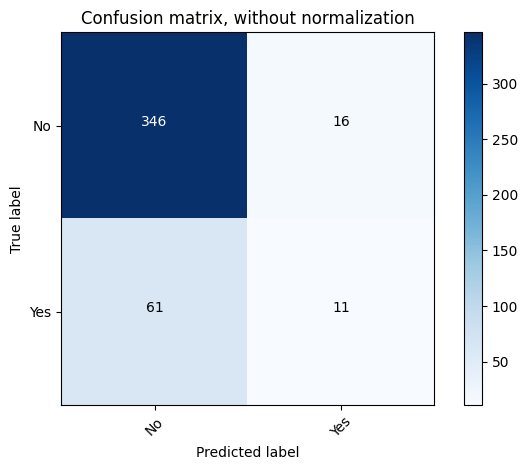

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.85      0.96      0.90       362
         Yes       0.41      0.15      0.22        72

    accuracy                           0.82       434
   macro avg       0.63      0.55      0.56       434
weighted avg       0.78      0.82      0.79       434



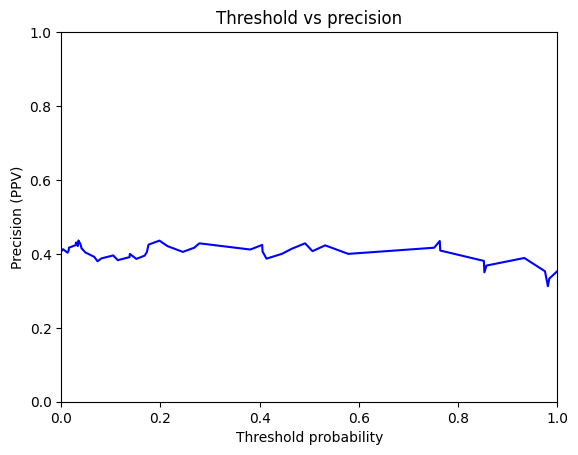

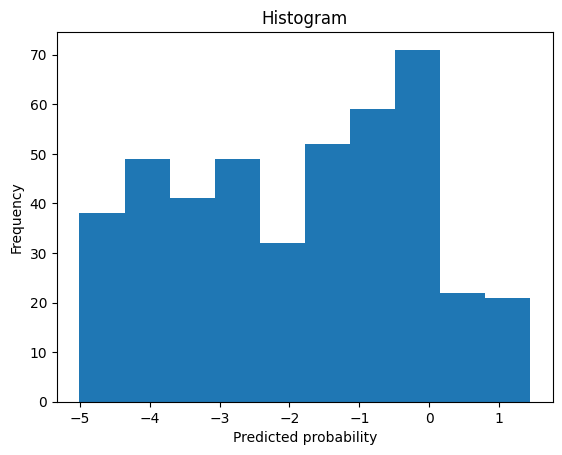

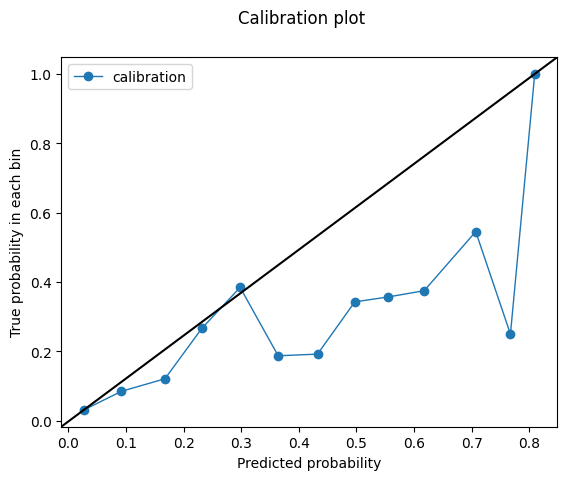

-1.4374697
validation set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.6107274401473297
Outcome probability: 0.16589861751152074
Average precision score: 0.26
Best F1: 0.3272727272727273


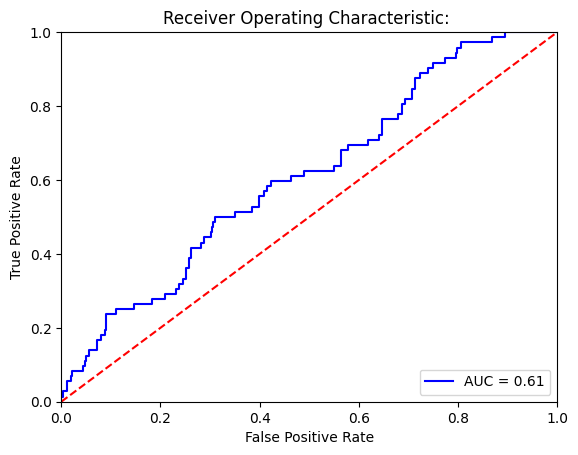

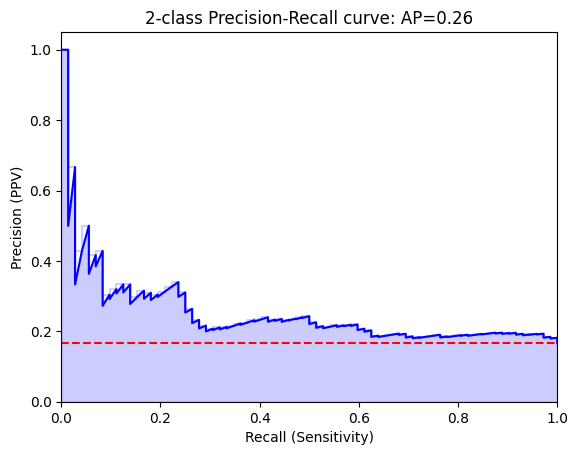

Threshold for best F1:
-4.3491807
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[250 112]
 [ 36  36]]


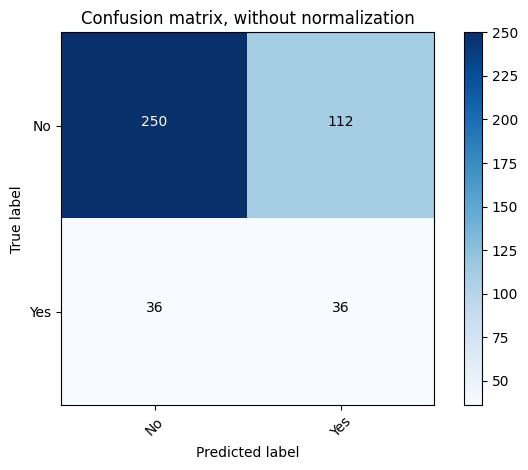

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.69      0.77       362
         Yes       0.24      0.50      0.33        72

    accuracy                           0.66       434
   macro avg       0.56      0.60      0.55       434
weighted avg       0.77      0.66      0.70       434

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[355   7]
 [ 68   4]]


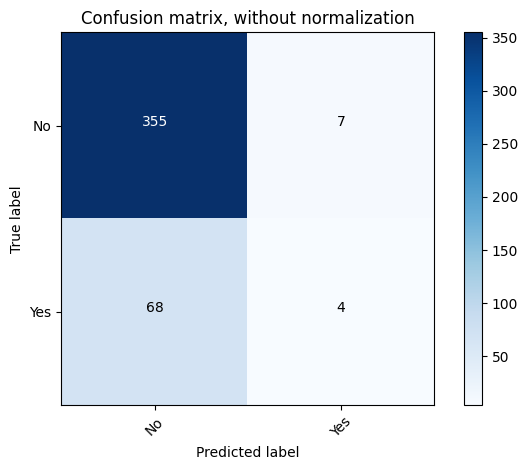

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      0.98      0.90       362
         Yes       0.36      0.06      0.10        72

    accuracy                           0.83       434
   macro avg       0.60      0.52      0.50       434
weighted avg       0.76      0.83      0.77       434



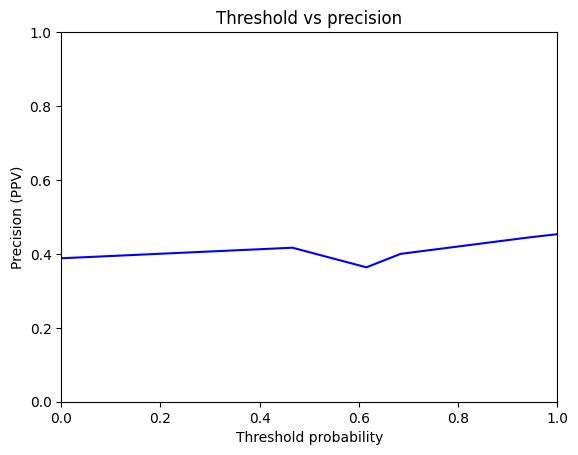

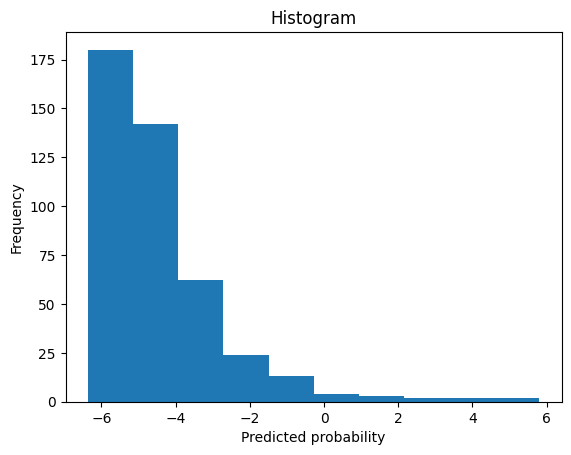

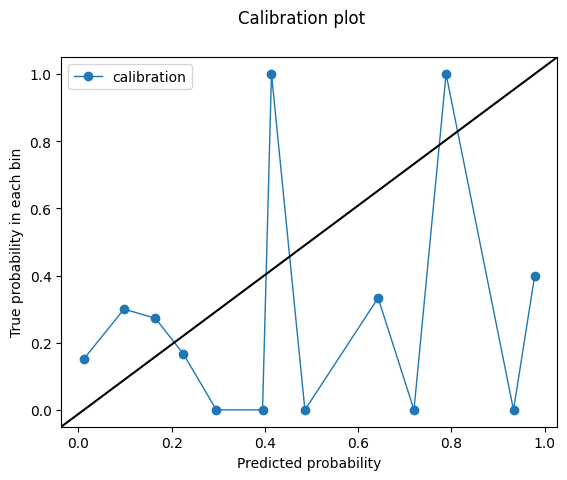

-4.3491807
validation set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.7205724370779619
Outcome probability: 0.16589861751152074
Average precision score: 0.28
Best F1: 0.4347826086956522


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


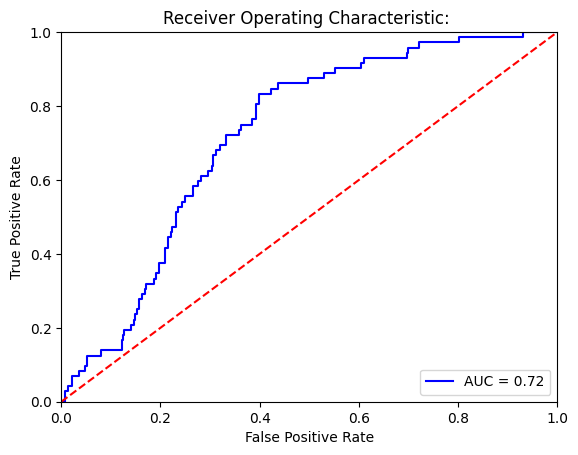

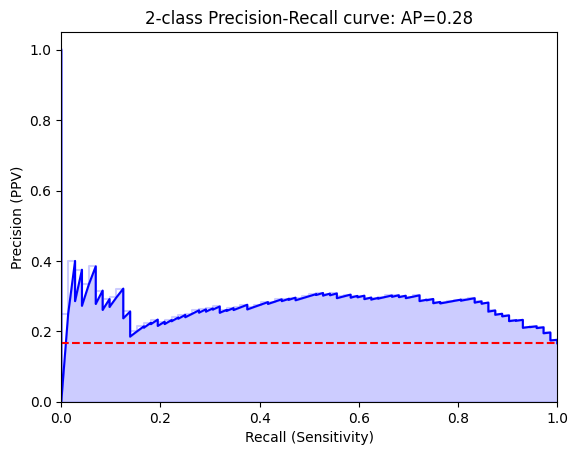

Threshold for best F1:
0.5236311
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[359   3]
 [ 72   0]]


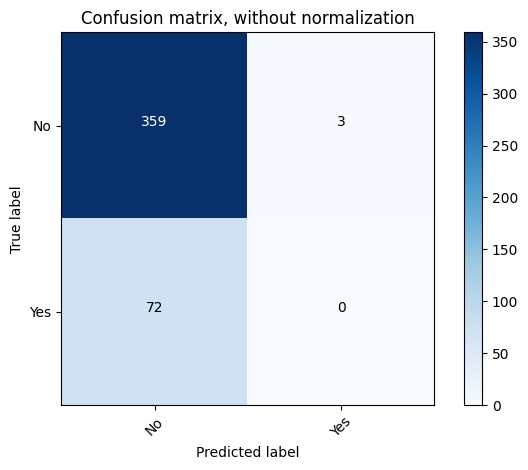

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.83      0.99      0.91       362
         Yes       0.00      0.00      0.00        72

    accuracy                           0.83       434
   macro avg       0.42      0.50      0.45       434
weighted avg       0.69      0.83      0.76       434

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[359   3]
 [ 70   2]]


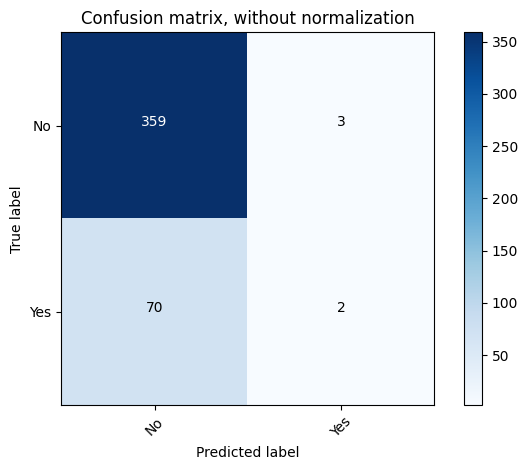

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      0.99      0.91       362
         Yes       0.40      0.03      0.05        72

    accuracy                           0.83       434
   macro avg       0.62      0.51      0.48       434
weighted avg       0.76      0.83      0.77       434



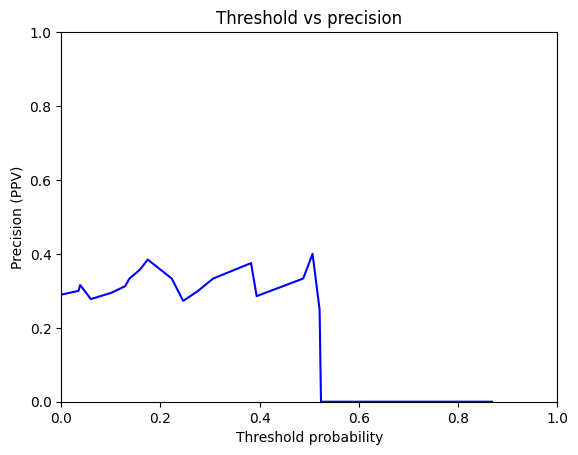

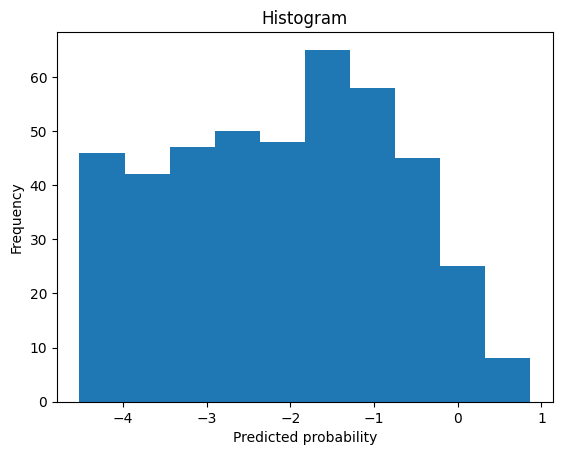

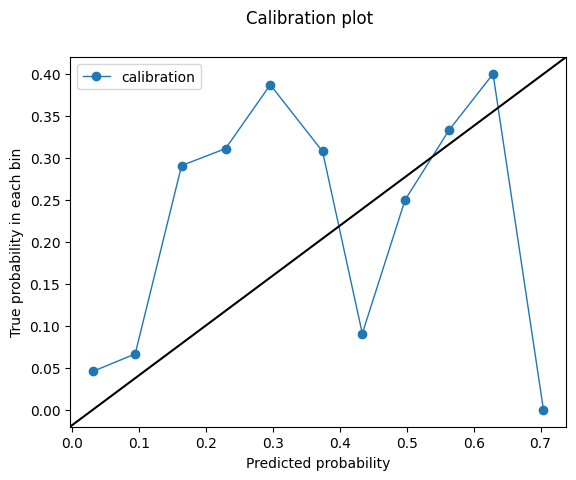

0.5236311
validation set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.8392943685179801
Outcome probability: 0.23949579831932774
Average precision score: 0.69
Best F1: 0.6829268292682926


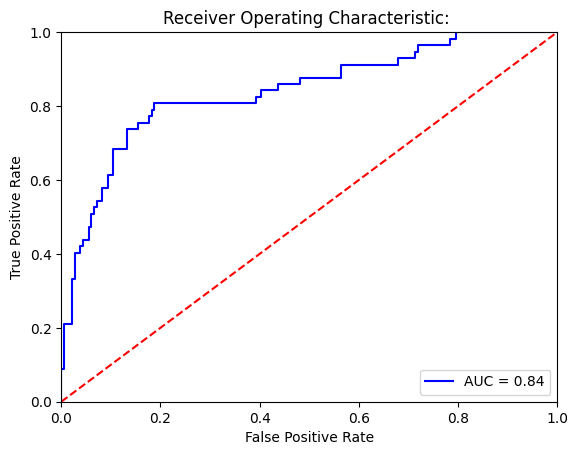

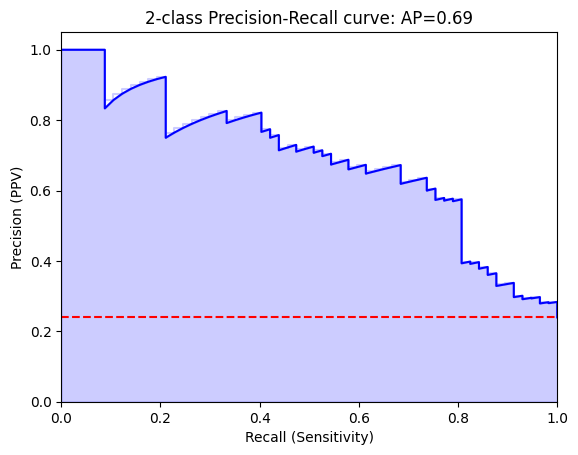

Threshold for best F1:
-0.69181335
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[157  24]
 [ 15  42]]


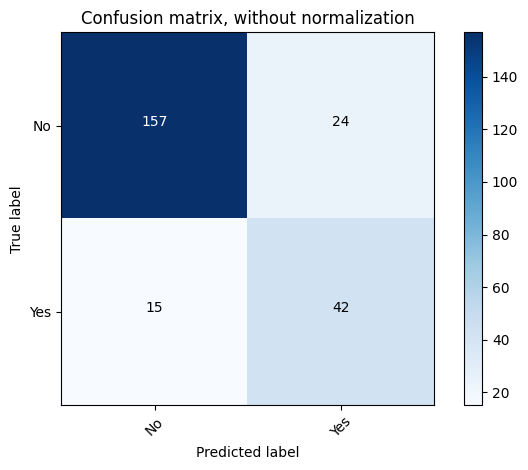

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.87      0.89       181
         Yes       0.64      0.74      0.68        57

    accuracy                           0.84       238
   macro avg       0.77      0.80      0.79       238
weighted avg       0.85      0.84      0.84       238

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[170  11]
 [ 30  27]]


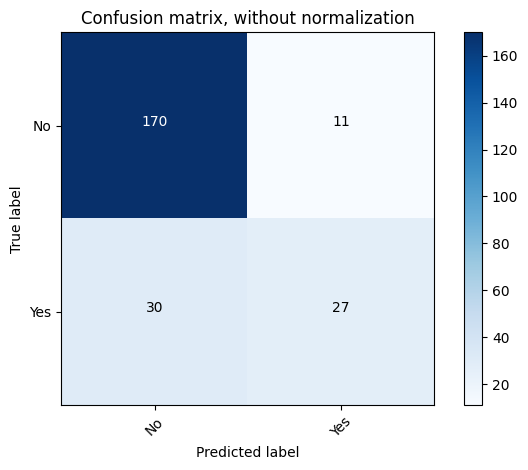

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.85      0.94      0.89       181
         Yes       0.71      0.47      0.57        57

    accuracy                           0.83       238
   macro avg       0.78      0.71      0.73       238
weighted avg       0.82      0.83      0.81       238



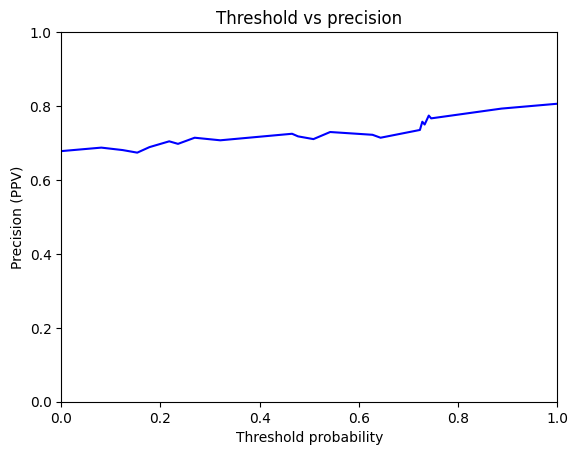

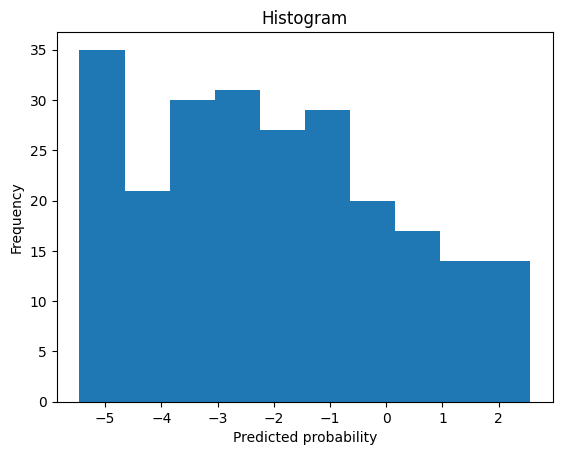

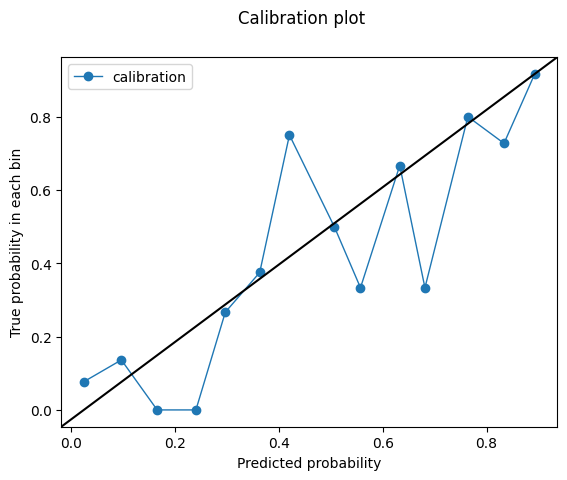

-0.69181335
validation set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.834060288843656
Outcome probability: 0.23949579831932774
Average precision score: 0.68
Best F1: 0.6842105263157895


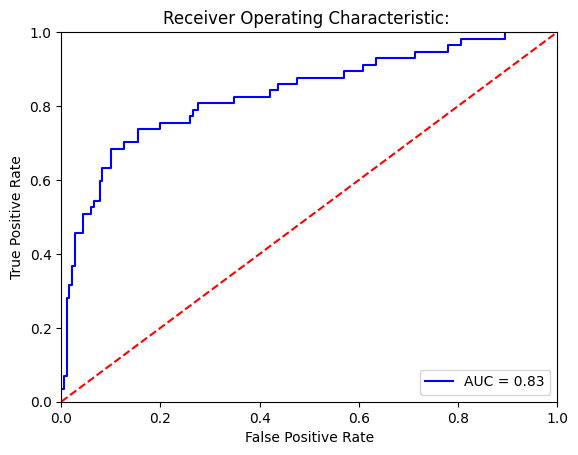

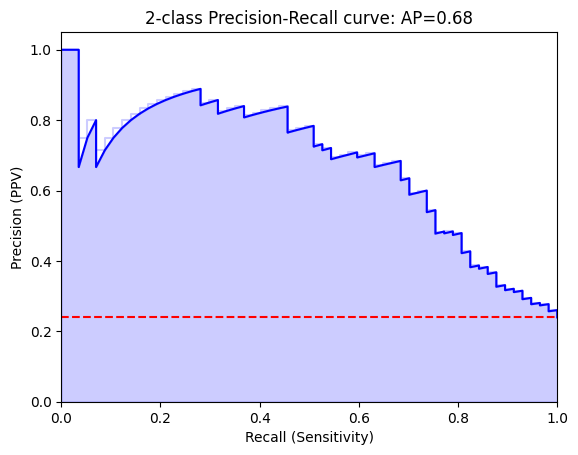

Threshold for best F1:
-0.09736738
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[163  18]
 [ 18  39]]


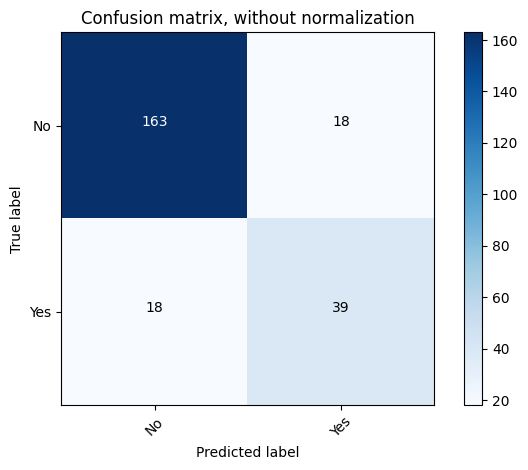

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.90      0.90       181
         Yes       0.68      0.68      0.68        57

    accuracy                           0.85       238
   macro avg       0.79      0.79      0.79       238
weighted avg       0.85      0.85      0.85       238

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[169  12]
 [ 27  30]]


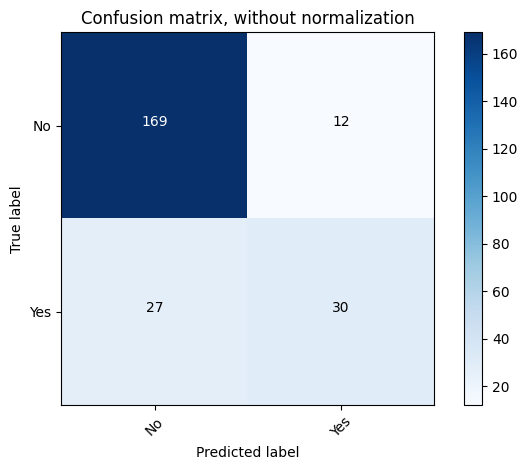

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.93      0.90       181
         Yes       0.71      0.53      0.61        57

    accuracy                           0.84       238
   macro avg       0.79      0.73      0.75       238
weighted avg       0.83      0.84      0.83       238



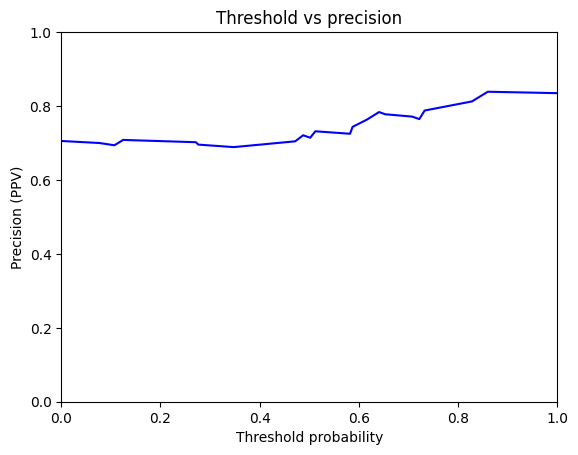

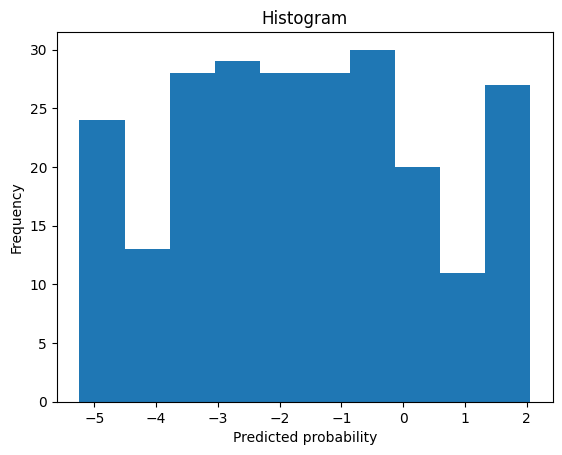

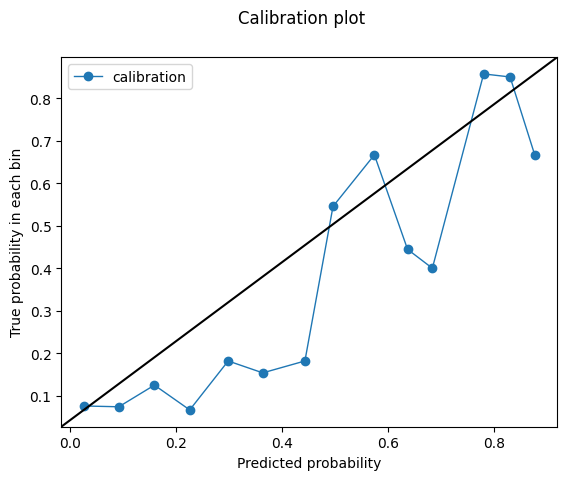

-0.09736738
validation set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.730832606377823
Outcome probability: 0.23949579831932774
Average precision score: 0.40
Best F1: 0.5333333333333333


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


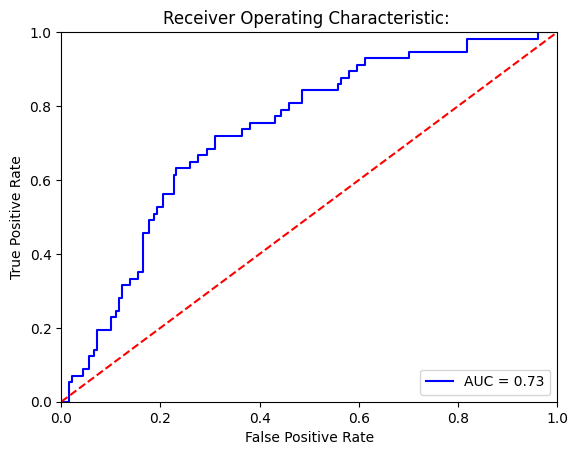

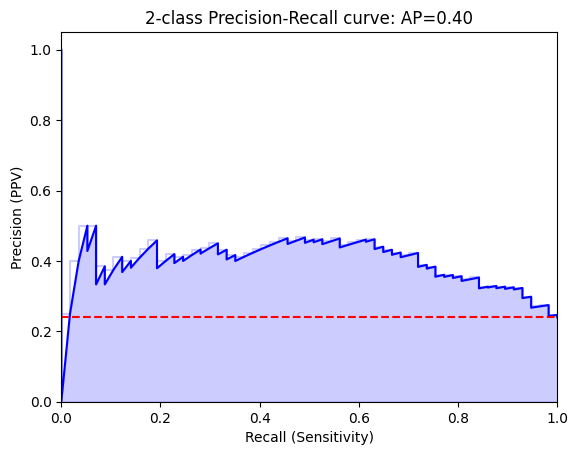

Threshold for best F1:
1.4862646
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[178   3]
 [ 57   0]]


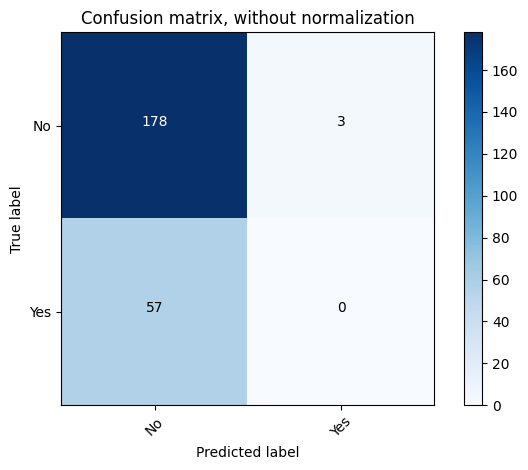

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.76      0.98      0.86       181
         Yes       0.00      0.00      0.00        57

    accuracy                           0.75       238
   macro avg       0.38      0.49      0.43       238
weighted avg       0.58      0.75      0.65       238

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[168  13]
 [ 48   9]]


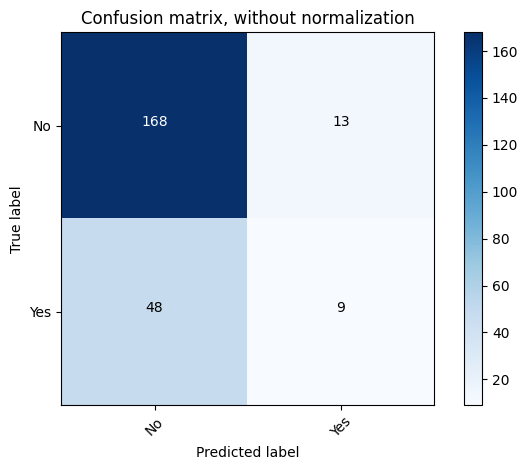

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.78      0.93      0.85       181
         Yes       0.41      0.16      0.23        57

    accuracy                           0.74       238
   macro avg       0.59      0.54      0.54       238
weighted avg       0.69      0.74      0.70       238



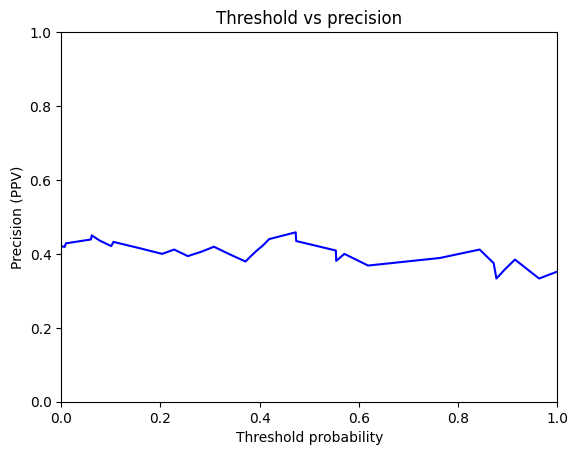

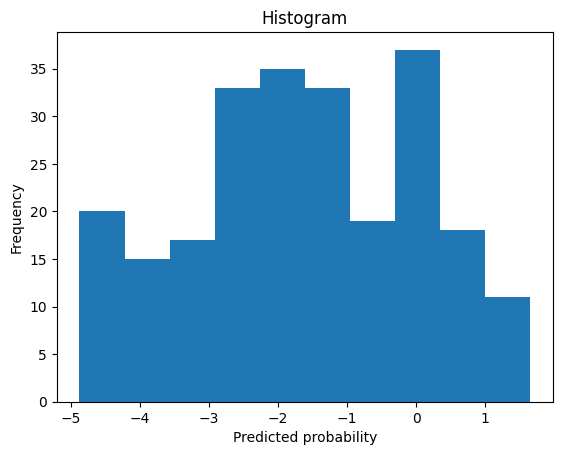

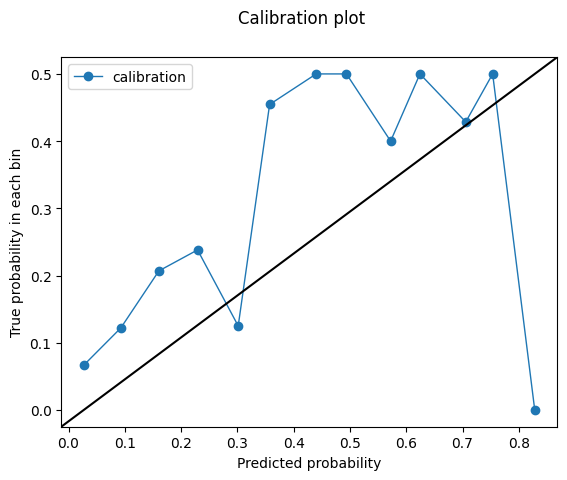

1.4862646
validation set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.6143258699234274
Outcome probability: 0.23949579831932774
Average precision score: 0.33
Best F1: 0.42424242424242425


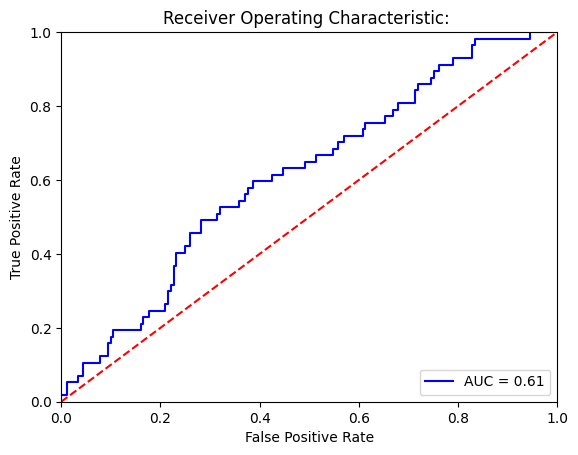

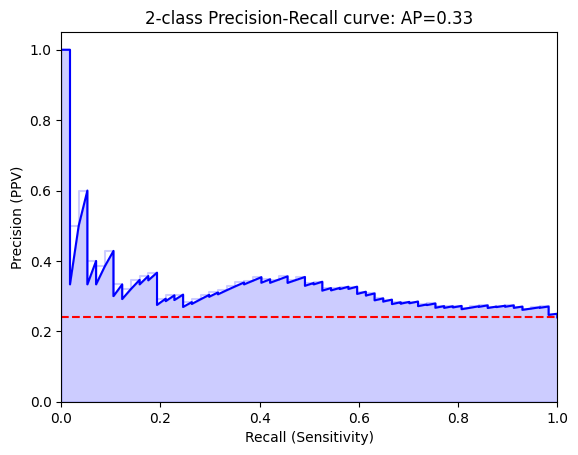

Threshold for best F1:
-5.542503
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[ 30 151]
 [  1  56]]


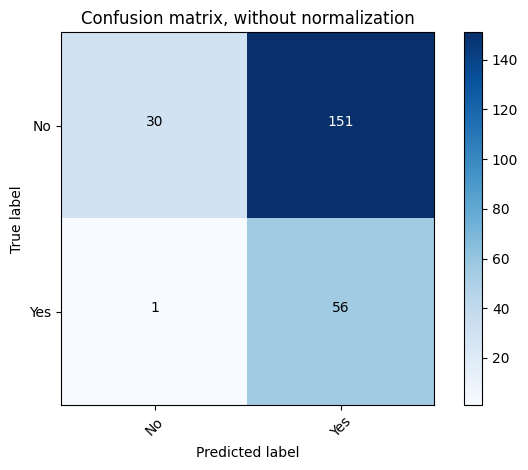

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.97      0.17      0.28       181
         Yes       0.27      0.98      0.42        57

    accuracy                           0.36       238
   macro avg       0.62      0.57      0.35       238
weighted avg       0.80      0.36      0.32       238

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[173   8]
 [ 53   4]]


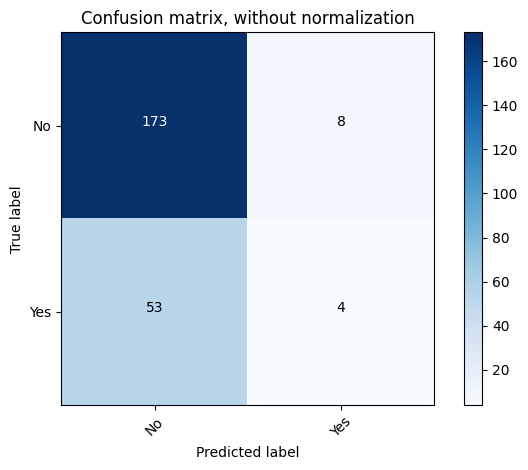

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.77      0.96      0.85       181
         Yes       0.33      0.07      0.12        57

    accuracy                           0.74       238
   macro avg       0.55      0.51      0.48       238
weighted avg       0.66      0.74      0.67       238



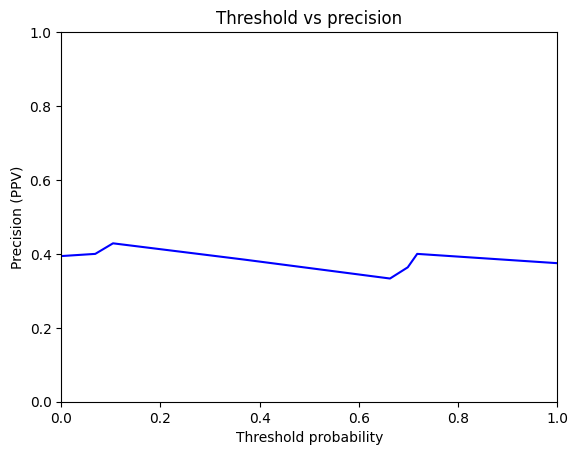

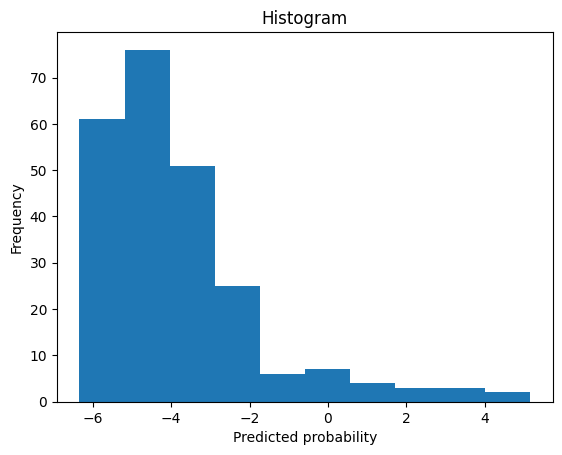

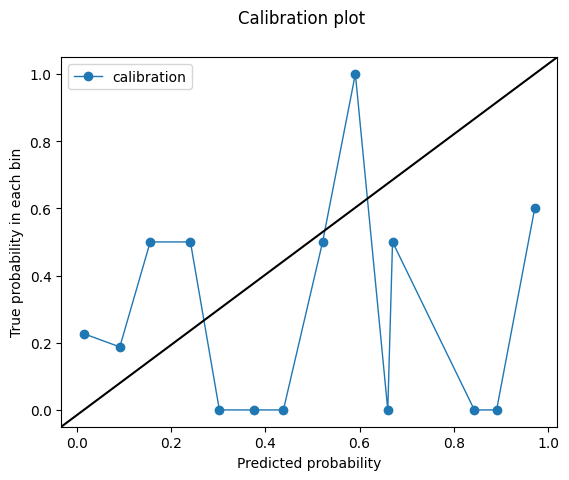

-5.542503
validation set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.7776485412426092
Outcome probability: 0.23949579831932774
Average precision score: 0.54
Best F1: 0.5641025641025641


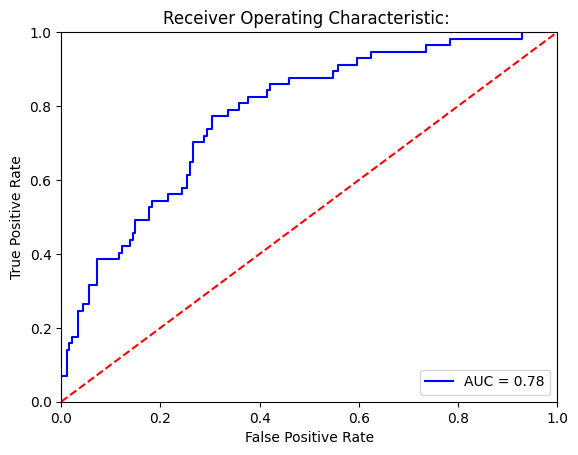

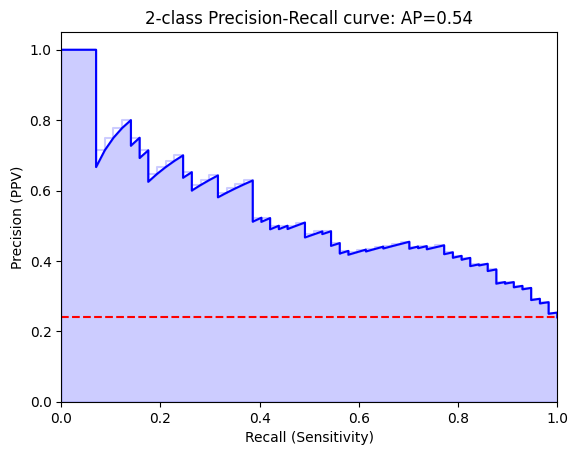

Threshold for best F1:
-1.5440503
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[126  55]
 [ 13  44]]


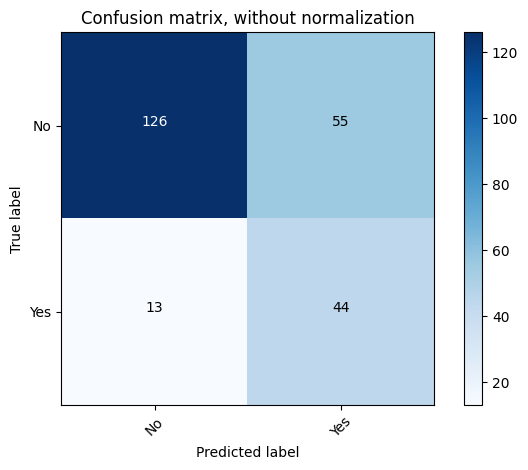

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.70      0.79       181
         Yes       0.44      0.77      0.56        57

    accuracy                           0.71       238
   macro avg       0.68      0.73      0.68       238
weighted avg       0.80      0.71      0.73       238

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[179   2]
 [ 53   4]]


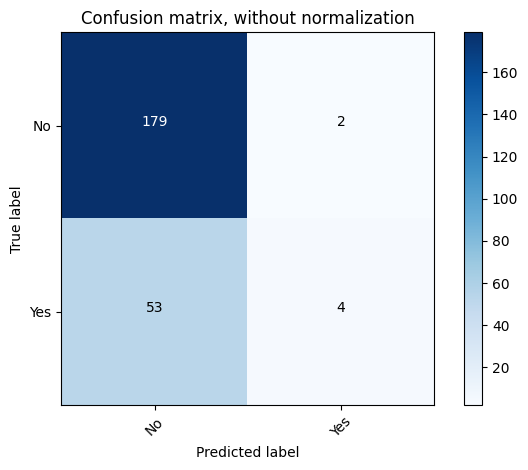

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.77      0.99      0.87       181
         Yes       0.67      0.07      0.13        57

    accuracy                           0.77       238
   macro avg       0.72      0.53      0.50       238
weighted avg       0.75      0.77      0.69       238



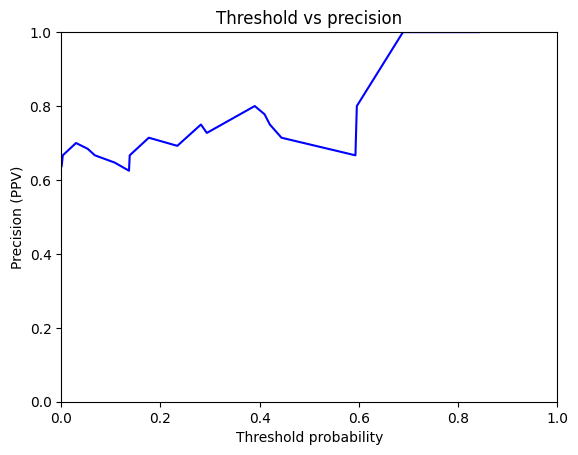

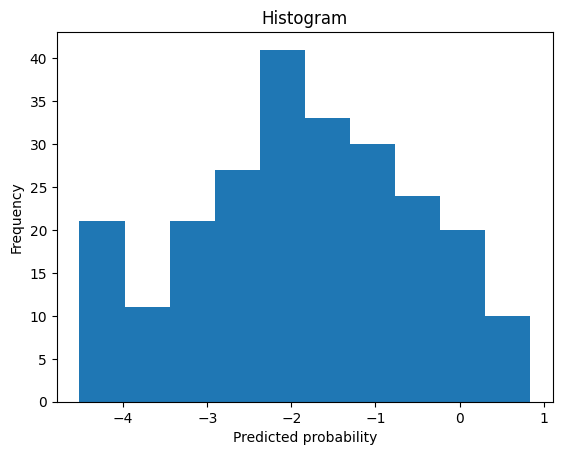

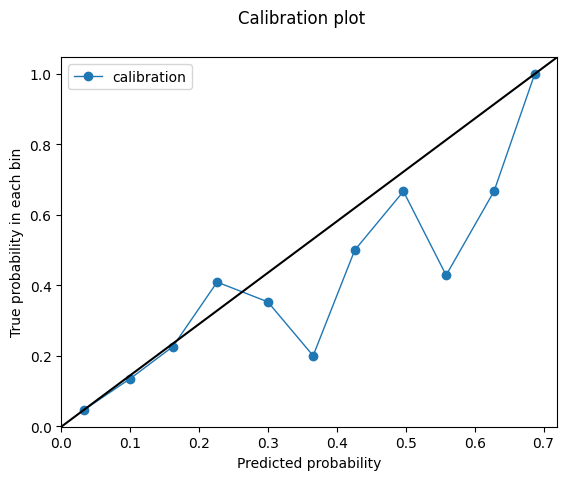

-1.5440503
validation set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.848322460391426
Outcome probability: 0.4393939393939394
Average precision score: 0.82
Best F1: 0.7533333333333332


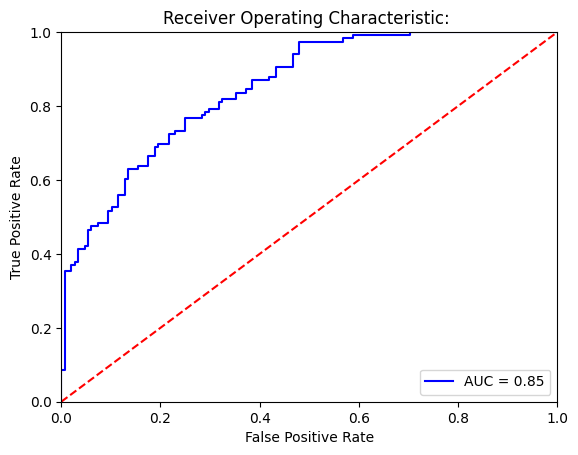

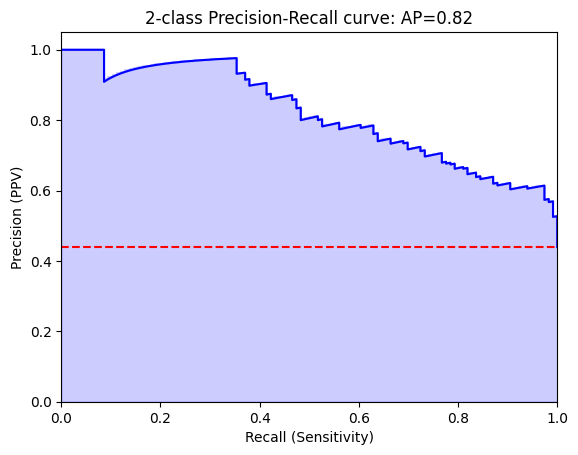

Threshold for best F1:
-2.6283479
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[ 77  71]
 [  3 113]]


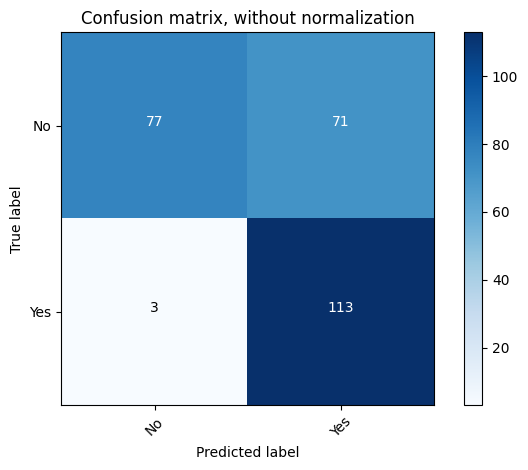

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.96      0.52      0.68       148
         Yes       0.61      0.97      0.75       116

    accuracy                           0.72       264
   macro avg       0.79      0.75      0.71       264
weighted avg       0.81      0.72      0.71       264

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[140   8]
 [ 62  54]]


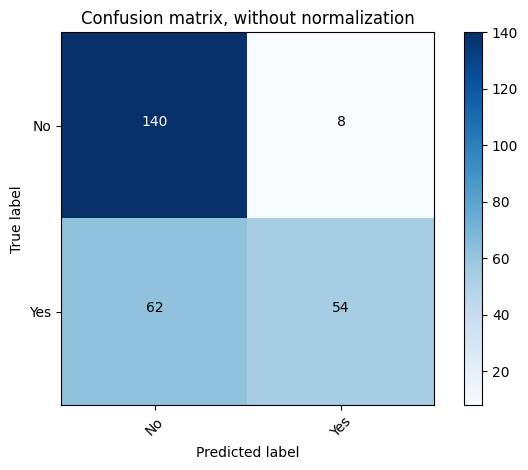

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.69      0.95      0.80       148
         Yes       0.87      0.47      0.61       116

    accuracy                           0.73       264
   macro avg       0.78      0.71      0.70       264
weighted avg       0.77      0.73      0.72       264



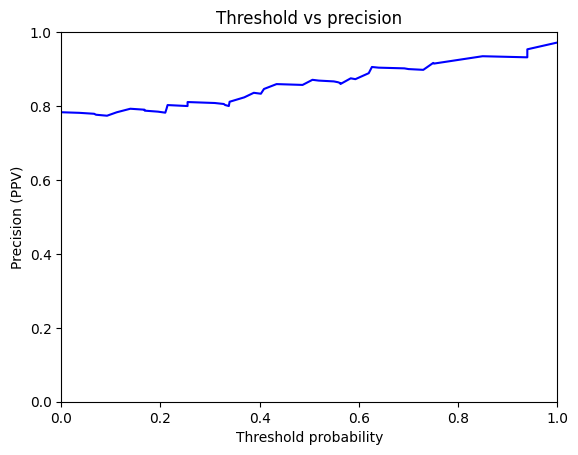

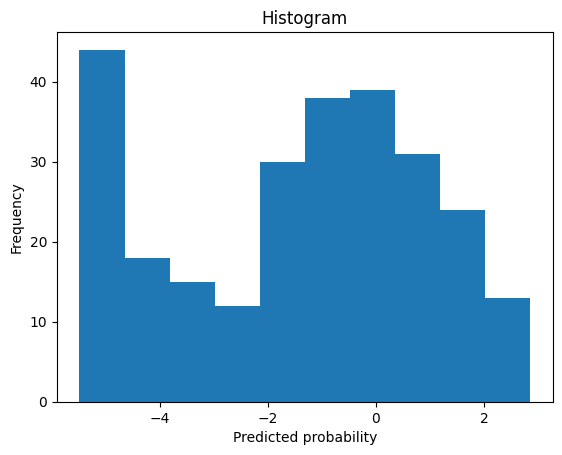

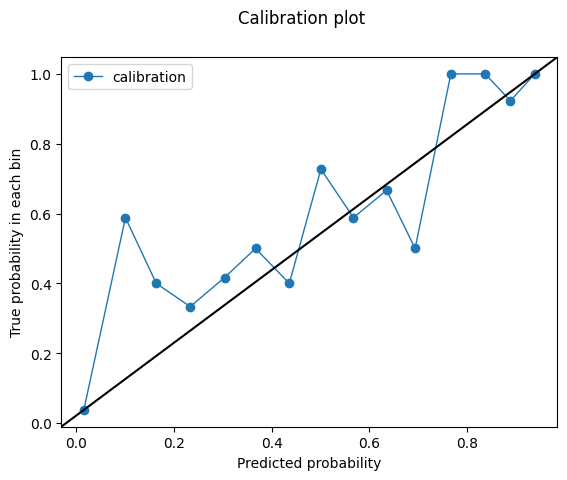

-2.6283479
validation set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.8292753960857409
Outcome probability: 0.4393939393939394
Average precision score: 0.77
Best F1: 0.7602739726027398


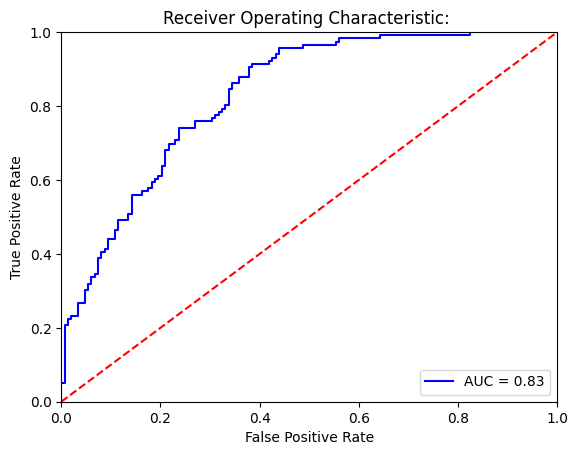

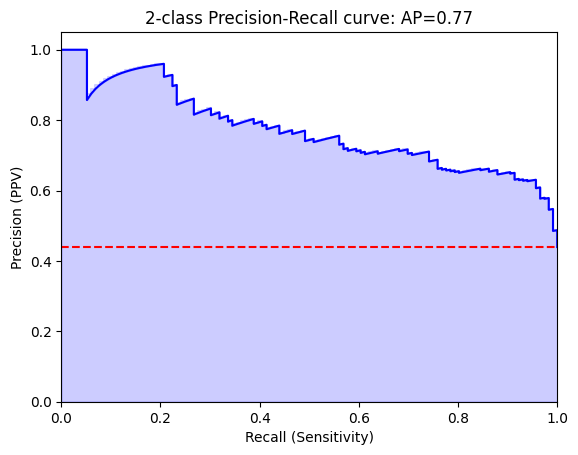

Threshold for best F1:
-1.4675981
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[ 83  65]
 [  5 111]]


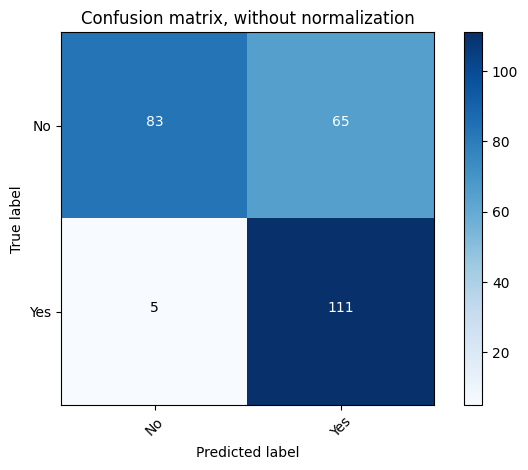

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.94      0.56      0.70       148
         Yes       0.63      0.96      0.76       116

    accuracy                           0.73       264
   macro avg       0.79      0.76      0.73       264
weighted avg       0.81      0.73      0.73       264

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[136  12]
 [ 71  45]]


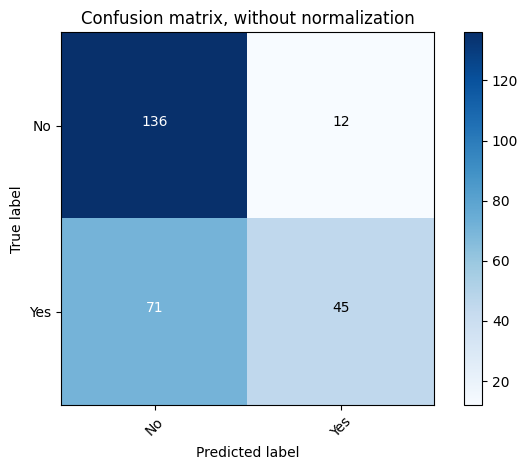

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.66      0.92      0.77       148
         Yes       0.79      0.39      0.52       116

    accuracy                           0.69       264
   macro avg       0.72      0.65      0.64       264
weighted avg       0.72      0.69      0.66       264



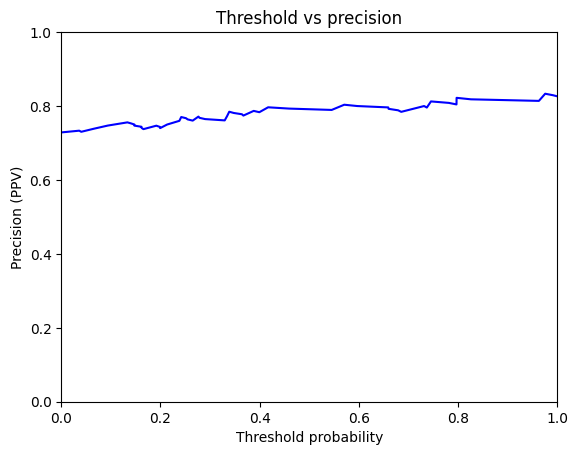

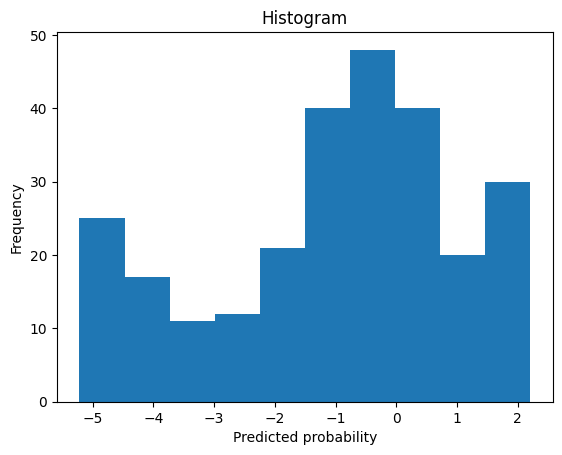

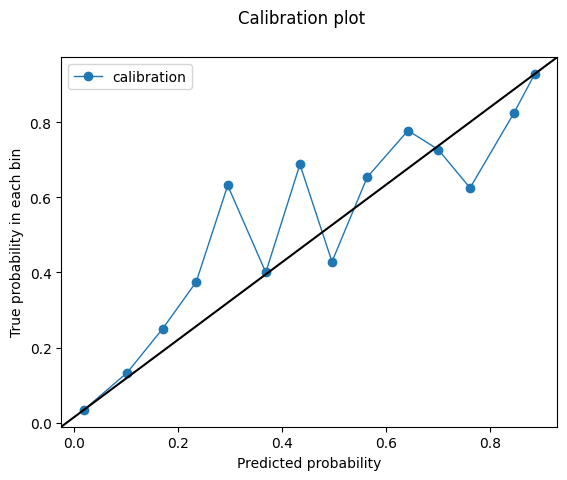

-1.4675981
validation set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.7843662628145387
Outcome probability: 0.4393939393939394
Average precision score: 0.75
Best F1: 0.7066246056782334


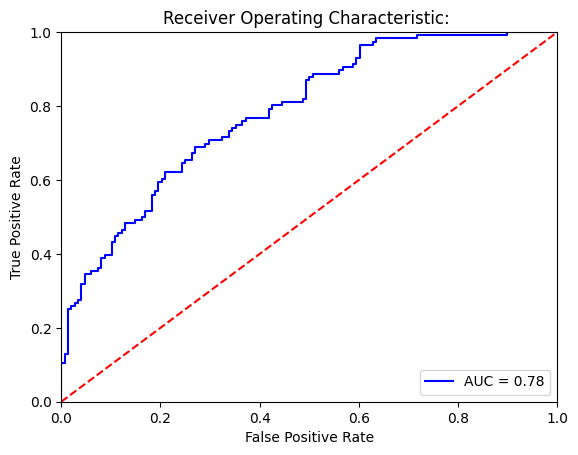

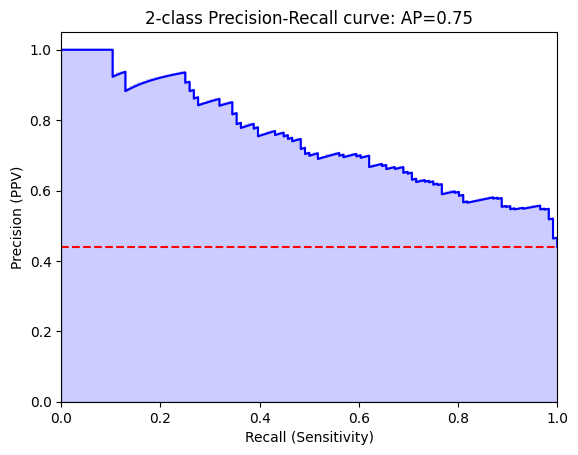

Threshold for best F1:
-2.471809
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[ 59  89]
 [  4 112]]


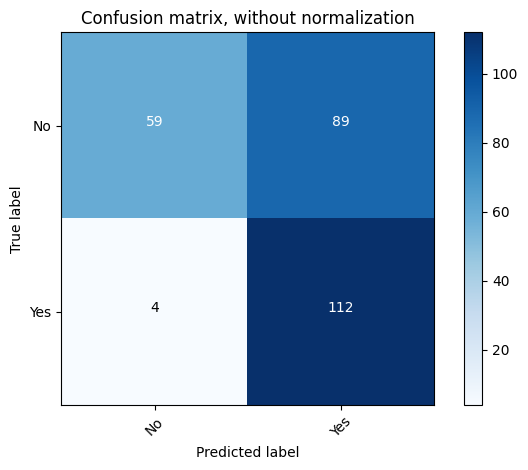

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.94      0.40      0.56       148
         Yes       0.56      0.97      0.71       116

    accuracy                           0.65       264
   macro avg       0.75      0.68      0.63       264
weighted avg       0.77      0.65      0.62       264

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[141   7]
 [ 77  39]]


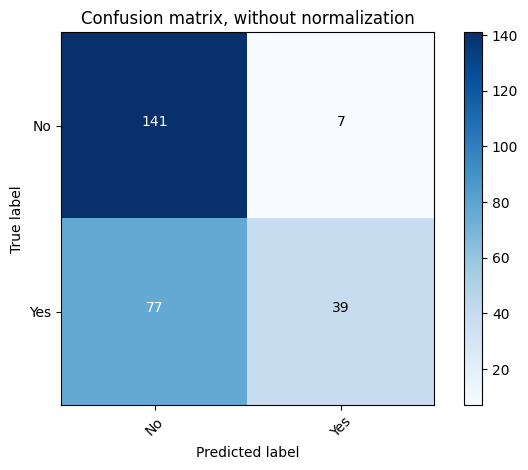

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.65      0.95      0.77       148
         Yes       0.85      0.34      0.48       116

    accuracy                           0.68       264
   macro avg       0.75      0.64      0.63       264
weighted avg       0.74      0.68      0.64       264



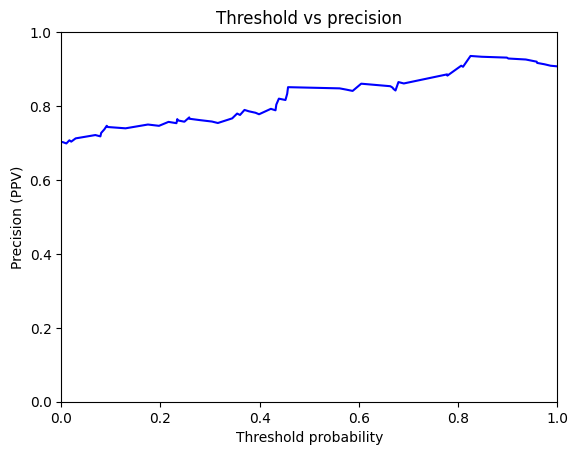

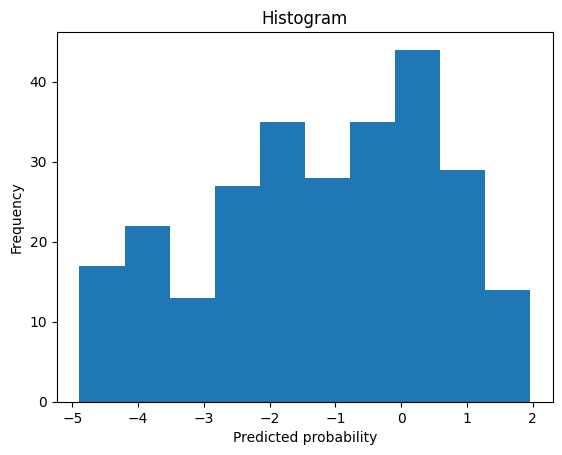

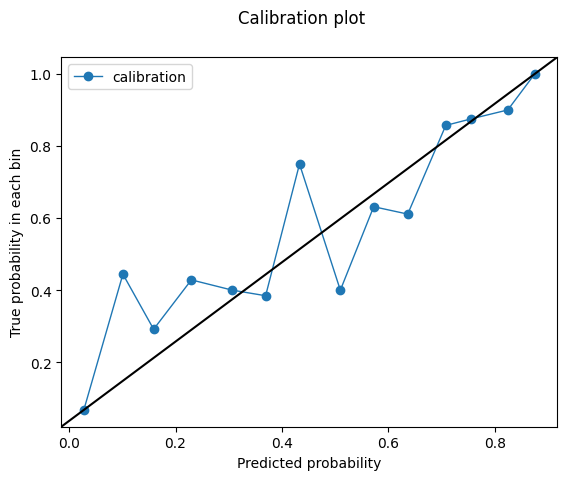

-2.471809
validation set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.6679869524697111
Outcome probability: 0.4393939393939394
Average precision score: 0.53
Best F1: 0.6827794561933535


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


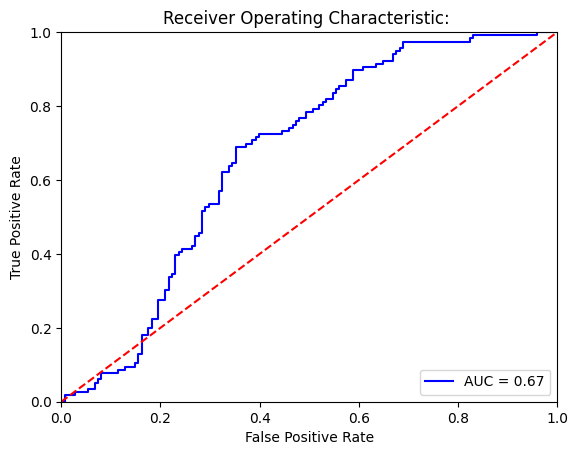

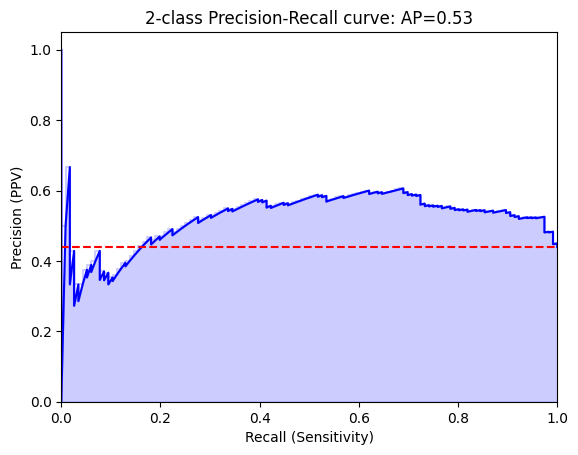

Threshold for best F1:
6.481455
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[147   1]
 [116   0]]


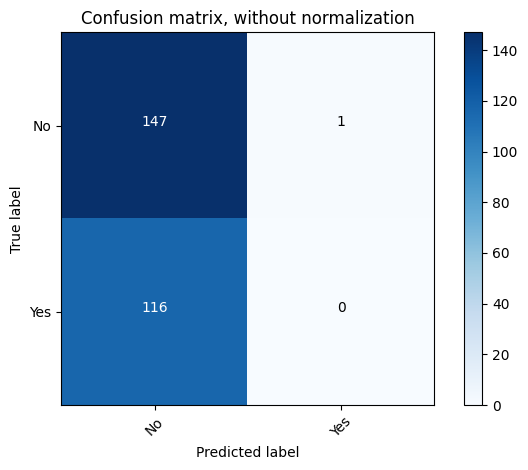

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.56      0.99      0.72       148
         Yes       0.00      0.00      0.00       116

    accuracy                           0.56       264
   macro avg       0.28      0.50      0.36       264
weighted avg       0.31      0.56      0.40       264

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[142   6]
 [113   3]]


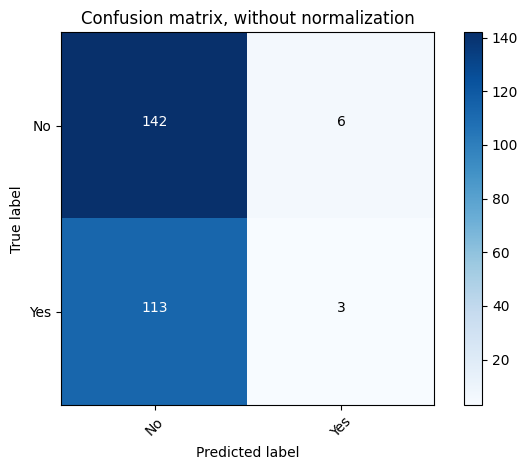

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.56      0.96      0.70       148
         Yes       0.33      0.03      0.05       116

    accuracy                           0.55       264
   macro avg       0.45      0.49      0.38       264
weighted avg       0.46      0.55      0.42       264



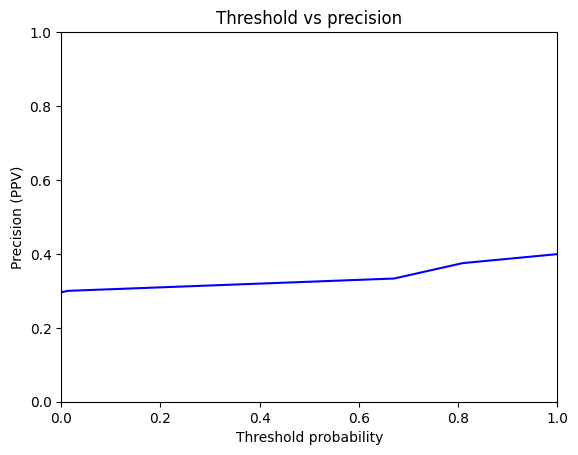

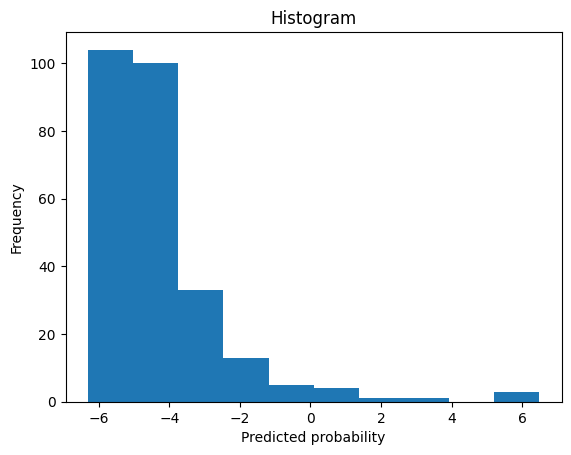

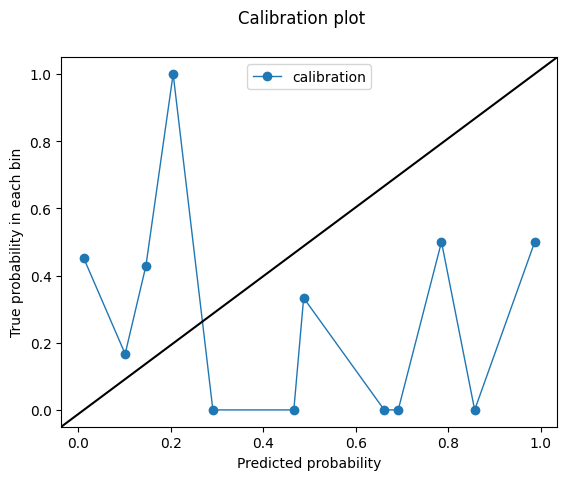

6.481455
validation set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.8459925442684064
Outcome probability: 0.4393939393939394
Average precision score: 0.79
Best F1: 0.7626459143968871


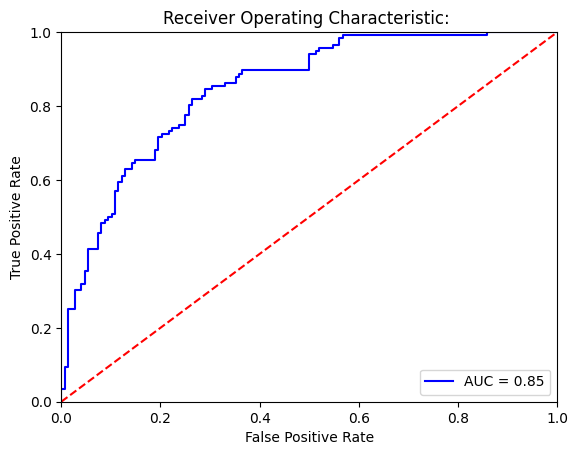

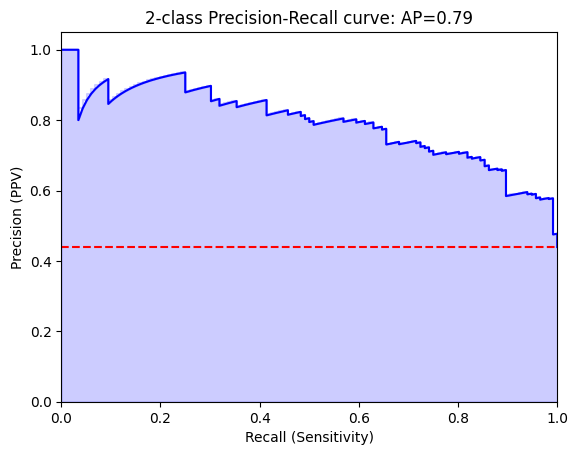

Threshold for best F1:
-1.6581066
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[105  43]
 [ 18  98]]


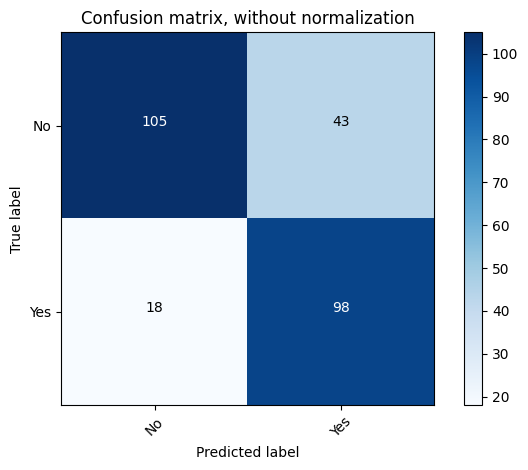

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.85      0.71      0.77       148
         Yes       0.70      0.84      0.76       116

    accuracy                           0.77       264
   macro avg       0.77      0.78      0.77       264
weighted avg       0.78      0.77      0.77       264

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[146   2]
 [105  11]]


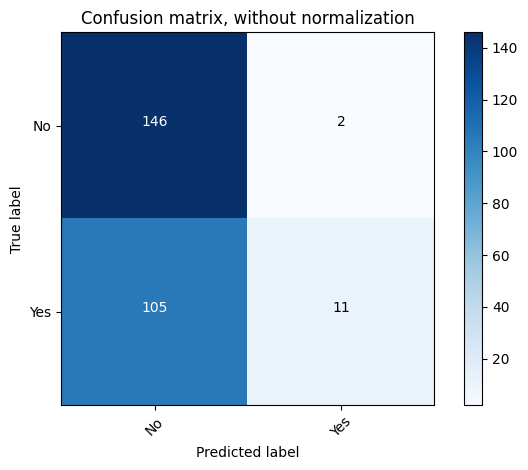

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.58      0.99      0.73       148
         Yes       0.85      0.09      0.17       116

    accuracy                           0.59       264
   macro avg       0.71      0.54      0.45       264
weighted avg       0.70      0.59      0.49       264



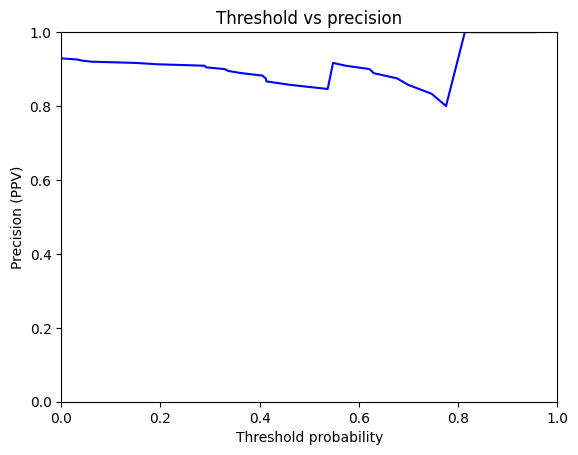

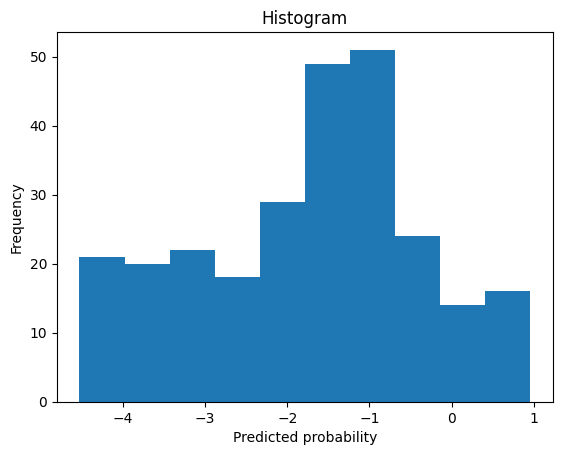

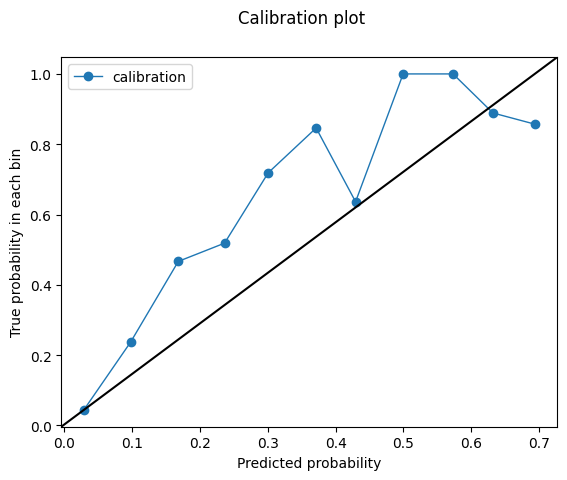

-1.6581066
validation set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.9451923076923077
Outcome probability: 0.9420289855072463
Average precision score: 1.00
Best F1: 0.9811320754716981


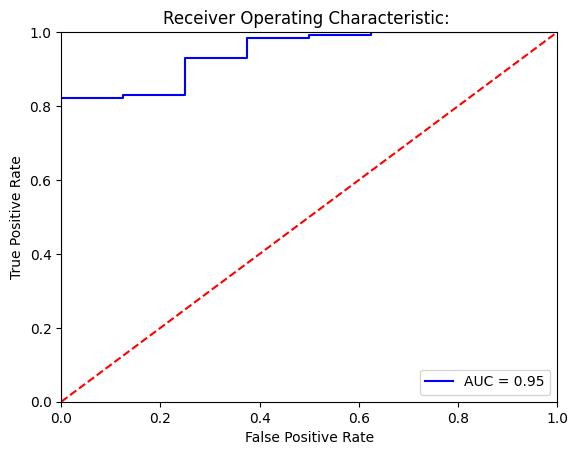

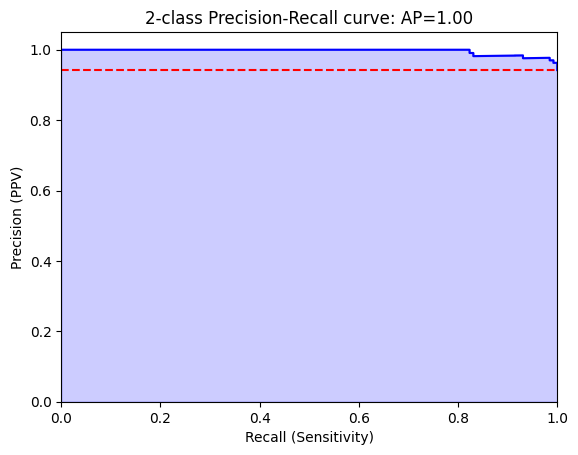

Threshold for best F1:
-0.8845551
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[  3   5]
 [  0 130]]


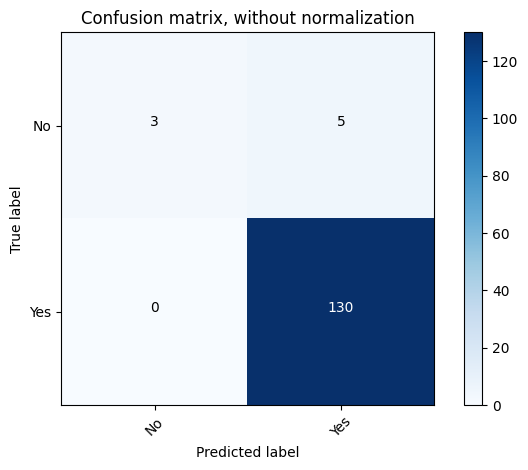

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       1.00      0.38      0.55         8
         Yes       0.96      1.00      0.98       130

    accuracy                           0.96       138
   macro avg       0.98      0.69      0.76       138
weighted avg       0.97      0.96      0.96       138

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[  5   3]
 [  7 123]]


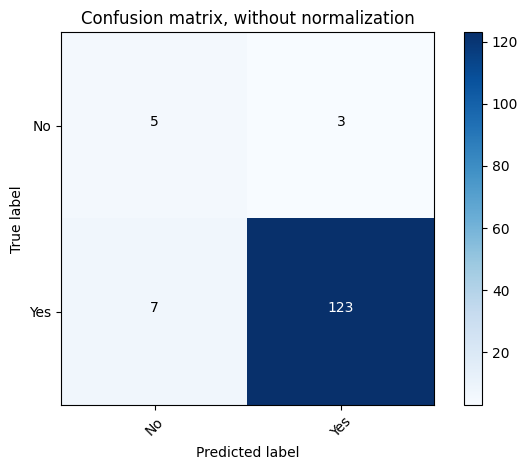

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.42      0.62      0.50         8
         Yes       0.98      0.95      0.96       130

    accuracy                           0.93       138
   macro avg       0.70      0.79      0.73       138
weighted avg       0.94      0.93      0.93       138



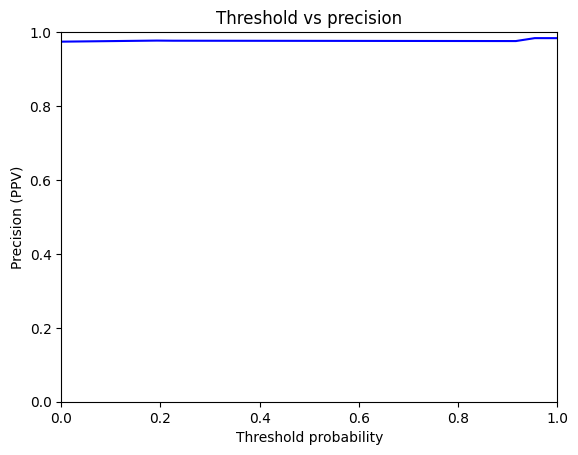

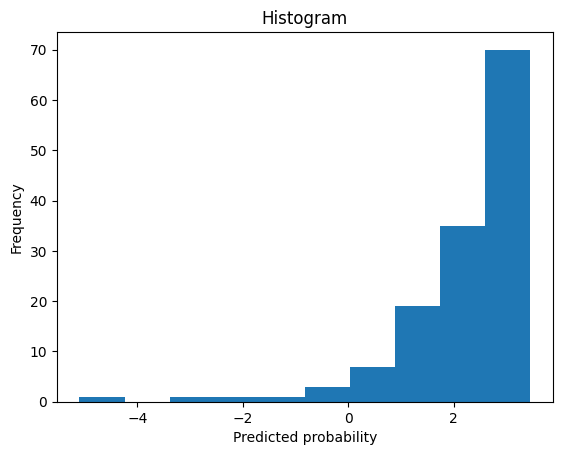

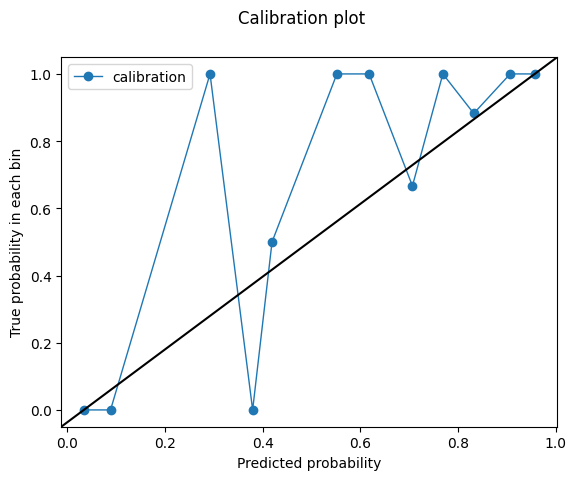

-0.8845551
validation set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.8432692307692308
Outcome probability: 0.9420289855072463
Average precision score: 0.99
Best F1: 0.9848484848484849


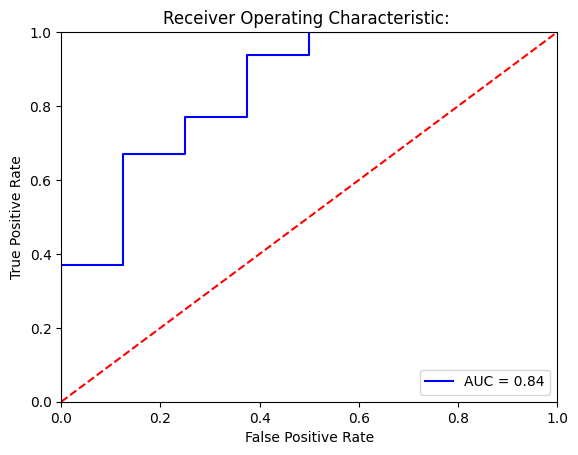

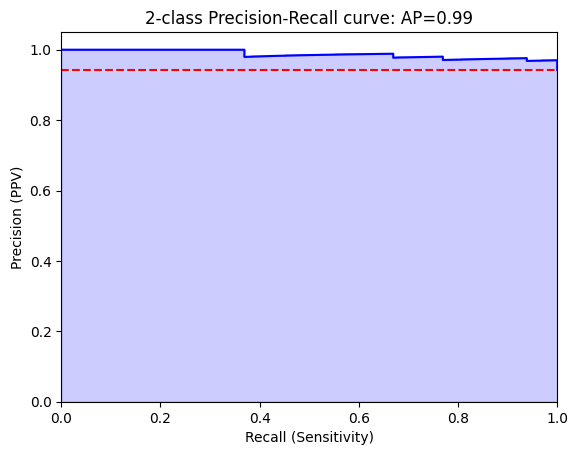

Threshold for best F1:
-0.055559386
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[  4   4]
 [  0 130]]


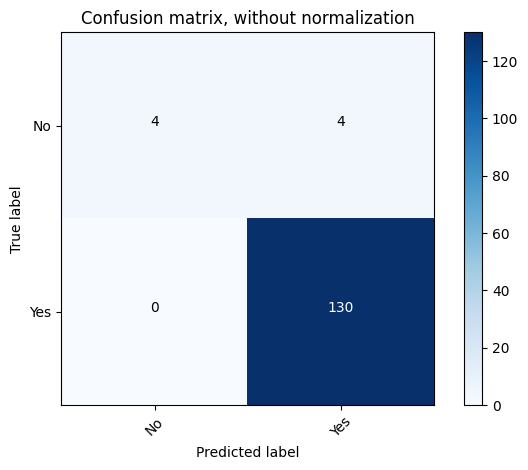

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       1.00      0.50      0.67         8
         Yes       0.97      1.00      0.98       130

    accuracy                           0.97       138
   macro avg       0.99      0.75      0.83       138
weighted avg       0.97      0.97      0.97       138

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[  4   4]
 [  6 124]]


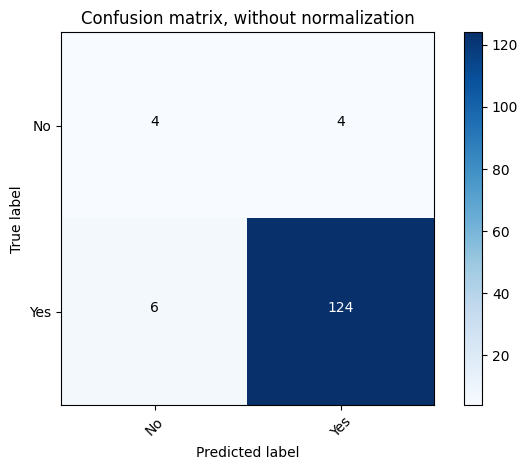

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.40      0.50      0.44         8
         Yes       0.97      0.95      0.96       130

    accuracy                           0.93       138
   macro avg       0.68      0.73      0.70       138
weighted avg       0.94      0.93      0.93       138



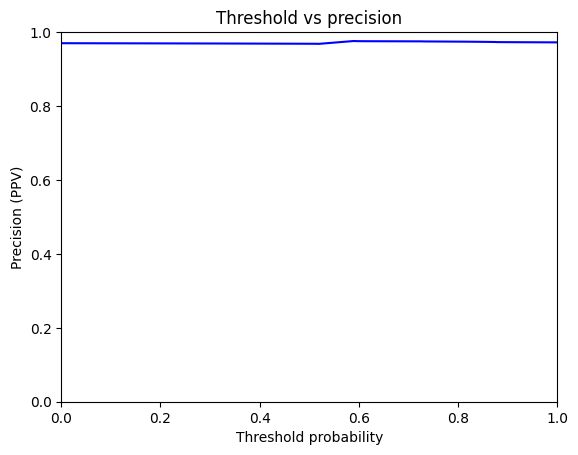

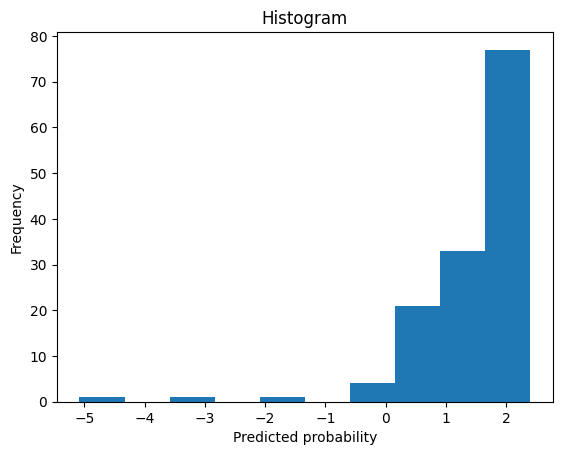

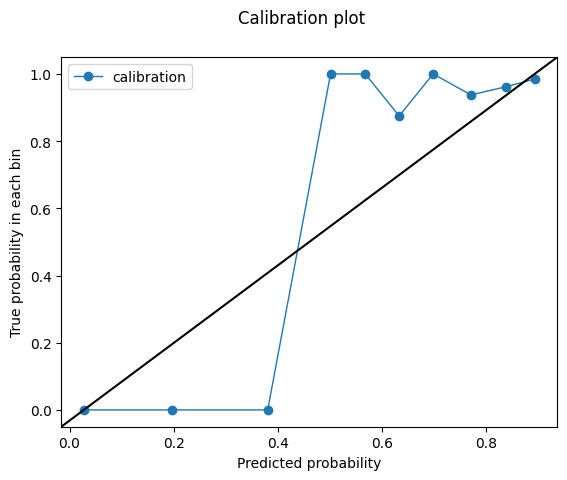

-0.055559386
validation set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.8240384615384615
Outcome probability: 0.9420289855072463
Average precision score: 0.99
Best F1: 0.9811320754716981


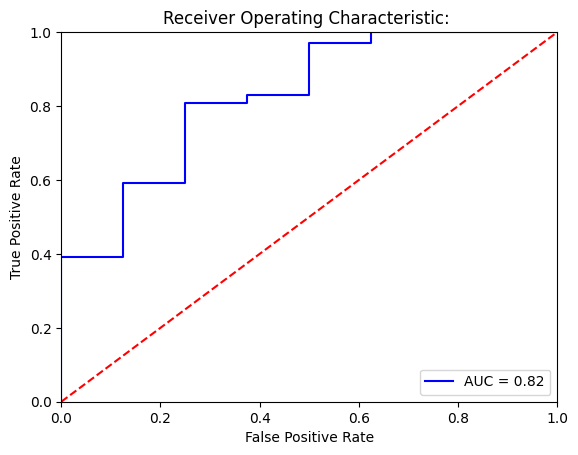

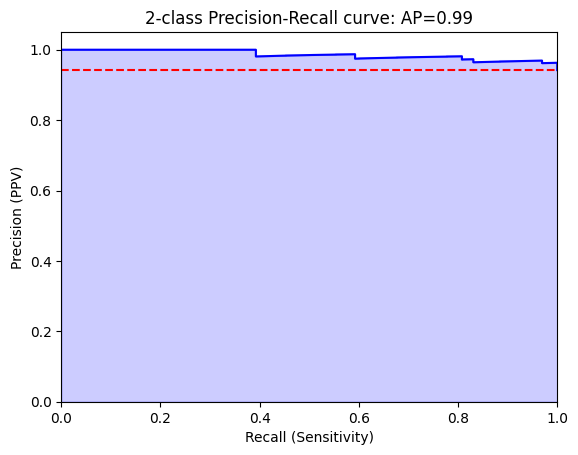

Threshold for best F1:
-2.172965
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[  3   5]
 [  0 130]]


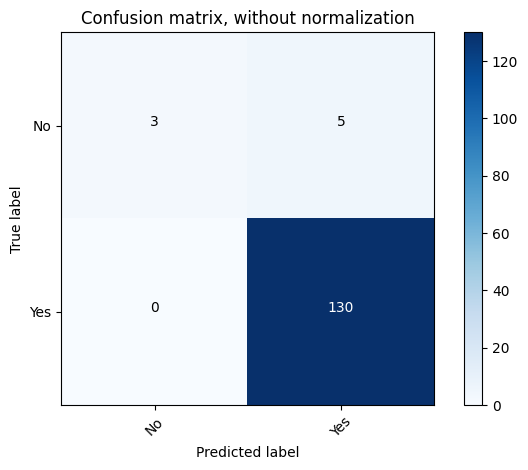

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       1.00      0.38      0.55         8
         Yes       0.96      1.00      0.98       130

    accuracy                           0.96       138
   macro avg       0.98      0.69      0.76       138
weighted avg       0.97      0.96      0.96       138

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[ 6  2]
 [53 77]]


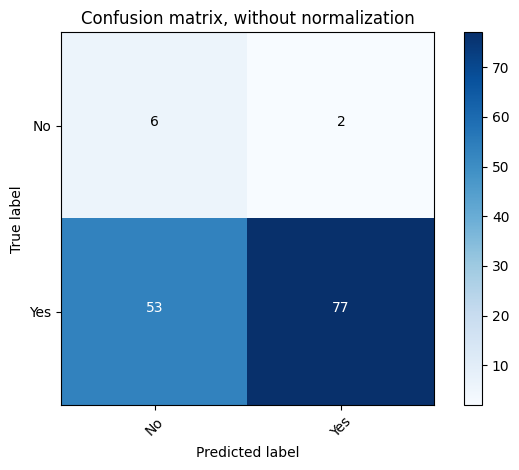

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.10      0.75      0.18         8
         Yes       0.97      0.59      0.74       130

    accuracy                           0.60       138
   macro avg       0.54      0.67      0.46       138
weighted avg       0.92      0.60      0.70       138



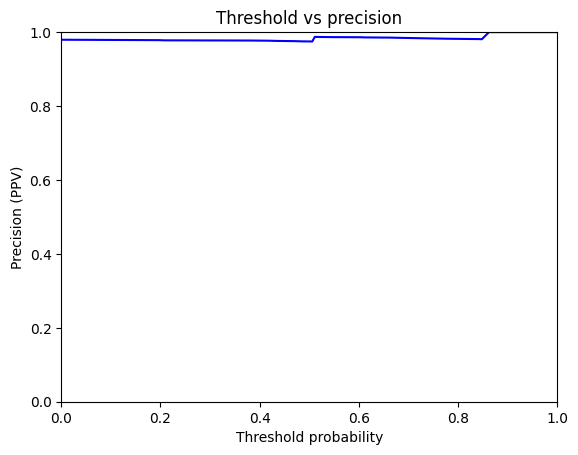

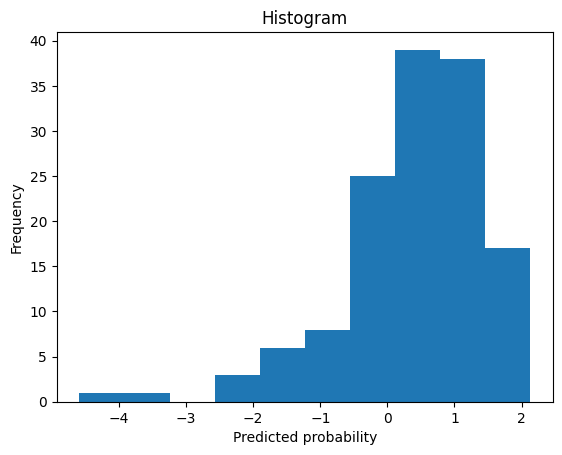

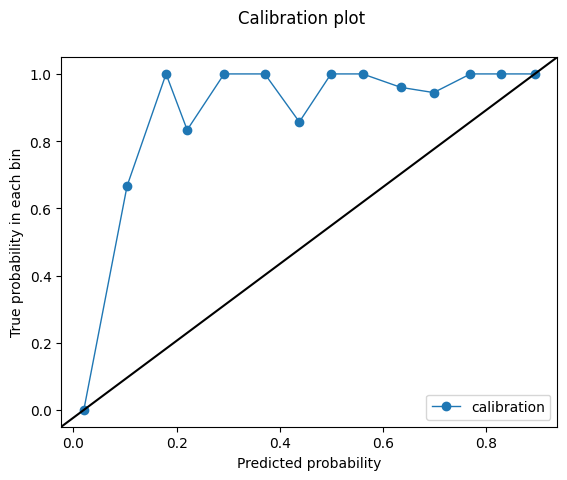

-2.172965
validation set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.5836538461538461
Outcome probability: 0.9420289855072463
Average precision score: 0.96
Best F1: 0.9701492537313433


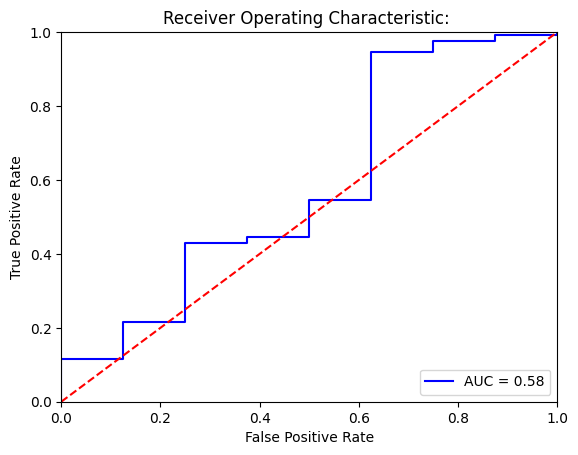

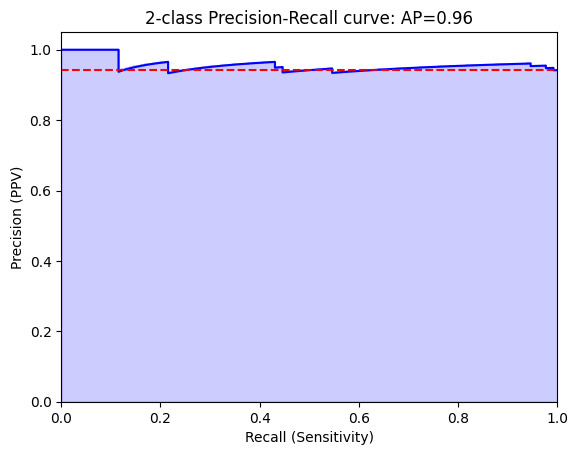

Threshold for best F1:
-6.24521
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[  0   8]
 [  0 130]]


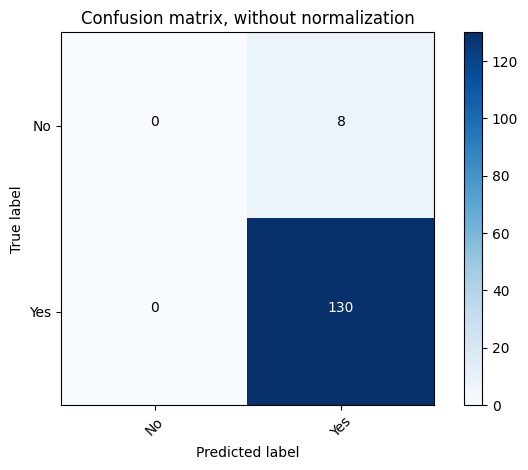

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.00      0.00      0.00         8
         Yes       0.94      1.00      0.97       130

    accuracy                           0.94       138
   macro avg       0.47      0.50      0.49       138
weighted avg       0.89      0.94      0.91       138

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[  8   0]
 [127   3]]


/homes10/klkehl/miniconda3/envs/vllm2/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/homes10/klkehl/miniconda3/envs/vllm2/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/homes10/klkehl/miniconda3/envs/vllm2/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.

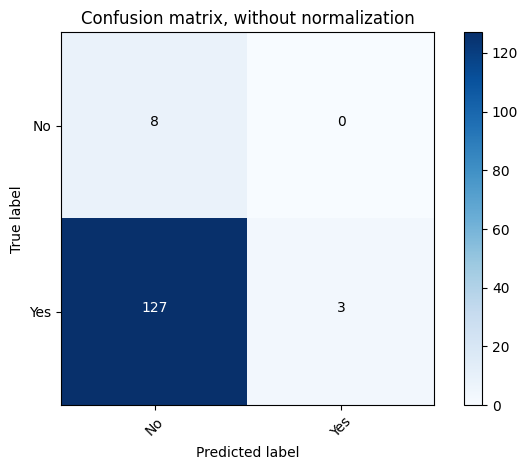

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.06      1.00      0.11         8
         Yes       1.00      0.02      0.05       130

    accuracy                           0.08       138
   macro avg       0.53      0.51      0.08       138
weighted avg       0.95      0.08      0.05       138



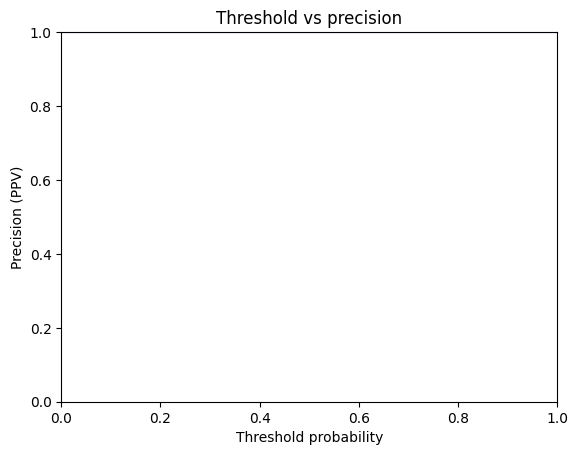

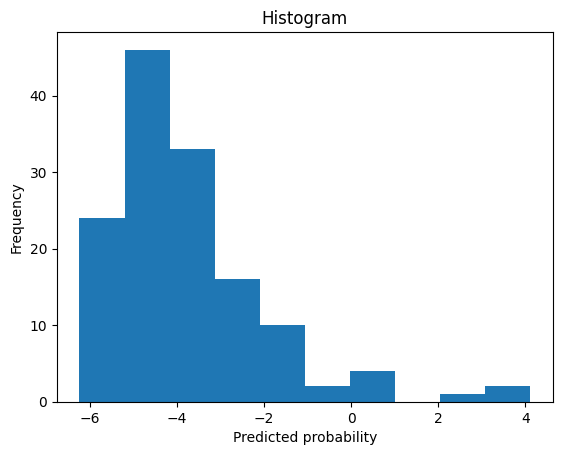

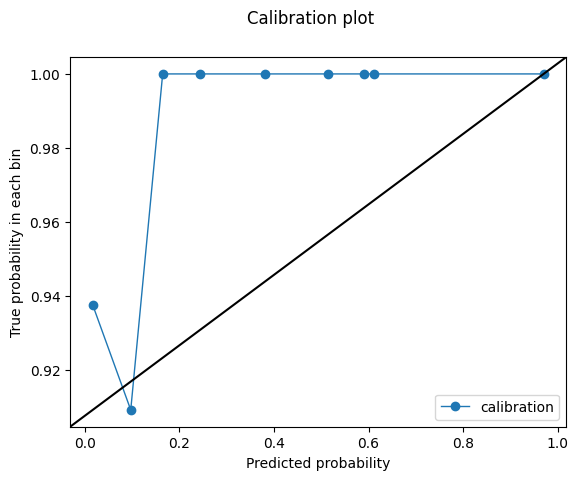

-6.24521
validation set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.8701923076923077
Outcome probability: 0.9420289855072463
Average precision score: 0.99
Best F1: 0.9848484848484849


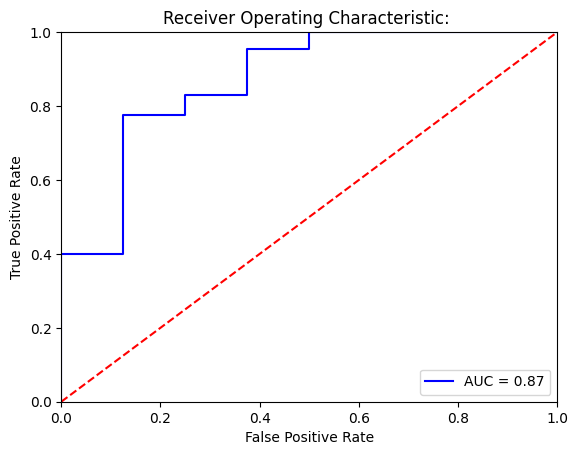

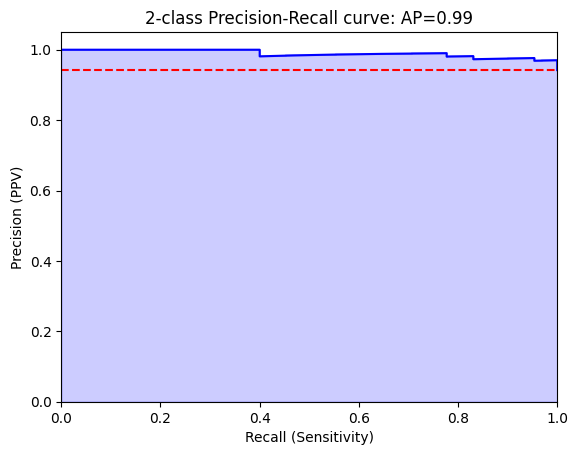

Threshold for best F1:
-1.3045914
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[  4   4]
 [  0 130]]


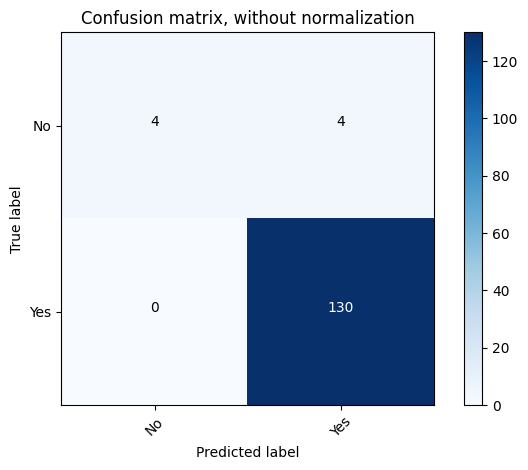

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       1.00      0.50      0.67         8
         Yes       0.97      1.00      0.98       130

    accuracy                           0.97       138
   macro avg       0.99      0.75      0.83       138
weighted avg       0.97      0.97      0.97       138

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[ 7  1]
 [74 56]]


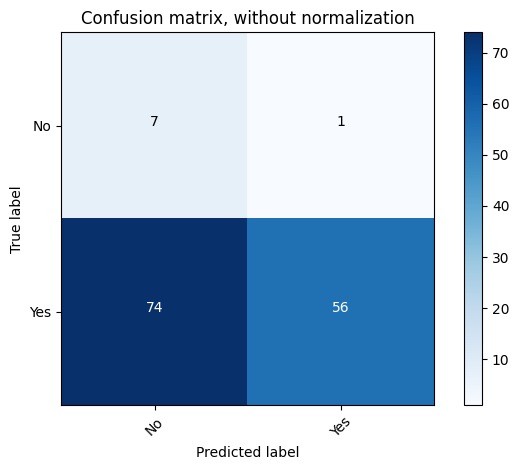

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.09      0.88      0.16         8
         Yes       0.98      0.43      0.60       130

    accuracy                           0.46       138
   macro avg       0.53      0.65      0.38       138
weighted avg       0.93      0.46      0.57       138



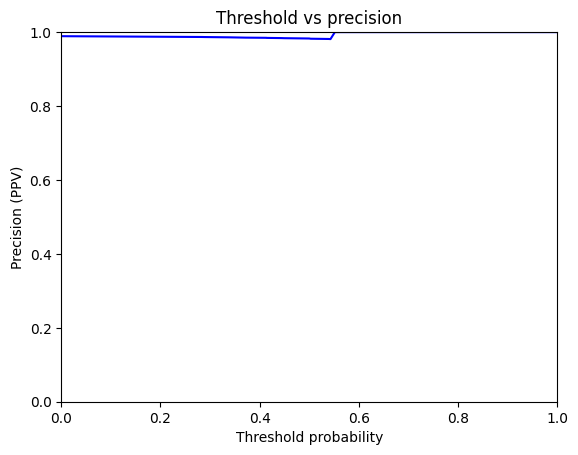

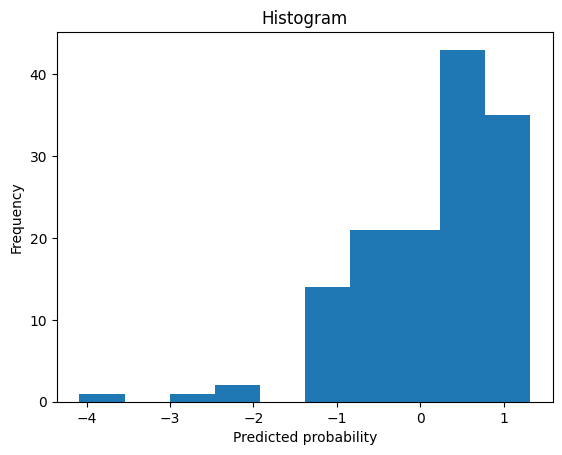

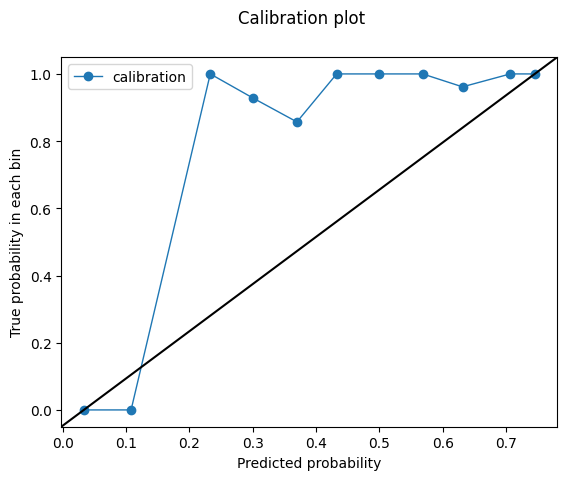

-1.3045914
validation set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.9322916666666666
Outcome probability: 0.2727272727272727
Average precision score: 0.85
Best F1: 0.7636363636363636


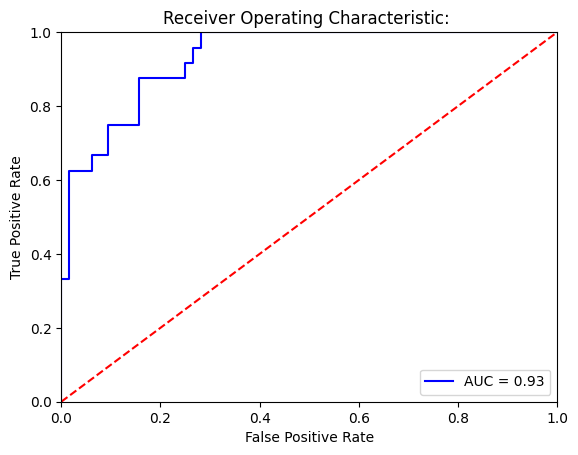

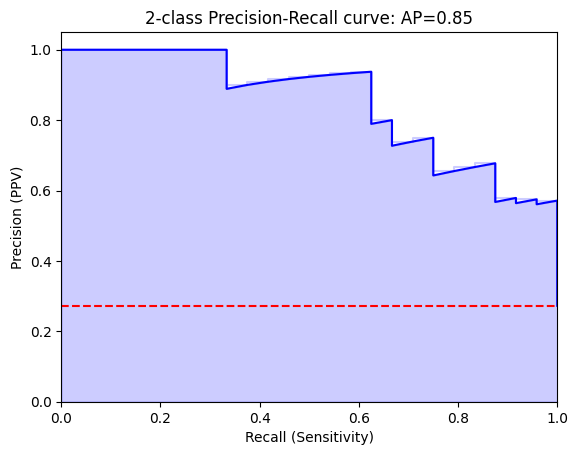

Threshold for best F1:
0.18082145
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[54 10]
 [ 3 21]]


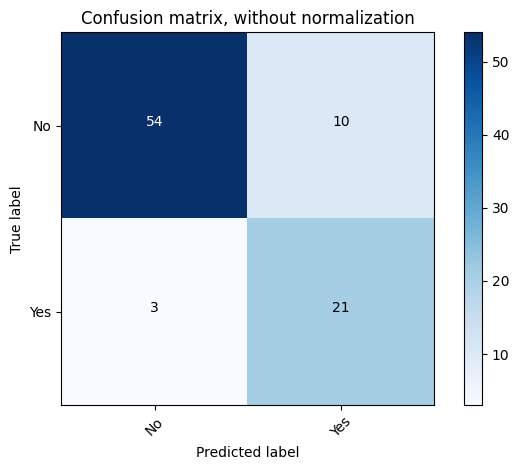

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.95      0.84      0.89        64
         Yes       0.68      0.88      0.76        24

    accuracy                           0.85        88
   macro avg       0.81      0.86      0.83        88
weighted avg       0.87      0.85      0.86        88

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[58  6]
 [ 8 16]]


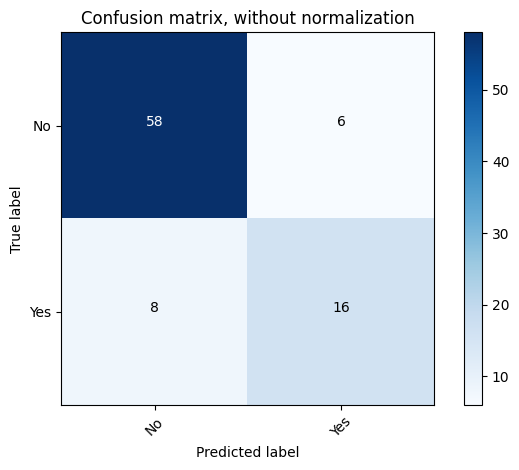

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.91      0.89        64
         Yes       0.73      0.67      0.70        24

    accuracy                           0.84        88
   macro avg       0.80      0.79      0.79        88
weighted avg       0.84      0.84      0.84        88



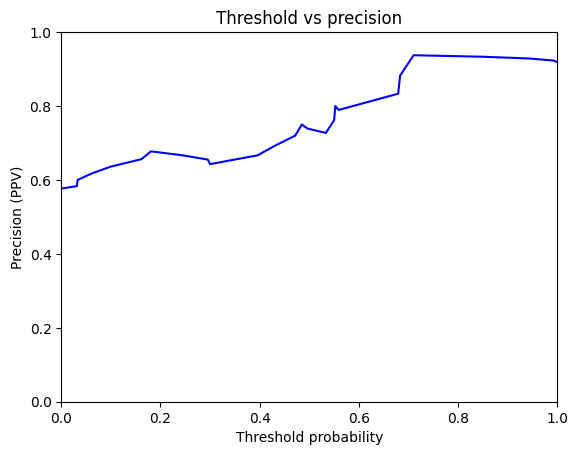

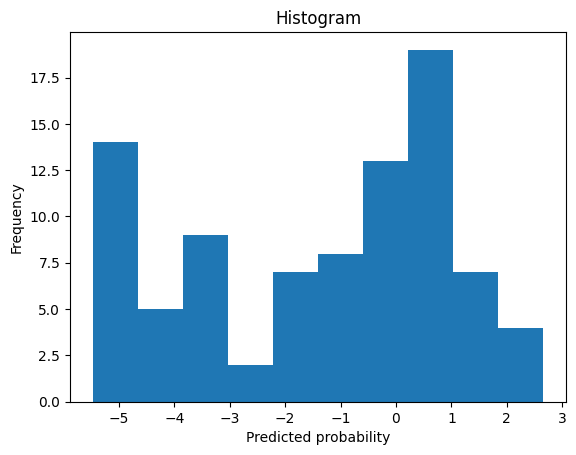

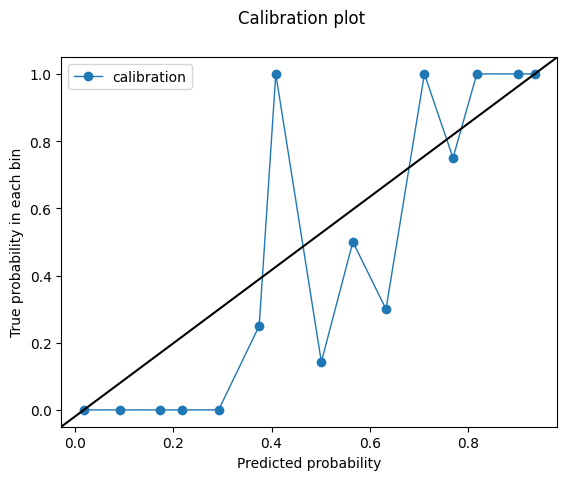

0.18082145
validation set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.9661458333333334
Outcome probability: 0.2727272727272727
Average precision score: 0.92
Best F1: 0.8846153846153847


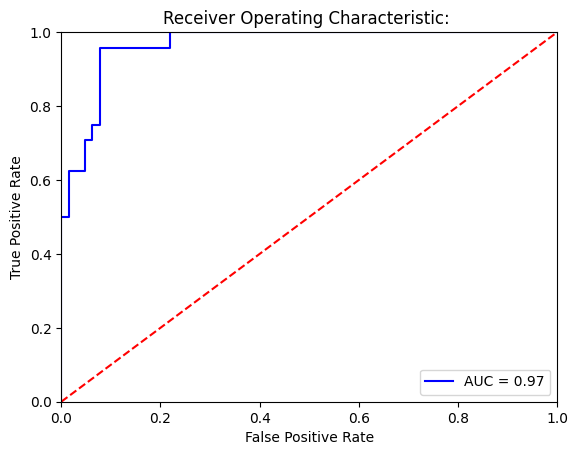

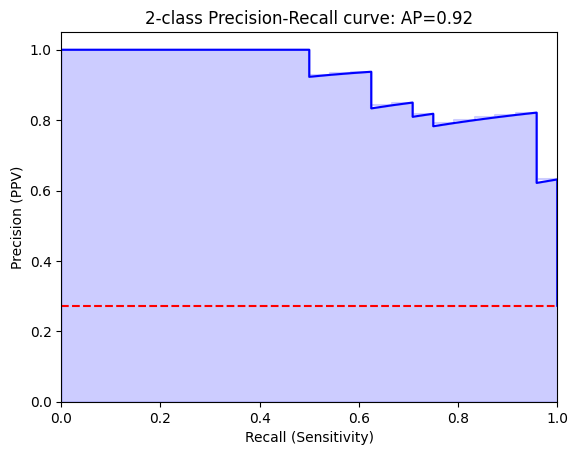

Threshold for best F1:
0.057038844
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[59  5]
 [ 1 23]]


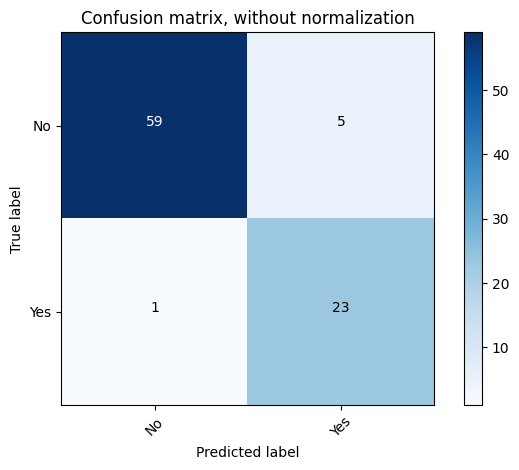

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.98      0.92      0.95        64
         Yes       0.82      0.96      0.88        24

    accuracy                           0.93        88
   macro avg       0.90      0.94      0.92        88
weighted avg       0.94      0.93      0.93        88

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[60  4]
 [ 6 18]]


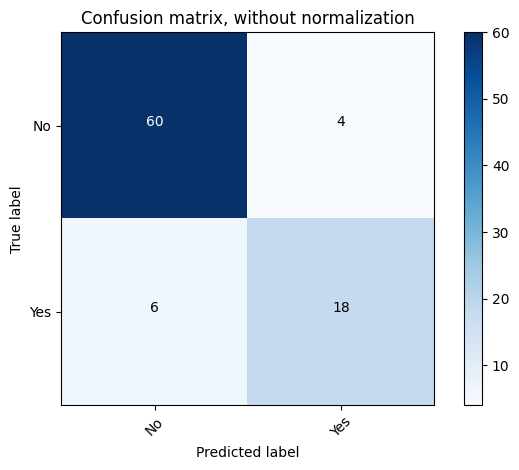

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.94      0.92        64
         Yes       0.82      0.75      0.78        24

    accuracy                           0.89        88
   macro avg       0.86      0.84      0.85        88
weighted avg       0.88      0.89      0.88        88



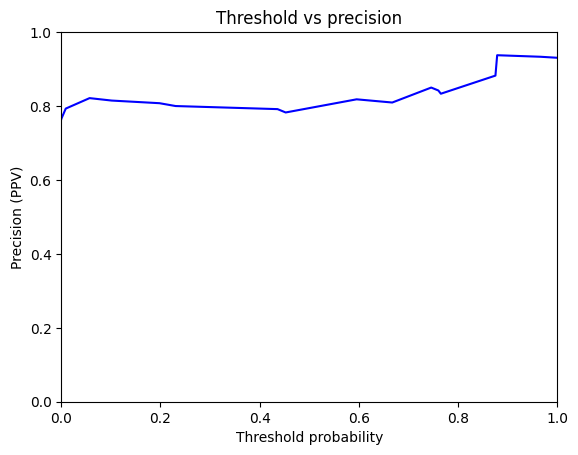

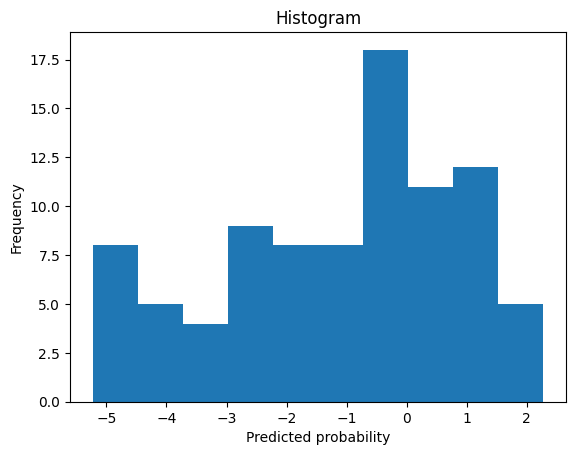

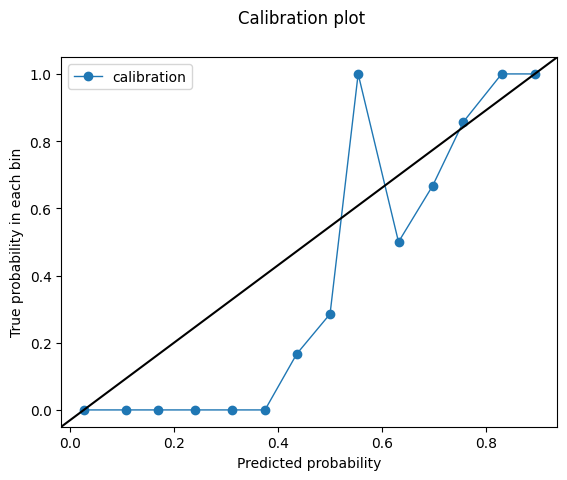

0.057038844
validation set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.7434895833333334
Outcome probability: 0.2727272727272727
Average precision score: 0.44
Best F1: 0.5866666666666666


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


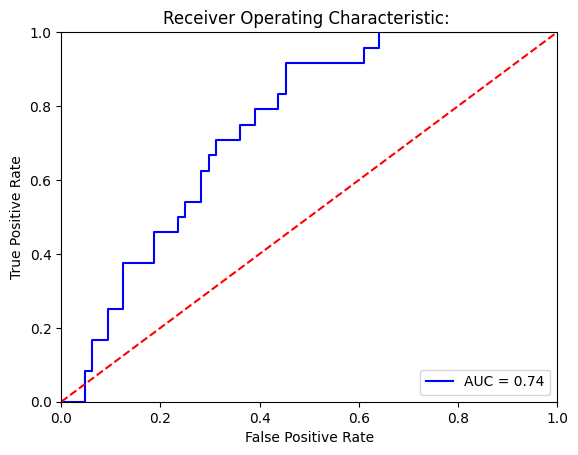

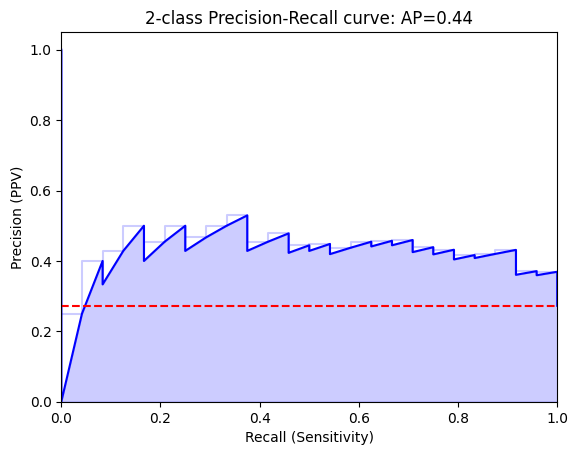

Threshold for best F1:
1.4963809
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[61  3]
 [24  0]]


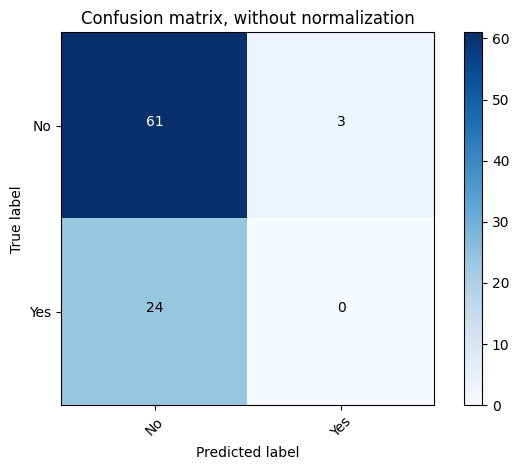

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.72      0.95      0.82        64
         Yes       0.00      0.00      0.00        24

    accuracy                           0.69        88
   macro avg       0.36      0.48      0.41        88
weighted avg       0.52      0.69      0.60        88

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[55  9]
 [15  9]]


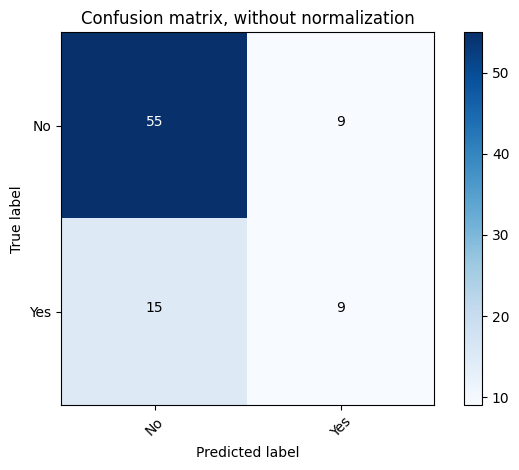

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.79      0.86      0.82        64
         Yes       0.50      0.38      0.43        24

    accuracy                           0.73        88
   macro avg       0.64      0.62      0.62        88
weighted avg       0.71      0.73      0.71        88



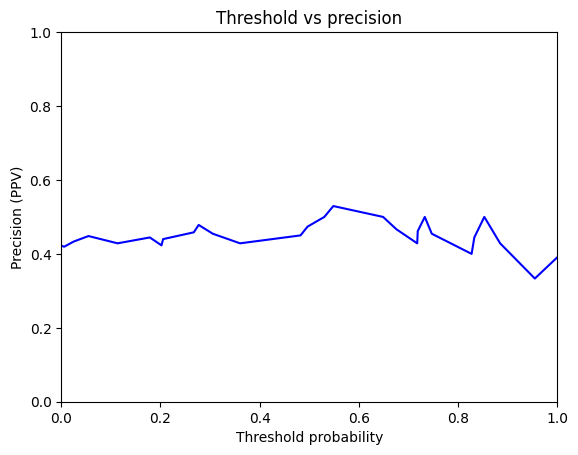

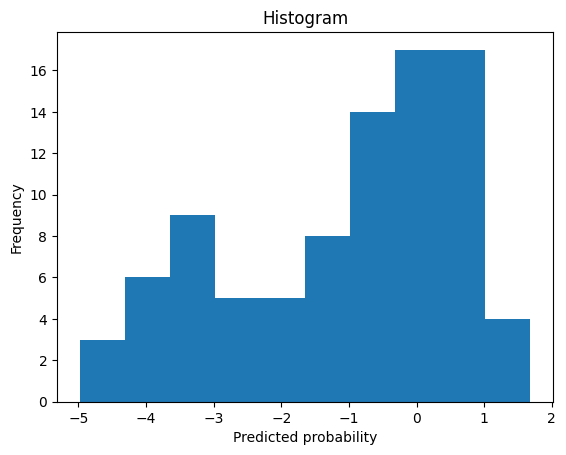

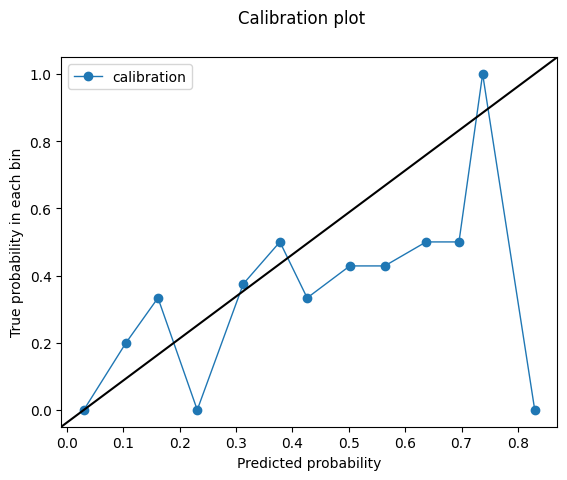

1.4963809
validation set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.7259114583333334
Outcome probability: 0.2727272727272727
Average precision score: 0.48
Best F1: 0.5957446808510638


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


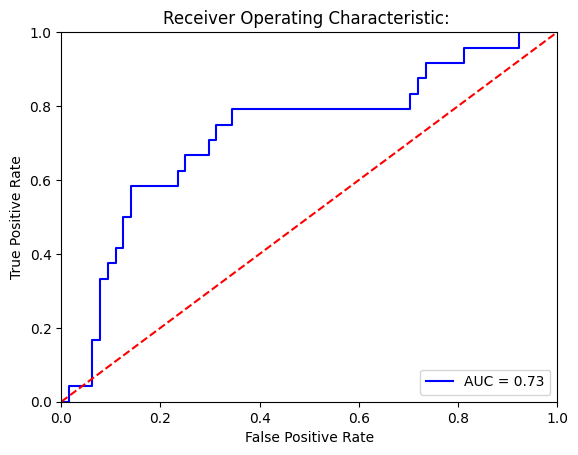

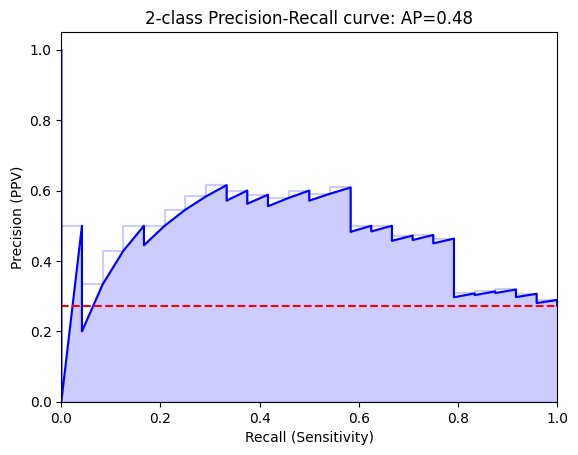

Threshold for best F1:
6.2099752
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[63  1]
 [24  0]]


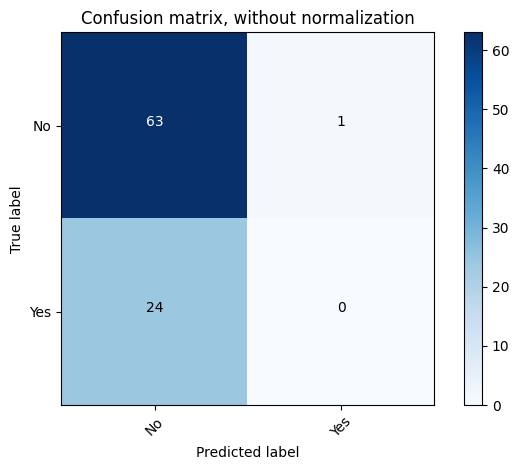

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.72      0.98      0.83        64
         Yes       0.00      0.00      0.00        24

    accuracy                           0.72        88
   macro avg       0.36      0.49      0.42        88
weighted avg       0.53      0.72      0.61        88

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[60  4]
 [23  1]]


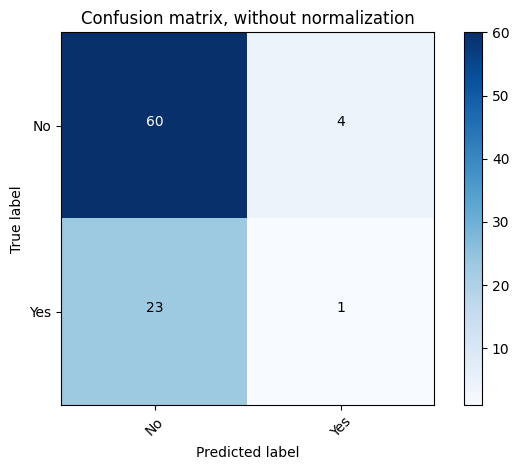

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.72      0.94      0.82        64
         Yes       0.20      0.04      0.07        24

    accuracy                           0.69        88
   macro avg       0.46      0.49      0.44        88
weighted avg       0.58      0.69      0.61        88



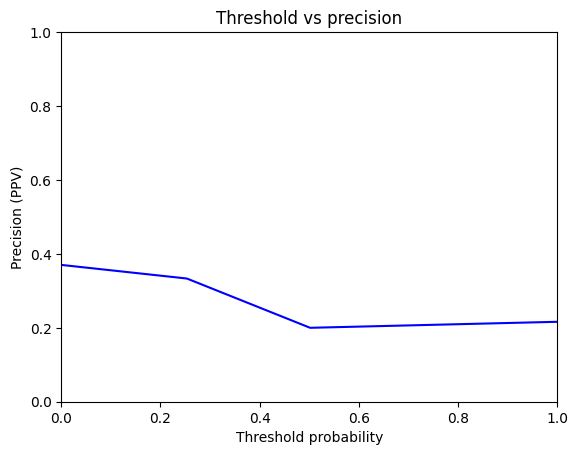

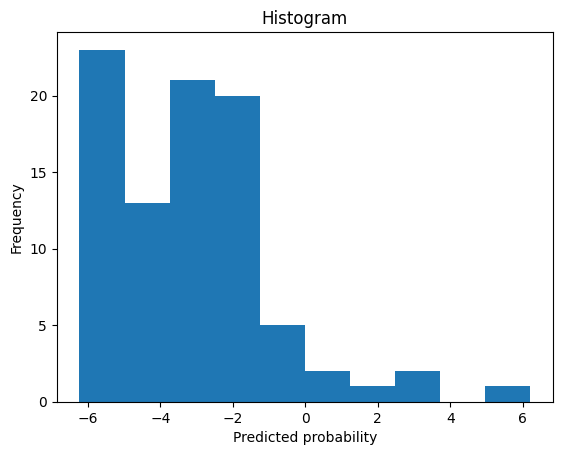

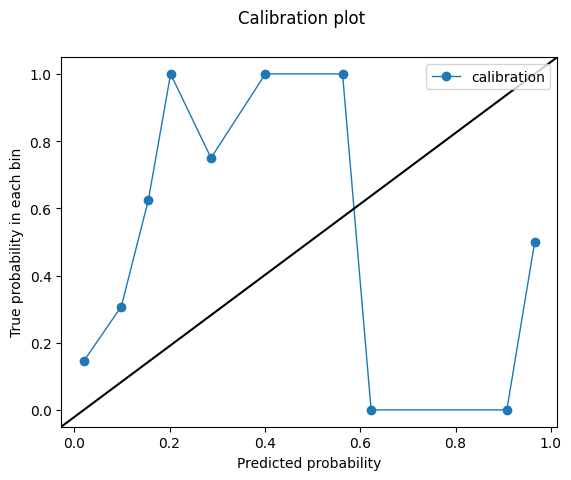

6.2099752
validation set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/4254250114.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.9127604166666667
Outcome probability: 0.2727272727272727
Average precision score: 0.77
Best F1: 0.75


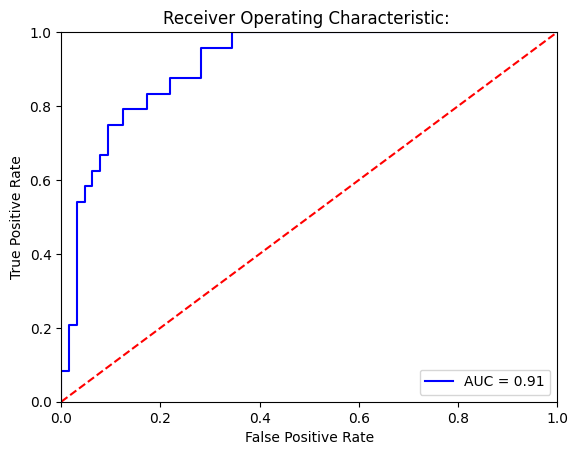

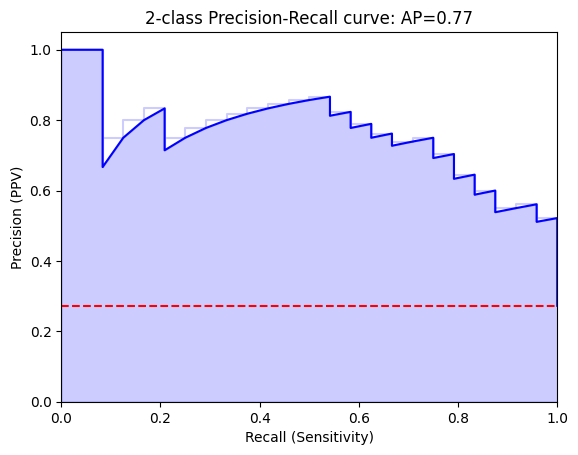

Threshold for best F1:
-0.68336666
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[58  6]
 [ 6 18]]


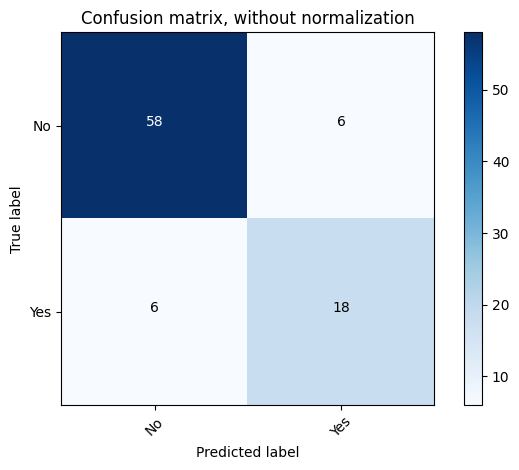

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.91      0.91        64
         Yes       0.75      0.75      0.75        24

    accuracy                           0.86        88
   macro avg       0.83      0.83      0.83        88
weighted avg       0.86      0.86      0.86        88

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[64  0]
 [23  1]]


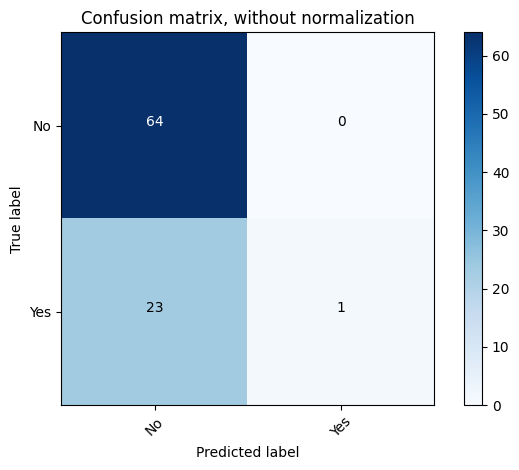

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.74      1.00      0.85        64
         Yes       1.00      0.04      0.08        24

    accuracy                           0.74        88
   macro avg       0.87      0.52      0.46        88
weighted avg       0.81      0.74      0.64        88



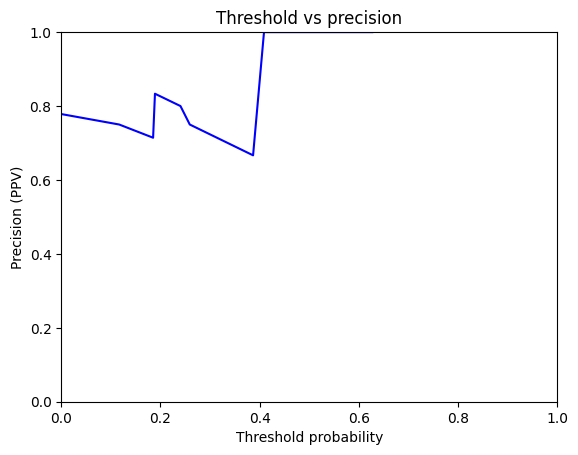

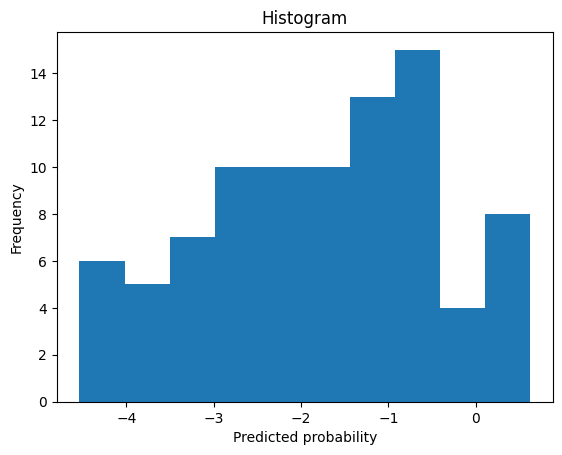

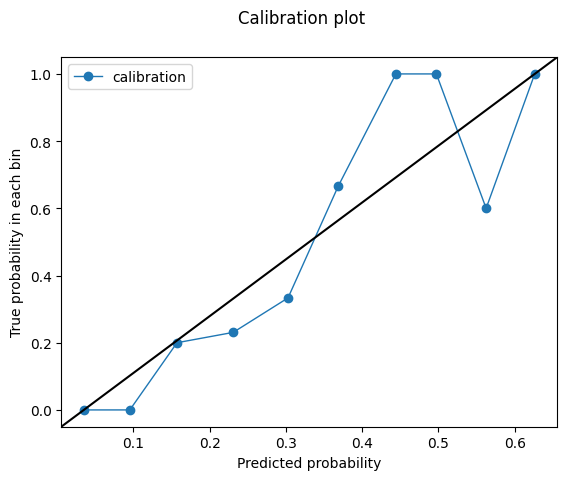

-0.68336666


In [31]:
for cancer_type in top_five_cancers:
    for model_type in model_paths:

        print('validation set')
    
        print('cancer type')
        print(cancer_type)
        print('model type')
        print(model_type)
        validation = validation_full.copy()
        validation = validation[validation.Condition == cancer_type]
        validation_day_text = validation
        validation_day_text['text'] = validation_day_text.text.astype(str)
    
        validation_day_text = validation_day_text.sort_values(by=['obs','dfci_mrn','time'])
    
        validation_day_text['text'] = validation_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
        validation_day_text = validation_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
        #validation_day_text.info()
    
        # write out actual validation dataset
        themodel = RecistModel()
        themodel.load_state_dict(torch.load(model_type))
        themodel.to(device)
    
        no_shuffle_valid_dataset = data.DataLoader(RecistDataset(validation.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)
    
        dflist = []
        for ids, mask, s_times, y_true in no_shuffle_valid_dataset:
            thisframe = pd.DataFrame()
    
            with torch.no_grad():
                y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))
    
            thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['prcr_pred'])
    
            dflist.append(thisframe)
    
        resultframe = pd.concat(dflist, axis=0)
        resultframe = resultframe.reset_index(drop=True)
    
    
        output = validation_day_text.reset_index(drop=True)
    
    
    
        valid_output = pd.concat([output, resultframe], axis=1)
        valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)
    
    
    
    
    
    
        valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)
    
    
        valid_output= valid_output[valid_output.overall_response != 'BL']
        print('cancer type')
        print(cancer_type)
        print('model type')
        print(model_type)
        print(eval_model(valid_output.prcr_pred, valid_output.outcome, graph=True))


test set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.9035400332620575
Outcome probability: 0.2390852390852391
Average precision score: 0.77
Best F1: 0.744


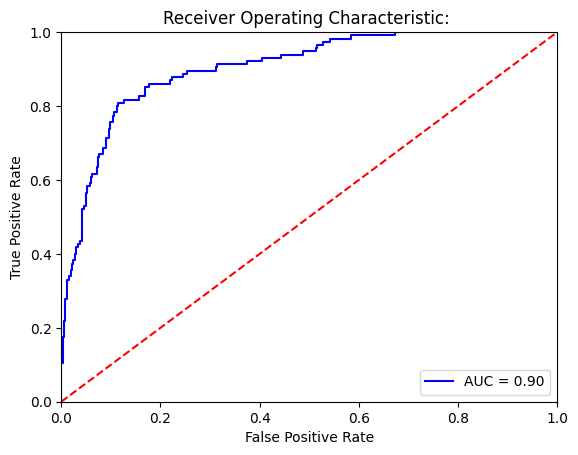

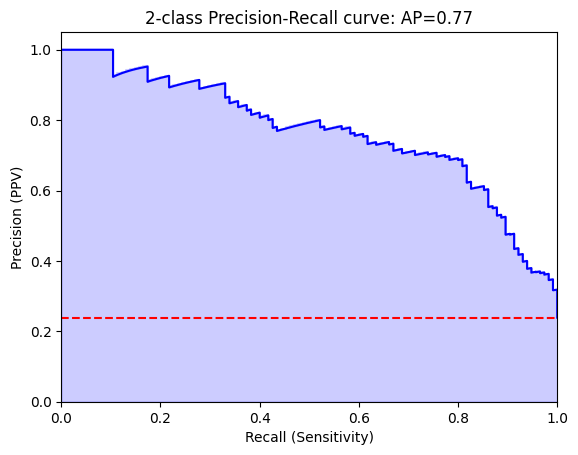

Threshold for best F1:
-0.020926595
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[324  42]
 [ 22  93]]


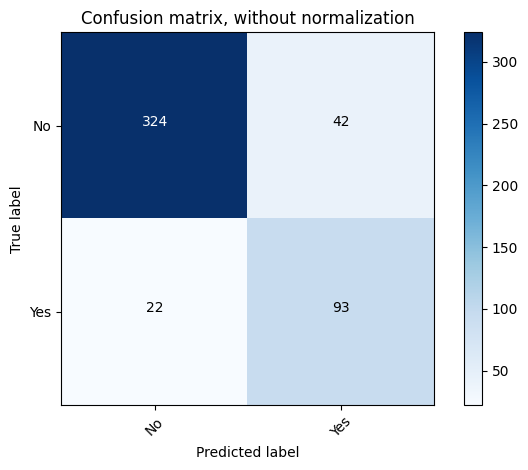

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.94      0.89      0.91       366
         Yes       0.69      0.81      0.74       115

    accuracy                           0.87       481
   macro avg       0.81      0.85      0.83       481
weighted avg       0.88      0.87      0.87       481

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[339  27]
 [ 40  75]]


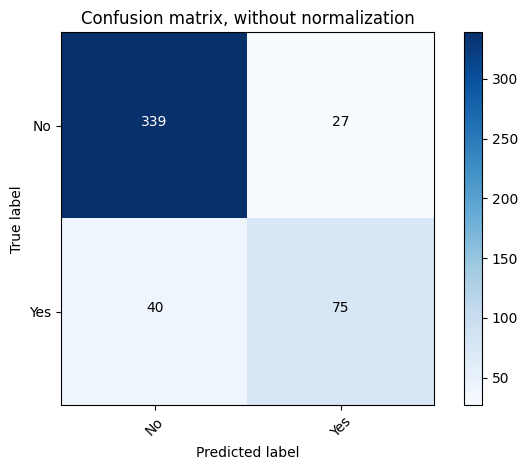

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.93      0.91       366
         Yes       0.74      0.65      0.69       115

    accuracy                           0.86       481
   macro avg       0.81      0.79      0.80       481
weighted avg       0.86      0.86      0.86       481



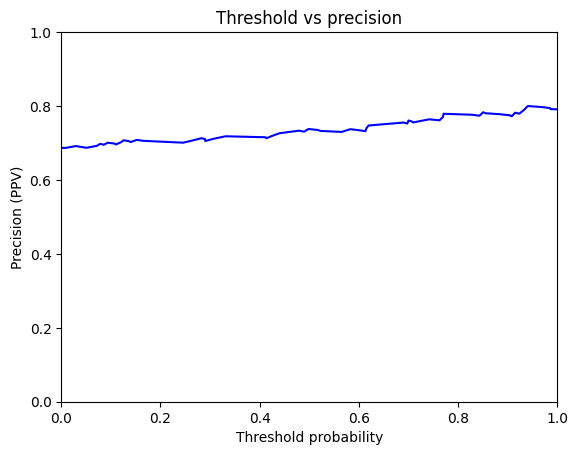

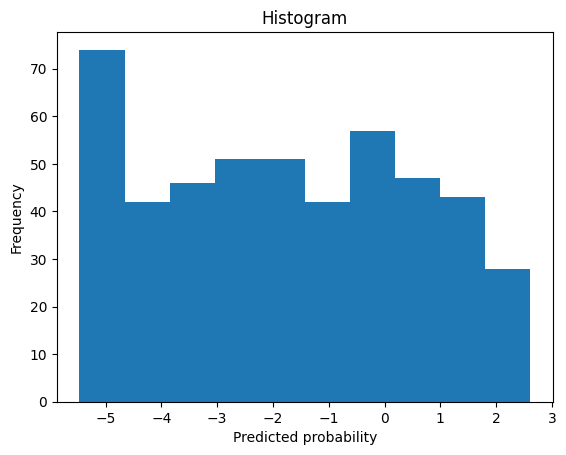

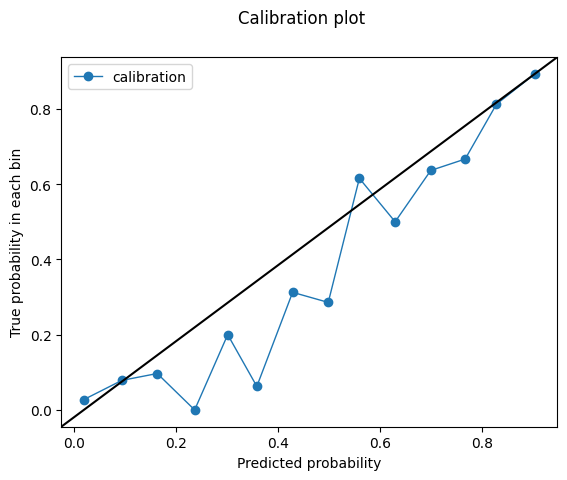

-0.020926595
test set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.8774530767403184
Outcome probability: 0.2390852390852391
Average precision score: 0.73
Best F1: 0.681159420289855


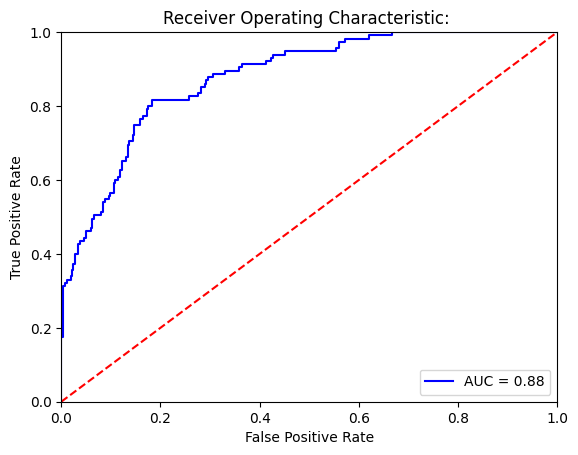

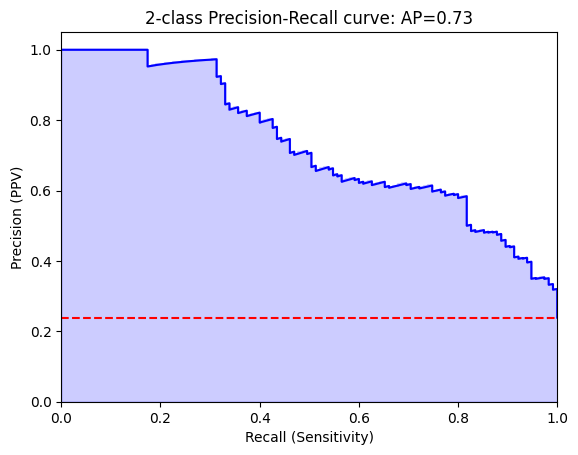

Threshold for best F1:
-0.069517255
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[299  67]
 [ 21  94]]


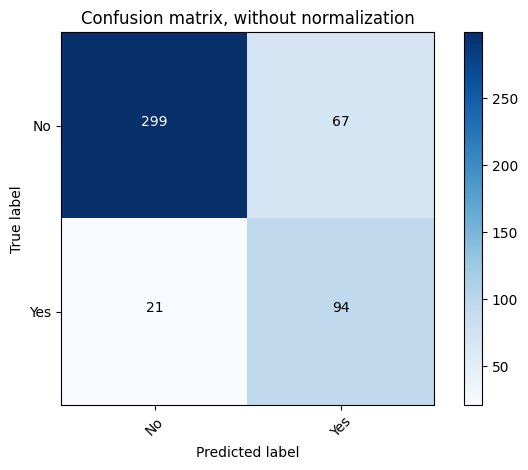

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.93      0.82      0.87       366
         Yes       0.58      0.82      0.68       115

    accuracy                           0.82       481
   macro avg       0.76      0.82      0.78       481
weighted avg       0.85      0.82      0.83       481

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[324  42]
 [ 46  69]]


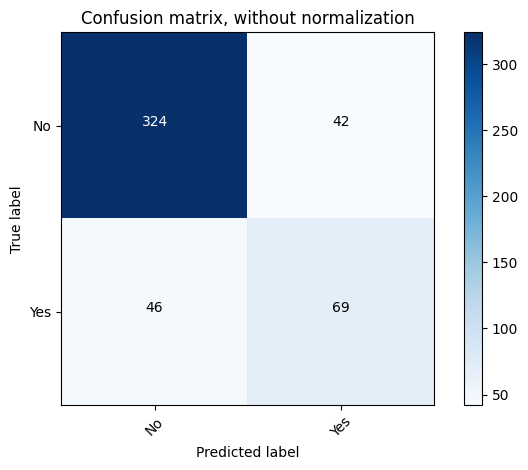

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.89      0.88       366
         Yes       0.62      0.60      0.61       115

    accuracy                           0.82       481
   macro avg       0.75      0.74      0.75       481
weighted avg       0.81      0.82      0.82       481



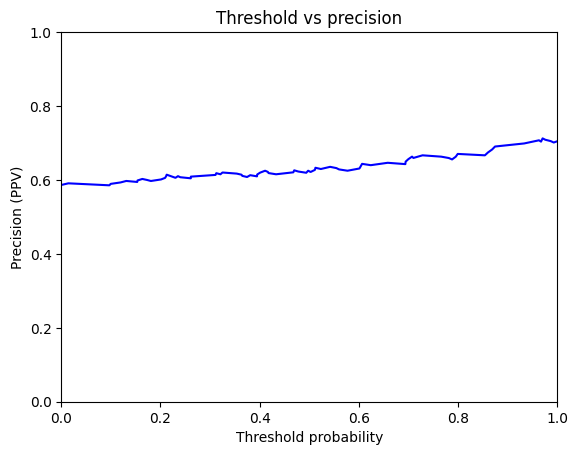

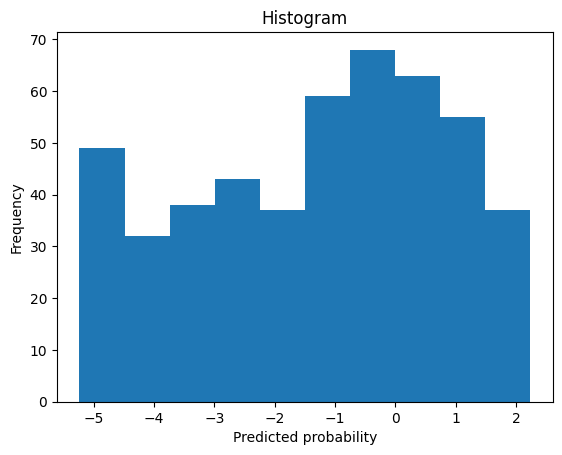

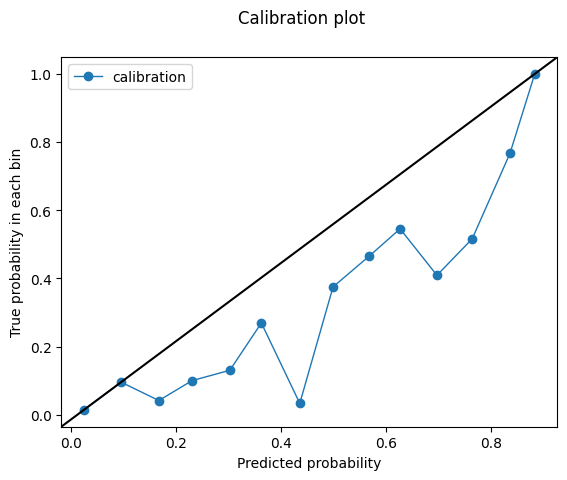

-0.069517255
test set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.8427417438821573
Outcome probability: 0.2390852390852391
Average precision score: 0.62
Best F1: 0.6227106227106226


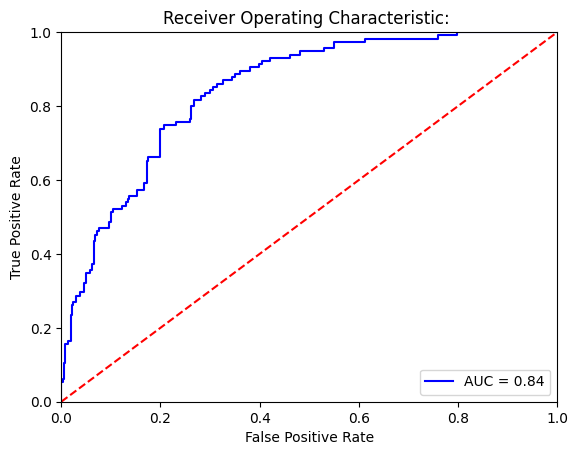

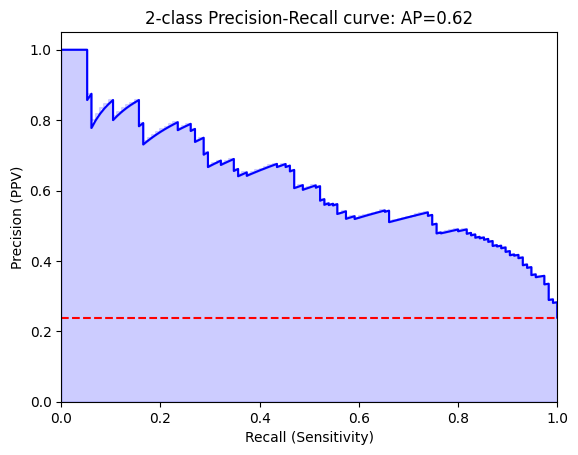

Threshold for best F1:
-0.34743756
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[293  73]
 [ 30  85]]


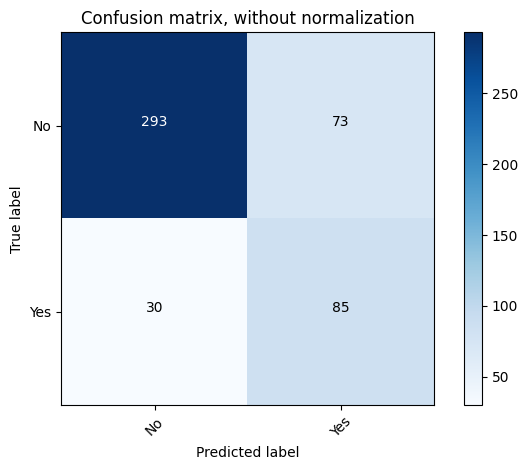

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.80      0.85       366
         Yes       0.54      0.74      0.62       115

    accuracy                           0.79       481
   macro avg       0.72      0.77      0.74       481
weighted avg       0.82      0.79      0.80       481

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[342  24]
 [ 71  44]]


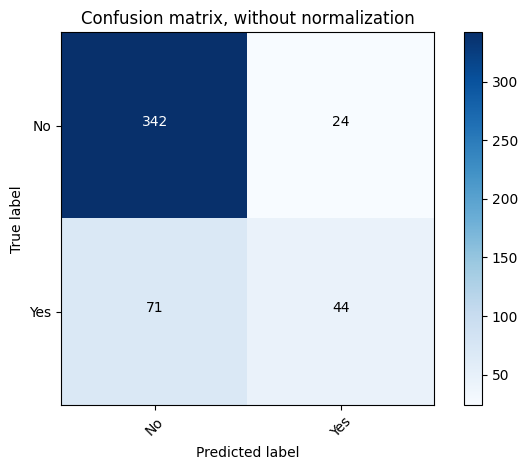

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.83      0.93      0.88       366
         Yes       0.65      0.38      0.48       115

    accuracy                           0.80       481
   macro avg       0.74      0.66      0.68       481
weighted avg       0.78      0.80      0.78       481



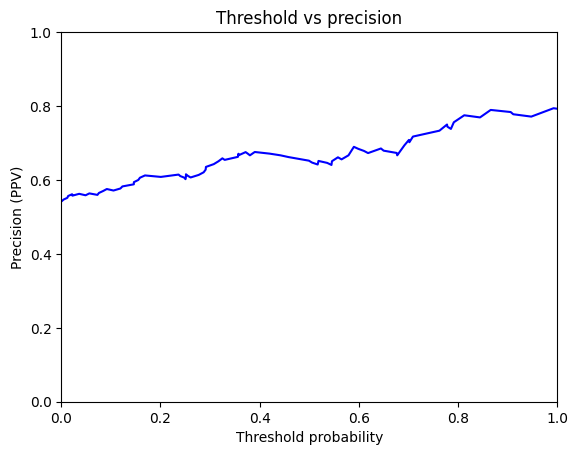

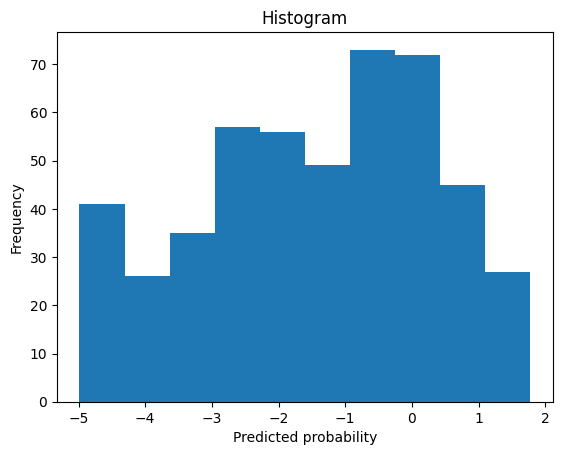

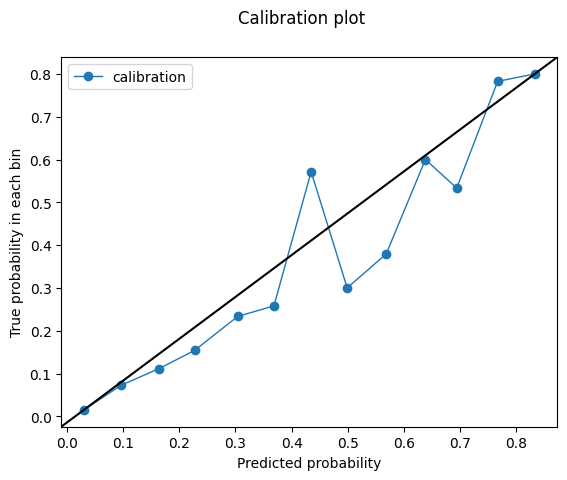

-0.34743756
test set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.7189831313851273
Outcome probability: 0.2390852390852391
Average precision score: 0.43
Best F1: 0.5090909090909091


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


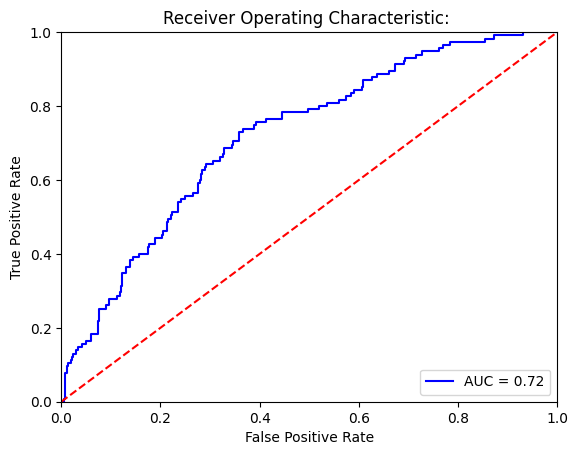

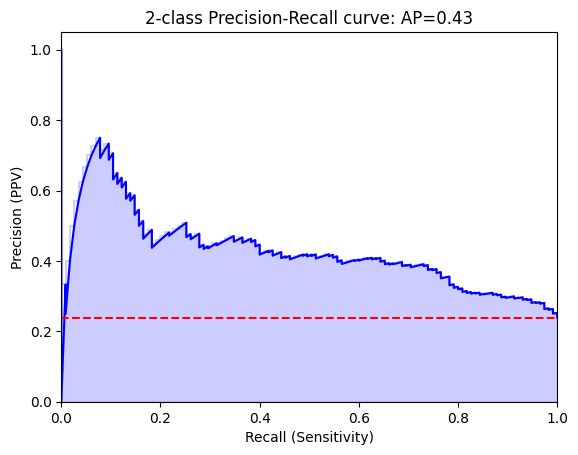

Threshold for best F1:
2.6072035
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[364   2]
 [115   0]]


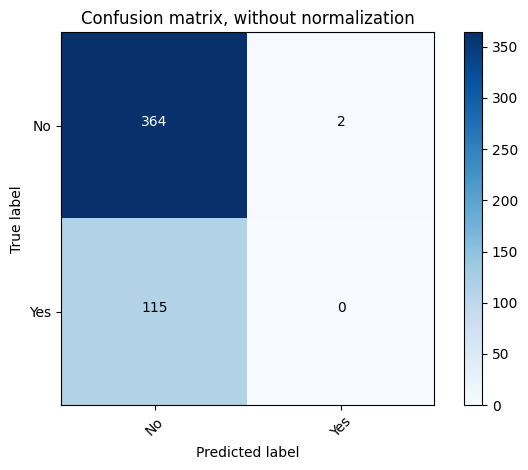

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.76      0.99      0.86       366
         Yes       0.00      0.00      0.00       115

    accuracy                           0.76       481
   macro avg       0.38      0.50      0.43       481
weighted avg       0.58      0.76      0.66       481

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[363   3]
 [112   3]]


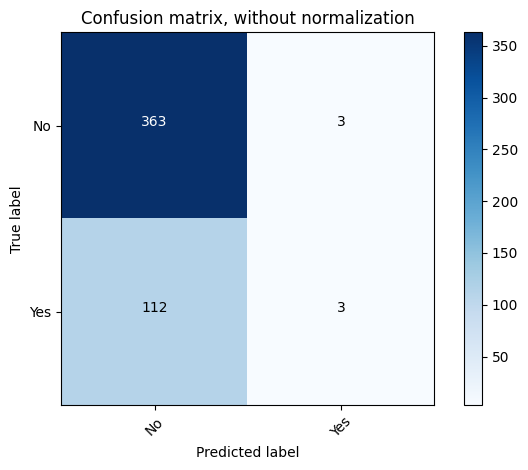

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.76      0.99      0.86       366
         Yes       0.50      0.03      0.05       115

    accuracy                           0.76       481
   macro avg       0.63      0.51      0.46       481
weighted avg       0.70      0.76      0.67       481



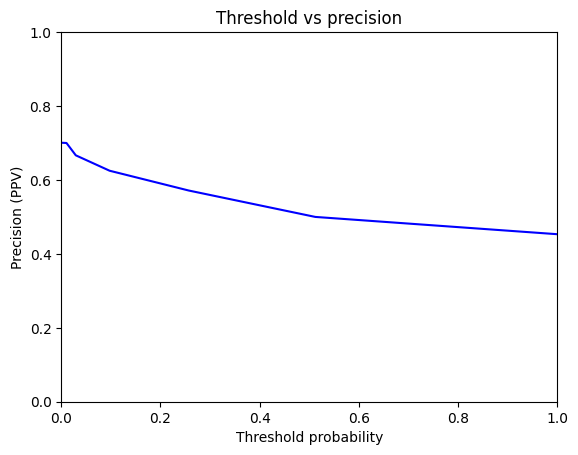

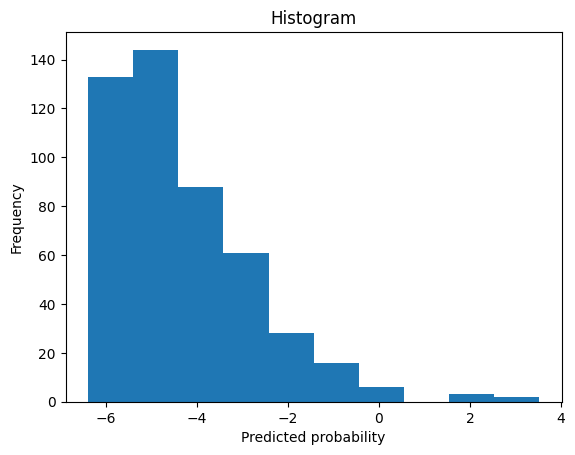

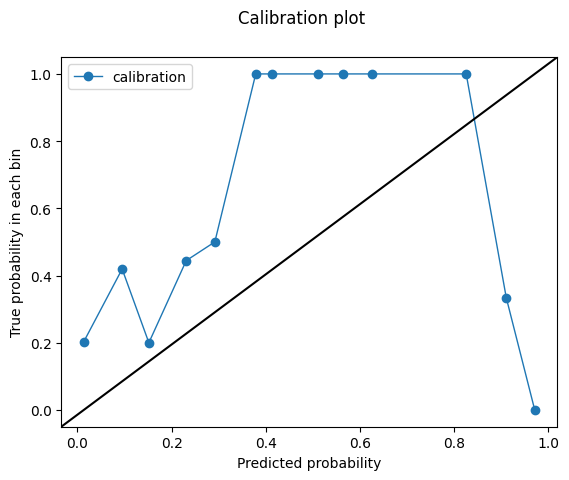

2.6072035
test set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.8664290805416963
Outcome probability: 0.2390852390852391
Average precision score: 0.68
Best F1: 0.6470588235294118


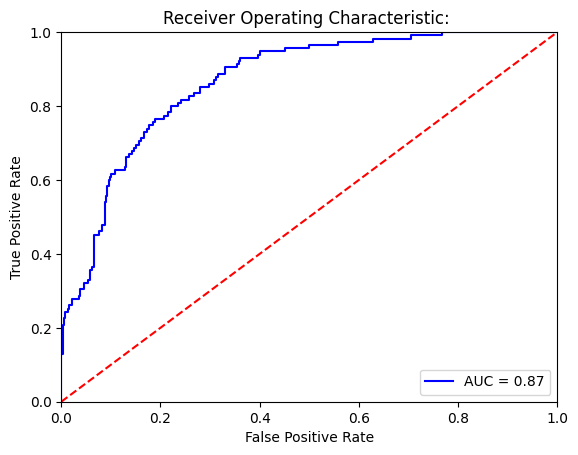

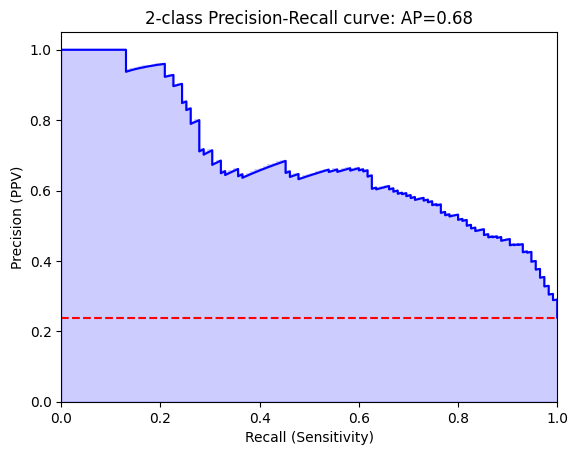

Threshold for best F1:
-1.1088476
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[297  69]
 [ 27  88]]


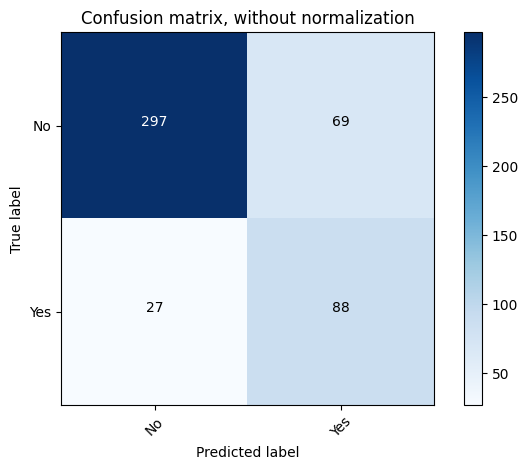

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.81      0.86       366
         Yes       0.56      0.77      0.65       115

    accuracy                           0.80       481
   macro avg       0.74      0.79      0.75       481
weighted avg       0.83      0.80      0.81       481

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[365   1]
 [ 97  18]]


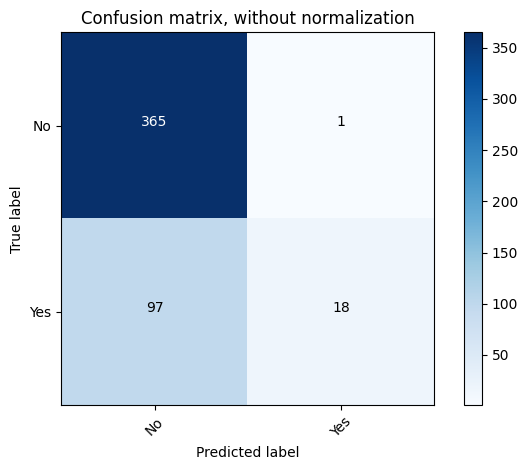

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.79      1.00      0.88       366
         Yes       0.95      0.16      0.27       115

    accuracy                           0.80       481
   macro avg       0.87      0.58      0.58       481
weighted avg       0.83      0.80      0.74       481



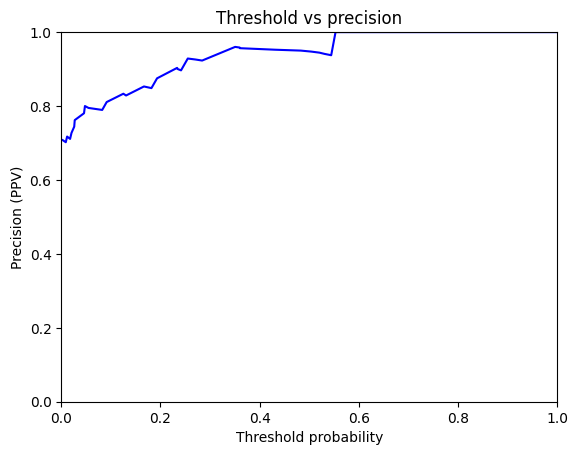

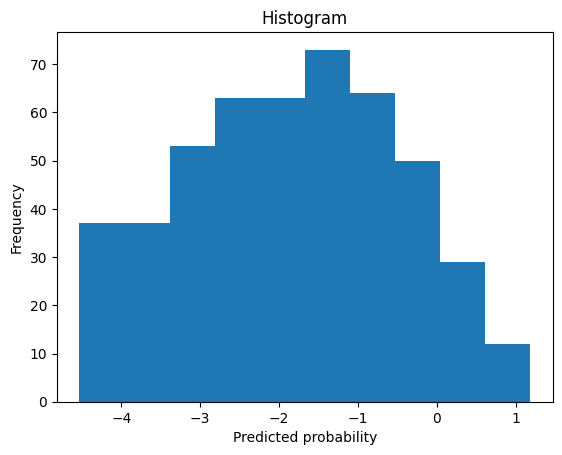

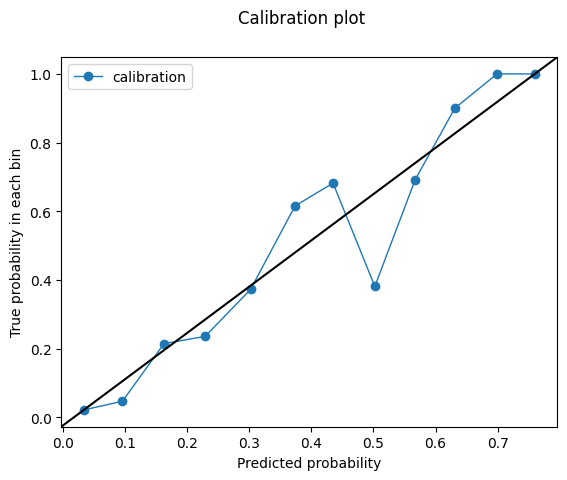

-1.1088476
test set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.8904537205081671
Outcome probability: 0.3958333333333333
Average precision score: 0.84
Best F1: 0.7843137254901961


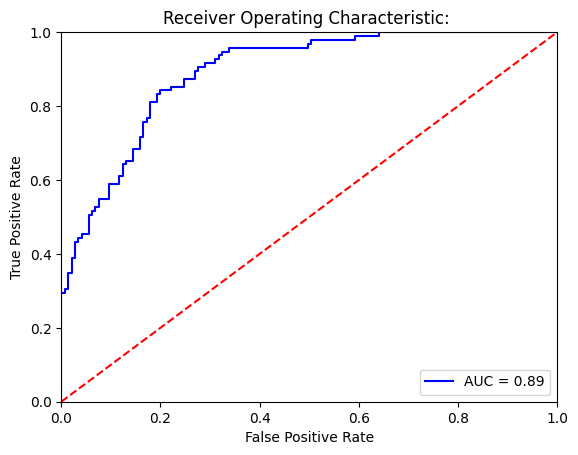

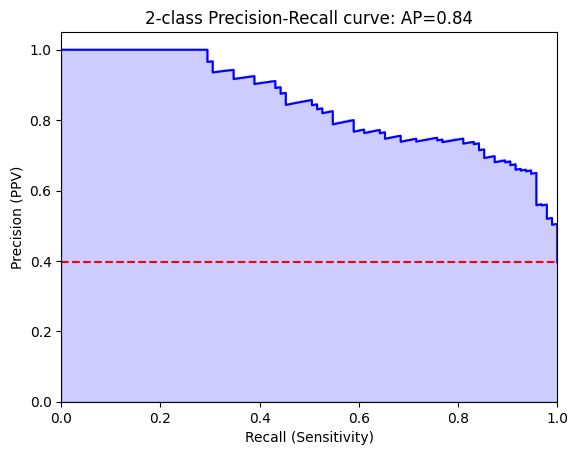

Threshold for best F1:
-1.1591889
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[116  29]
 [ 15  80]]


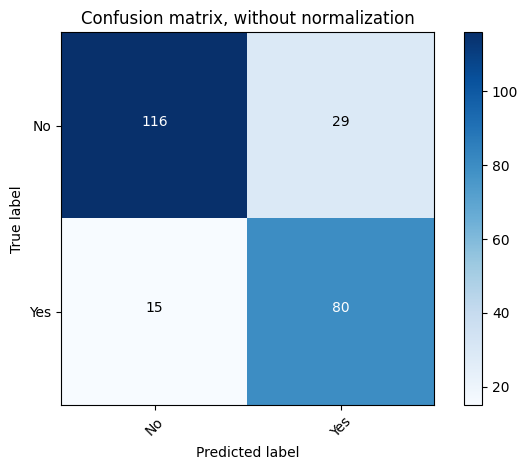

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.80      0.84       145
         Yes       0.73      0.84      0.78        95

    accuracy                           0.82       240
   macro avg       0.81      0.82      0.81       240
weighted avg       0.83      0.82      0.82       240

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[137   8]
 [ 48  47]]


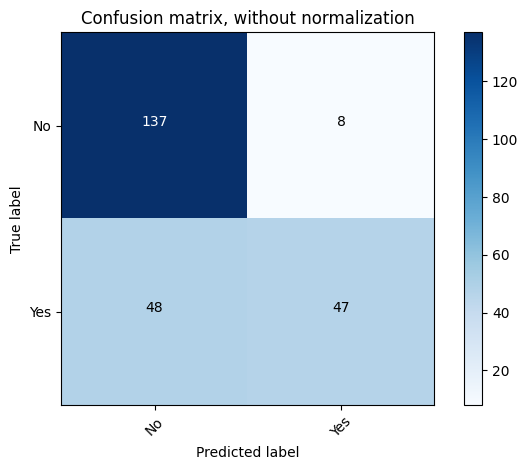

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.74      0.94      0.83       145
         Yes       0.85      0.49      0.63        95

    accuracy                           0.77       240
   macro avg       0.80      0.72      0.73       240
weighted avg       0.79      0.77      0.75       240



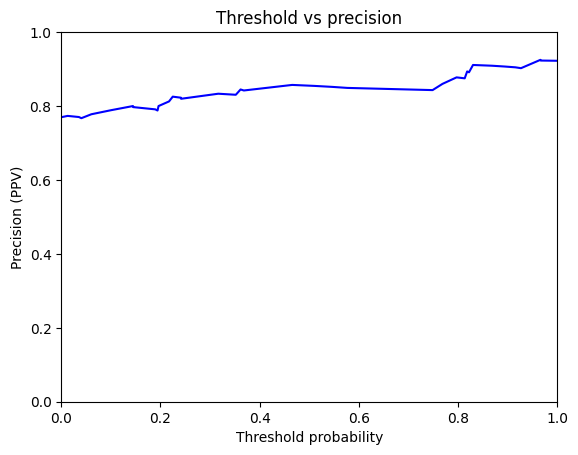

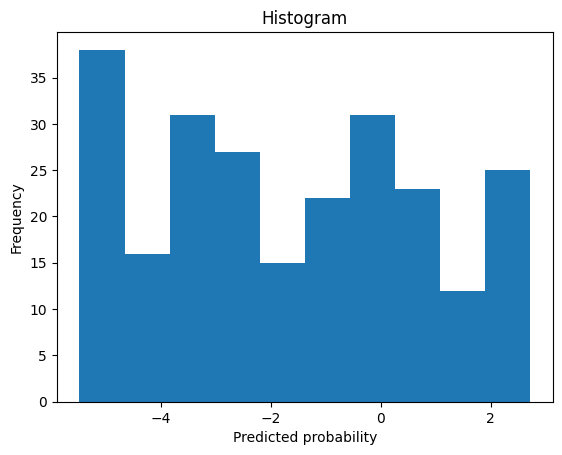

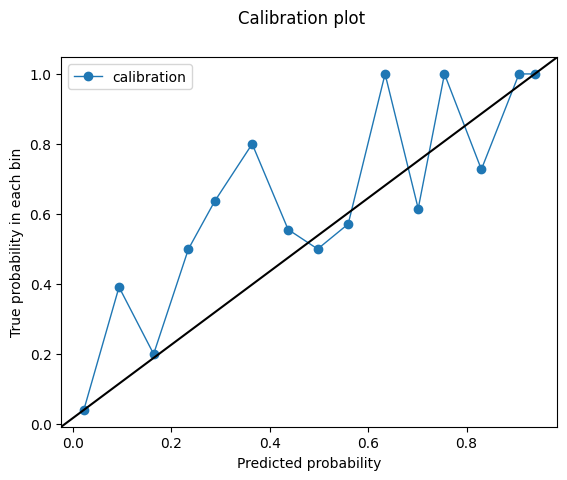

-1.1591889
test set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.8768784029038112
Outcome probability: 0.3958333333333333
Average precision score: 0.82
Best F1: 0.7531380753138075


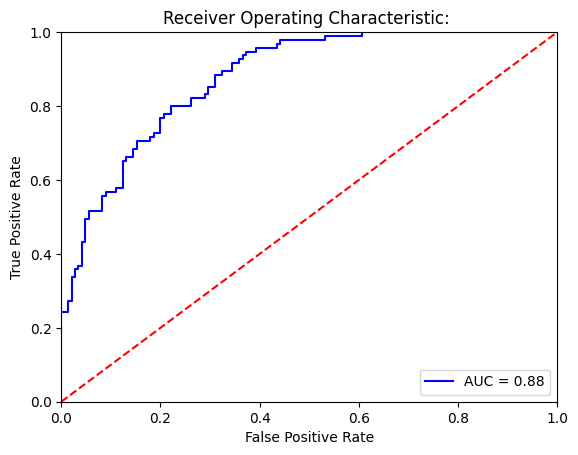

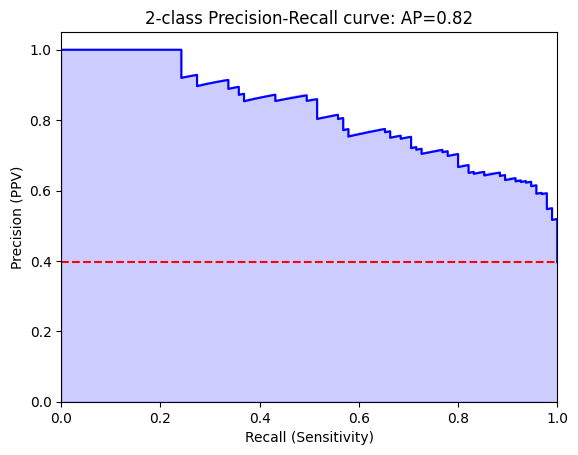

Threshold for best F1:
-2.1303334
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[91 54]
 [ 5 90]]


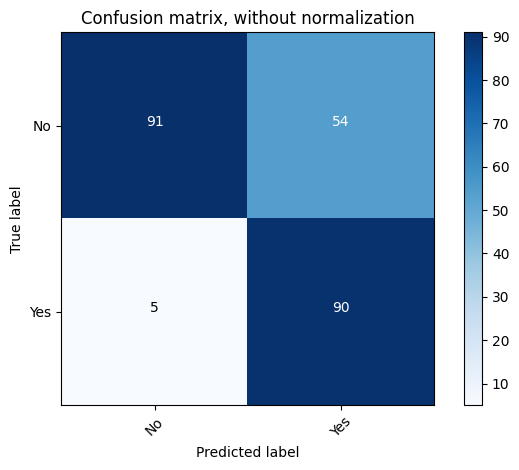

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.95      0.63      0.76       145
         Yes       0.62      0.95      0.75        95

    accuracy                           0.75       240
   macro avg       0.79      0.79      0.75       240
weighted avg       0.82      0.75      0.75       240

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[138   7]
 [ 51  44]]


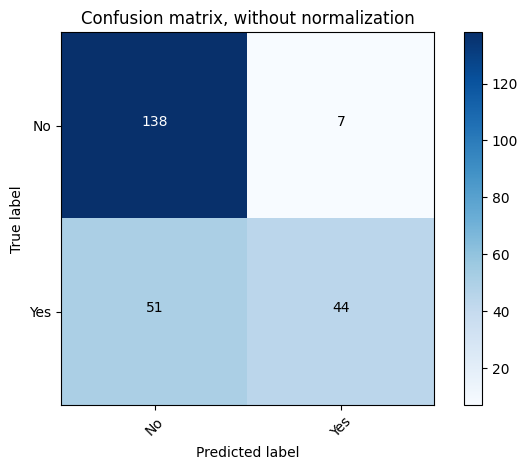

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.73      0.95      0.83       145
         Yes       0.86      0.46      0.60        95

    accuracy                           0.76       240
   macro avg       0.80      0.71      0.71       240
weighted avg       0.78      0.76      0.74       240



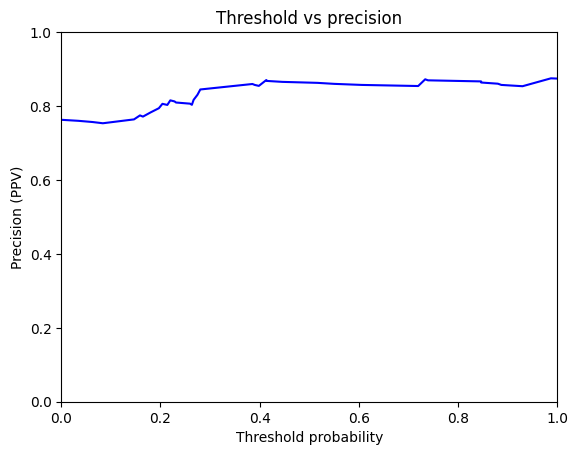

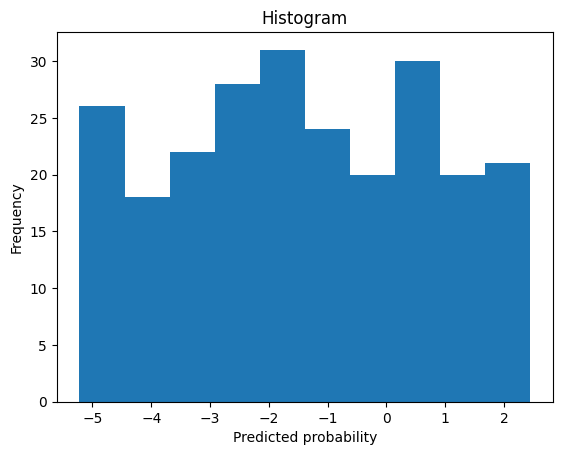

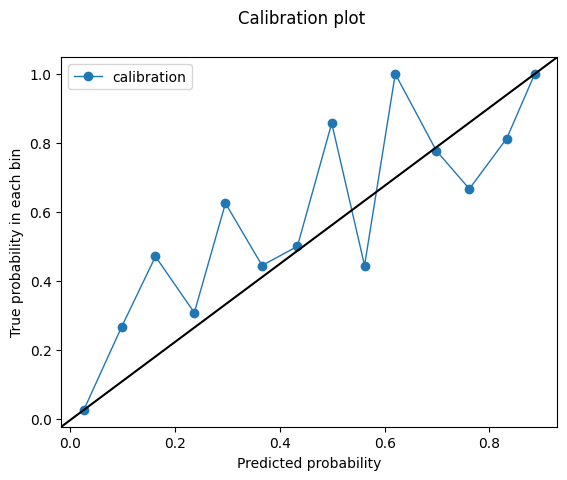

-2.1303334
test set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.8263520871143375
Outcome probability: 0.3958333333333333
Average precision score: 0.73
Best F1: 0.7321428571428572


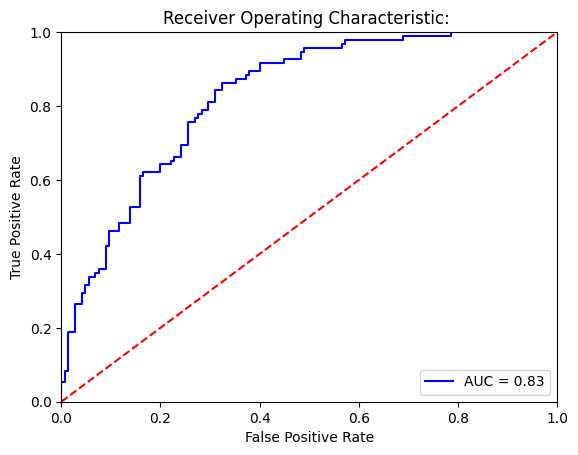

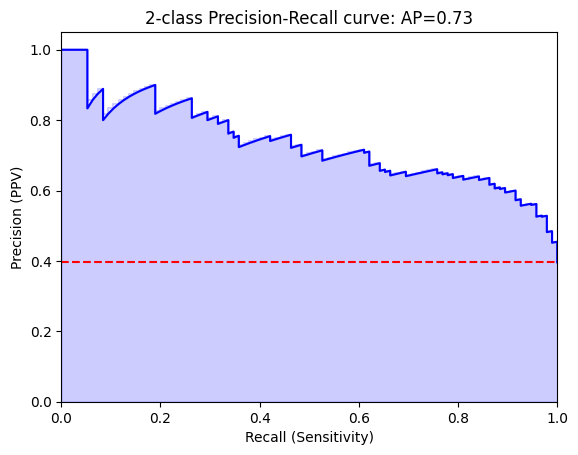

Threshold for best F1:
-1.6744407
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[98 47]
 [13 82]]


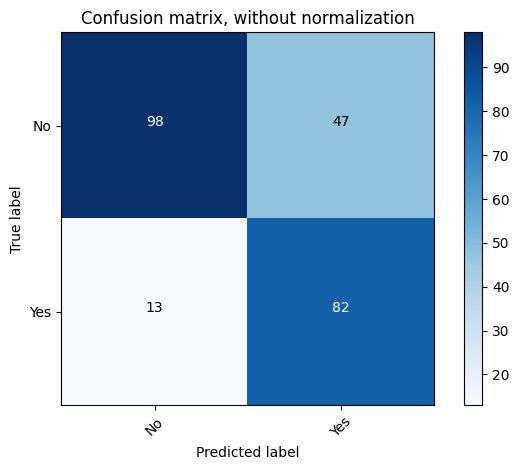

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.68      0.77       145
         Yes       0.64      0.86      0.73        95

    accuracy                           0.75       240
   macro avg       0.76      0.77      0.75       240
weighted avg       0.79      0.75      0.75       240

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[133  12]
 [ 61  34]]


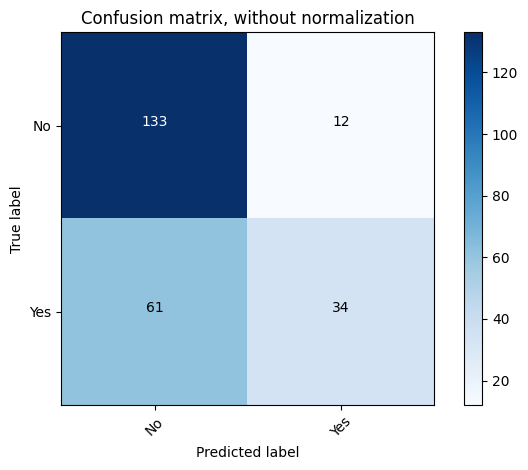

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.69      0.92      0.78       145
         Yes       0.74      0.36      0.48        95

    accuracy                           0.70       240
   macro avg       0.71      0.64      0.63       240
weighted avg       0.71      0.70      0.66       240



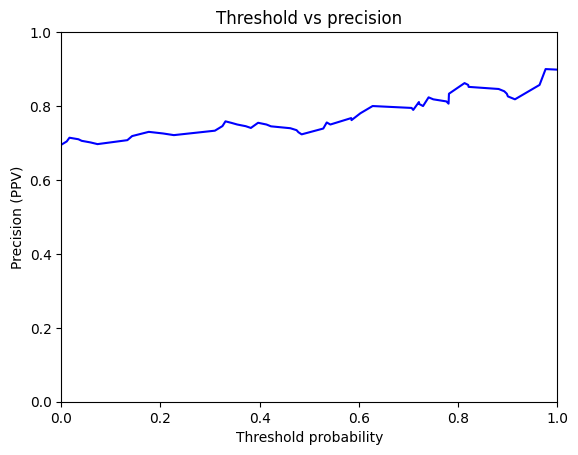

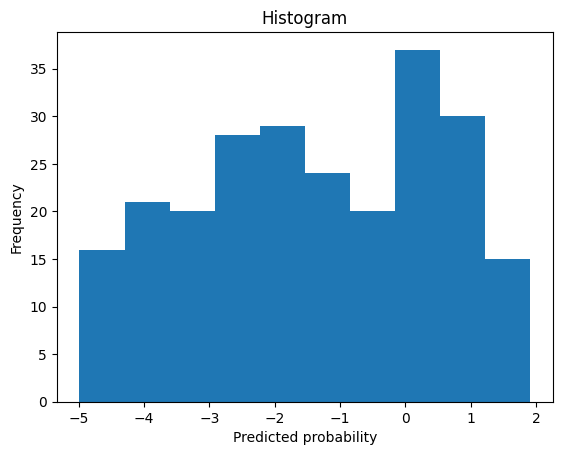

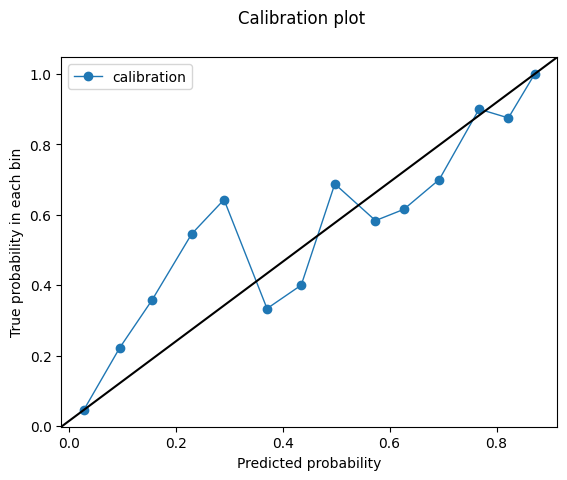

-1.6744407
test set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.6527041742286751
Outcome probability: 0.3958333333333333
Average precision score: 0.49
Best F1: 0.6352941176470588


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


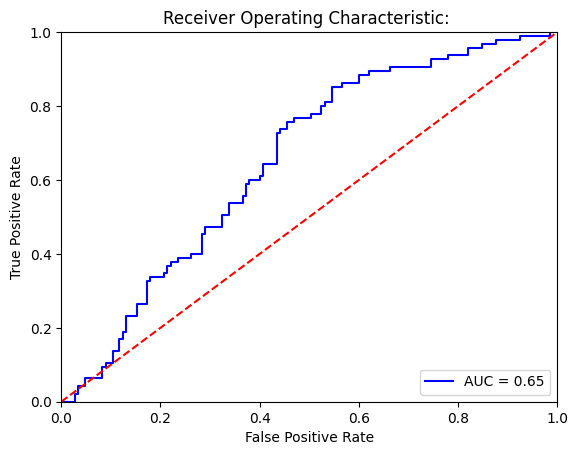

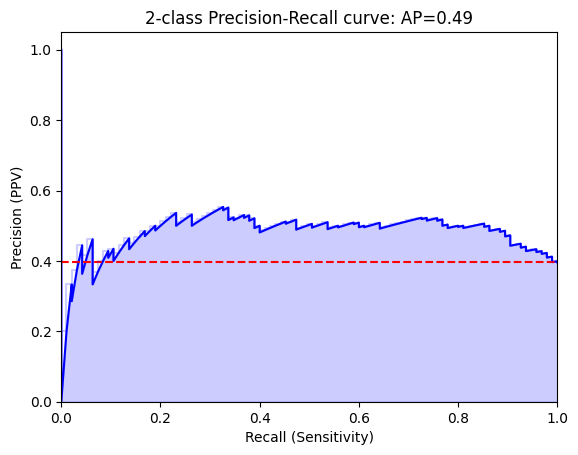

Threshold for best F1:
0.0725341
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[141   4]
 [ 95   0]]


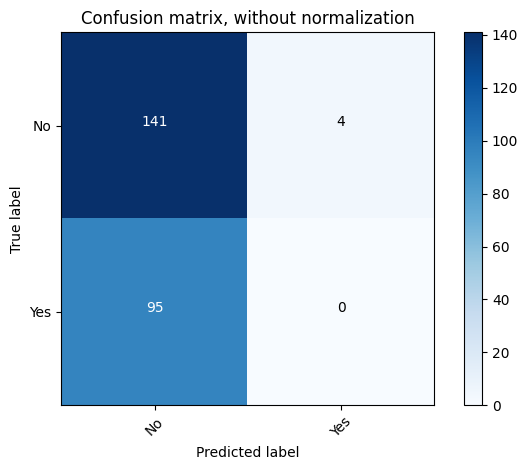

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.60      0.97      0.74       145
         Yes       0.00      0.00      0.00        95

    accuracy                           0.59       240
   macro avg       0.30      0.49      0.37       240
weighted avg       0.36      0.59      0.45       240

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[142   3]
 [ 95   0]]


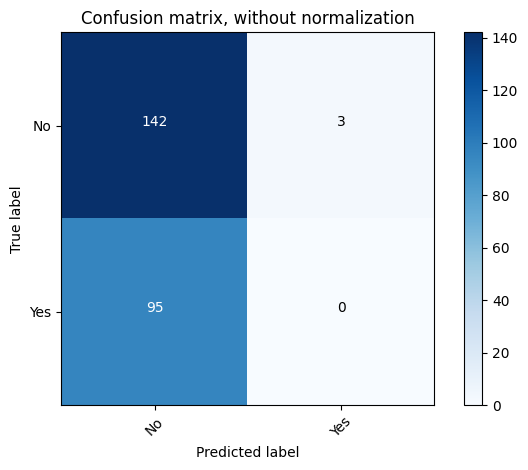

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.60      0.98      0.74       145
         Yes       0.00      0.00      0.00        95

    accuracy                           0.59       240
   macro avg       0.30      0.49      0.37       240
weighted avg       0.36      0.59      0.45       240



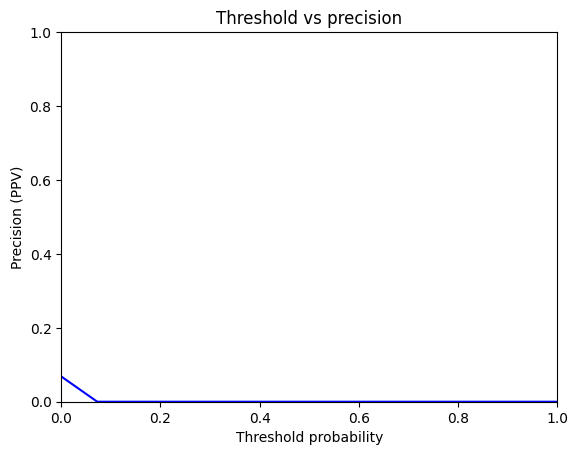

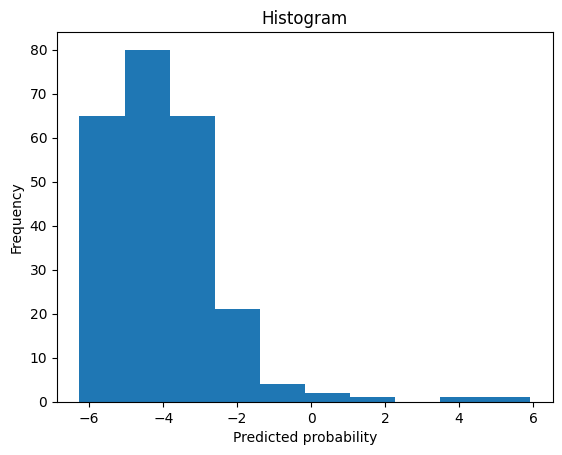

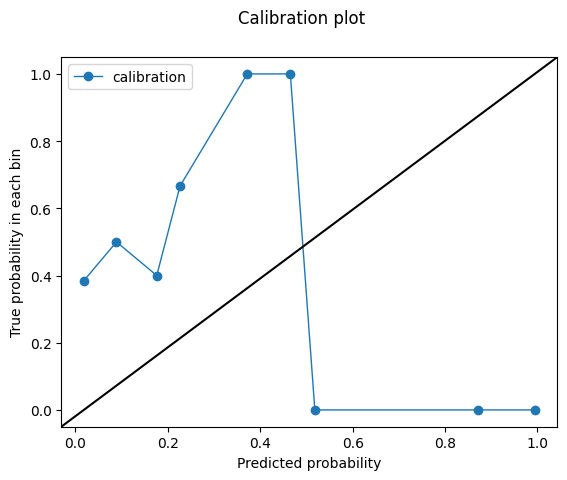

0.0725341
test set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.82497277676951
Outcome probability: 0.3958333333333333
Average precision score: 0.76
Best F1: 0.7166666666666666


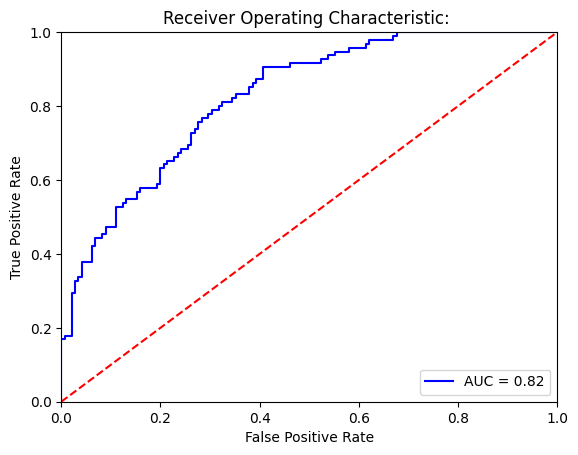

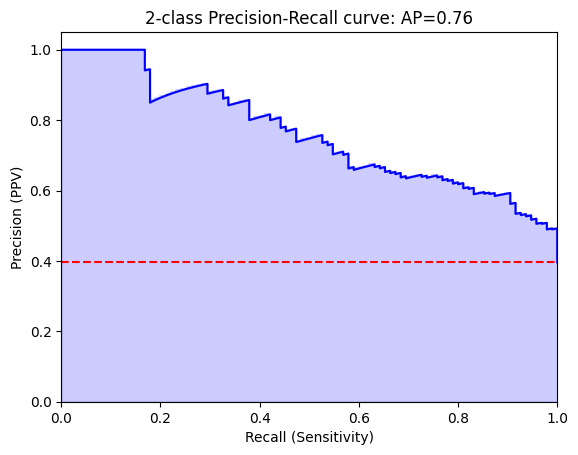

Threshold for best F1:
-2.060623
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[86 59]
 [ 9 86]]


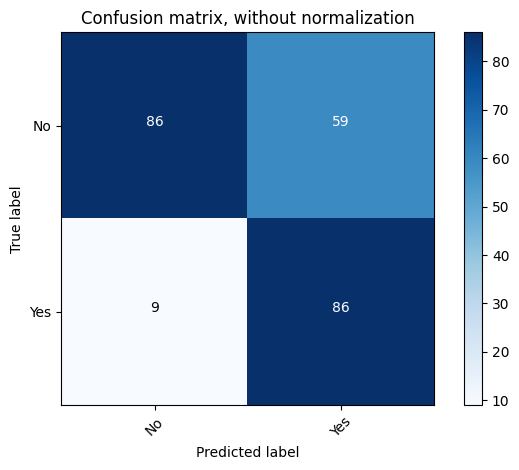

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.59      0.72       145
         Yes       0.59      0.91      0.72        95

    accuracy                           0.72       240
   macro avg       0.75      0.75      0.72       240
weighted avg       0.78      0.72      0.72       240

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[145   0]
 [ 87   8]]


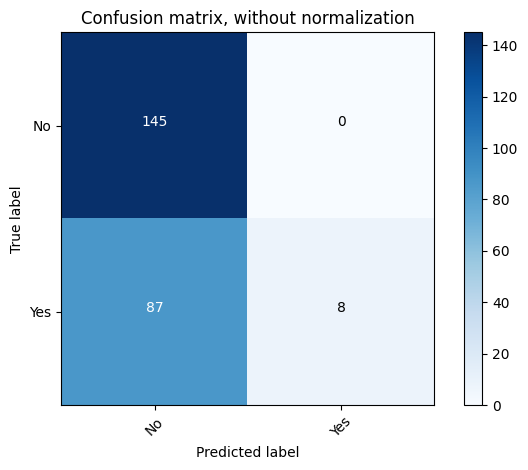

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.62      1.00      0.77       145
         Yes       1.00      0.08      0.16        95

    accuracy                           0.64       240
   macro avg       0.81      0.54      0.46       240
weighted avg       0.77      0.64      0.53       240



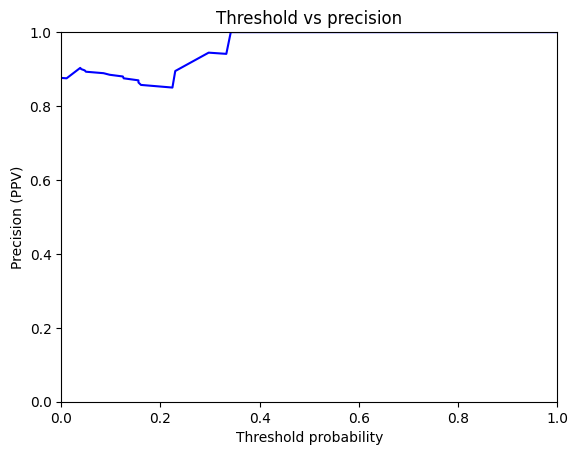

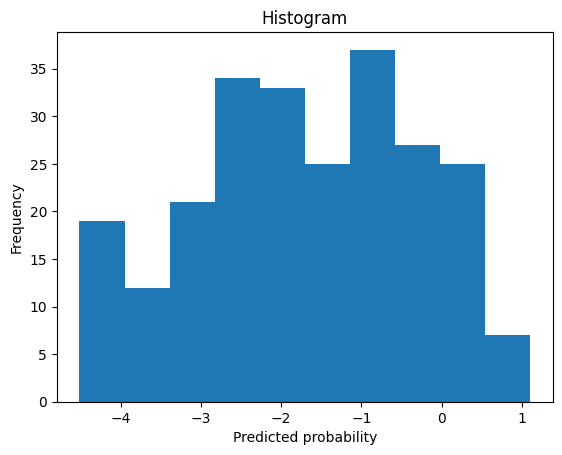

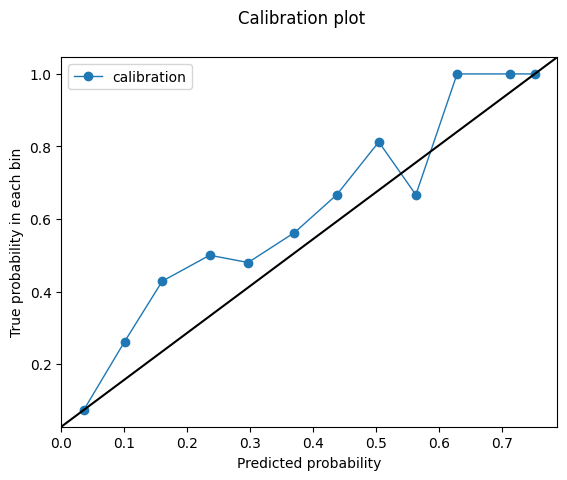

-2.060623
test set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.7363977485928705
Outcome probability: 0.32231404958677684
Average precision score: 0.57
Best F1: 0.6194690265486726


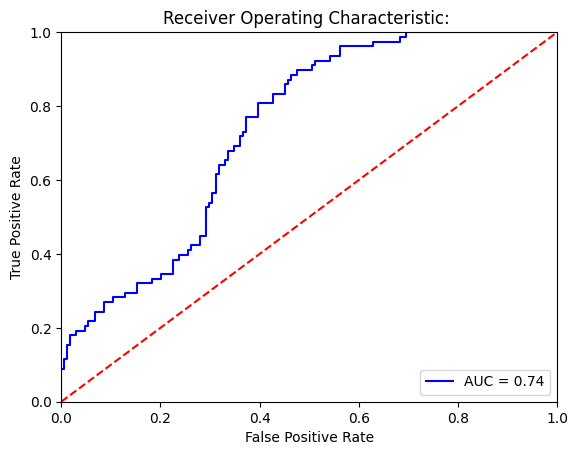

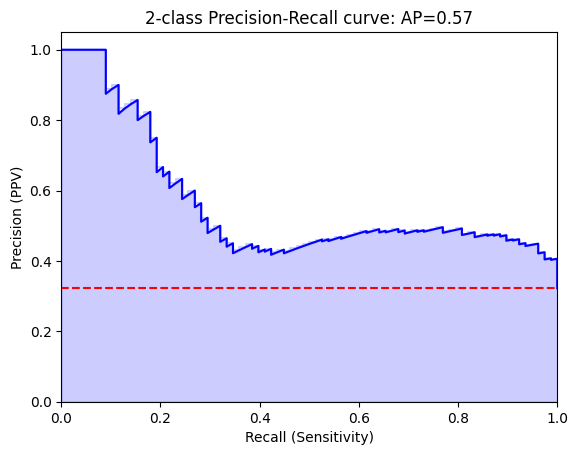

Threshold for best F1:
-1.2800927
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[86 78]
 [ 8 70]]


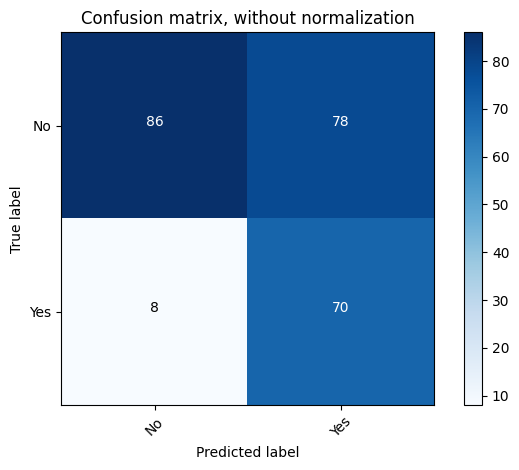

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.52      0.67       164
         Yes       0.47      0.90      0.62        78

    accuracy                           0.64       242
   macro avg       0.69      0.71      0.64       242
weighted avg       0.77      0.64      0.65       242

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[121  43]
 [ 45  33]]


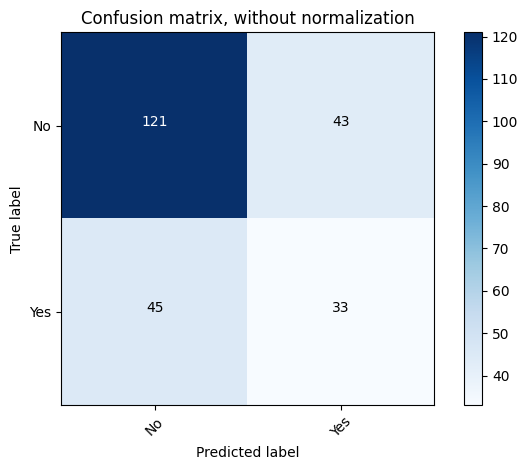

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.73      0.74      0.73       164
         Yes       0.43      0.42      0.43        78

    accuracy                           0.64       242
   macro avg       0.58      0.58      0.58       242
weighted avg       0.63      0.64      0.64       242



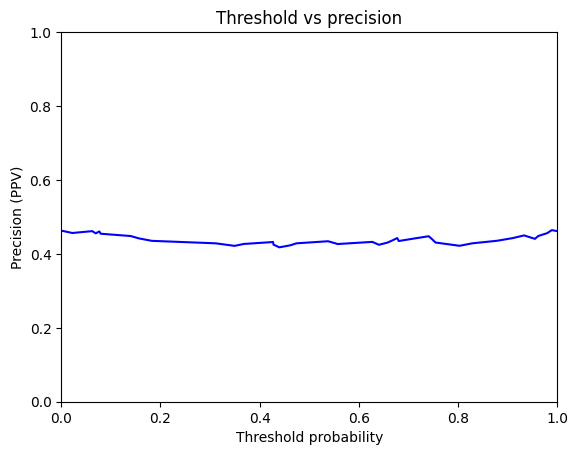

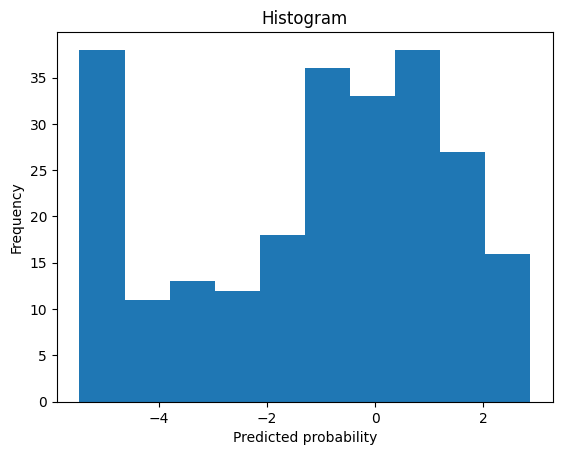

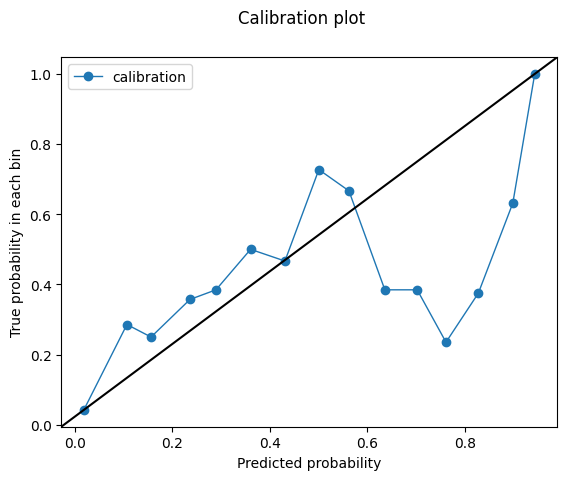

-1.2800927
test set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.7310037523452158
Outcome probability: 0.32231404958677684
Average precision score: 0.53
Best F1: 0.6261682242990654


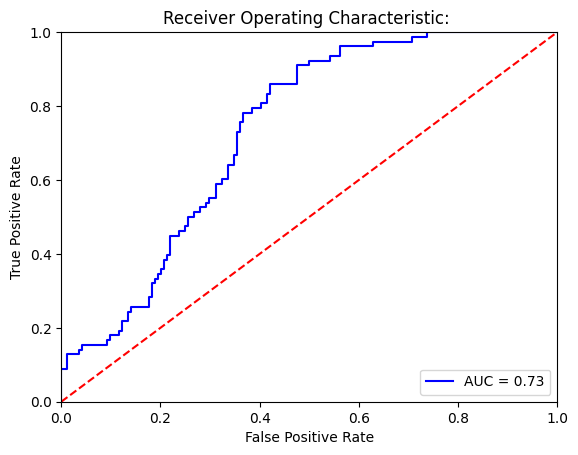

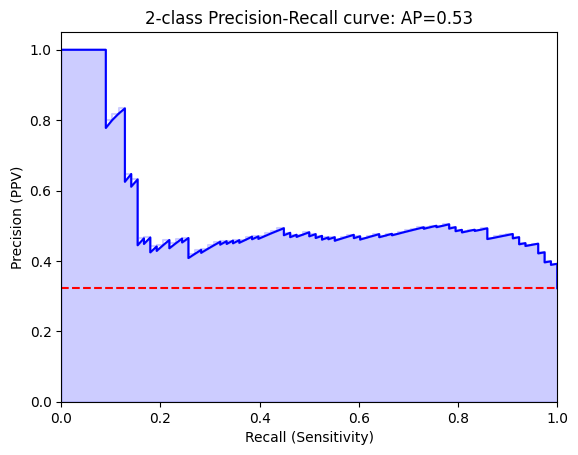

Threshold for best F1:
-0.45606697
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[95 69]
 [11 67]]


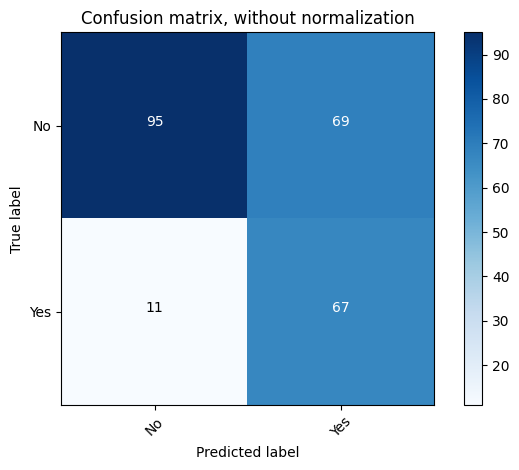

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.58      0.70       164
         Yes       0.49      0.86      0.63        78

    accuracy                           0.67       242
   macro avg       0.69      0.72      0.66       242
weighted avg       0.77      0.67      0.68       242

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[120  44]
 [ 38  40]]


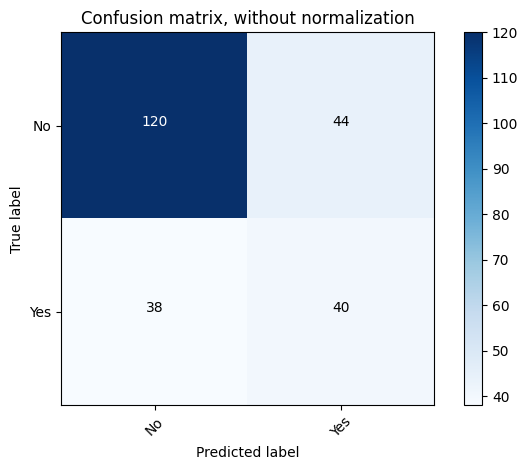

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.76      0.73      0.75       164
         Yes       0.48      0.51      0.49        78

    accuracy                           0.66       242
   macro avg       0.62      0.62      0.62       242
weighted avg       0.67      0.66      0.66       242



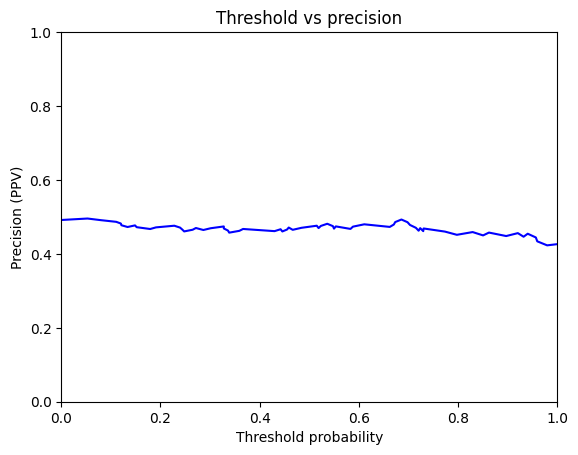

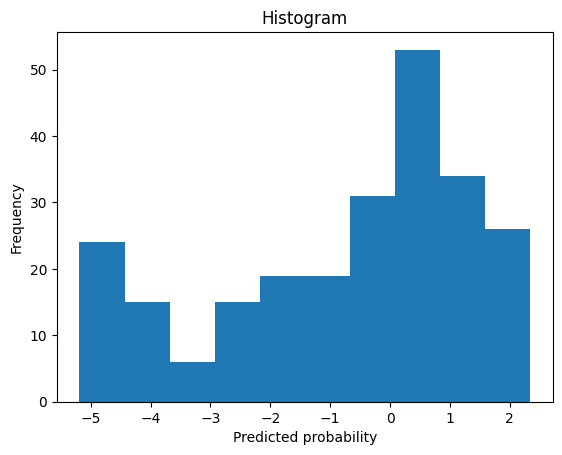

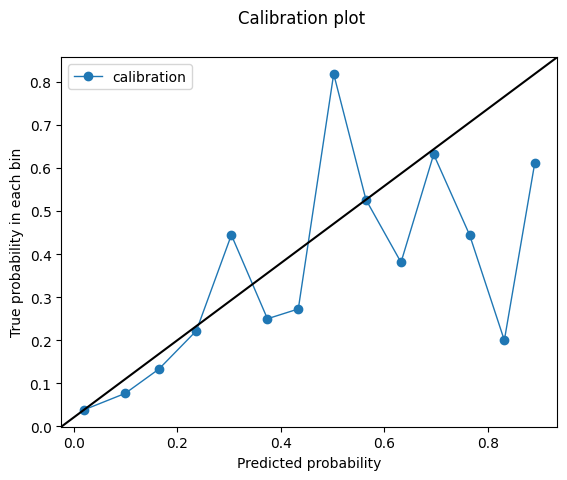

-0.45606697
test set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.6665103189493433
Outcome probability: 0.32231404958677684
Average precision score: 0.45
Best F1: 0.5761316872427984


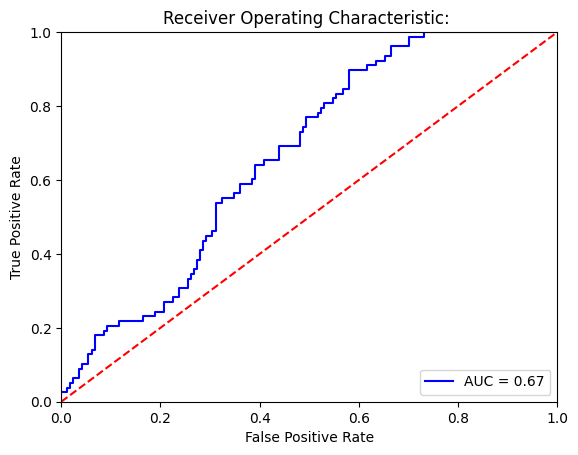

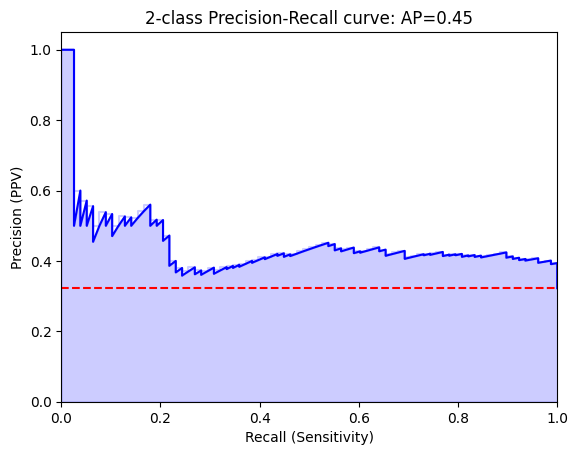

Threshold for best F1:
-1.7209733
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[69 95]
 [ 8 70]]


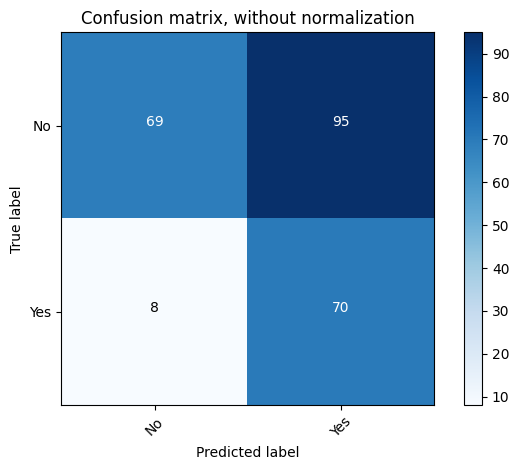

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.42      0.57       164
         Yes       0.42      0.90      0.58        78

    accuracy                           0.57       242
   macro avg       0.66      0.66      0.57       242
weighted avg       0.74      0.57      0.57       242

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[148  16]
 [ 62  16]]


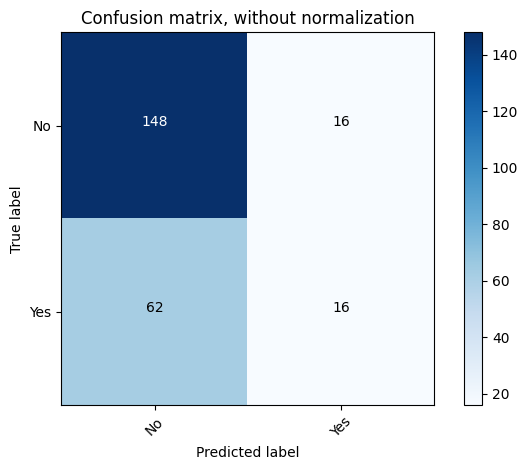

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.70      0.90      0.79       164
         Yes       0.50      0.21      0.29        78

    accuracy                           0.68       242
   macro avg       0.60      0.55      0.54       242
weighted avg       0.64      0.68      0.63       242



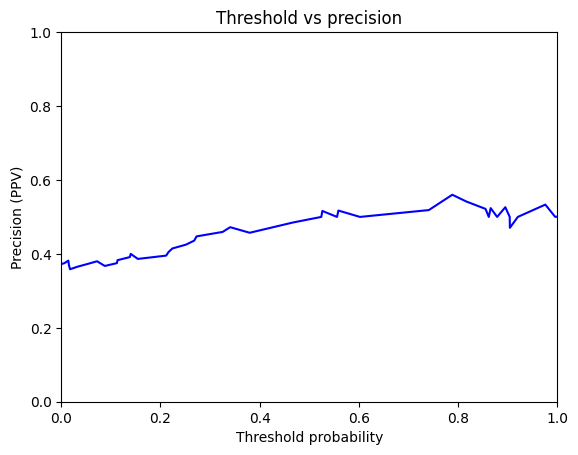

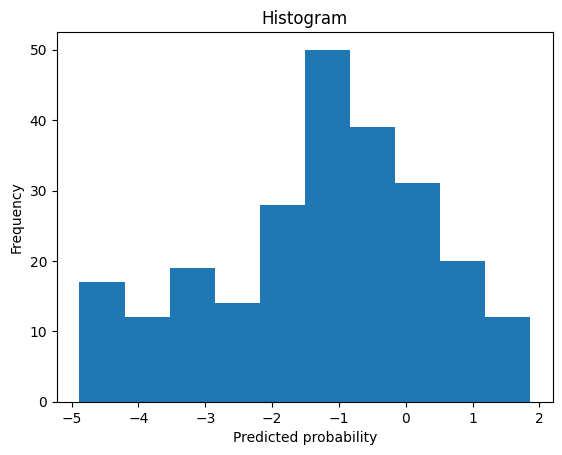

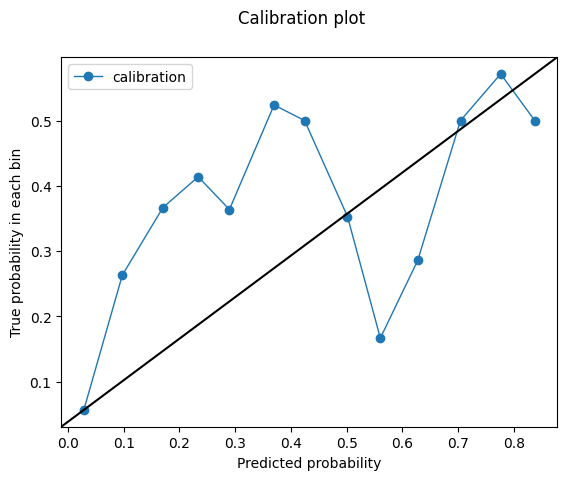

-1.7209733
test set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.7266260162601625
Outcome probability: 0.32231404958677684
Average precision score: 0.51
Best F1: 0.5803571428571429


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


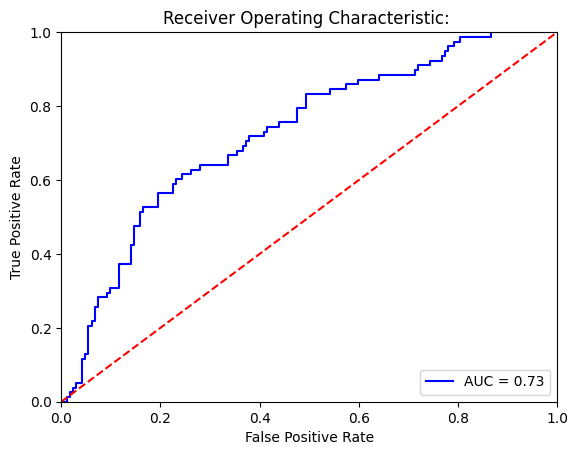

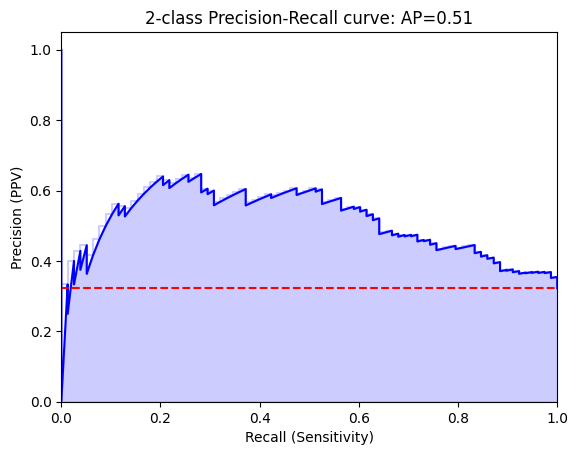

Threshold for best F1:
1.7776073
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[162   2]
 [ 78   0]]


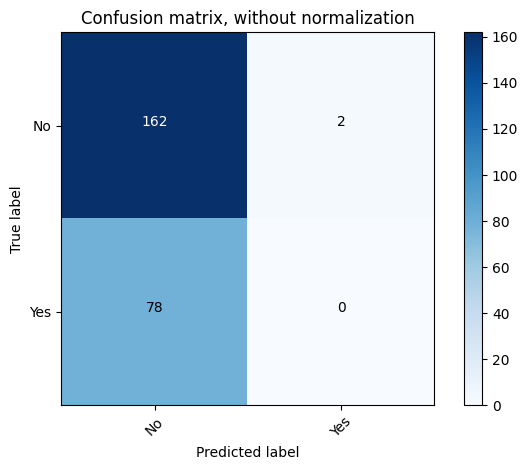

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.68      0.99      0.80       164
         Yes       0.00      0.00      0.00        78

    accuracy                           0.67       242
   macro avg       0.34      0.49      0.40       242
weighted avg       0.46      0.67      0.54       242

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[161   3]
 [ 77   1]]


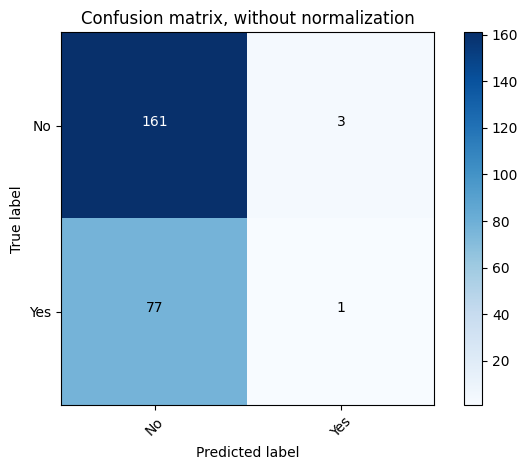

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.68      0.98      0.80       164
         Yes       0.25      0.01      0.02        78

    accuracy                           0.67       242
   macro avg       0.46      0.50      0.41       242
weighted avg       0.54      0.67      0.55       242



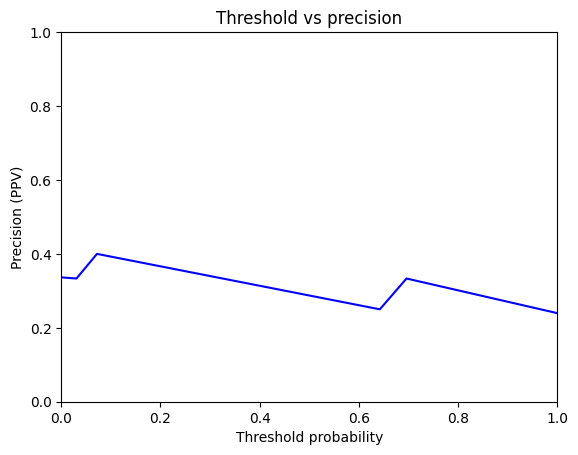

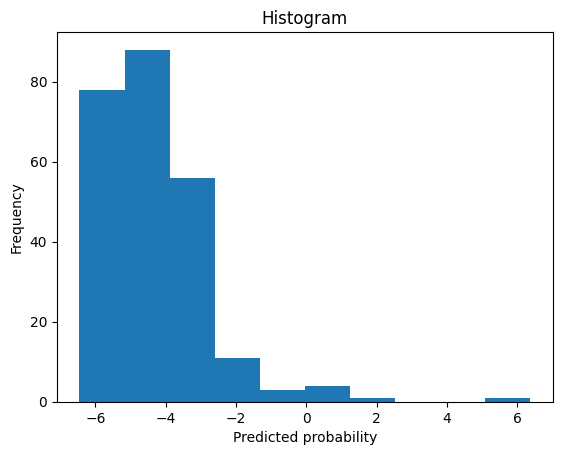

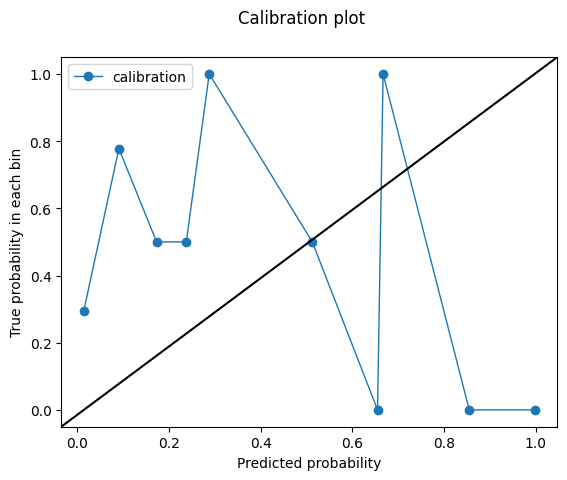

1.7776073
test set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.66635397123202
Outcome probability: 0.32231404958677684
Average precision score: 0.43
Best F1: 0.5769230769230769


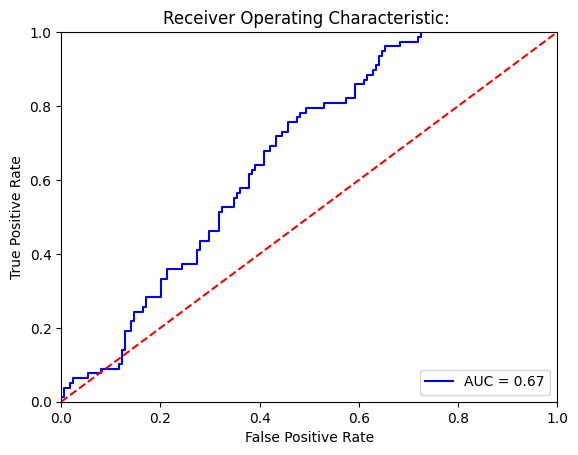

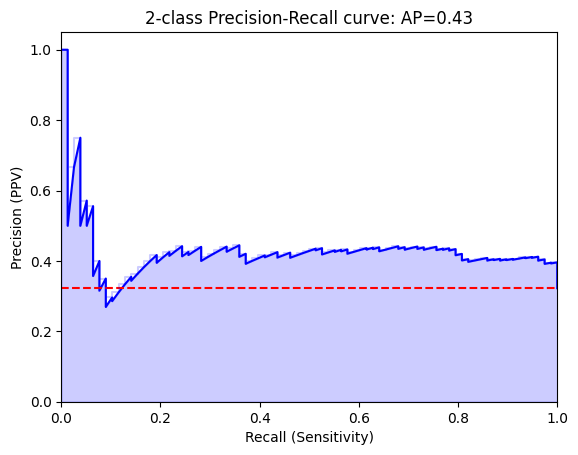

Threshold for best F1:
-2.6919363
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[ 57 107]
 [  3  75]]


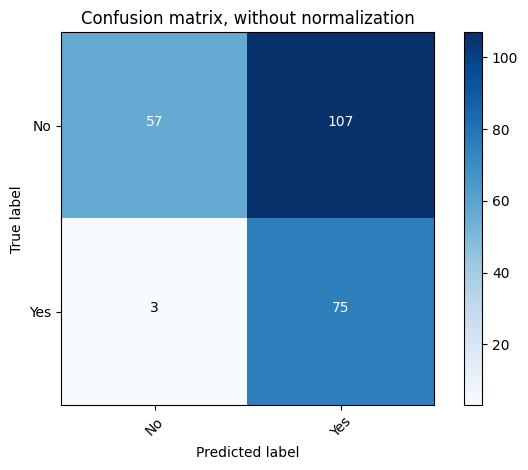

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.95      0.35      0.51       164
         Yes       0.41      0.96      0.58        78

    accuracy                           0.55       242
   macro avg       0.68      0.65      0.54       242
weighted avg       0.78      0.55      0.53       242

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[160   4]
 [ 74   4]]


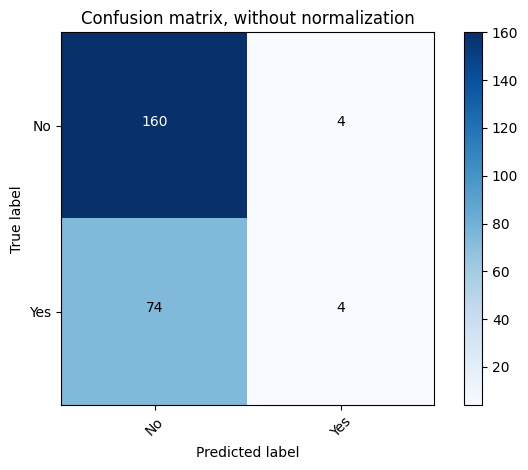

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.68      0.98      0.80       164
         Yes       0.50      0.05      0.09        78

    accuracy                           0.68       242
   macro avg       0.59      0.51      0.45       242
weighted avg       0.62      0.68      0.57       242



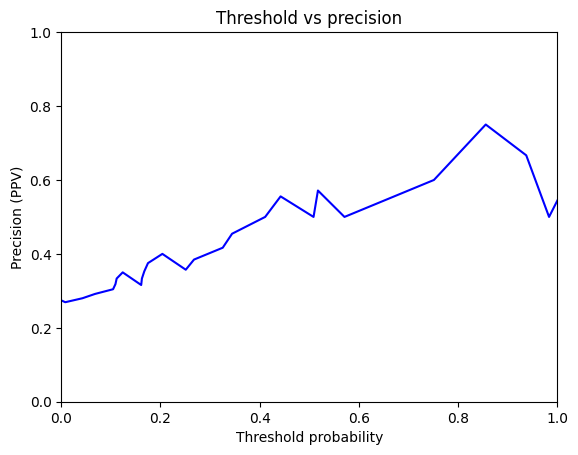

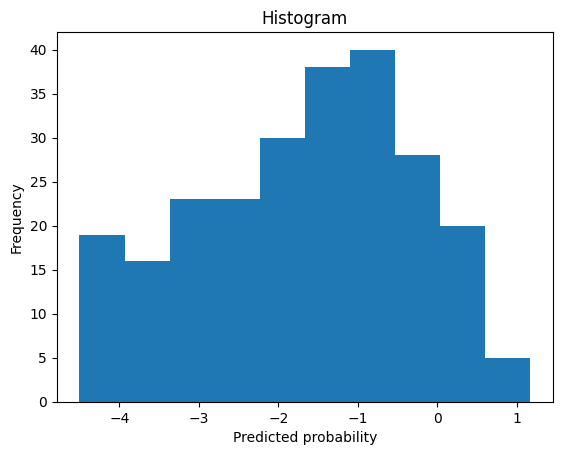

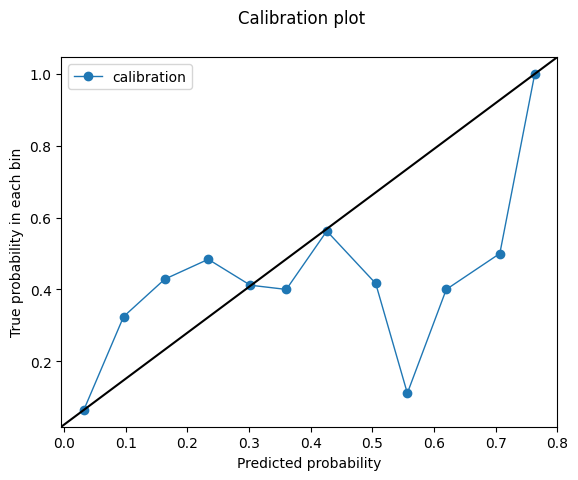

-2.6919363
test set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.9522019334049409
Outcome probability: 0.9047619047619048
Average precision score: 0.99
Best F1: 0.9735849056603774


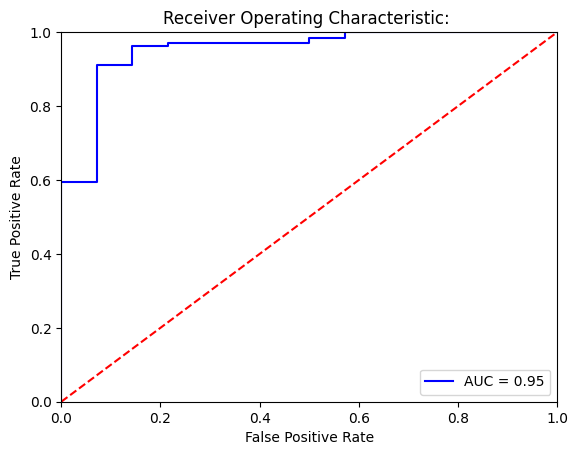

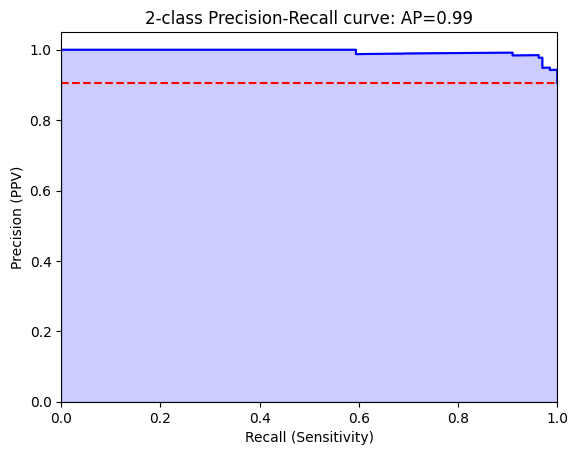

Threshold for best F1:
-0.32256693
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[ 11   3]
 [  4 129]]


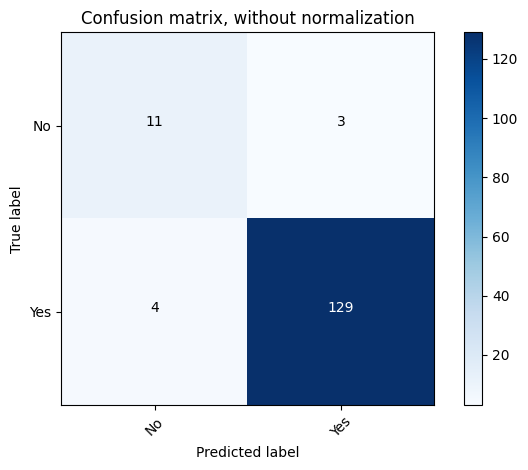

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.73      0.79      0.76        14
         Yes       0.98      0.97      0.97       133

    accuracy                           0.95       147
   macro avg       0.86      0.88      0.87       147
weighted avg       0.95      0.95      0.95       147

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[ 12   2]
 [  7 126]]


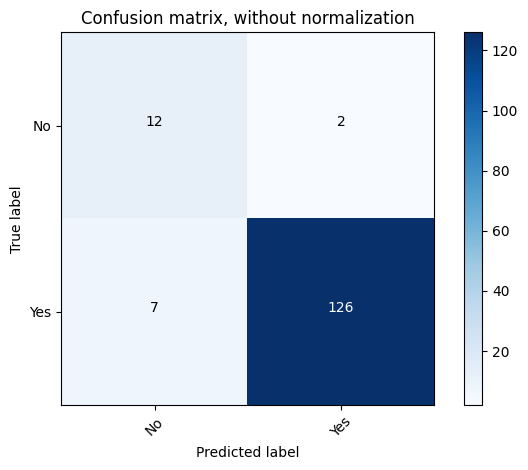

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.63      0.86      0.73        14
         Yes       0.98      0.95      0.97       133

    accuracy                           0.94       147
   macro avg       0.81      0.90      0.85       147
weighted avg       0.95      0.94      0.94       147



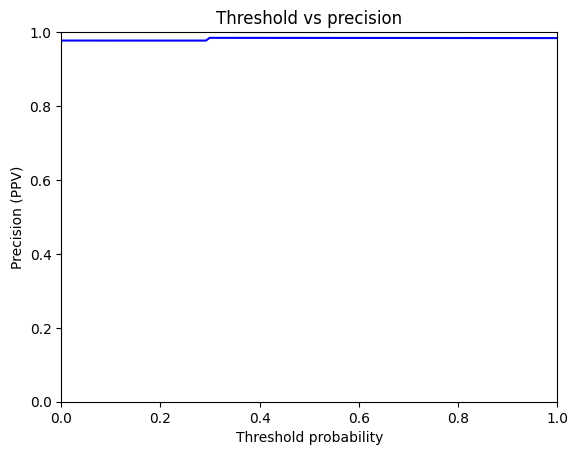

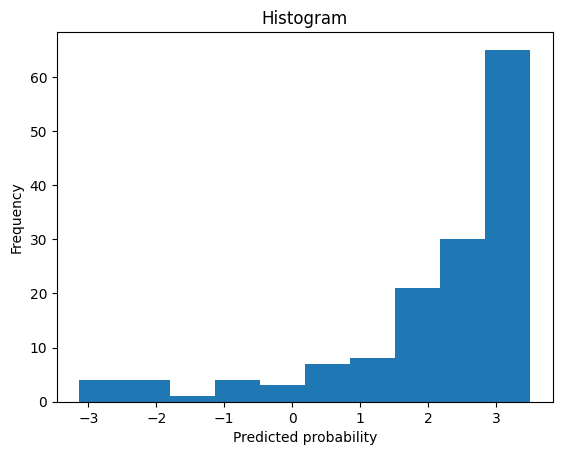

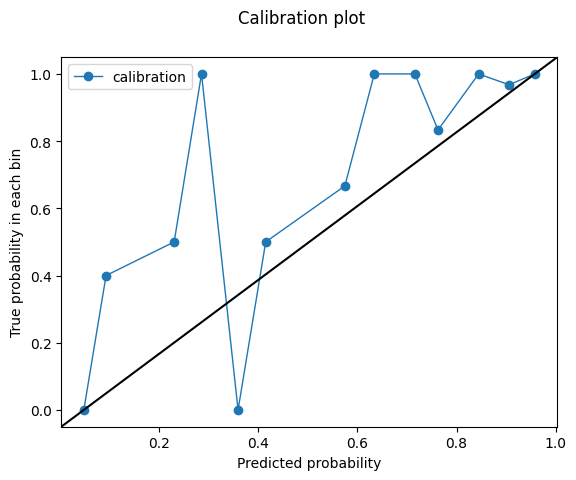

-0.32256693
test set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.9017185821697099
Outcome probability: 0.9047619047619048
Average precision score: 0.98
Best F1: 0.9737827715355805


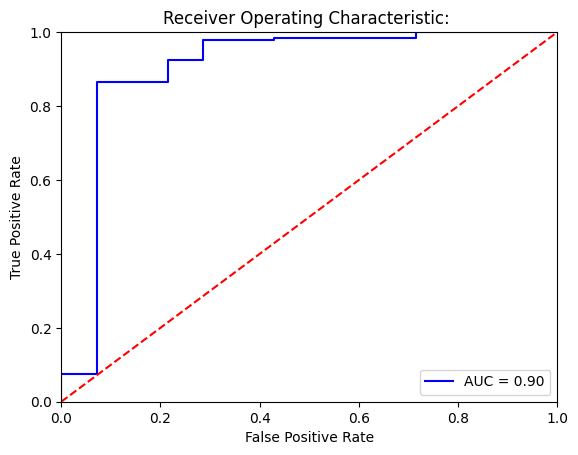

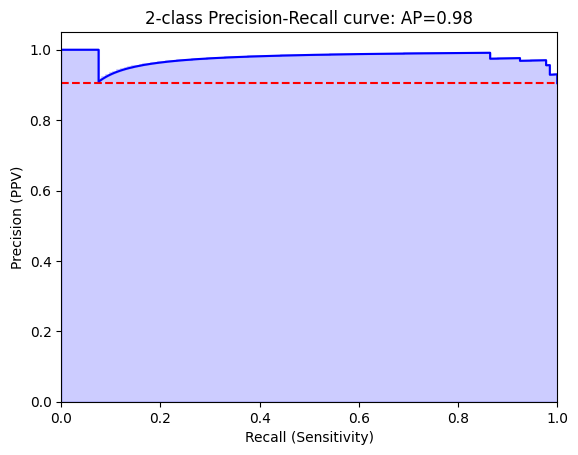

Threshold for best F1:
-0.23971593
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[ 10   4]
 [  3 130]]


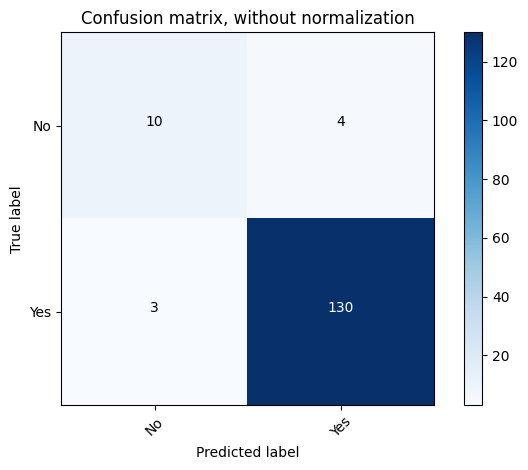

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.77      0.71      0.74        14
         Yes       0.97      0.98      0.97       133

    accuracy                           0.95       147
   macro avg       0.87      0.85      0.86       147
weighted avg       0.95      0.95      0.95       147

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[ 11   3]
 [ 13 120]]


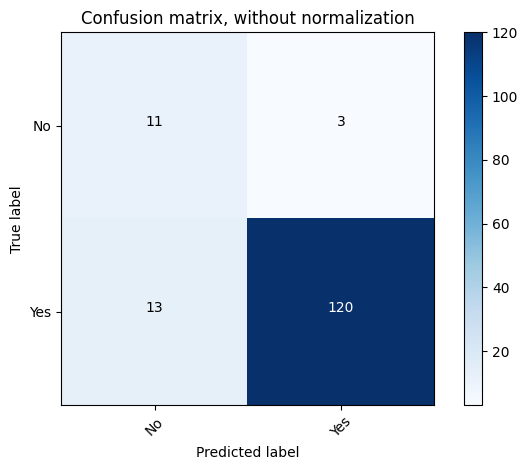

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.46      0.79      0.58        14
         Yes       0.98      0.90      0.94       133

    accuracy                           0.89       147
   macro avg       0.72      0.84      0.76       147
weighted avg       0.93      0.89      0.90       147



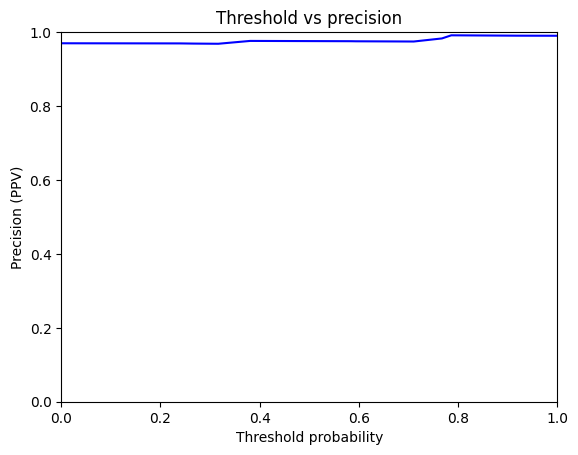

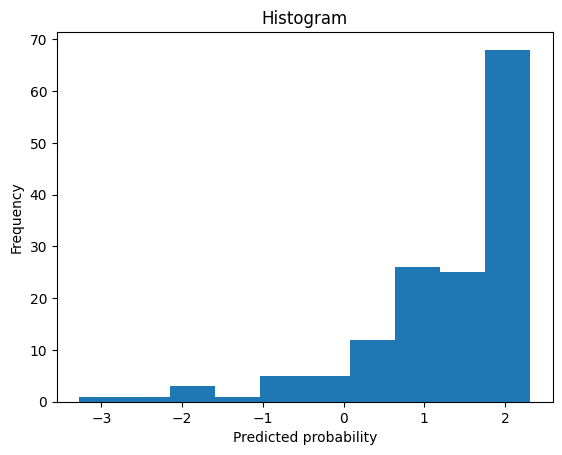

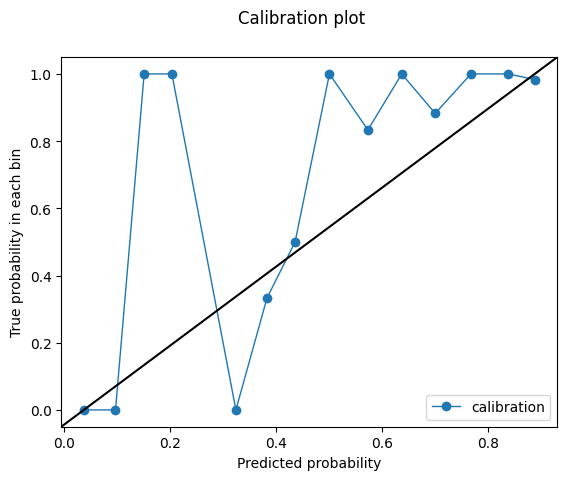

-0.23971593
test set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.8458646616541353
Outcome probability: 0.9047619047619048
Average precision score: 0.98
Best F1: 0.9558823529411764


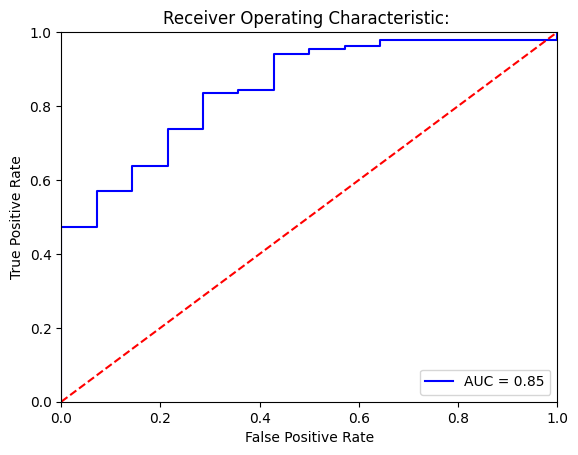

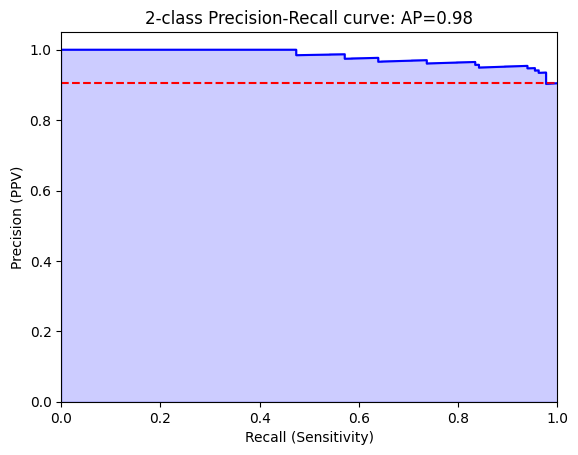

Threshold for best F1:
-2.0945308
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[  5   9]
 [  3 130]]


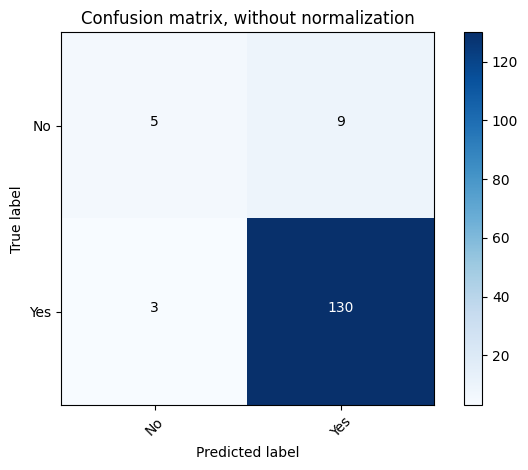

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.62      0.36      0.45        14
         Yes       0.94      0.98      0.96       133

    accuracy                           0.92       147
   macro avg       0.78      0.67      0.71       147
weighted avg       0.91      0.92      0.91       147

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[11  3]
 [37 96]]


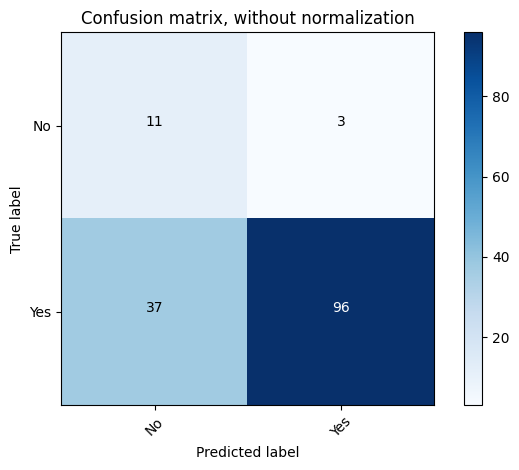

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.23      0.79      0.35        14
         Yes       0.97      0.72      0.83       133

    accuracy                           0.73       147
   macro avg       0.60      0.75      0.59       147
weighted avg       0.90      0.73      0.78       147



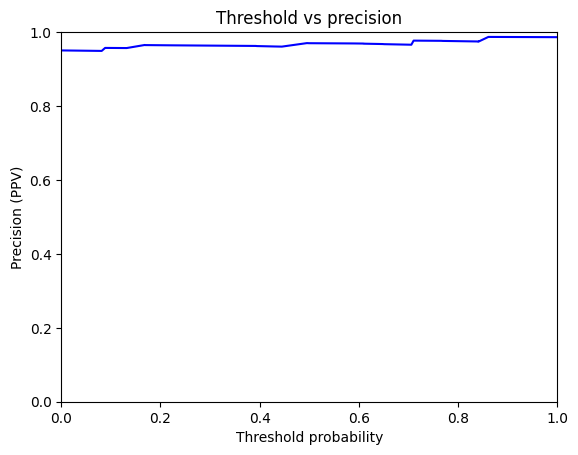

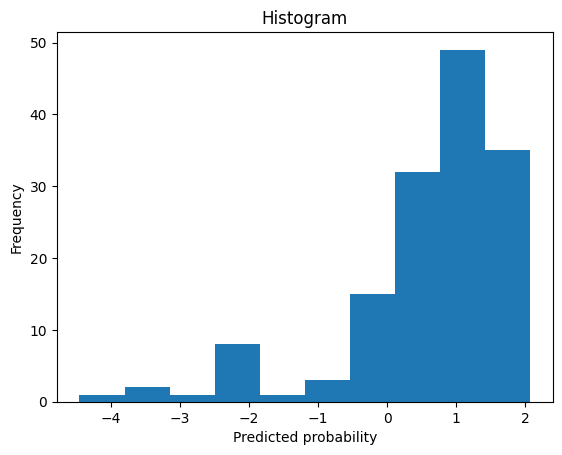

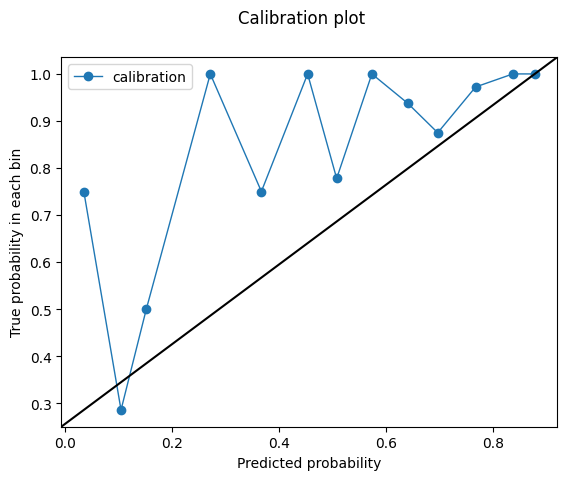

-2.0945308
test set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.391514500537057
Outcome probability: 0.9047619047619048
Average precision score: 0.87
Best F1: 0.9500000000000001


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


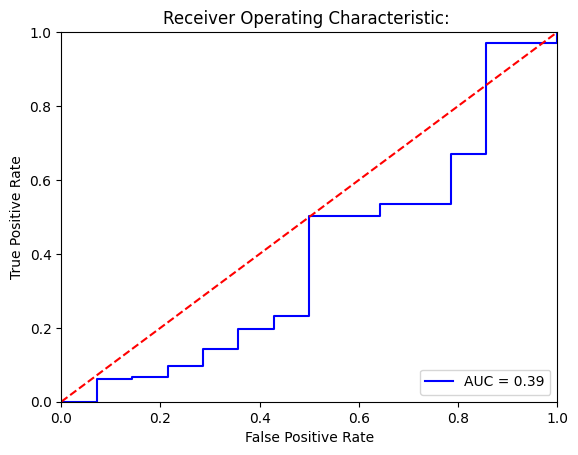

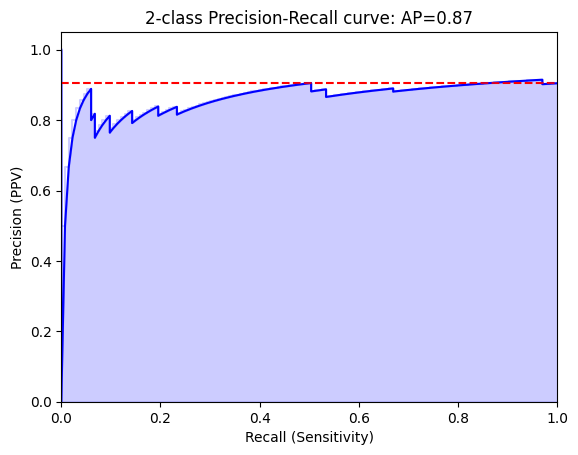

Threshold for best F1:
6.273619
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[ 13   1]
 [133   0]]


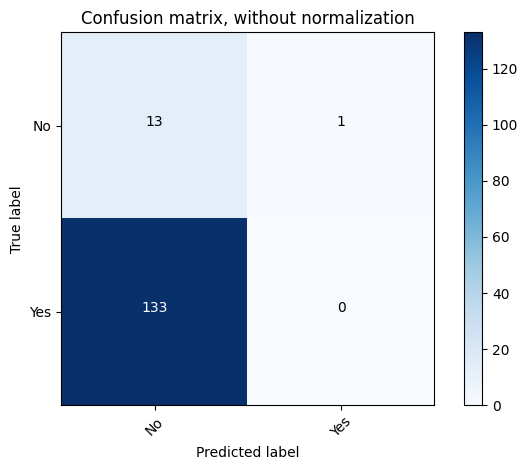

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.09      0.93      0.16        14
         Yes       0.00      0.00      0.00       133

    accuracy                           0.09       147
   macro avg       0.04      0.46      0.08       147
weighted avg       0.01      0.09      0.02       147

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[ 13   1]
 [128   5]]


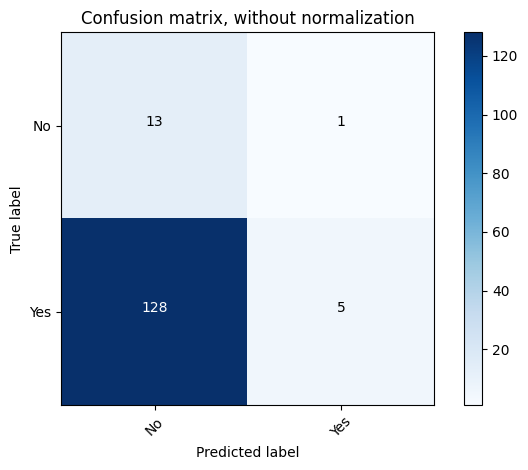

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.09      0.93      0.17        14
         Yes       0.83      0.04      0.07       133

    accuracy                           0.12       147
   macro avg       0.46      0.48      0.12       147
weighted avg       0.76      0.12      0.08       147



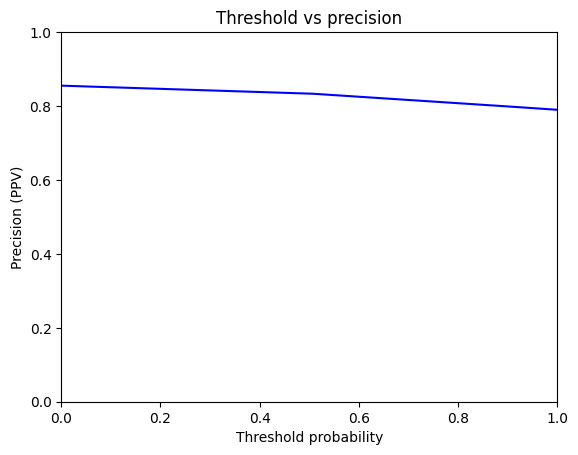

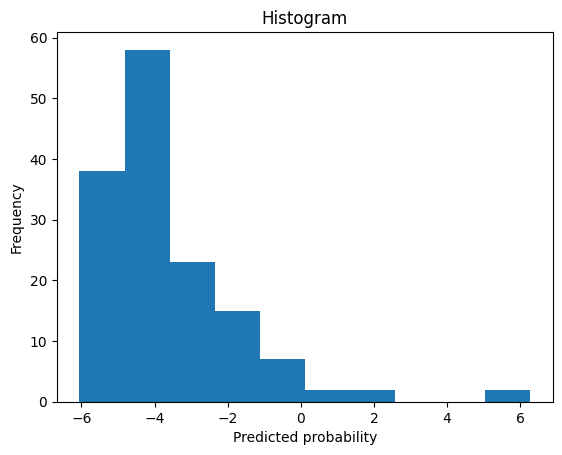

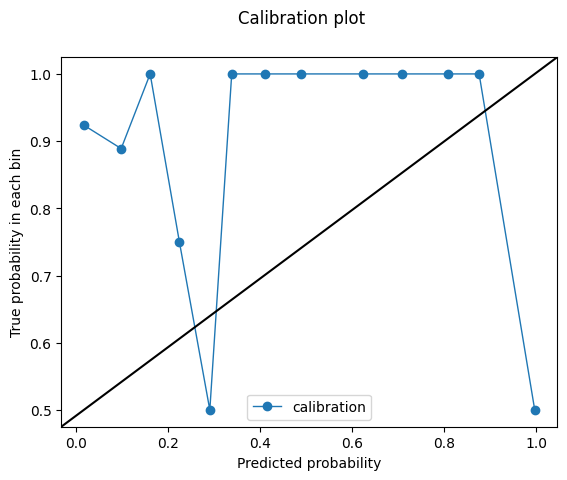

6.273619
test set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.8856068743286788
Outcome probability: 0.9047619047619048
Average precision score: 0.98
Best F1: 0.974169741697417


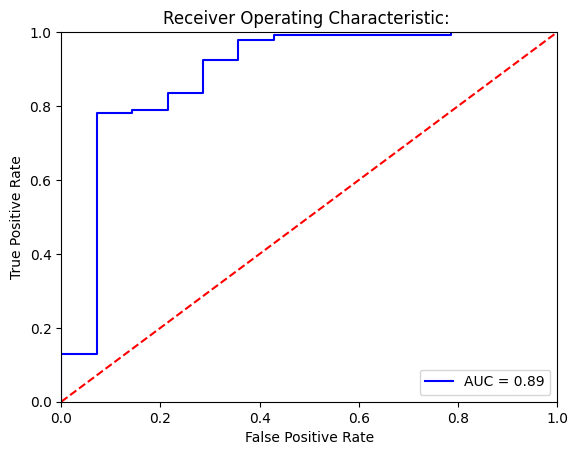

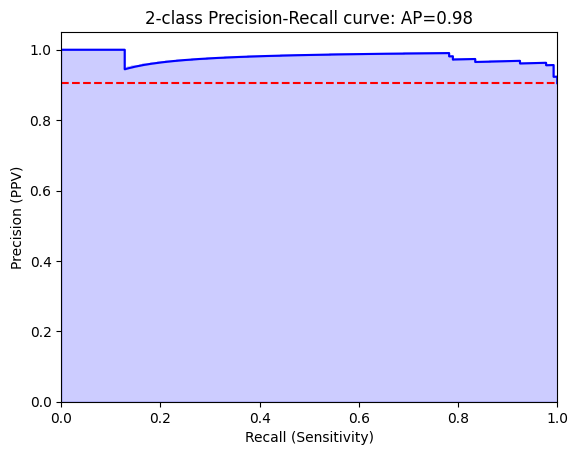

Threshold for best F1:
-1.8704717
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[  8   6]
 [  1 132]]


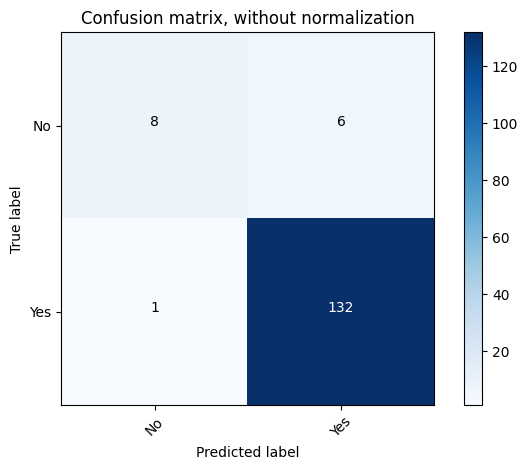

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.57      0.70        14
         Yes       0.96      0.99      0.97       133

    accuracy                           0.95       147
   macro avg       0.92      0.78      0.83       147
weighted avg       0.95      0.95      0.95       147

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[13  1]
 [78 55]]


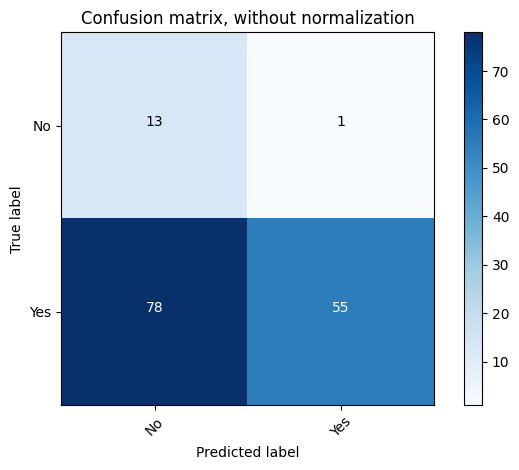

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.14      0.93      0.25        14
         Yes       0.98      0.41      0.58       133

    accuracy                           0.46       147
   macro avg       0.56      0.67      0.41       147
weighted avg       0.90      0.46      0.55       147



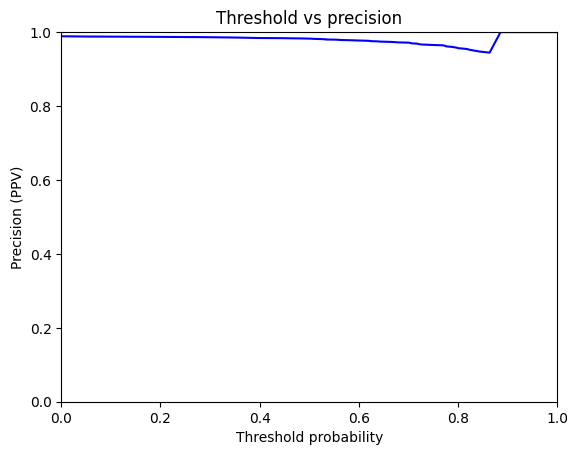

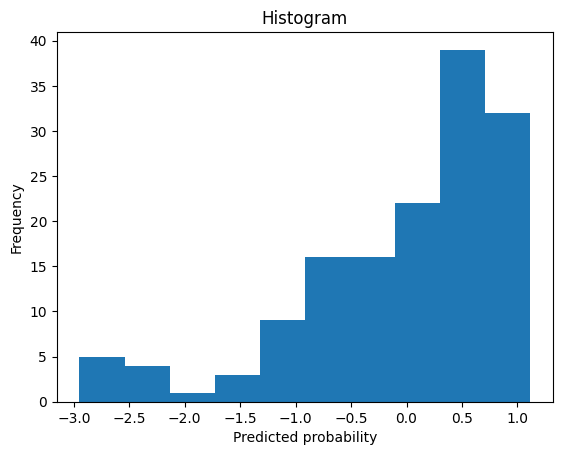

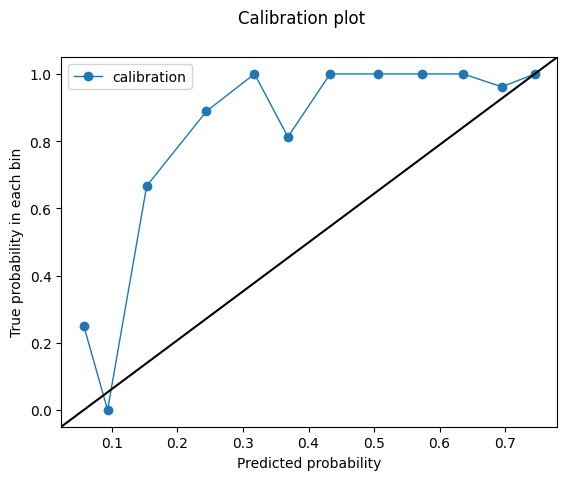

-1.8704717
test set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.8127272727272727
Outcome probability: 0.2268041237113402
Average precision score: 0.56
Best F1: 0.6249999999999999


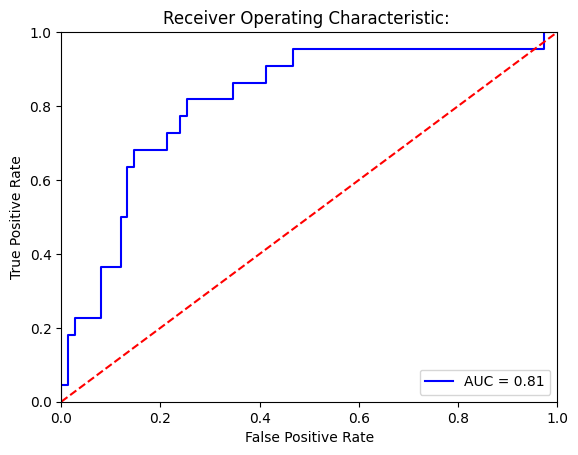

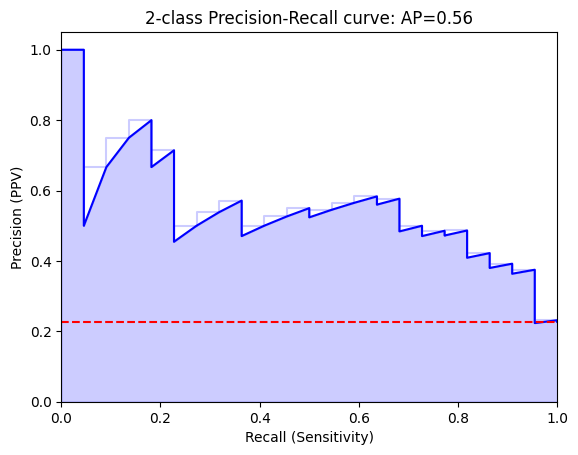

Threshold for best F1:
-0.9178839
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[64 11]
 [ 7 15]]


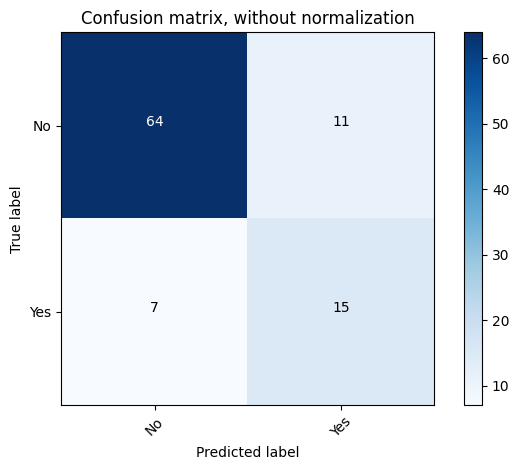

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.85      0.88        75
         Yes       0.58      0.68      0.62        22

    accuracy                           0.81        97
   macro avg       0.74      0.77      0.75        97
weighted avg       0.83      0.81      0.82        97

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[74  1]
 [19  3]]


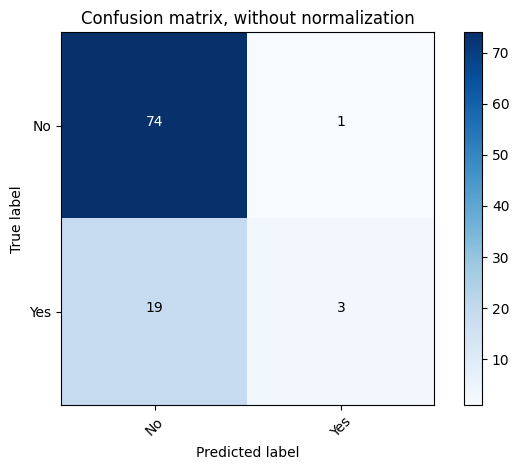

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.80      0.99      0.88        75
         Yes       0.75      0.14      0.23        22

    accuracy                           0.79        97
   macro avg       0.77      0.56      0.56        97
weighted avg       0.79      0.79      0.73        97



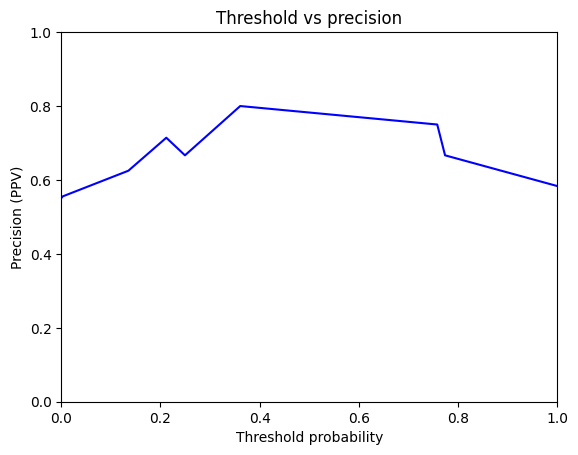

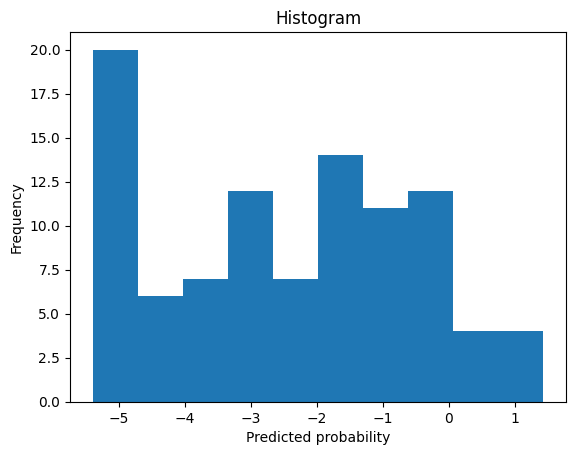

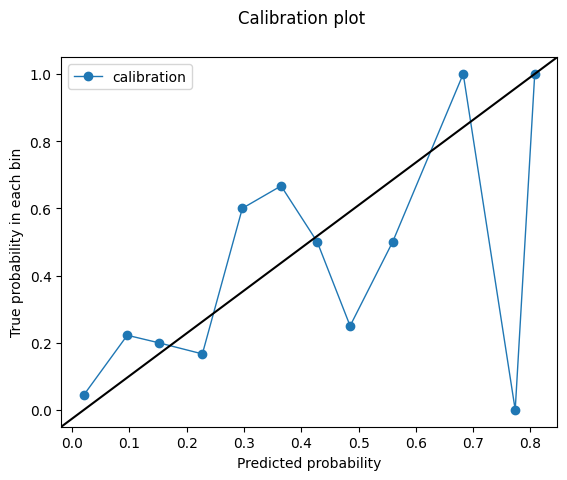

-0.9178839
test set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.7842424242424242
Outcome probability: 0.2268041237113402
Average precision score: 0.47
Best F1: 0.6


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


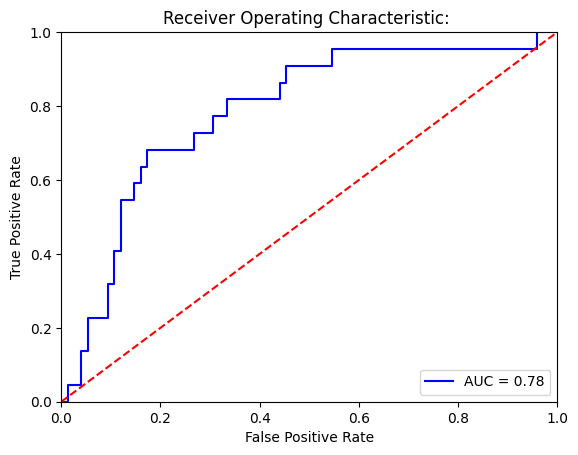

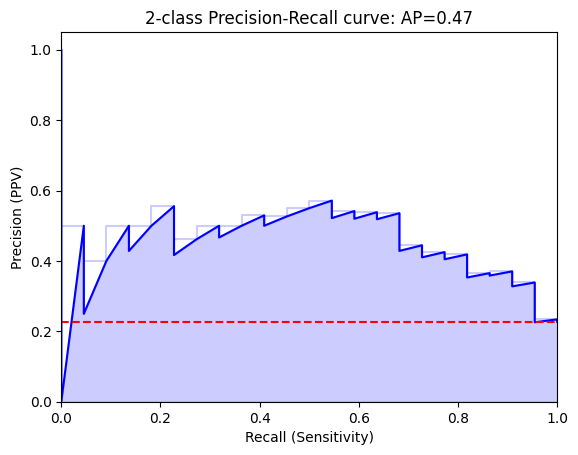

Threshold for best F1:
1.41776
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[74  1]
 [22  0]]


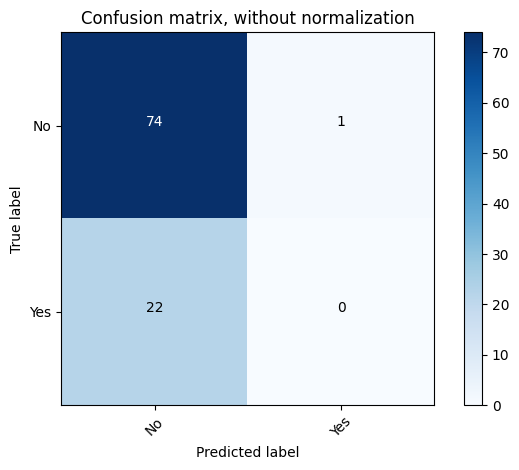

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.77      0.99      0.87        75
         Yes       0.00      0.00      0.00        22

    accuracy                           0.76        97
   macro avg       0.39      0.49      0.43        97
weighted avg       0.60      0.76      0.67        97

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[71  4]
 [18  4]]


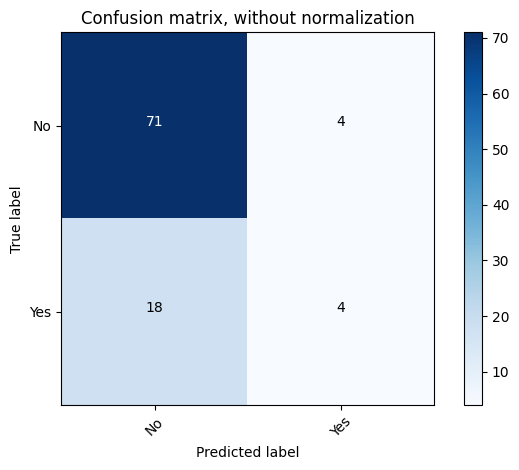

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.80      0.95      0.87        75
         Yes       0.50      0.18      0.27        22

    accuracy                           0.77        97
   macro avg       0.65      0.56      0.57        97
weighted avg       0.73      0.77      0.73        97



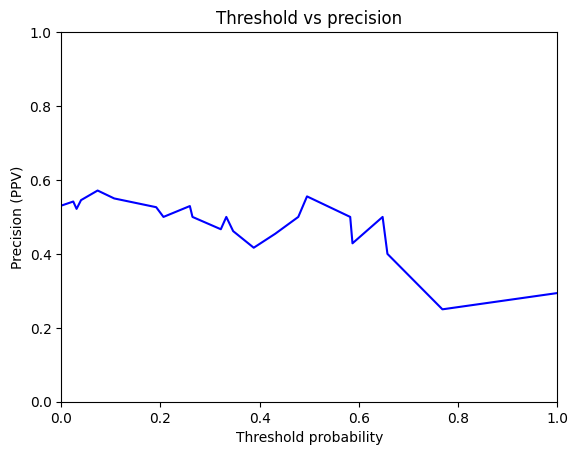

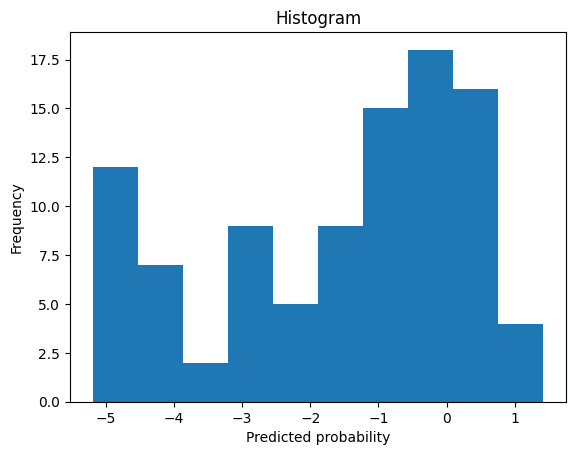

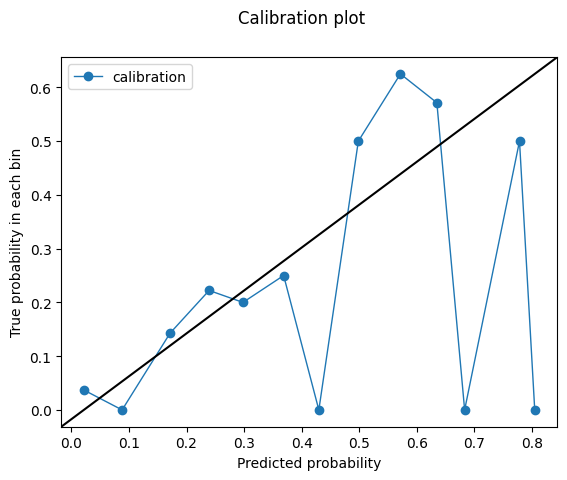

1.41776
test set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.6151515151515151
Outcome probability: 0.2268041237113402
Average precision score: 0.33
Best F1: 0.45000000000000007


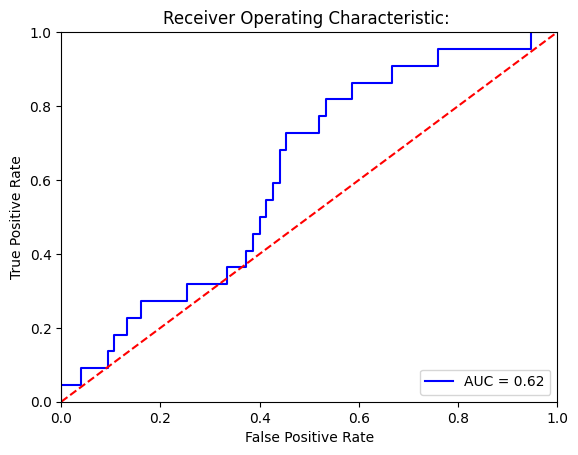

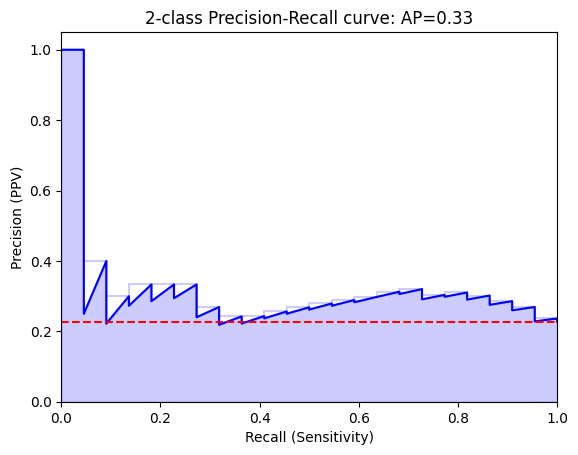

Threshold for best F1:
-2.3017378
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[35 40]
 [ 4 18]]


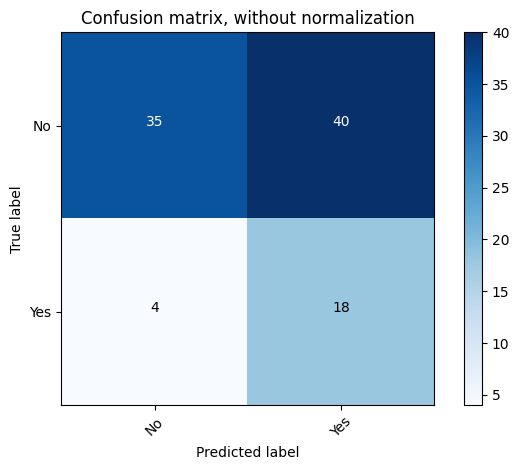

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.47      0.61        75
         Yes       0.31      0.82      0.45        22

    accuracy                           0.55        97
   macro avg       0.60      0.64      0.53        97
weighted avg       0.76      0.55      0.58        97

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[68  7]
 [20  2]]


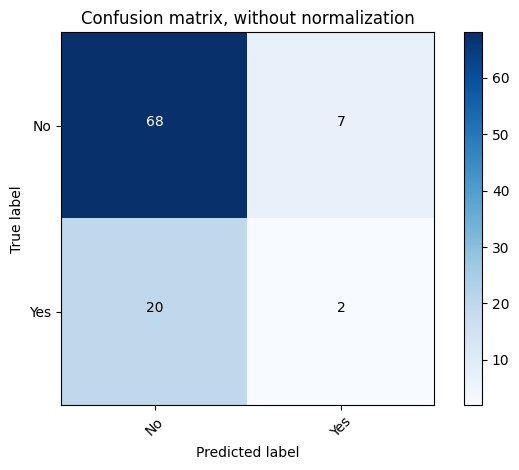

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.77      0.91      0.83        75
         Yes       0.22      0.09      0.13        22

    accuracy                           0.72        97
   macro avg       0.50      0.50      0.48        97
weighted avg       0.65      0.72      0.67        97



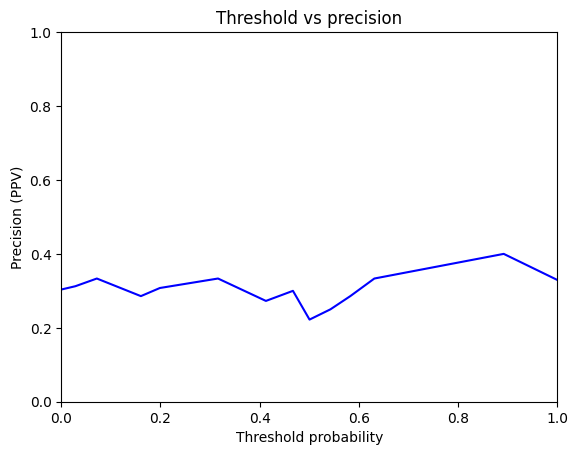

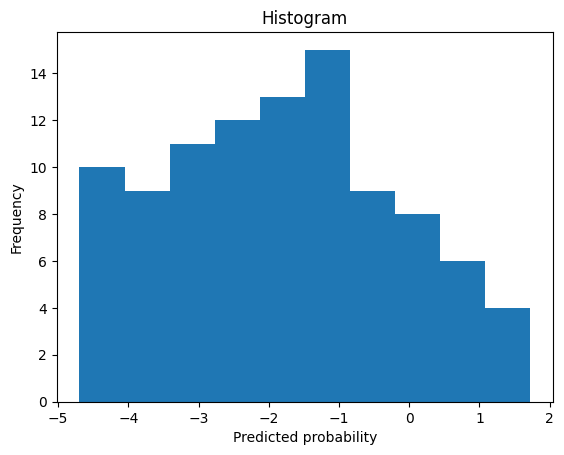

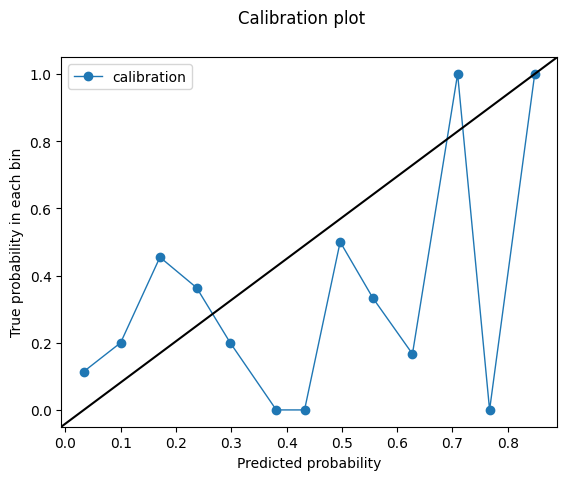

-2.3017378
test set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.64
Outcome probability: 0.2268041237113402
Average precision score: 0.32
Best F1: 0.48


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


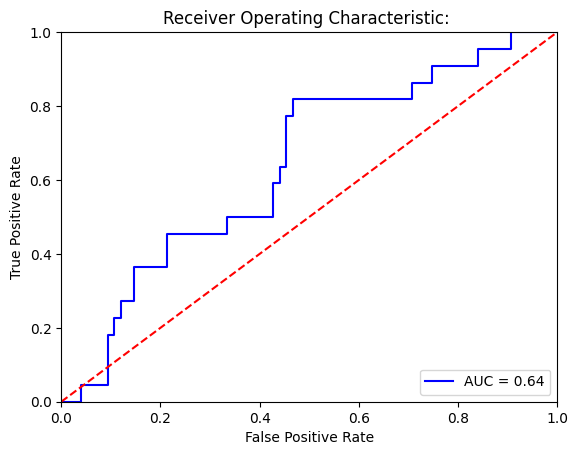

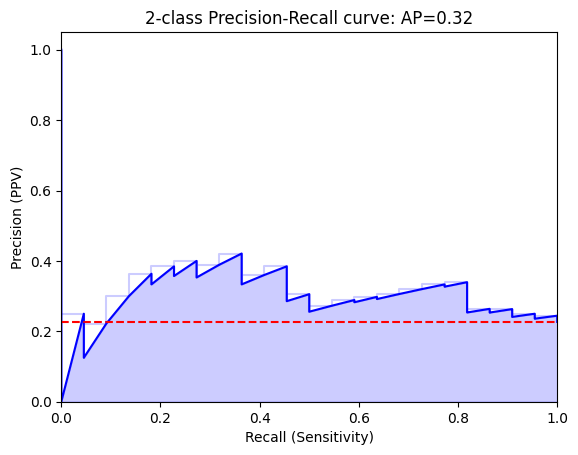

Threshold for best F1:
2.8850918
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[72  3]
 [22  0]]


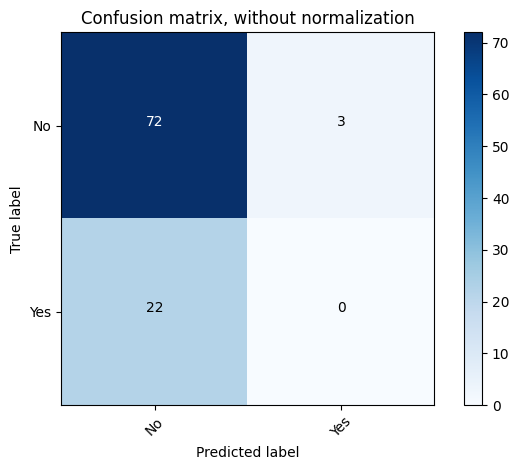

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.77      0.96      0.85        75
         Yes       0.00      0.00      0.00        22

    accuracy                           0.74        97
   macro avg       0.38      0.48      0.43        97
weighted avg       0.59      0.74      0.66        97

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[72  3]
 [21  1]]


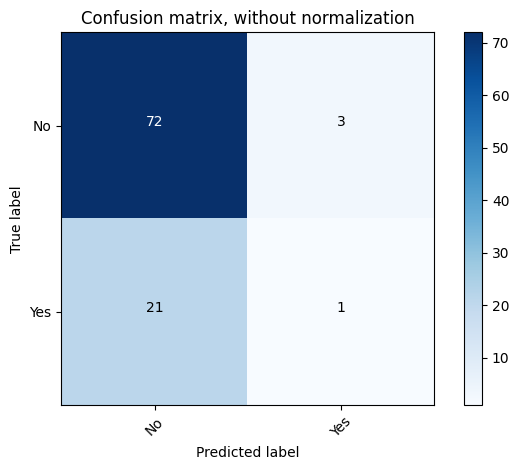

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.77      0.96      0.86        75
         Yes       0.25      0.05      0.08        22

    accuracy                           0.75        97
   macro avg       0.51      0.50      0.47        97
weighted avg       0.66      0.75      0.68        97



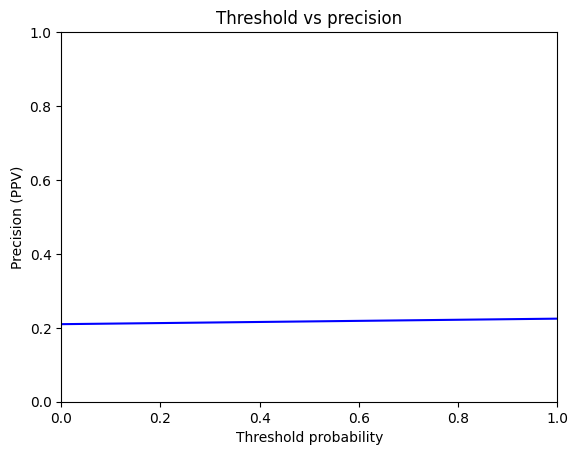

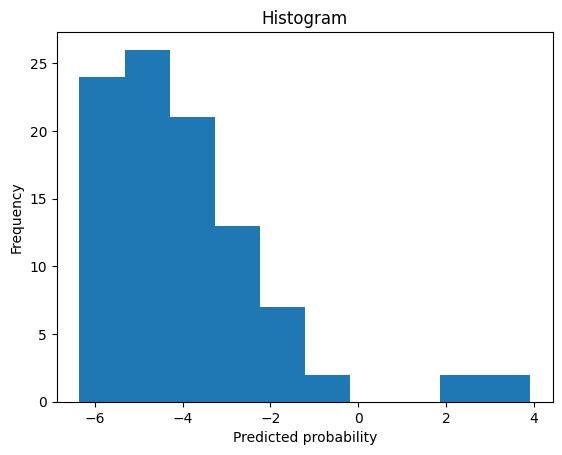

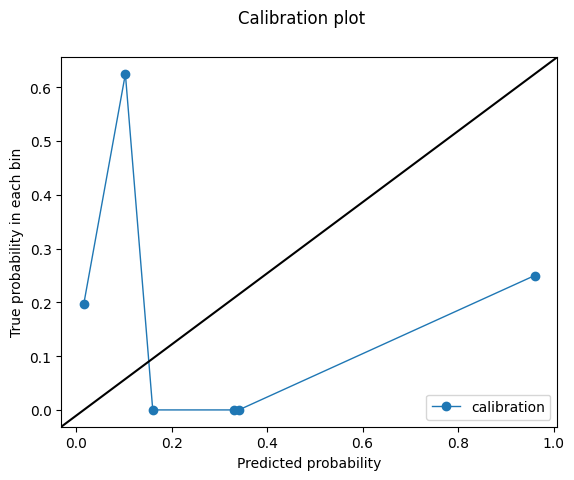

2.8850918
test set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/4153448764.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.7721212121212122
Outcome probability: 0.2268041237113402
Average precision score: 0.50
Best F1: 0.5454545454545454


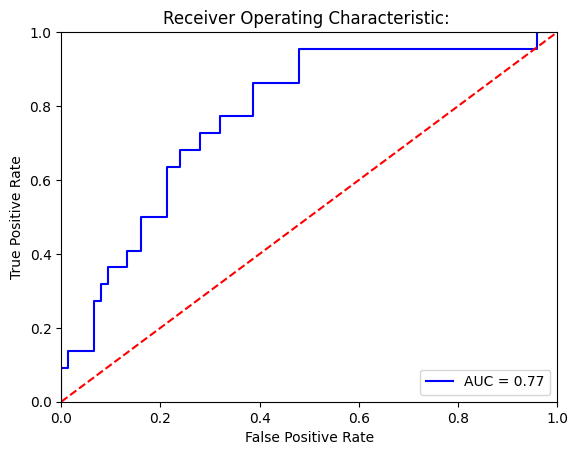

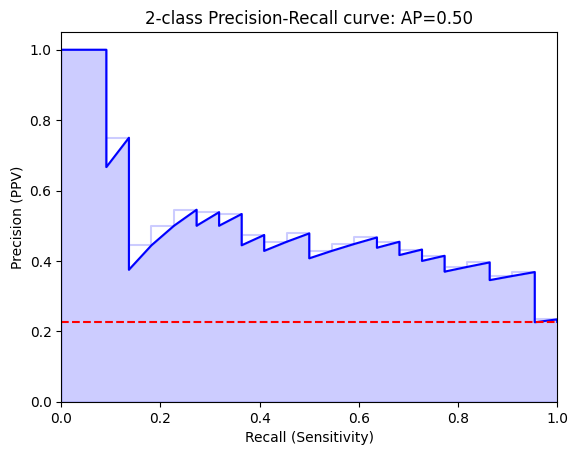

Threshold for best F1:
-1.4997799
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[57 18]
 [ 7 15]]


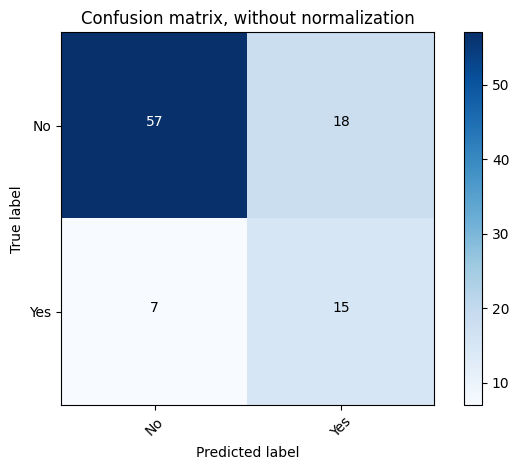

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.76      0.82        75
         Yes       0.45      0.68      0.55        22

    accuracy                           0.74        97
   macro avg       0.67      0.72      0.68        97
weighted avg       0.79      0.74      0.76        97

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[75  0]
 [21  1]]


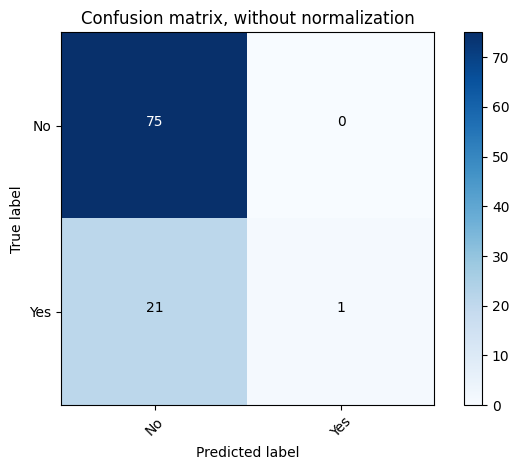

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.78      1.00      0.88        75
         Yes       1.00      0.05      0.09        22

    accuracy                           0.78        97
   macro avg       0.89      0.52      0.48        97
weighted avg       0.83      0.78      0.70        97



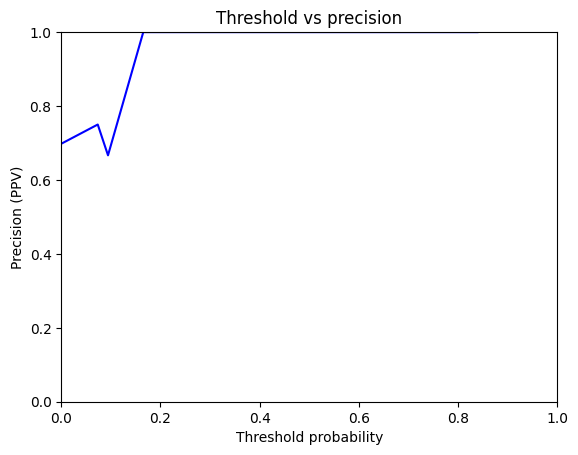

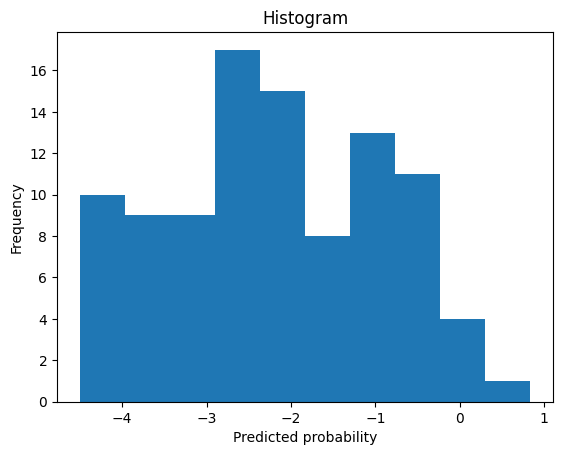

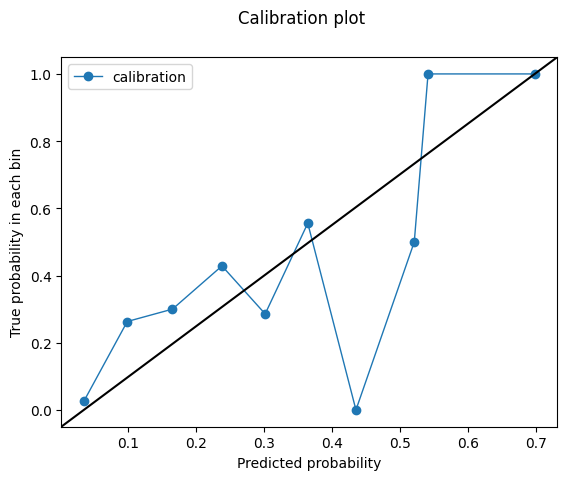

-1.4997799


In [32]:
for cancer_type in top_five_cancers:
    for model_type in model_paths:

        print('test set')
        
        print('cancer type')
        print(cancer_type)
        print('model type')
        print(model_type)
        test = test_full.copy()
        test = test[test.Condition == cancer_type]
        test_day_text = test
        test_day_text['text'] = test_day_text.text.astype(str)
    
        test_day_text = test_day_text.sort_values(by=['obs','dfci_mrn','time'])
    
        test_day_text['text'] = test_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
        test_day_text = test_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
        #test_day_text.info()
    
        # write out actual test dataset
        themodel = RecistModel()
        themodel.load_state_dict(torch.load(model_type))
        themodel.to(device)
    
        no_shuffle_test_dataset = data.DataLoader(RecistDataset(test.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)
    
        dflist = []
        for ids, mask, s_times, y_true in no_shuffle_test_dataset:
            thisframe = pd.DataFrame()
    
            with torch.no_grad():
                y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))
    
            thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['prcr_pred'])
    
            dflist.append(thisframe)
    
        resultframe = pd.concat(dflist, axis=0)
        resultframe = resultframe.reset_index(drop=True)
    
    
        output = test_day_text.reset_index(drop=True)
    
    
    
        test_output = pd.concat([output, resultframe], axis=1)
        test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)
    
    
    
    
    
    
        test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)
    
    
        test_output= test_output[test_output.overall_response != 'BL']
        print('cancer type')
        print(cancer_type)
        print('model type')
        print(model_type)
        print(eval_model(test_output.prcr_pred, test_output.outcome, graph=True))


model performance for non-white patients
validation_set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/3494006279.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.920093795093795
Outcome probability: 0.41721854304635764
Average precision score: 0.88
Best F1: 0.8391608391608391


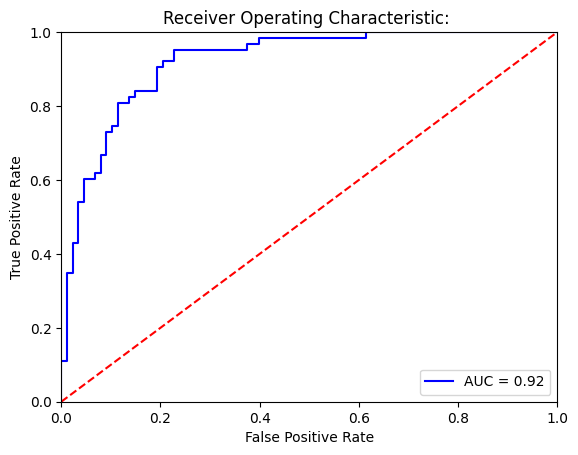

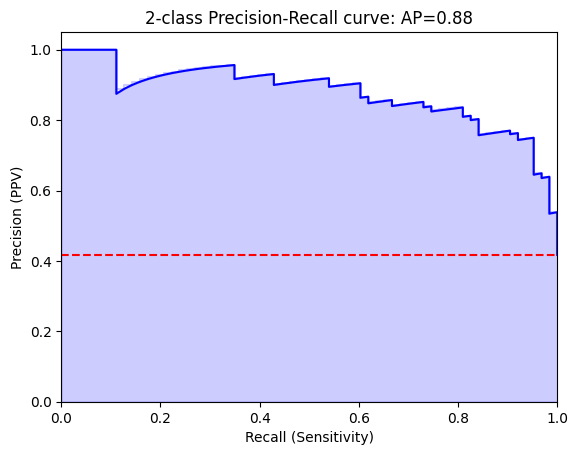

Threshold for best F1:
-2.6283479
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[68 20]
 [ 3 60]]


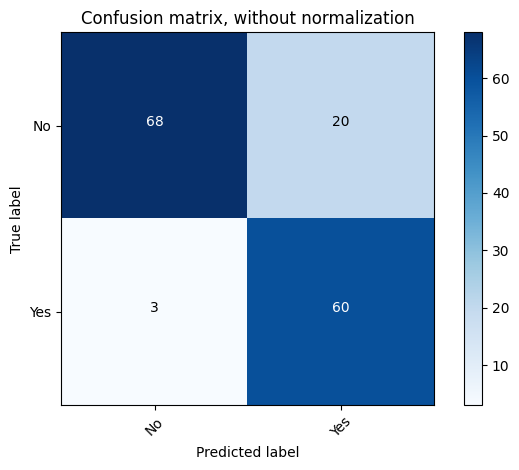

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.96      0.77      0.86        88
         Yes       0.75      0.95      0.84        63

    accuracy                           0.85       151
   macro avg       0.85      0.86      0.85       151
weighted avg       0.87      0.85      0.85       151

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[84  4]
 [29 34]]


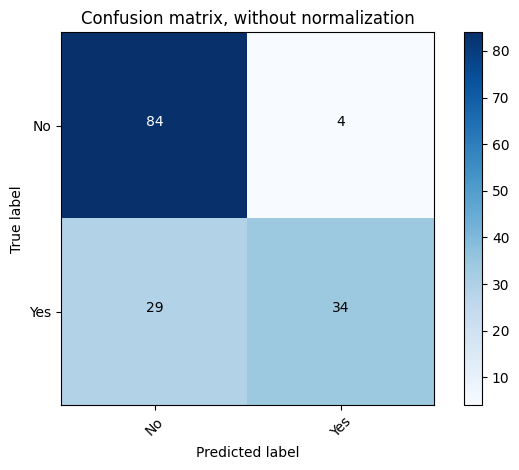

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.74      0.95      0.84        88
         Yes       0.89      0.54      0.67        63

    accuracy                           0.78       151
   macro avg       0.82      0.75      0.75       151
weighted avg       0.81      0.78      0.77       151



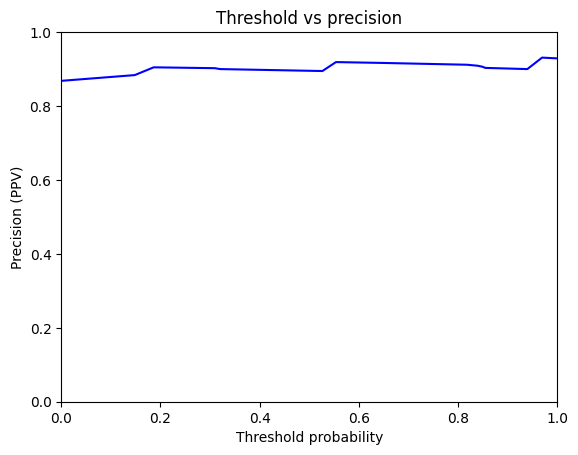

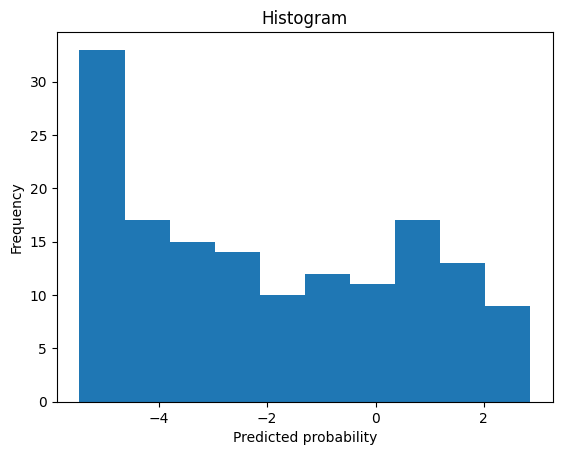

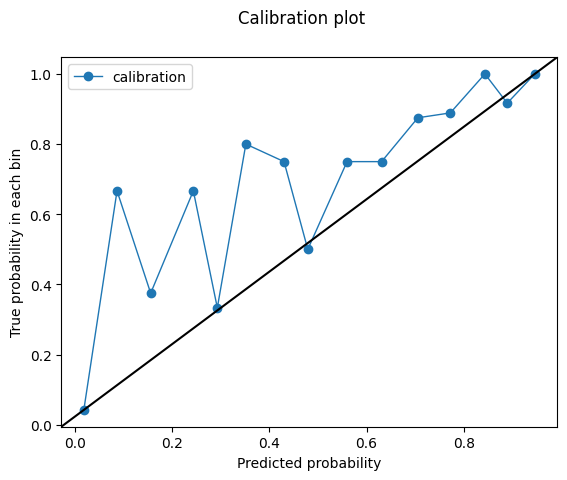

-2.6283479
validation_set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/3494006279.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.9089105339105339
Outcome probability: 0.41721854304635764
Average precision score: 0.84
Best F1: 0.8333333333333334


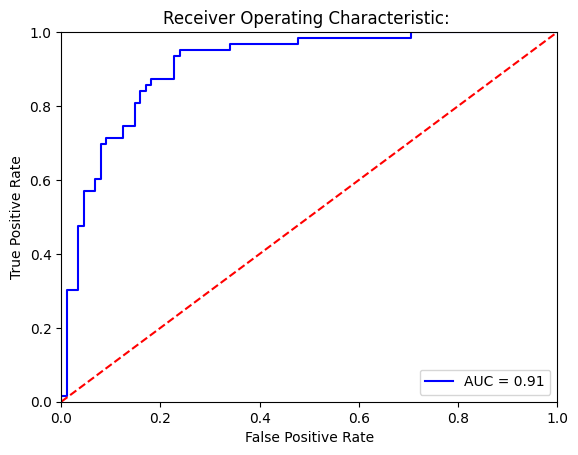

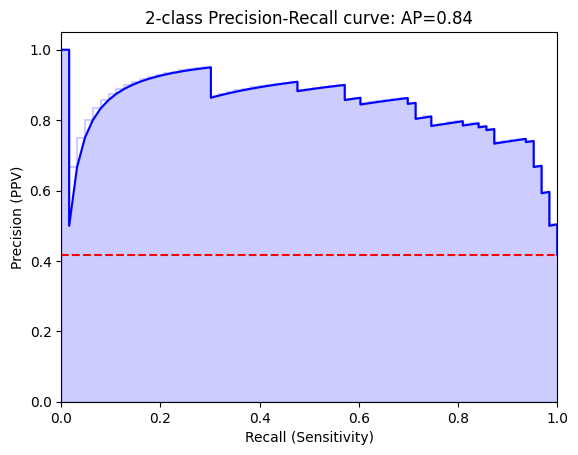

Threshold for best F1:
-1.6451509
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[67 21]
 [ 3 60]]


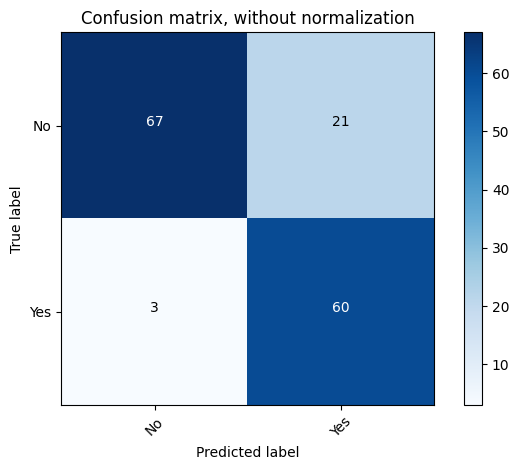

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.96      0.76      0.85        88
         Yes       0.74      0.95      0.83        63

    accuracy                           0.84       151
   macro avg       0.85      0.86      0.84       151
weighted avg       0.87      0.84      0.84       151

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[84  4]
 [27 36]]


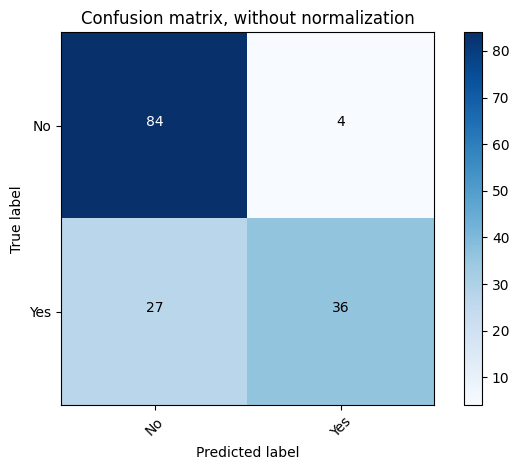

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.76      0.95      0.84        88
         Yes       0.90      0.57      0.70        63

    accuracy                           0.79       151
   macro avg       0.83      0.76      0.77       151
weighted avg       0.82      0.79      0.78       151



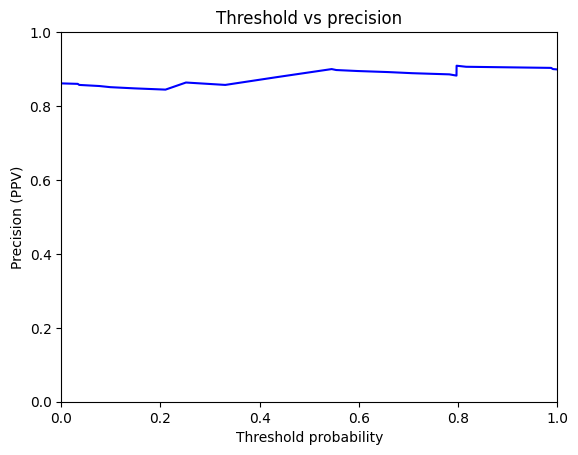

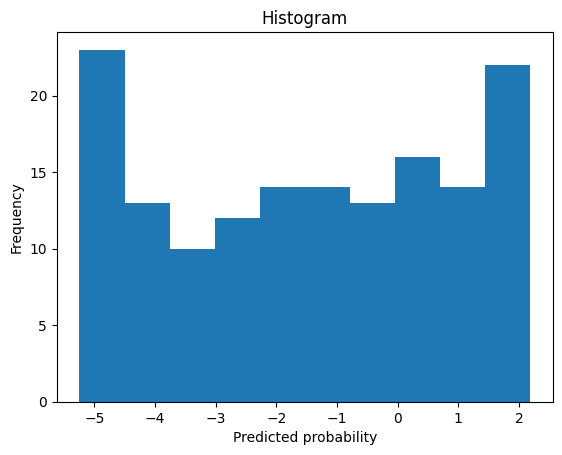

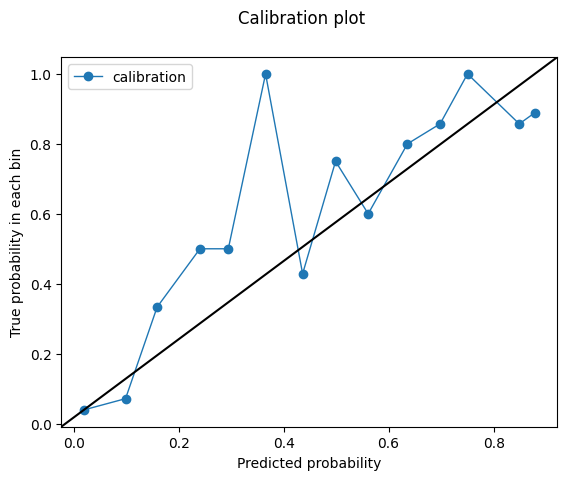

-1.6451509
validation_set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/3494006279.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.8216089466089466
Outcome probability: 0.41721854304635764
Average precision score: 0.78
Best F1: 0.7151515151515152


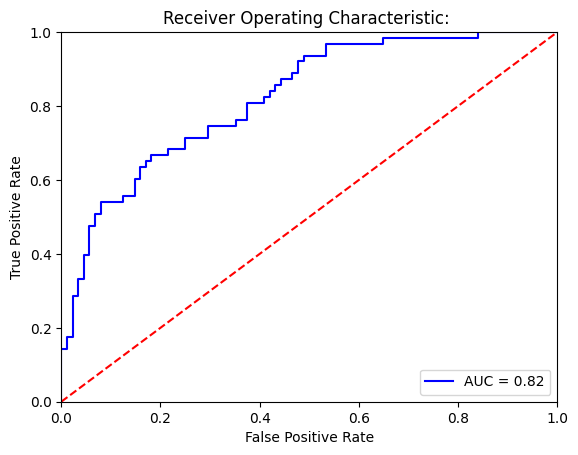

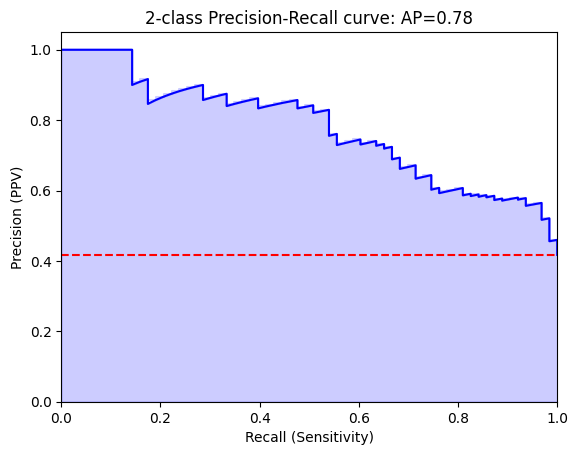

Threshold for best F1:
-2.471809
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[45 43]
 [ 4 59]]


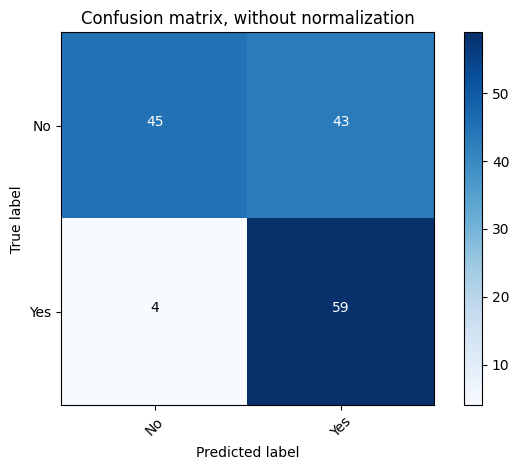

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.51      0.66        88
         Yes       0.58      0.94      0.72        63

    accuracy                           0.69       151
   macro avg       0.75      0.72      0.69       151
weighted avg       0.78      0.69      0.68       151

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[84  4]
 [42 21]]


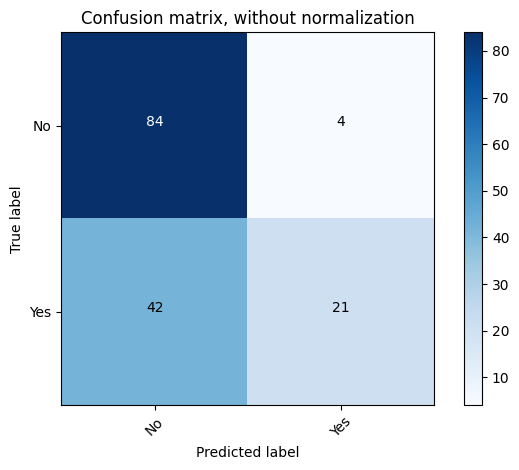

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.67      0.95      0.79        88
         Yes       0.84      0.33      0.48        63

    accuracy                           0.70       151
   macro avg       0.75      0.64      0.63       151
weighted avg       0.74      0.70      0.66       151



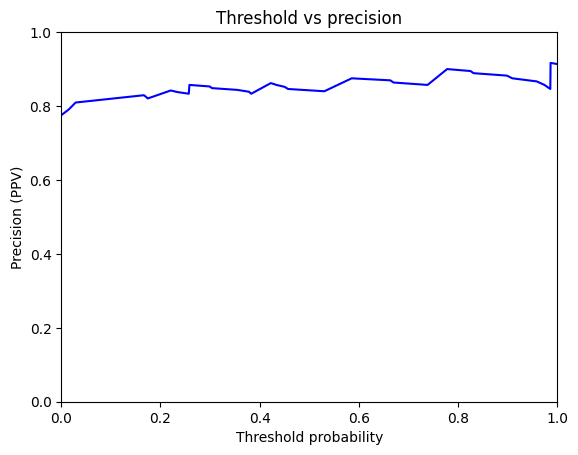

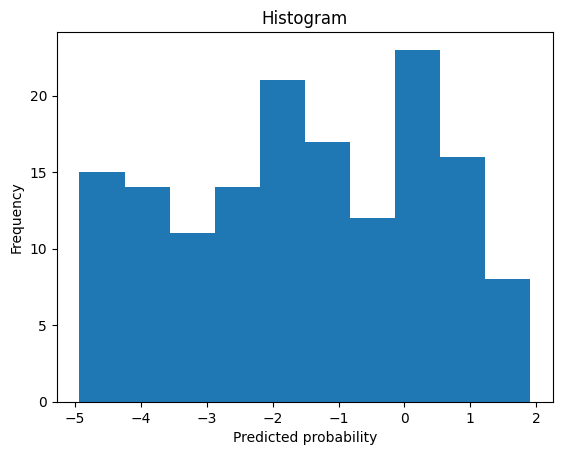

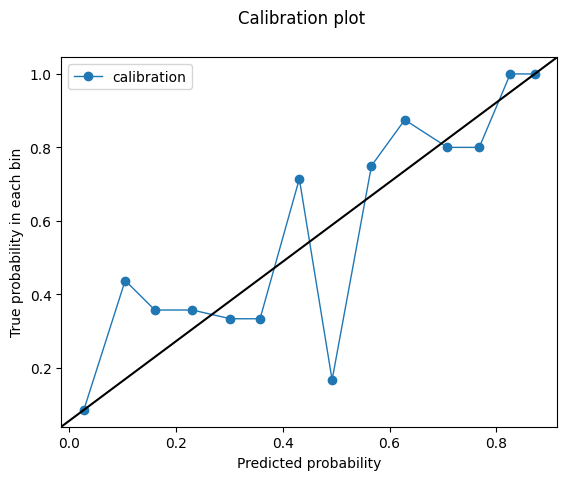

-2.471809
validation_set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/3494006279.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.6614357864357864
Outcome probability: 0.41721854304635764
Average precision score: 0.57
Best F1: 0.6233766233766234


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


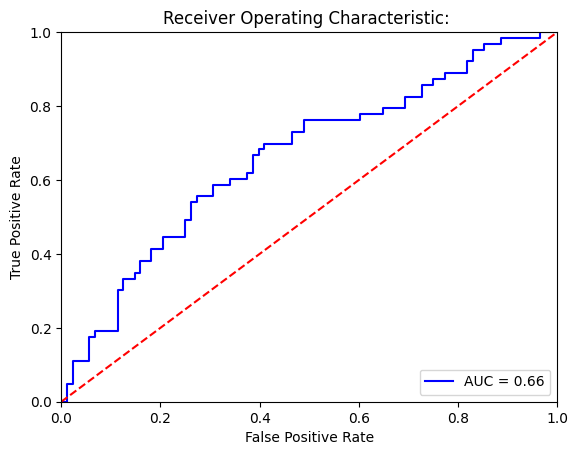

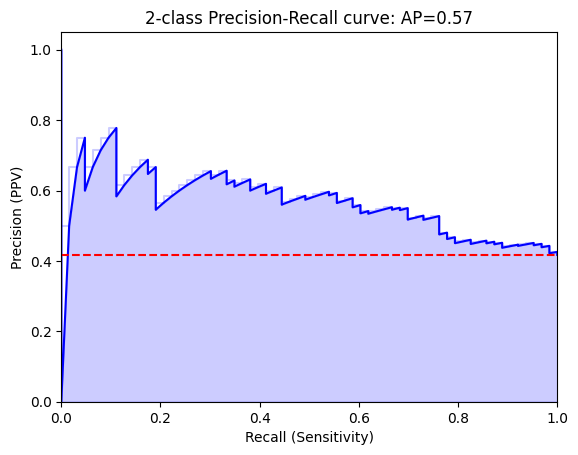

Threshold for best F1:
2.9253037
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[87  1]
 [63  0]]


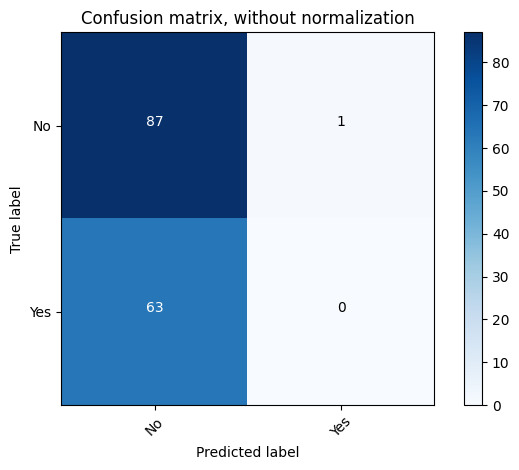

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.58      0.99      0.73        88
         Yes       0.00      0.00      0.00        63

    accuracy                           0.58       151
   macro avg       0.29      0.49      0.37       151
weighted avg       0.34      0.58      0.43       151

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[86  2]
 [60  3]]


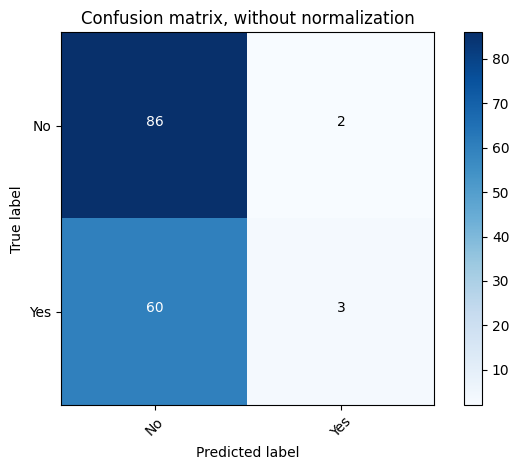

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.59      0.98      0.74        88
         Yes       0.60      0.05      0.09        63

    accuracy                           0.59       151
   macro avg       0.59      0.51      0.41       151
weighted avg       0.59      0.59      0.47       151



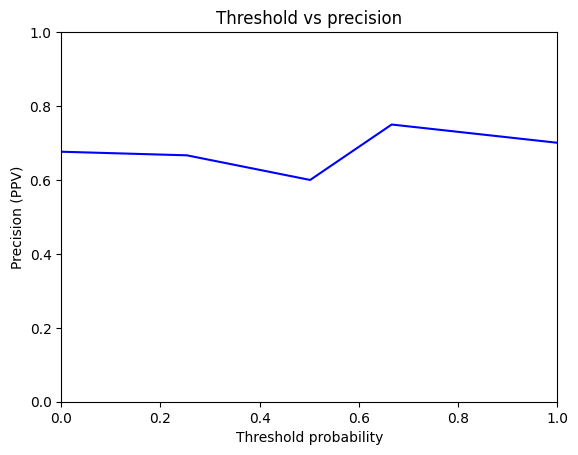

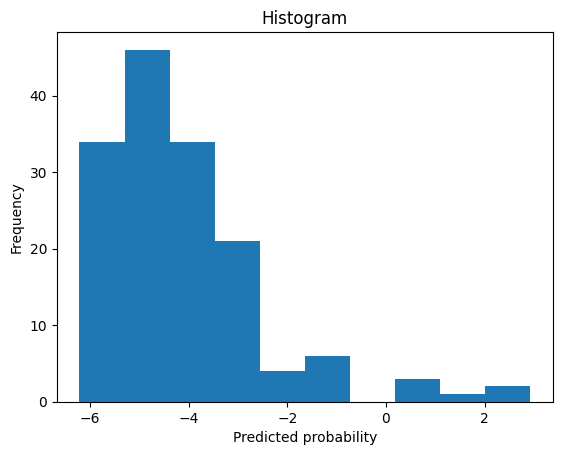

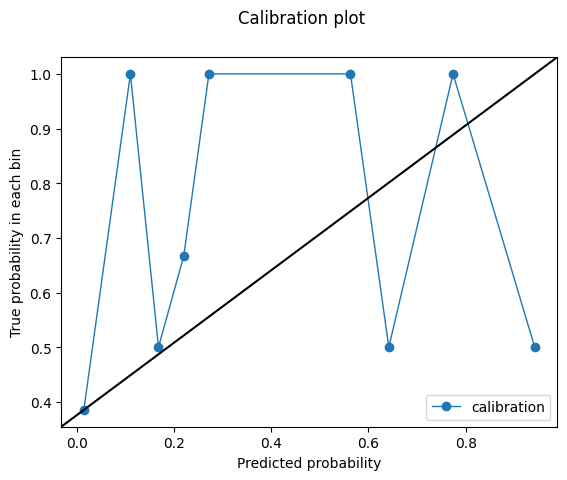

2.9253037
validation_set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/3494006279.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.9090909090909091
Outcome probability: 0.41721854304635764
Average precision score: 0.84
Best F1: 0.8467153284671532


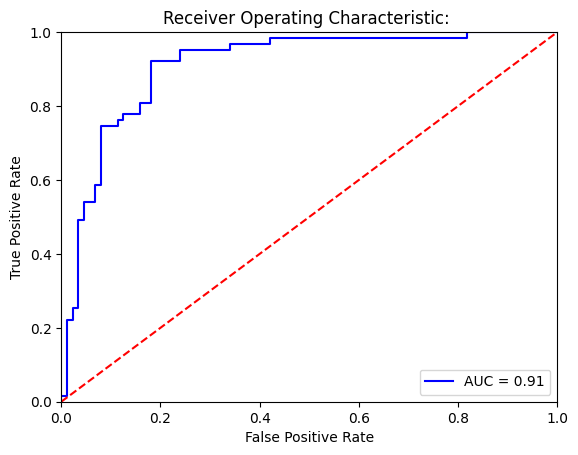

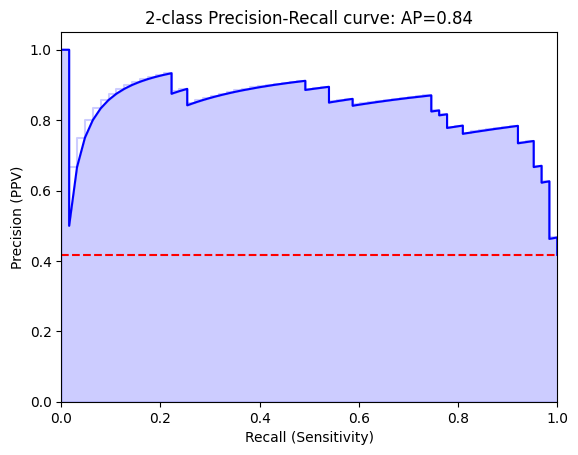

Threshold for best F1:
-1.6135597
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[72 16]
 [ 5 58]]


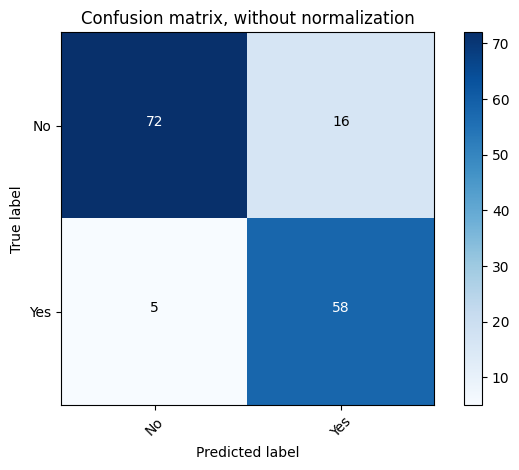

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.94      0.82      0.87        88
         Yes       0.78      0.92      0.85        63

    accuracy                           0.86       151
   macro avg       0.86      0.87      0.86       151
weighted avg       0.87      0.86      0.86       151

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[87  1]
 [59  4]]


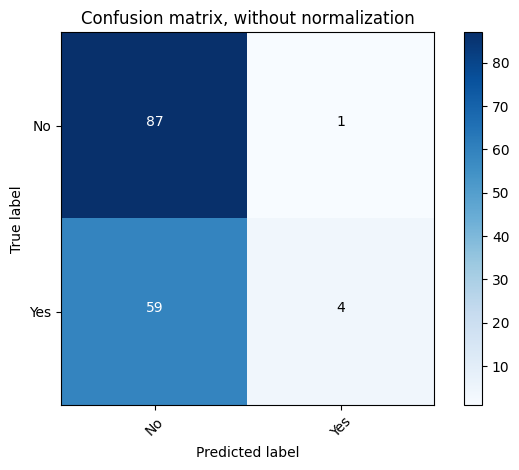

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.60      0.99      0.74        88
         Yes       0.80      0.06      0.12        63

    accuracy                           0.60       151
   macro avg       0.70      0.53      0.43       151
weighted avg       0.68      0.60      0.48       151



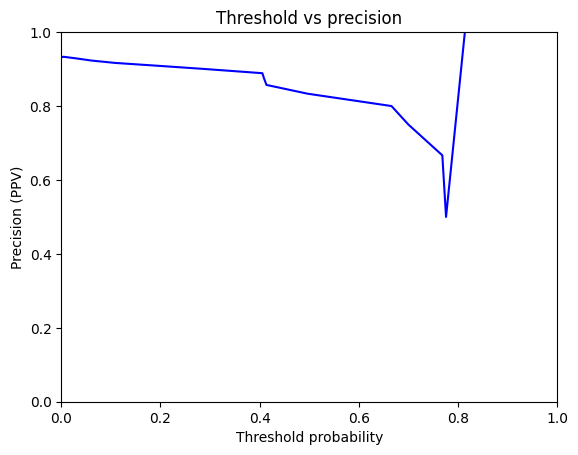

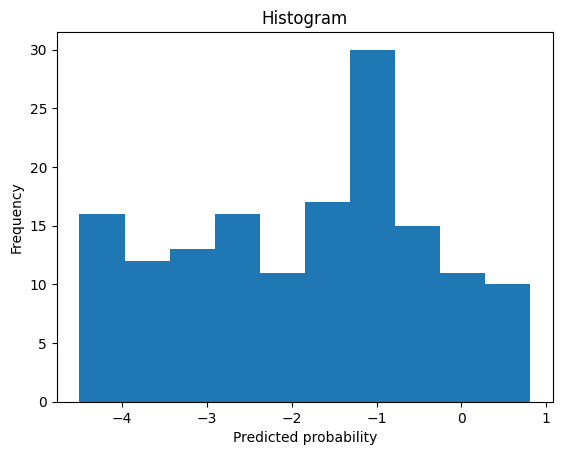

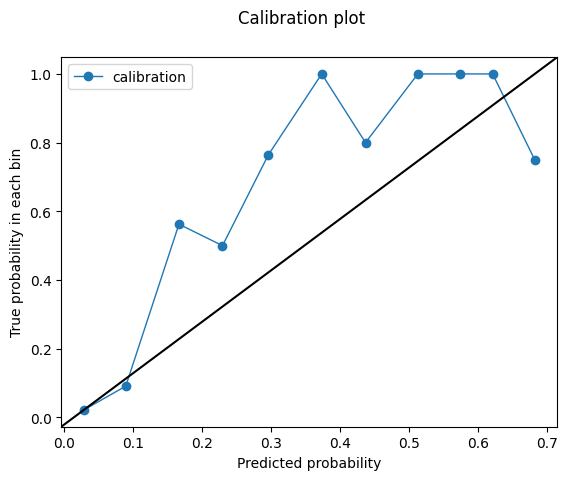

-1.6135597


In [33]:
print('model performance for non-white patients')

for model_type in model_paths:

    print('validation_set')
    print('model type')
    print(model_type)
    validation = validation_full[validation_full.white_race == 0 ].copy()
    validation_day_text = validation
    validation_day_text['text'] = validation_day_text.text.astype(str)

    validation_day_text = validation_day_text.sort_values(by=['obs','dfci_mrn','time'])

    validation_day_text['text'] = validation_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    validation_day_text = validation_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #validation_day_text.info()

    # write out actual validation dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_valid_dataset = data.DataLoader(RecistDataset(validation.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_valid_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['prcr_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = validation_day_text.reset_index(drop=True)



    valid_output = pd.concat([output, resultframe], axis=1)
    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    valid_output= valid_output[valid_output.overall_response != 'BL']
    print('non white patients')
    print('model type')
    print(model_type)
    print(eval_model(valid_output.prcr_pred, valid_output.outcome, graph=True))


model performance for non-white patients
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/2598906544.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.820486111111111
Outcome probability: 0.1836734693877551
Average precision score: 0.52
Best F1: 0.5250000000000001


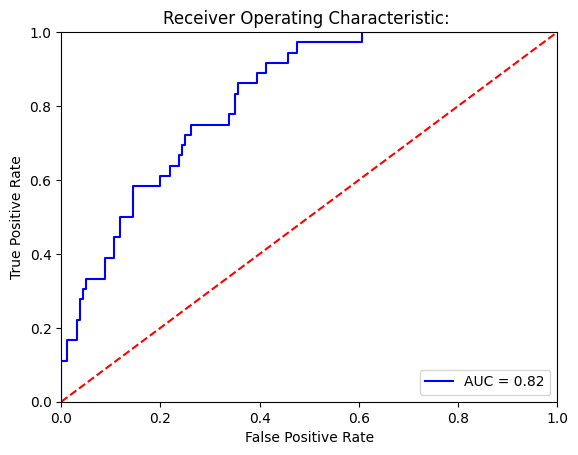

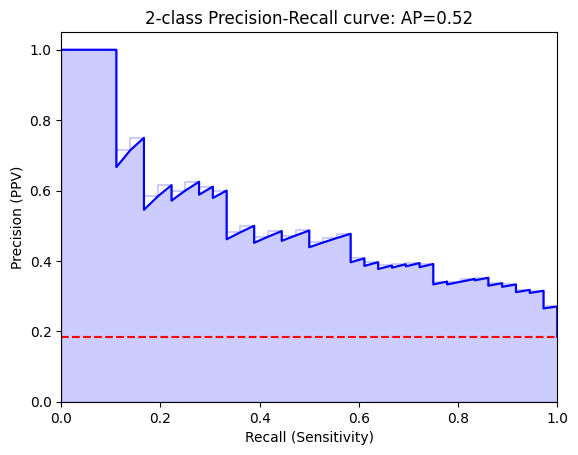

Threshold for best F1:
-0.4700413
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[137  23]
 [ 15  21]]


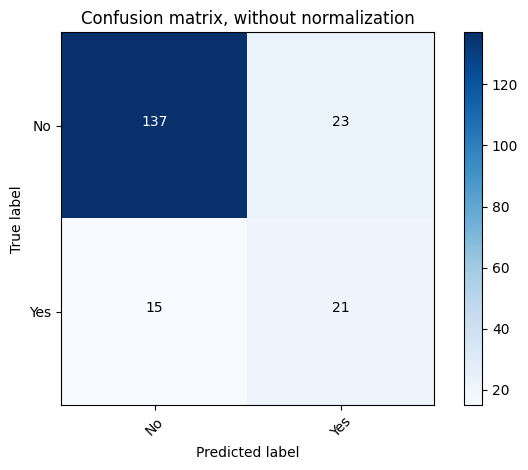

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.86      0.88       160
         Yes       0.48      0.58      0.53        36

    accuracy                           0.81       196
   macro avg       0.69      0.72      0.70       196
weighted avg       0.82      0.81      0.81       196

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[153   7]
 [ 26  10]]


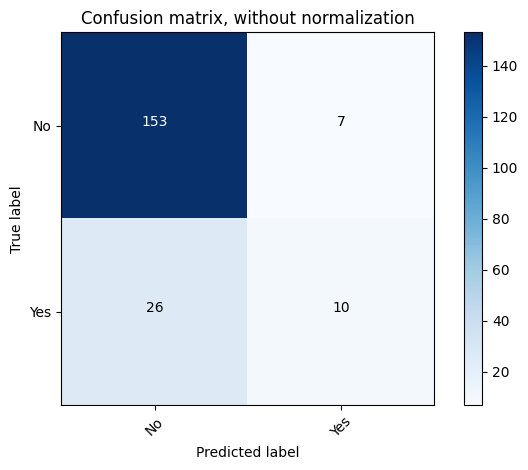

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.85      0.96      0.90       160
         Yes       0.59      0.28      0.38        36

    accuracy                           0.83       196
   macro avg       0.72      0.62      0.64       196
weighted avg       0.81      0.83      0.81       196



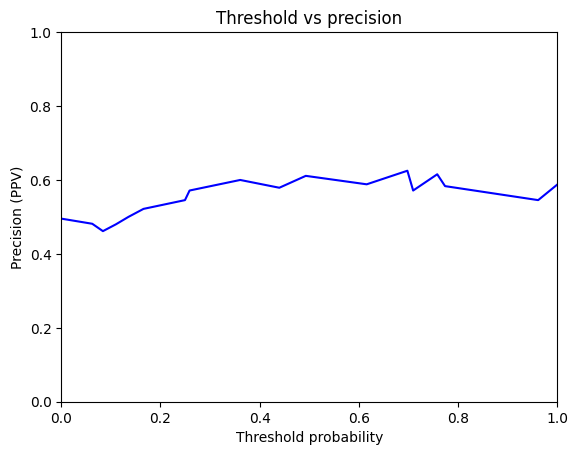

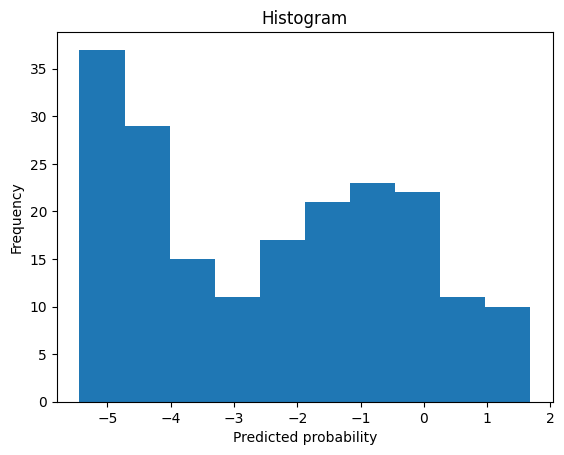

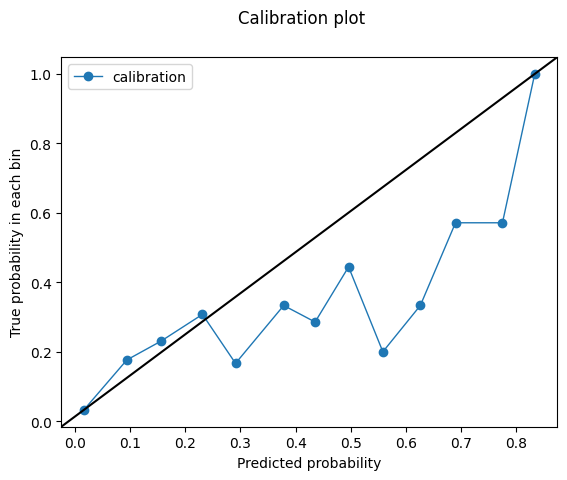

-0.4700413
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/2598906544.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.8142361111111112
Outcome probability: 0.1836734693877551
Average precision score: 0.44
Best F1: 0.537313432835821


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


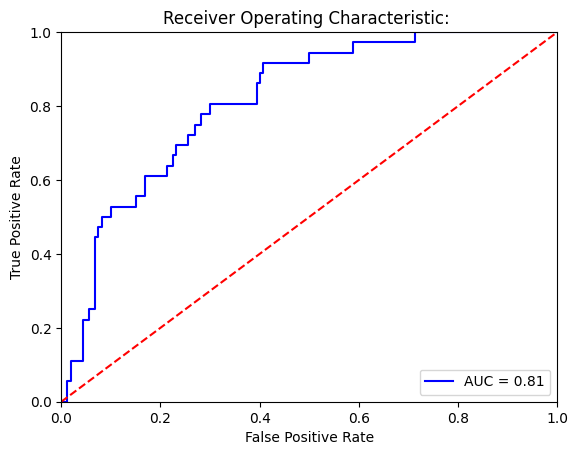

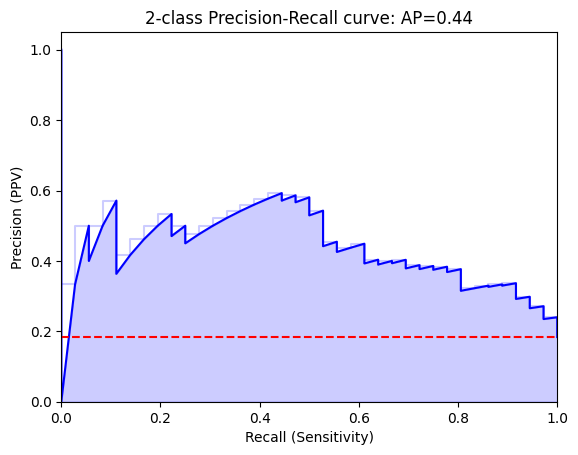

Threshold for best F1:
1.6559812
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[158   2]
 [ 36   0]]


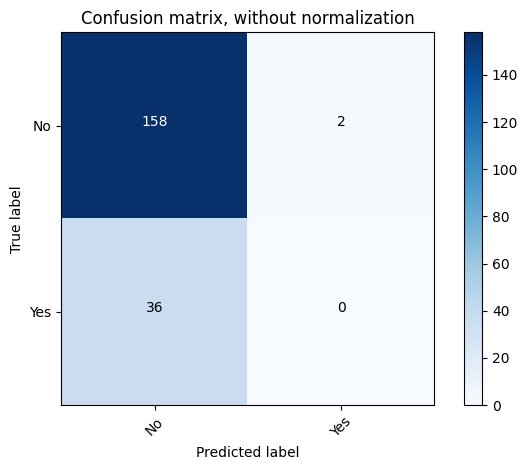

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.81      0.99      0.89       160
         Yes       0.00      0.00      0.00        36

    accuracy                           0.81       196
   macro avg       0.41      0.49      0.45       196
weighted avg       0.66      0.81      0.73       196

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[149  11]
 [ 26  10]]


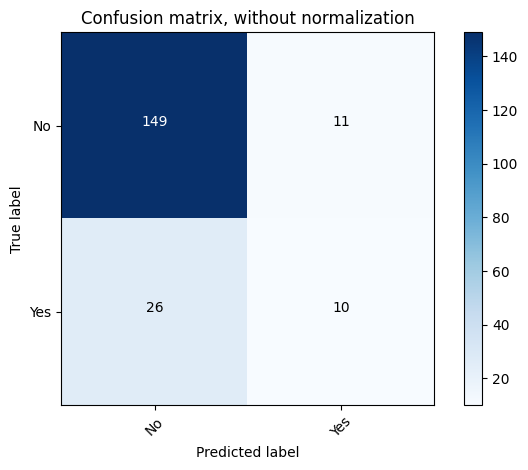

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.85      0.93      0.89       160
         Yes       0.48      0.28      0.35        36

    accuracy                           0.81       196
   macro avg       0.66      0.60      0.62       196
weighted avg       0.78      0.81      0.79       196



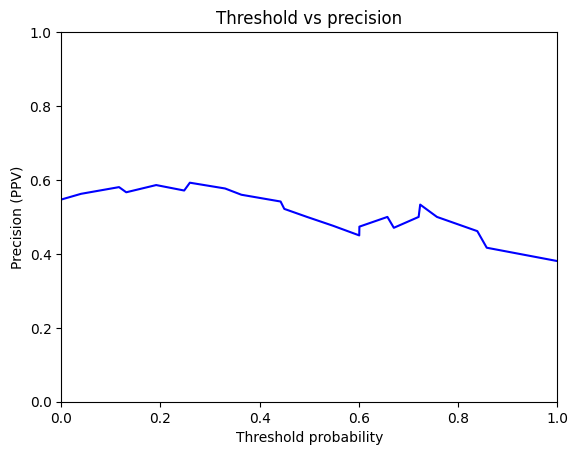

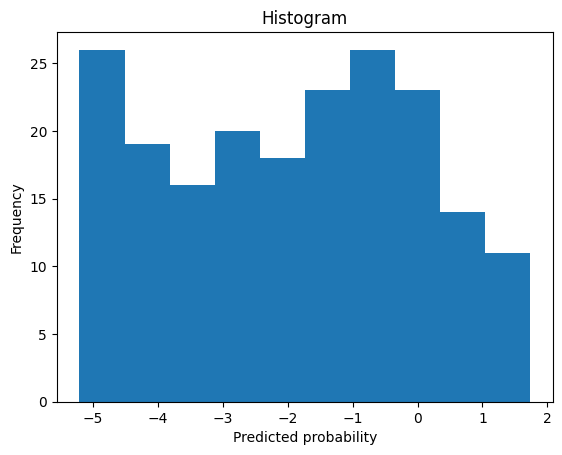

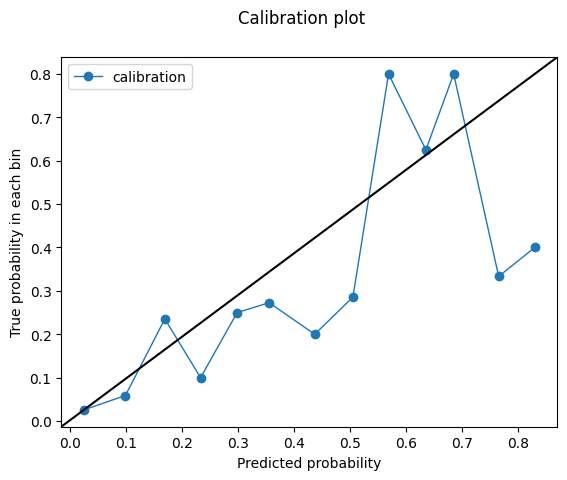

1.6559812
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/2598906544.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.7845486111111111
Outcome probability: 0.1836734693877551
Average precision score: 0.40
Best F1: 0.4861111111111111


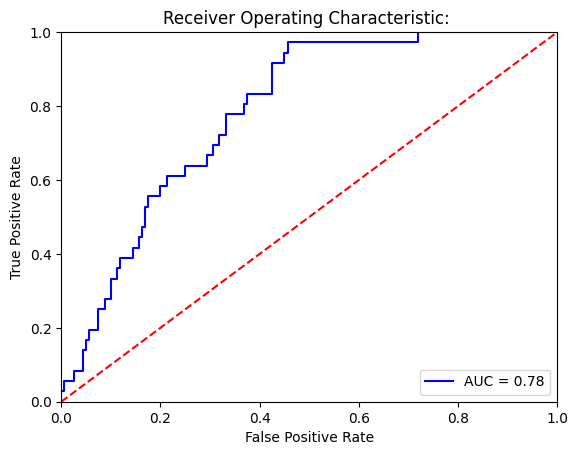

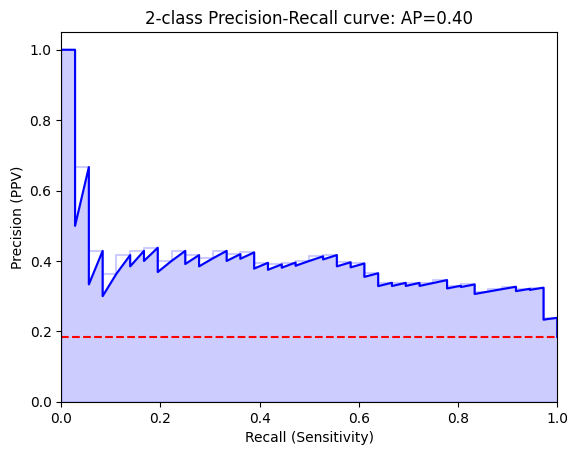

Threshold for best F1:
-2.3922977
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[87 73]
 [ 1 35]]


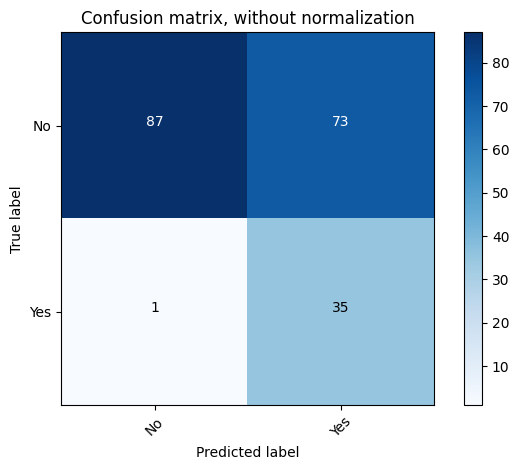

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.99      0.54      0.70       160
         Yes       0.32      0.97      0.49        36

    accuracy                           0.62       196
   macro avg       0.66      0.76      0.59       196
weighted avg       0.87      0.62      0.66       196

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[147  13]
 [ 27   9]]


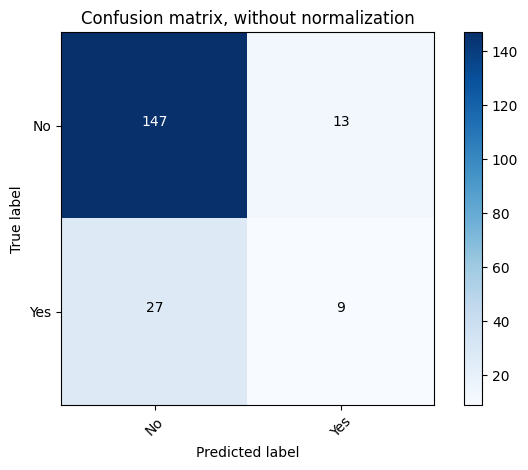

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      0.92      0.88       160
         Yes       0.41      0.25      0.31        36

    accuracy                           0.80       196
   macro avg       0.63      0.58      0.60       196
weighted avg       0.76      0.80      0.78       196



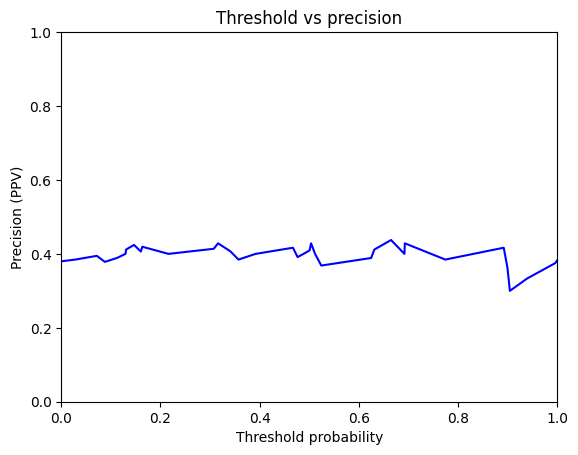

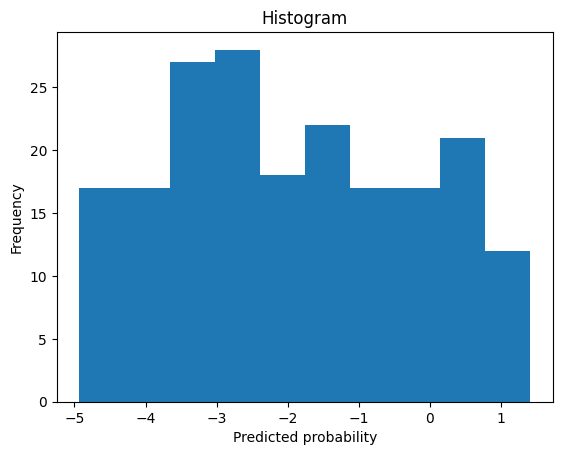

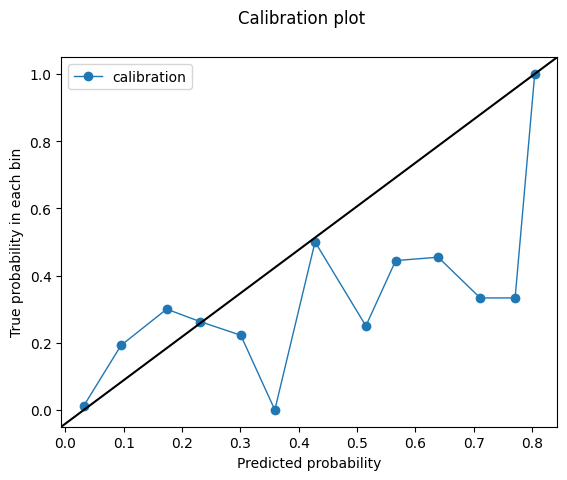

-2.3922977
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/2598906544.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.7171875
Outcome probability: 0.1836734693877551
Average precision score: 0.30
Best F1: 0.47058823529411764


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


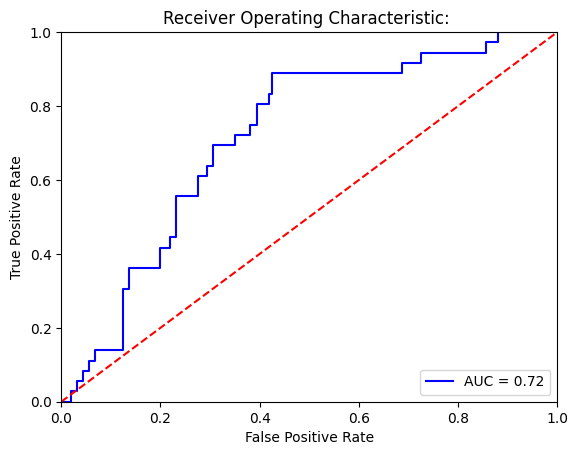

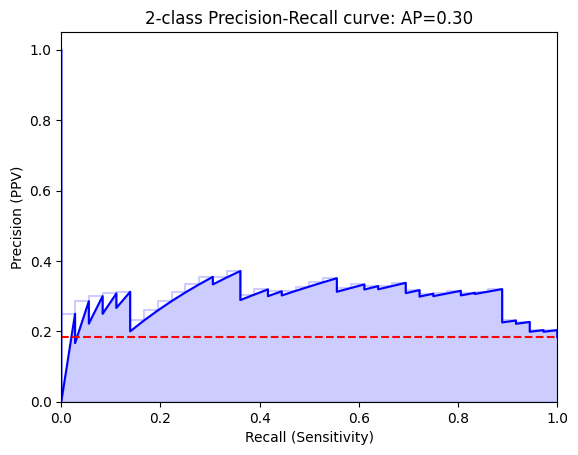

Threshold for best F1:
2.9672763
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[157   3]
 [ 36   0]]


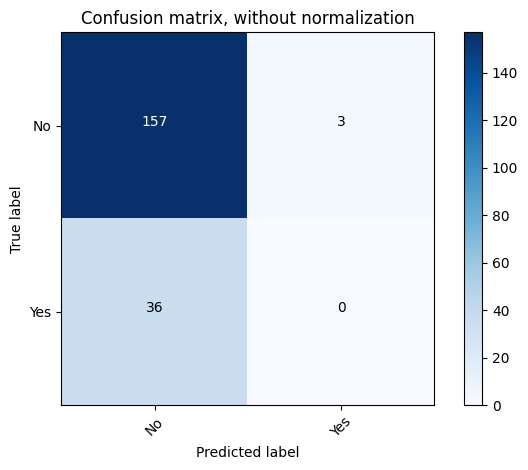

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.81      0.98      0.89       160
         Yes       0.00      0.00      0.00        36

    accuracy                           0.80       196
   macro avg       0.41      0.49      0.44       196
weighted avg       0.66      0.80      0.73       196

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[156   4]
 [ 35   1]]


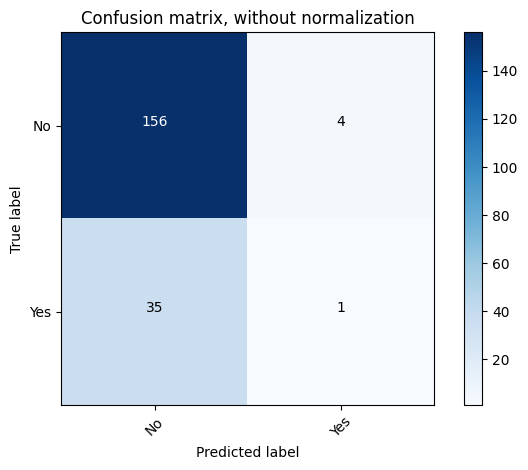

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.82      0.97      0.89       160
         Yes       0.20      0.03      0.05        36

    accuracy                           0.80       196
   macro avg       0.51      0.50      0.47       196
weighted avg       0.70      0.80      0.73       196



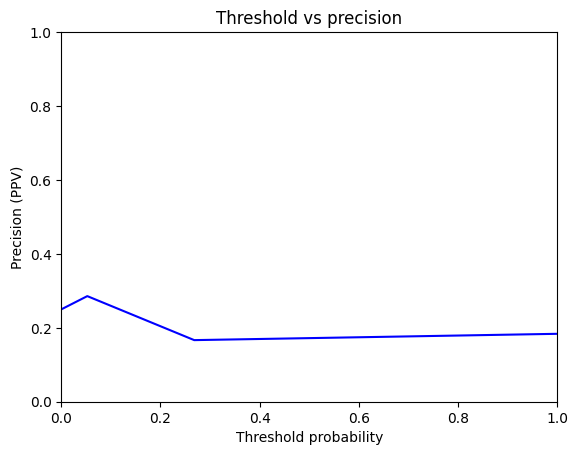

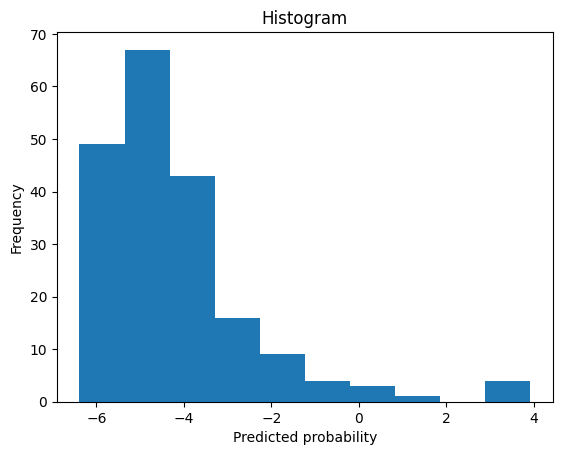

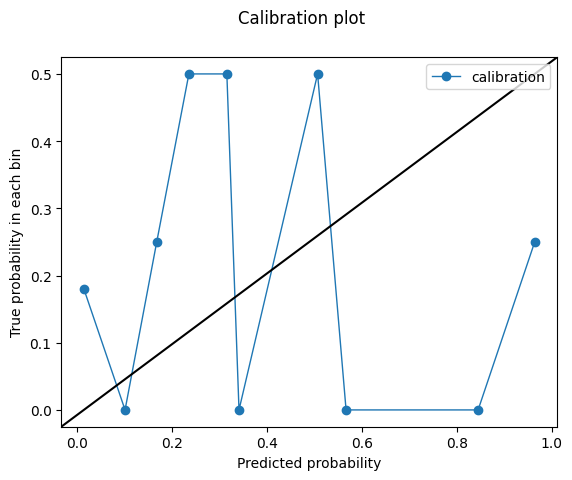

2.9672763
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/2598906544.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.8090277777777778
Outcome probability: 0.1836734693877551
Average precision score: 0.42
Best F1: 0.5473684210526315


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


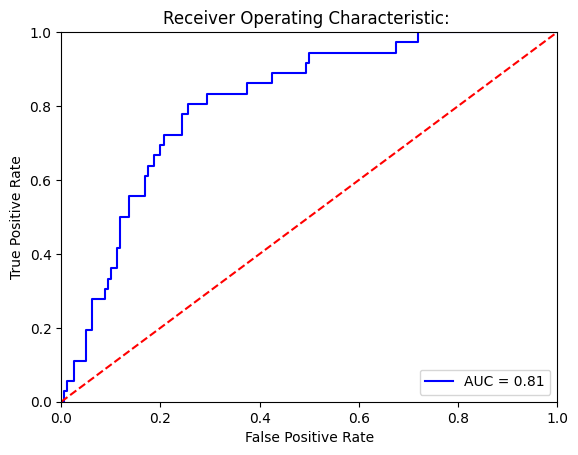

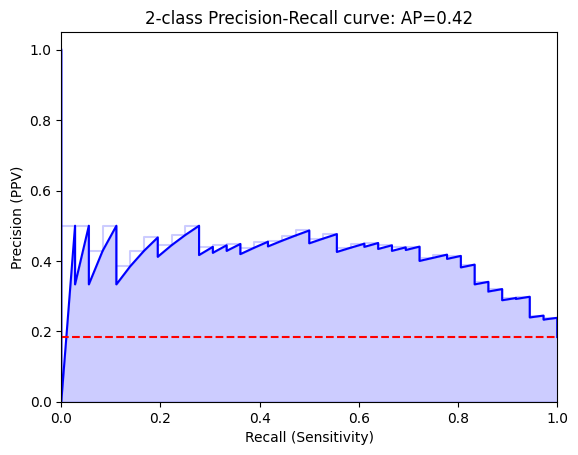

Threshold for best F1:
0.57095563
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[159   1]
 [ 36   0]]


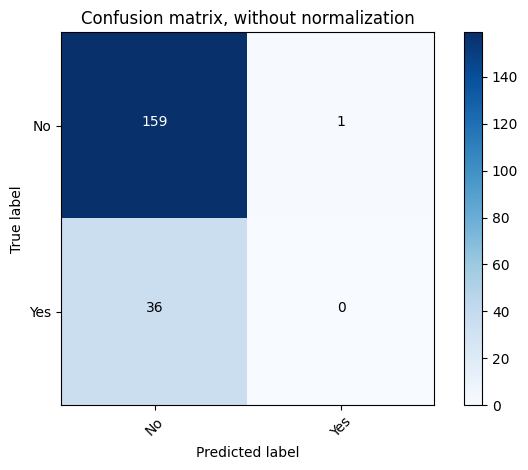

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.82      0.99      0.90       160
         Yes       0.00      0.00      0.00        36

    accuracy                           0.81       196
   macro avg       0.41      0.50      0.45       196
weighted avg       0.67      0.81      0.73       196

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[159   1]
 [ 36   0]]


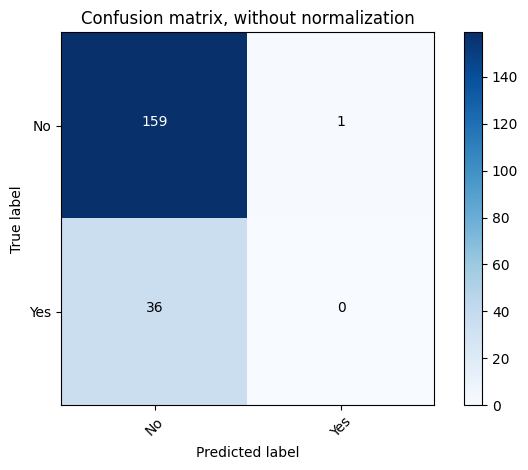

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.82      0.99      0.90       160
         Yes       0.00      0.00      0.00        36

    accuracy                           0.81       196
   macro avg       0.41      0.50      0.45       196
weighted avg       0.67      0.81      0.73       196



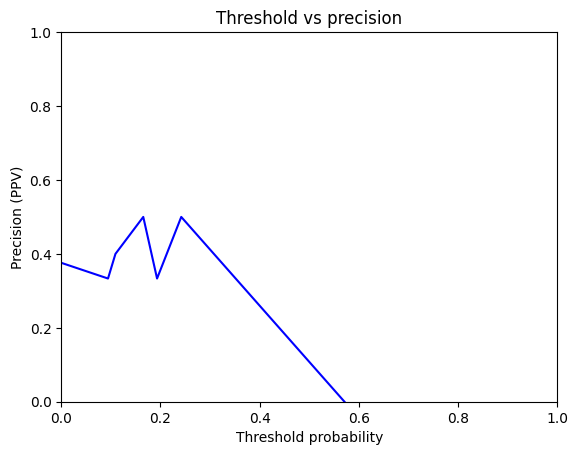

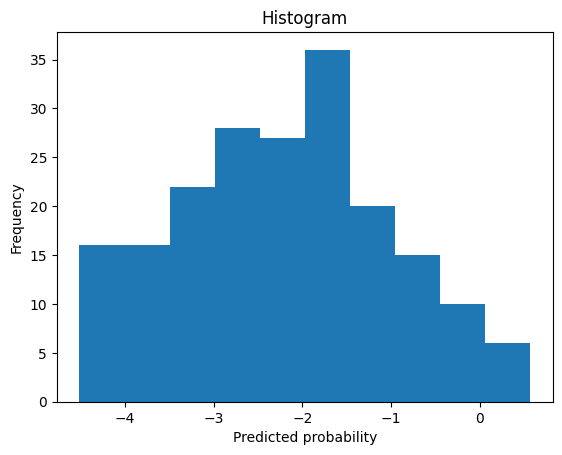

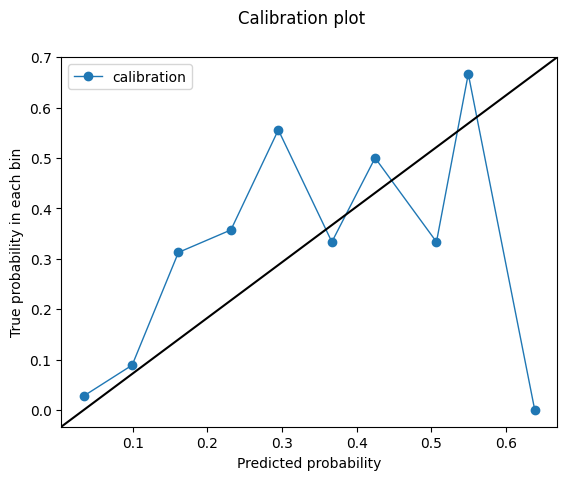

0.57095563


In [34]:
print('model performance for non-white patients')

for model_type in model_paths:

    print('test set')
    print('model type')
    print(model_type)
    test = test_full[test_full.white_race == 0 ].copy()
    test_day_text = test
    test_day_text['text'] = test_day_text.text.astype(str)

    test_day_text = test_day_text.sort_values(by=['obs','dfci_mrn','time'])

    test_day_text['text'] = test_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    test_day_text = test_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #test_day_text.info()

    # write out actual test dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_test_dataset = data.DataLoader(RecistDataset(test.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_test_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['prcr_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = test_day_text.reset_index(drop=True)



    test_output = pd.concat([output, resultframe], axis=1)
    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    test_output= test_output[test_output.overall_response != 'BL']
    print('non white patients')
    print('model type')
    print(model_type)
    print(eval_model(test_output.prcr_pred, test_output.outcome, graph=True))


model performance for Hispanic patients
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/3131726804.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.98
Outcome probability: 0.13793103448275862
Average precision score: 0.89
Best F1: 0.888888888888889


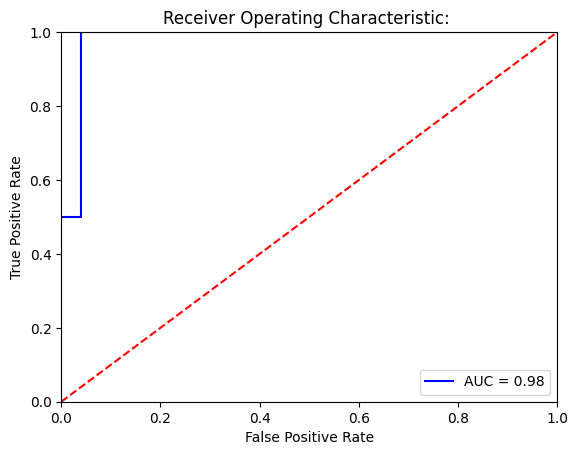

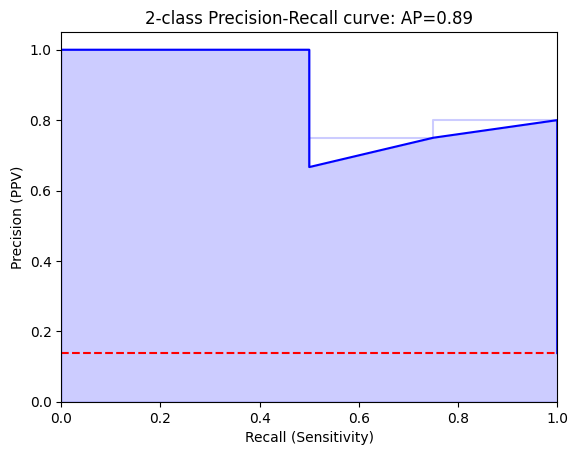

Threshold for best F1:
0.5537704
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[24  1]
 [ 0  4]]


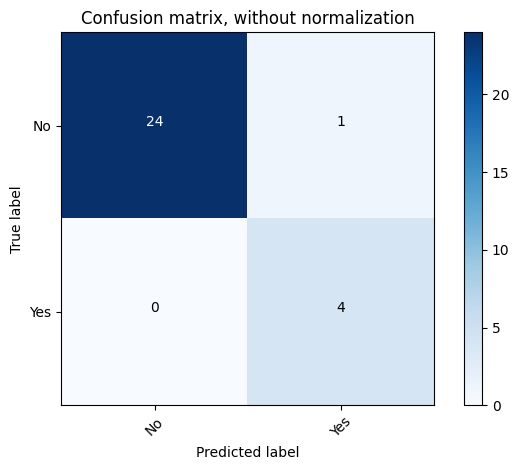

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       1.00      0.96      0.98        25
         Yes       0.80      1.00      0.89         4

    accuracy                           0.97        29
   macro avg       0.90      0.98      0.93        29
weighted avg       0.97      0.97      0.97        29

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[24  1]
 [ 0  4]]


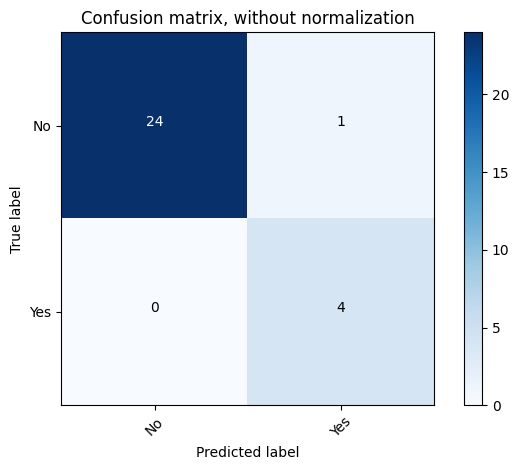

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       1.00      0.96      0.98        25
         Yes       0.80      1.00      0.89         4

    accuracy                           0.97        29
   macro avg       0.90      0.98      0.93        29
weighted avg       0.97      0.97      0.97        29



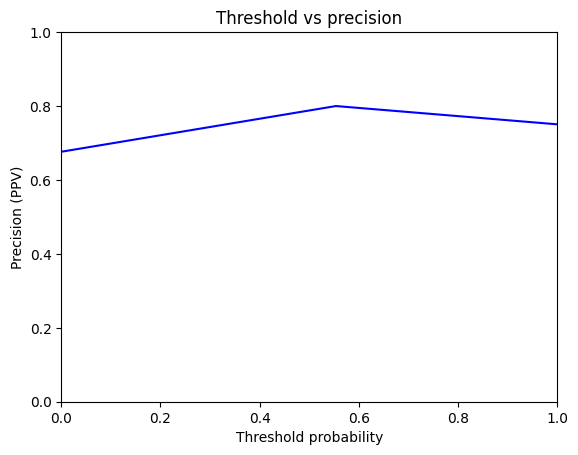

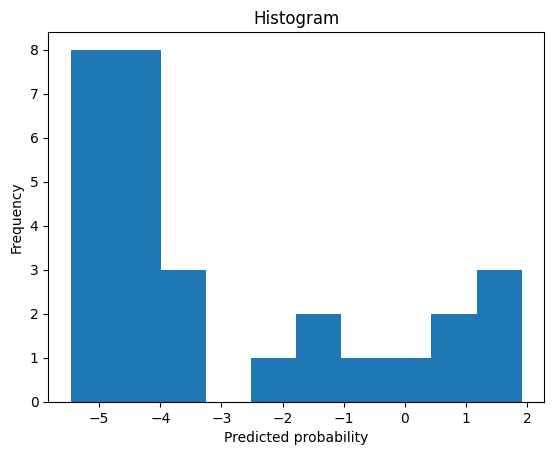

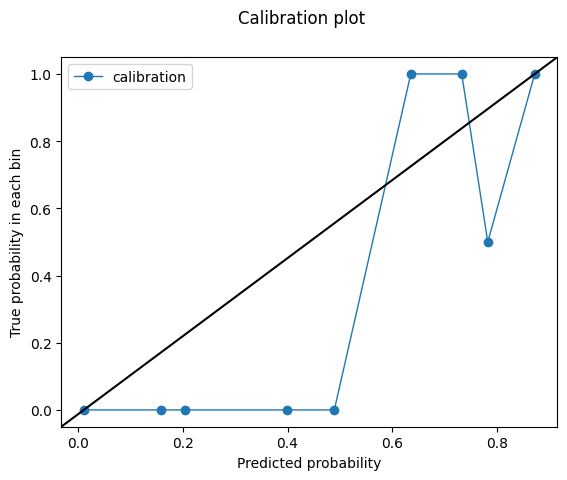

0.5537704
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/3131726804.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.92
Outcome probability: 0.13793103448275862
Average precision score: 0.70
Best F1: 0.75


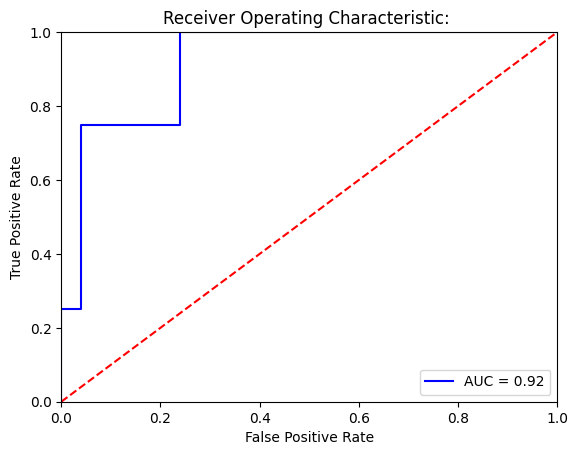

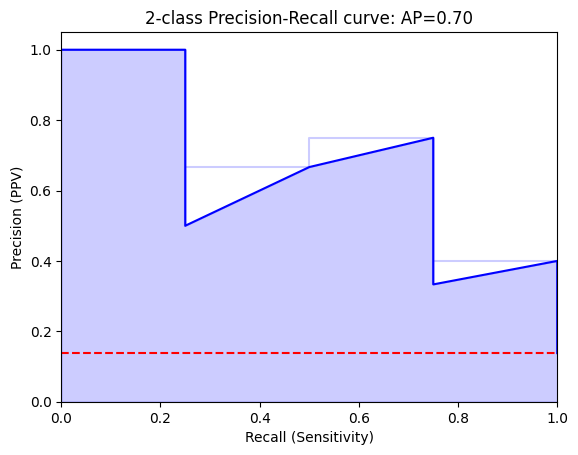

Threshold for best F1:
1.0825521
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[24  1]
 [ 1  3]]


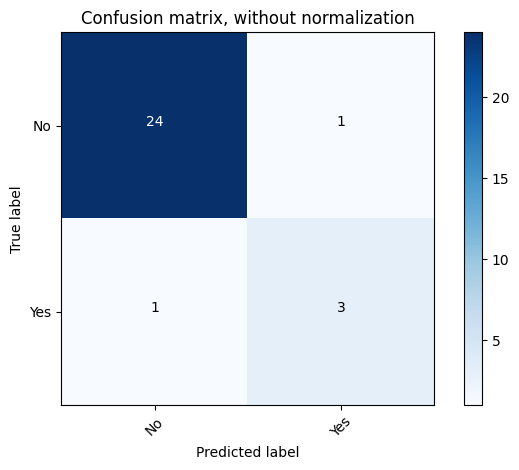

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.96      0.96      0.96        25
         Yes       0.75      0.75      0.75         4

    accuracy                           0.93        29
   macro avg       0.85      0.85      0.85        29
weighted avg       0.93      0.93      0.93        29

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[24  1]
 [ 1  3]]


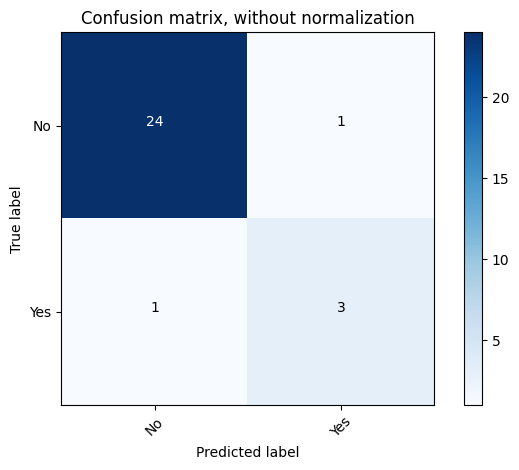

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.96      0.96      0.96        25
         Yes       0.75      0.75      0.75         4

    accuracy                           0.93        29
   macro avg       0.85      0.85      0.85        29
weighted avg       0.93      0.93      0.93        29



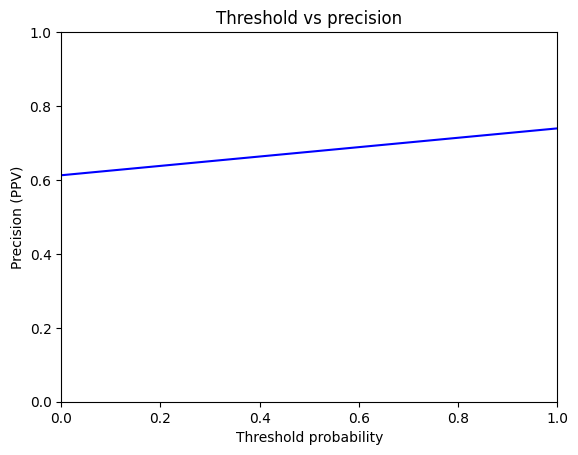

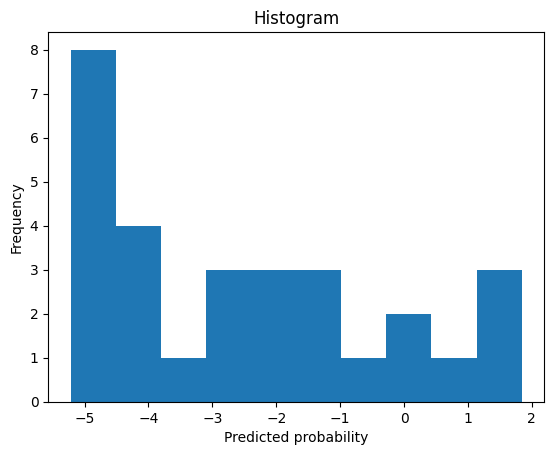

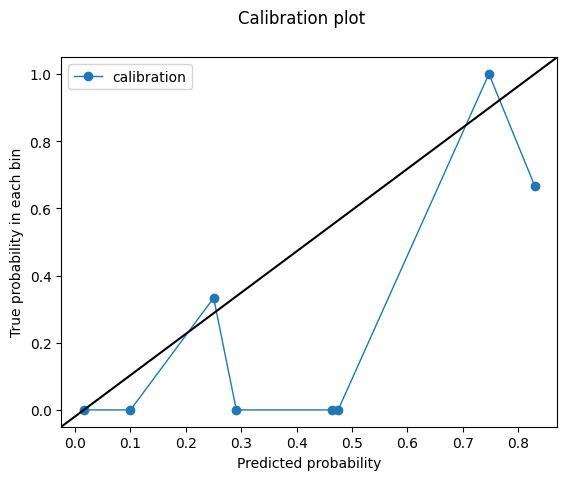

1.0825521
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/3131726804.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.81
Outcome probability: 0.13793103448275862
Average precision score: 0.40
Best F1: 0.5


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


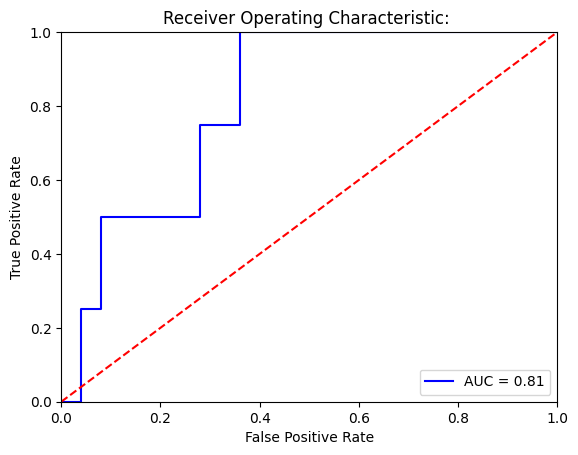

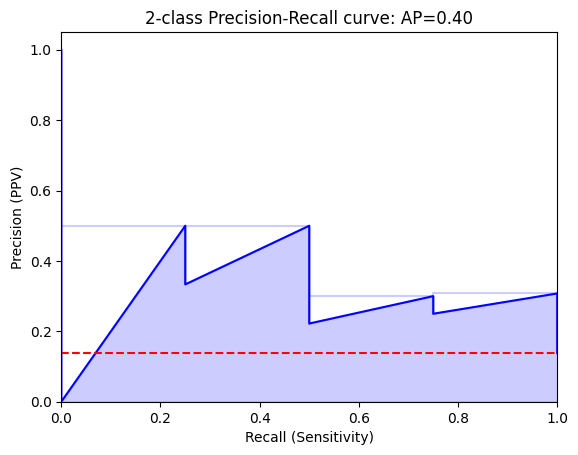

Threshold for best F1:
0.53036535
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[24  1]
 [ 4  0]]


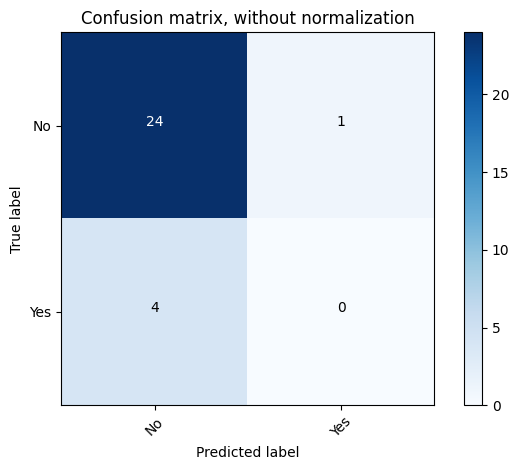

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.96      0.91        25
         Yes       0.00      0.00      0.00         4

    accuracy                           0.83        29
   macro avg       0.43      0.48      0.45        29
weighted avg       0.74      0.83      0.78        29

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[24  1]
 [ 4  0]]


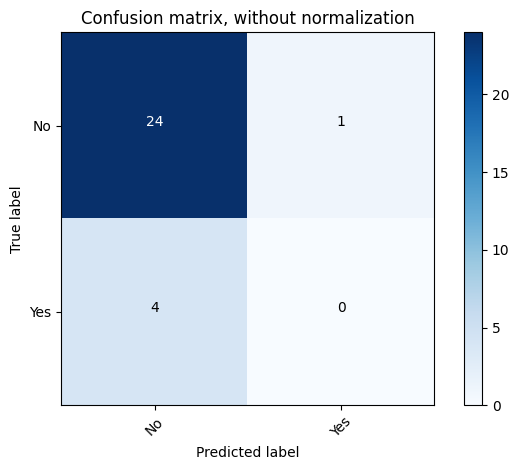

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.96      0.91        25
         Yes       0.00      0.00      0.00         4

    accuracy                           0.83        29
   macro avg       0.43      0.48      0.45        29
weighted avg       0.74      0.83      0.78        29



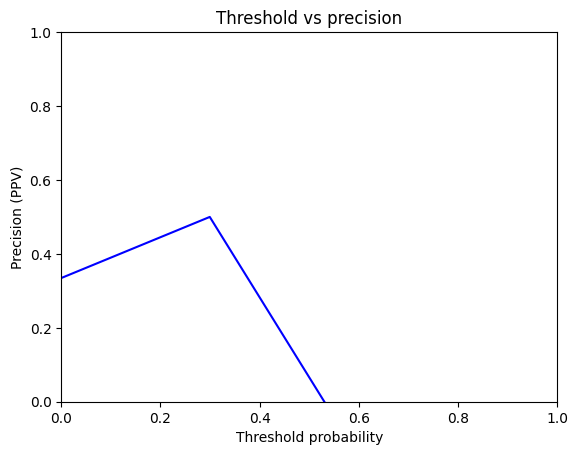

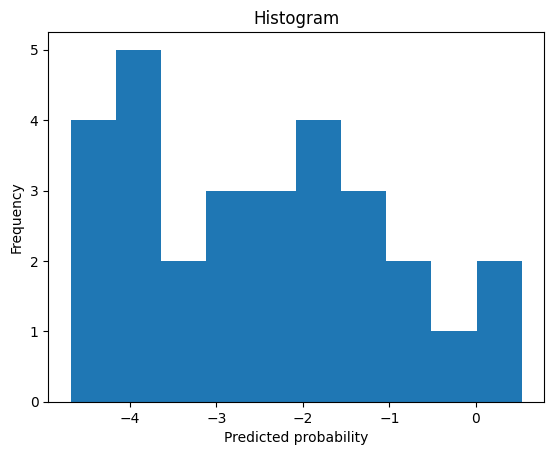

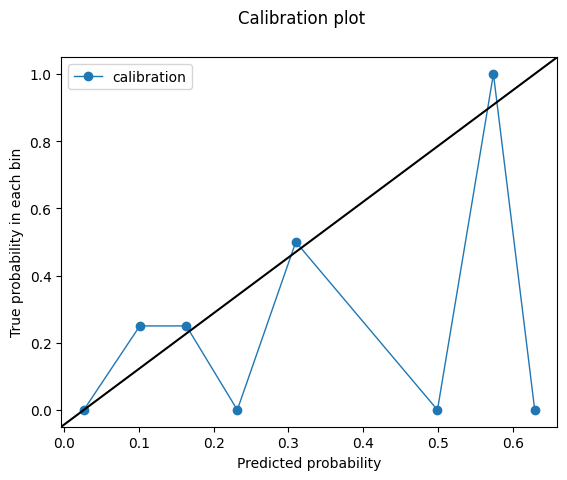

0.53036535
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/3131726804.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.88
Outcome probability: 0.13793103448275862
Average precision score: 0.47
Best F1: 0.6153846153846153


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


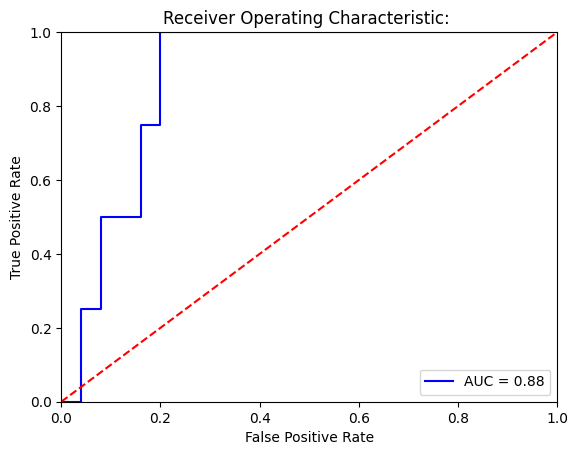

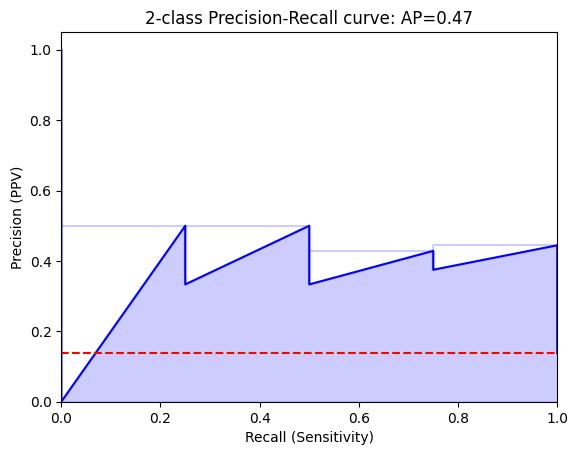

Threshold for best F1:
2.9253037
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[24  1]
 [ 4  0]]


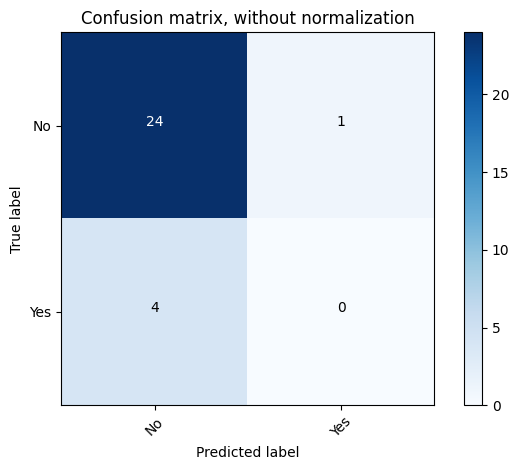

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.96      0.91        25
         Yes       0.00      0.00      0.00         4

    accuracy                           0.83        29
   macro avg       0.43      0.48      0.45        29
weighted avg       0.74      0.83      0.78        29

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[23  2]
 [ 3  1]]


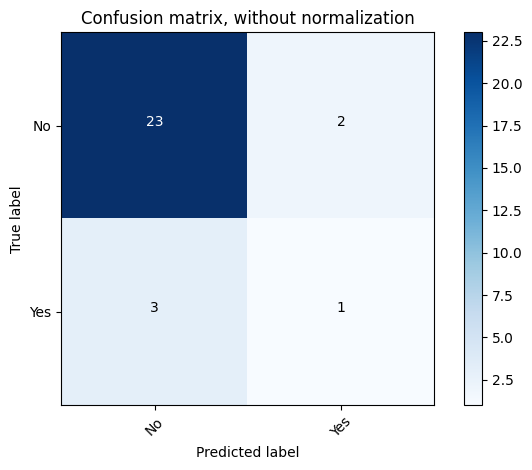

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.92      0.90        25
         Yes       0.33      0.25      0.29         4

    accuracy                           0.83        29
   macro avg       0.61      0.58      0.59        29
weighted avg       0.81      0.83      0.82        29



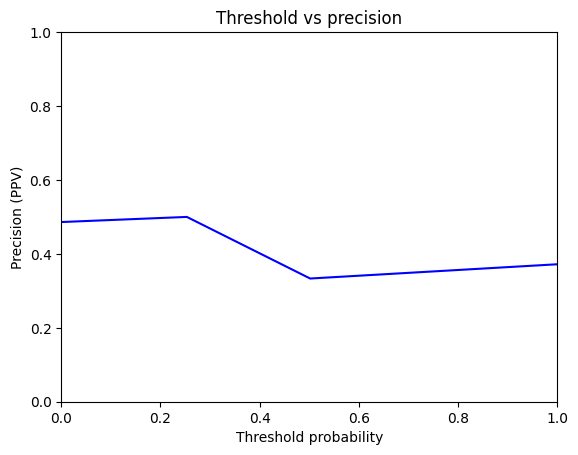

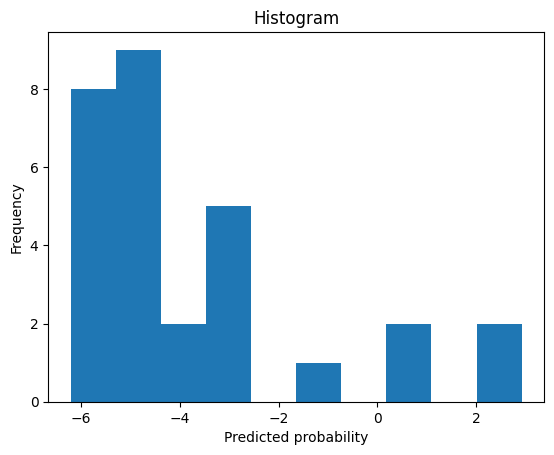

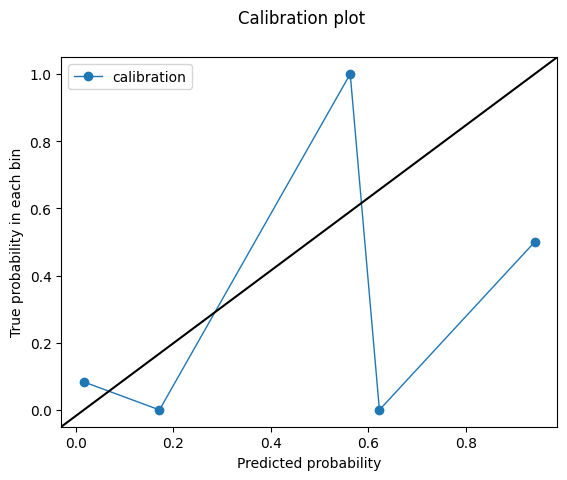

2.9253037
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/3131726804.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.97
Outcome probability: 0.13793103448275862
Average precision score: 0.80
Best F1: 0.888888888888889


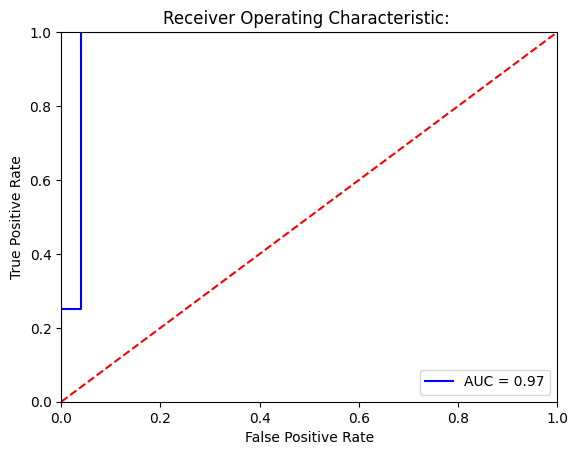

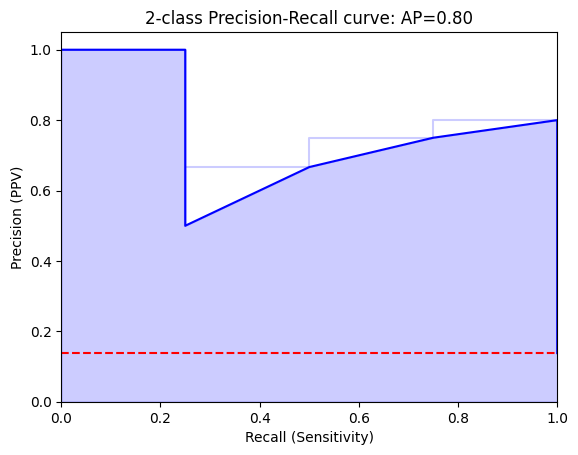

Threshold for best F1:
-0.9362162
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[24  1]
 [ 0  4]]


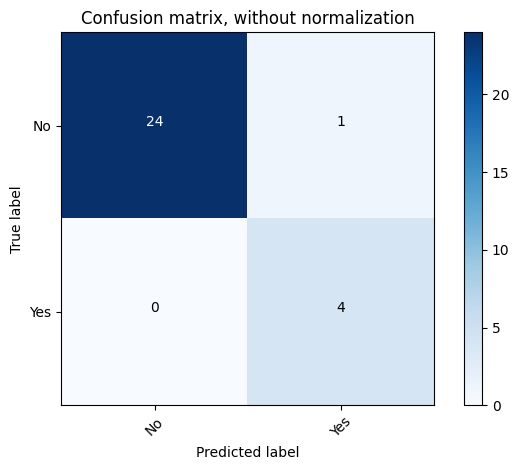

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       1.00      0.96      0.98        25
         Yes       0.80      1.00      0.89         4

    accuracy                           0.97        29
   macro avg       0.90      0.98      0.93        29
weighted avg       0.97      0.97      0.97        29

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[25  0]
 [ 4  0]]


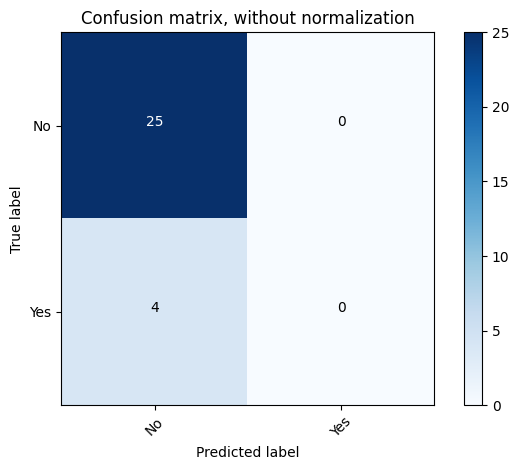

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      1.00      0.93        25
         Yes       0.00      0.00      0.00         4

    accuracy                           0.86        29
   macro avg       0.43      0.50      0.46        29
weighted avg       0.74      0.86      0.80        29



/homes10/klkehl/miniconda3/envs/vllm2/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/homes10/klkehl/miniconda3/envs/vllm2/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/homes10/klkehl/miniconda3/envs/vllm2/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.

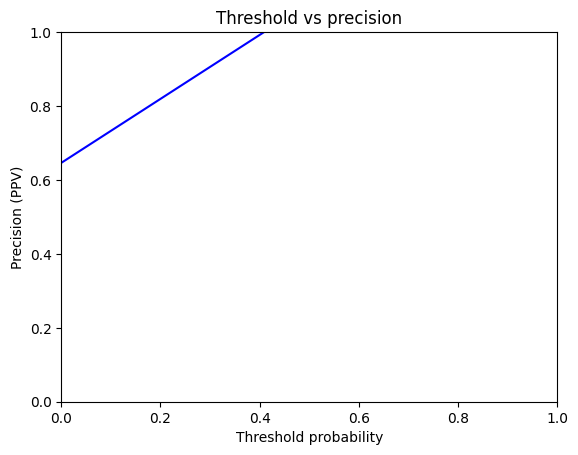

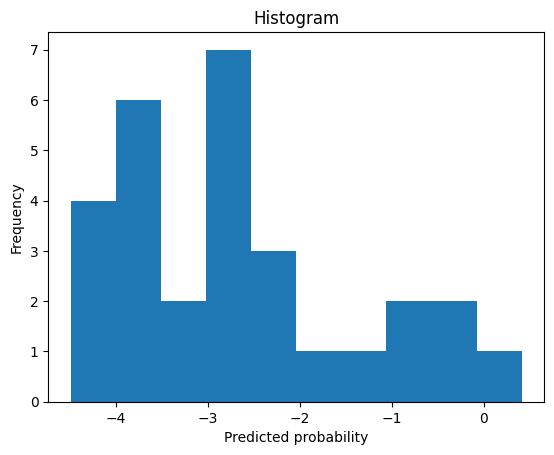

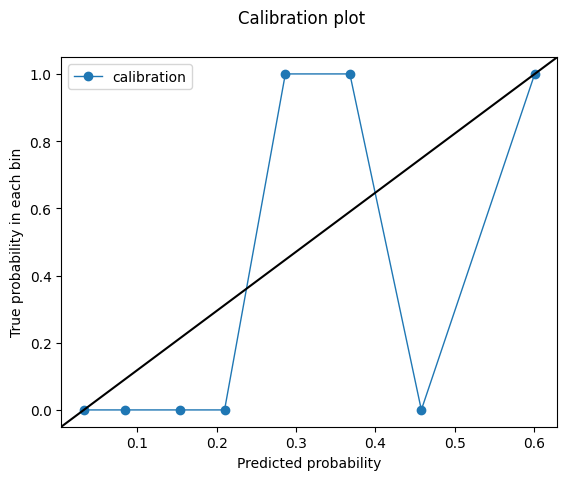

-0.9362162


In [35]:
print('model performance for Hispanic patients')

for model_type in model_paths:

    print('validation set')
    print('model type')
    print(model_type)
    validation = validation_full[validation_full.HISPANIC_IND == 'Y' ].copy()
    validation_day_text = validation
    validation_day_text['text'] = validation_day_text.text.astype(str)

    validation_day_text = validation_day_text.sort_values(by=['obs','dfci_mrn','time'])

    validation_day_text['text'] = validation_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    validation_day_text = validation_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #validation_day_text.info()

    # write out actual validation dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_valid_dataset = data.DataLoader(RecistDataset(validation.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_valid_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['prcr_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = validation_day_text.reset_index(drop=True)



    valid_output = pd.concat([output, resultframe], axis=1)
    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    valid_output= valid_output[valid_output.overall_response != 'BL']
    print('Hispanic patients')
    print('model type')
    print(model_type)
    print(eval_model(valid_output.prcr_pred, valid_output.outcome, graph=True))


model performance for Hispanic patients
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/1504891696.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.9475
Outcome probability: 0.32432432432432434
Average precision score: 0.91
Best F1: 0.8181818181818182


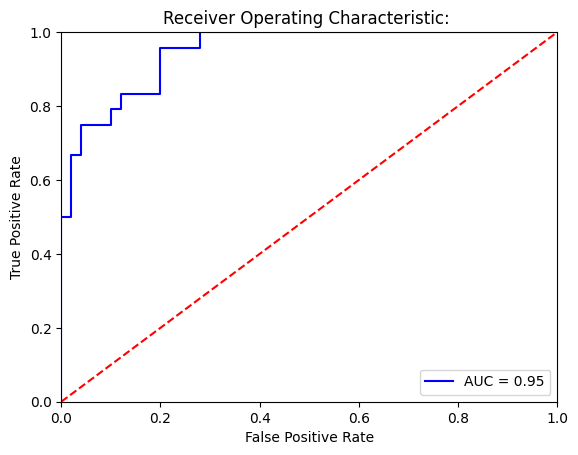

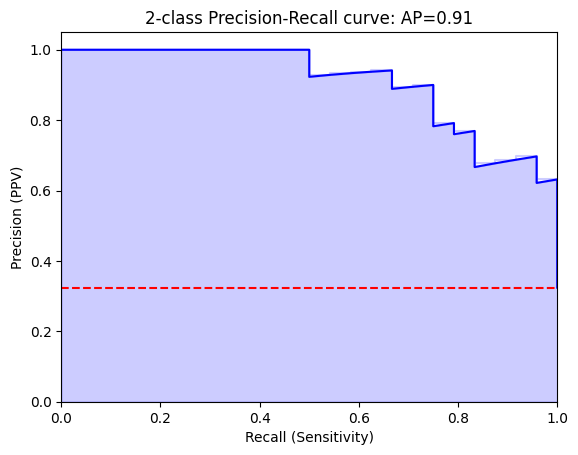

Threshold for best F1:
0.49294814
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[48  2]
 [ 6 18]]


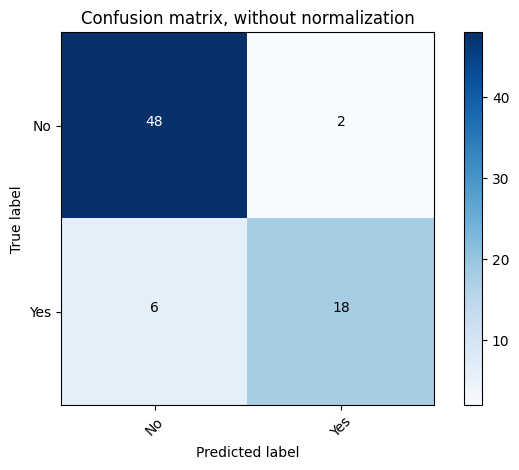

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.96      0.92        50
         Yes       0.90      0.75      0.82        24

    accuracy                           0.89        74
   macro avg       0.89      0.85      0.87        74
weighted avg       0.89      0.89      0.89        74

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[48  2]
 [ 7 17]]


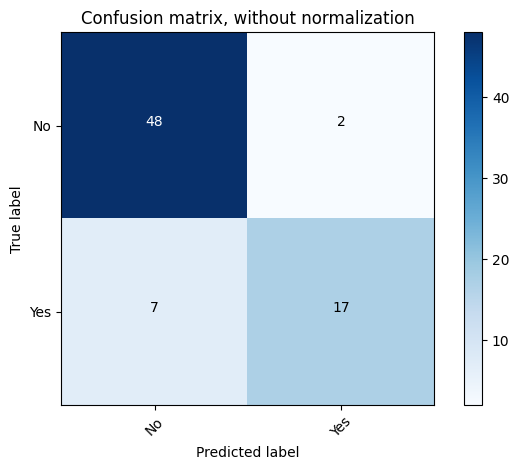

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.96      0.91        50
         Yes       0.89      0.71      0.79        24

    accuracy                           0.88        74
   macro avg       0.88      0.83      0.85        74
weighted avg       0.88      0.88      0.87        74



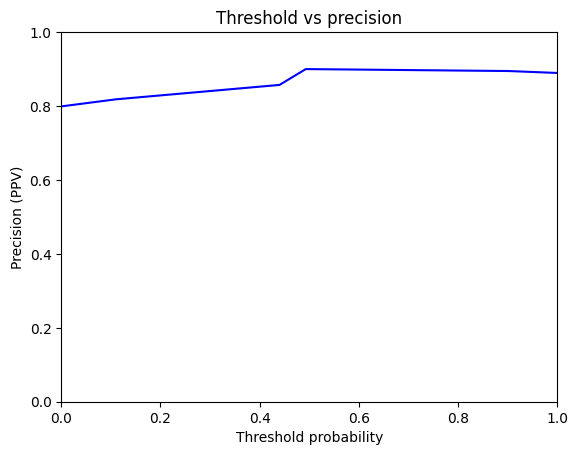

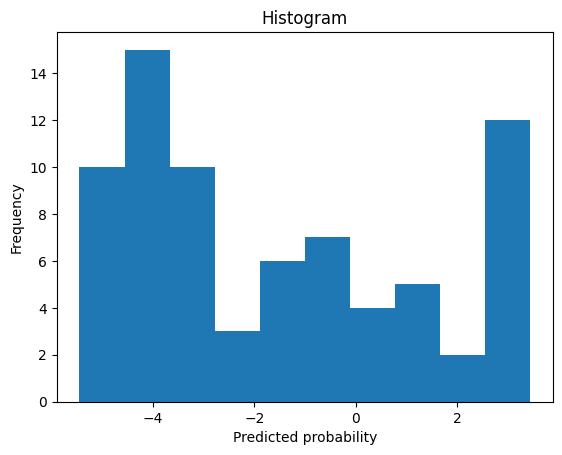

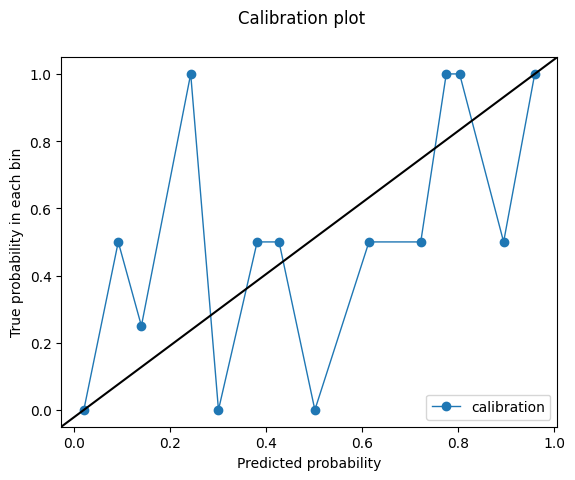

0.49294814
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/1504891696.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.9458333333333333
Outcome probability: 0.32432432432432434
Average precision score: 0.91
Best F1: 0.8260869565217391


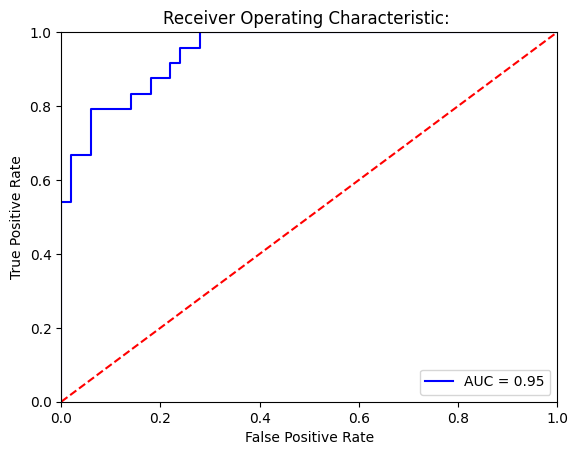

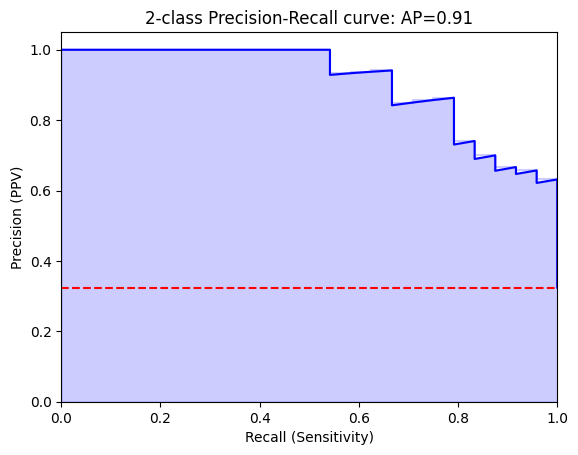

Threshold for best F1:
0.3631092
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[47  3]
 [ 5 19]]


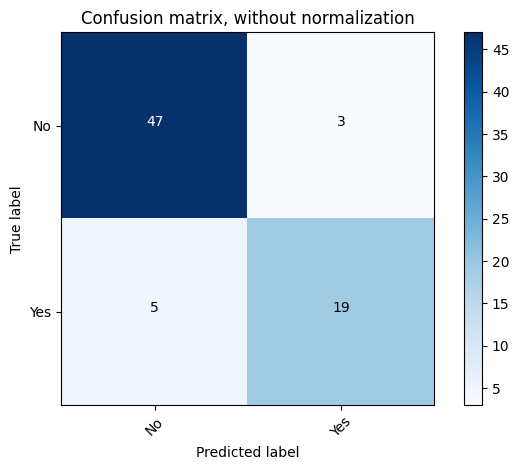

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.94      0.92        50
         Yes       0.86      0.79      0.83        24

    accuracy                           0.89        74
   macro avg       0.88      0.87      0.87        74
weighted avg       0.89      0.89      0.89        74

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[47  3]
 [ 7 17]]


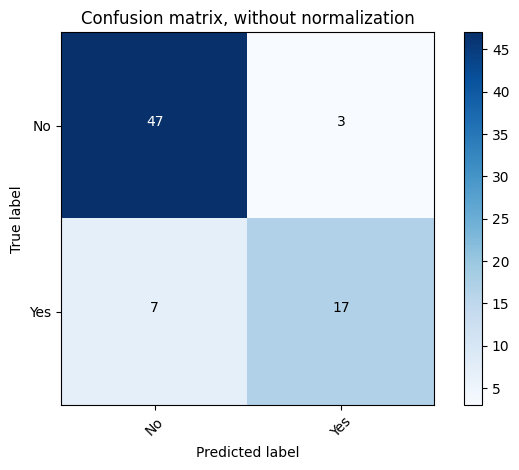

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.94      0.90        50
         Yes       0.85      0.71      0.77        24

    accuracy                           0.86        74
   macro avg       0.86      0.82      0.84        74
weighted avg       0.86      0.86      0.86        74



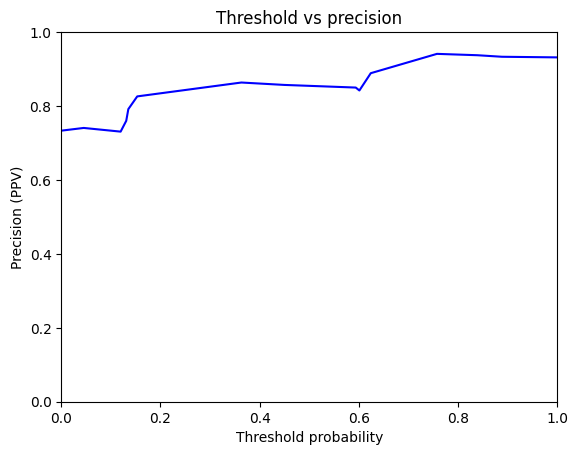

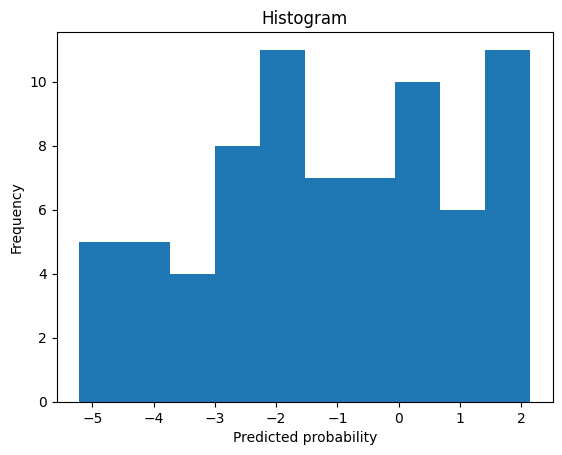

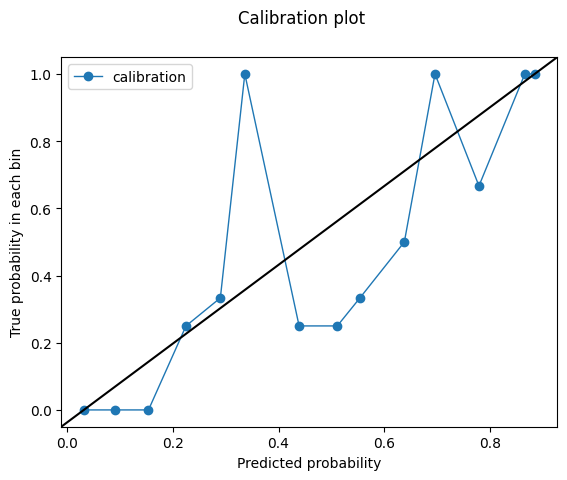

0.3631092
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/1504891696.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.9241666666666666
Outcome probability: 0.32432432432432434
Average precision score: 0.87
Best F1: 0.8260869565217391


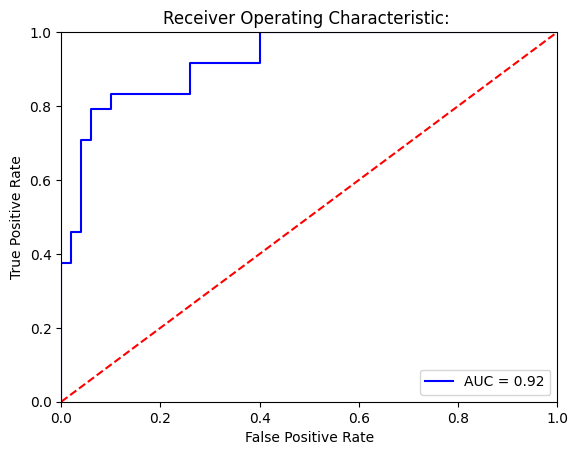

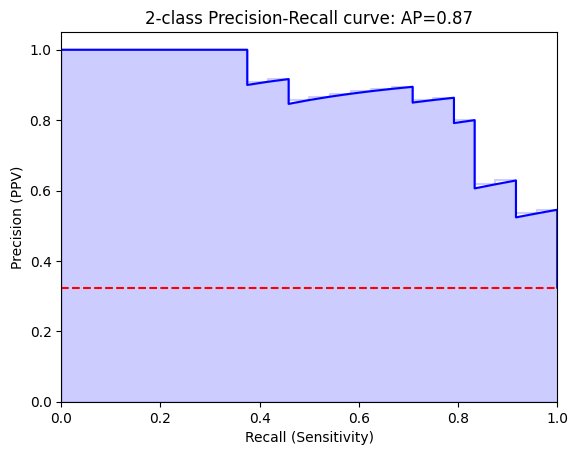

Threshold for best F1:
0.1467563
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[47  3]
 [ 5 19]]


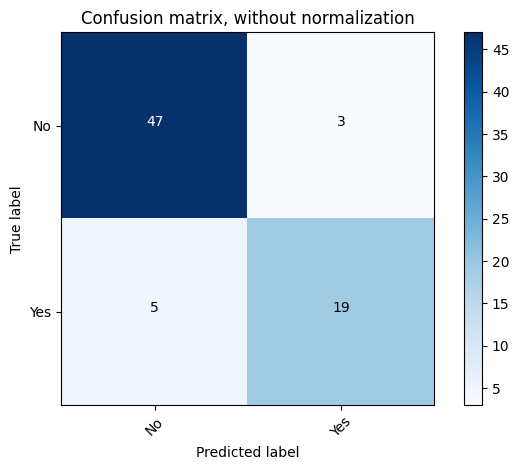

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.94      0.92        50
         Yes       0.86      0.79      0.83        24

    accuracy                           0.89        74
   macro avg       0.88      0.87      0.87        74
weighted avg       0.89      0.89      0.89        74

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[48  2]
 [ 8 16]]


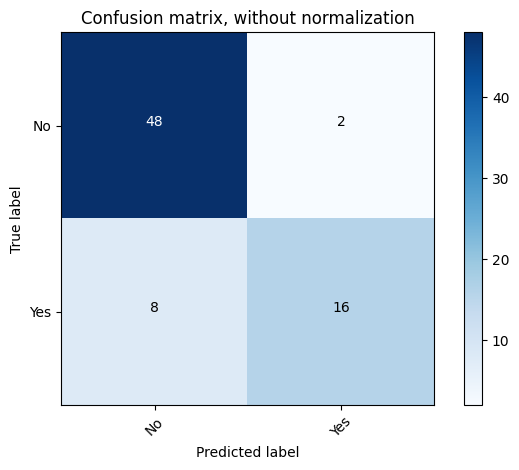

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.96      0.91        50
         Yes       0.89      0.67      0.76        24

    accuracy                           0.86        74
   macro avg       0.87      0.81      0.83        74
weighted avg       0.87      0.86      0.86        74



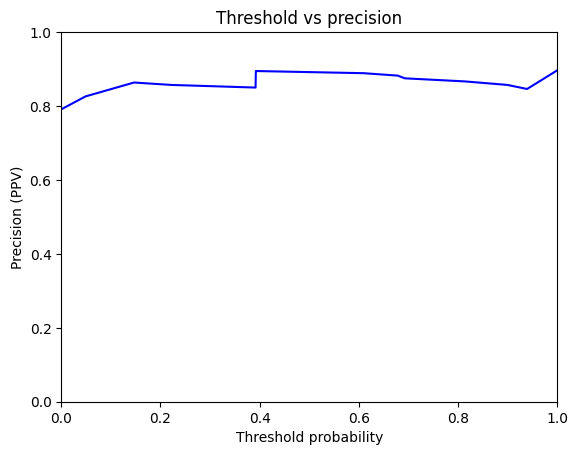

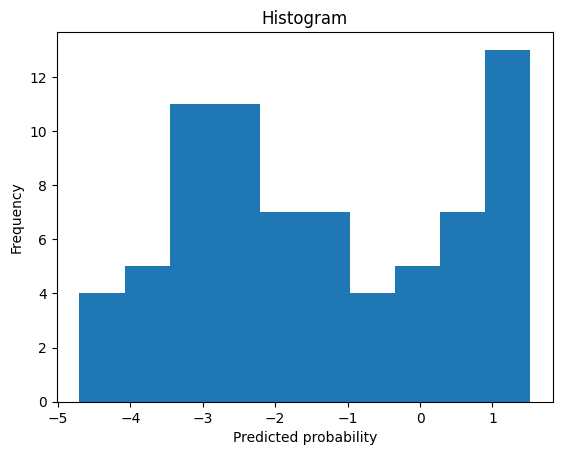

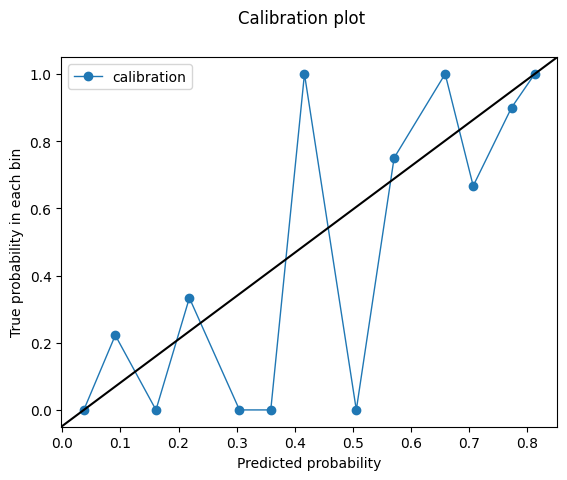

0.1467563
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/1504891696.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.7675000000000001
Outcome probability: 0.32432432432432434
Average precision score: 0.63
Best F1: 0.65


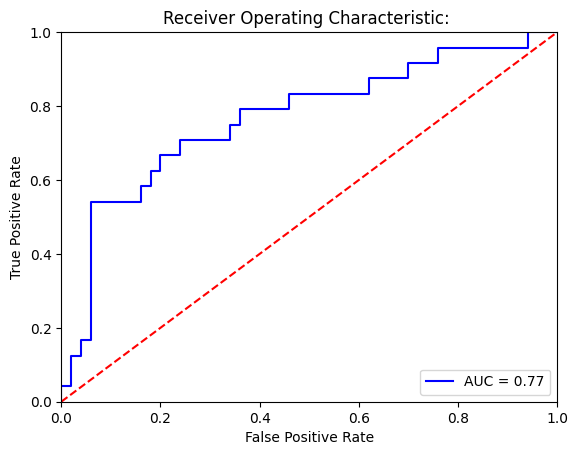

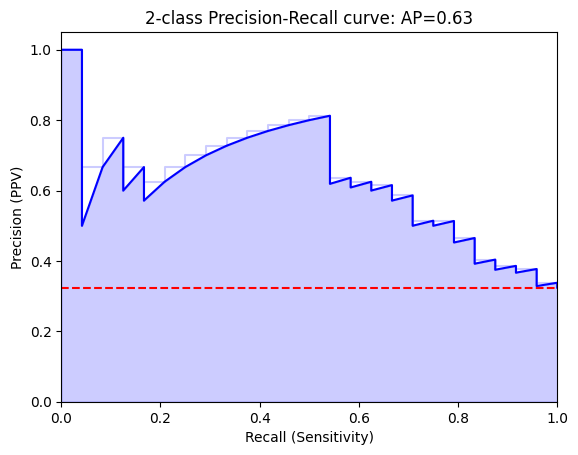

Threshold for best F1:
-3.7537856
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[47  3]
 [11 13]]


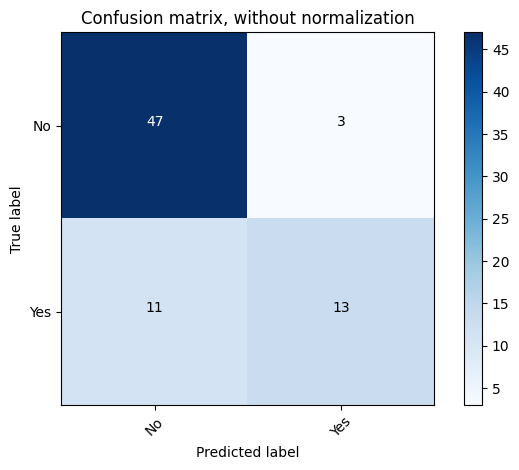

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.81      0.94      0.87        50
         Yes       0.81      0.54      0.65        24

    accuracy                           0.81        74
   macro avg       0.81      0.74      0.76        74
weighted avg       0.81      0.81      0.80        74

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[49  1]
 [22  2]]


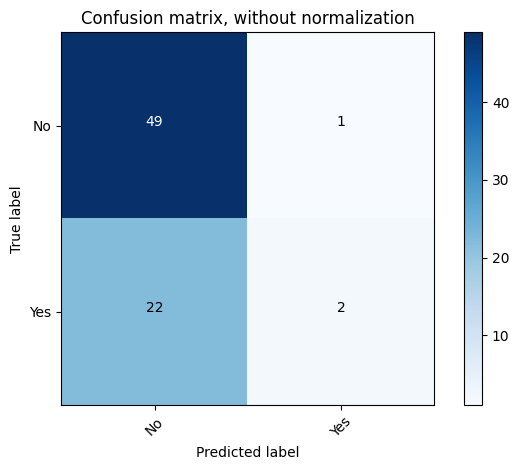

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.69      0.98      0.81        50
         Yes       0.67      0.08      0.15        24

    accuracy                           0.69        74
   macro avg       0.68      0.53      0.48        74
weighted avg       0.68      0.69      0.60        74



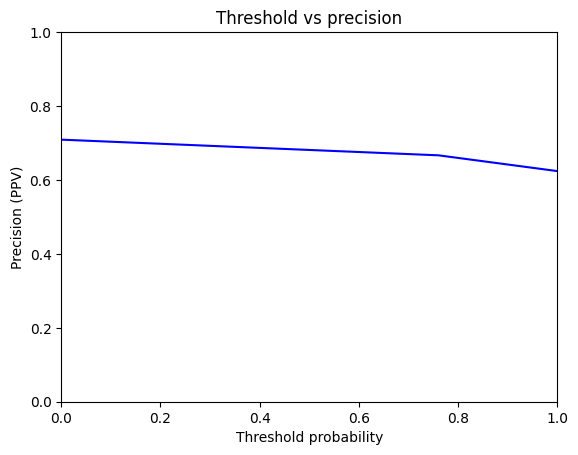

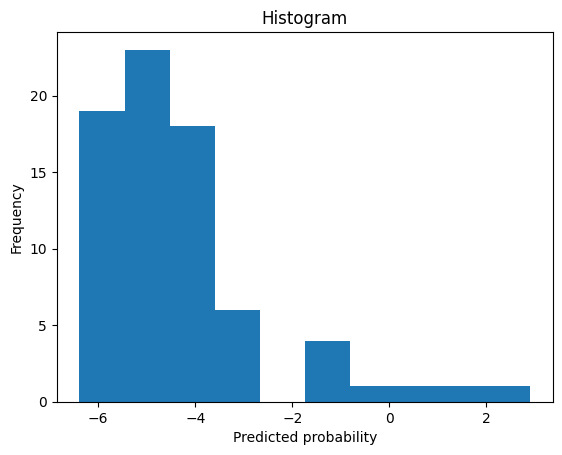

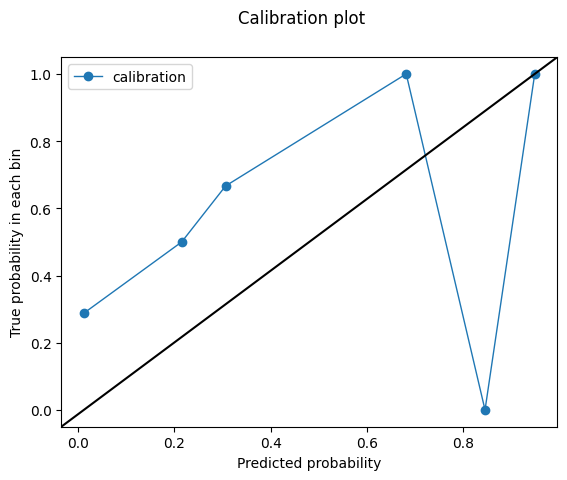

-3.7537856
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/1504891696.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.9333333333333333
Outcome probability: 0.32432432432432434
Average precision score: 0.89
Best F1: 0.8085106382978724


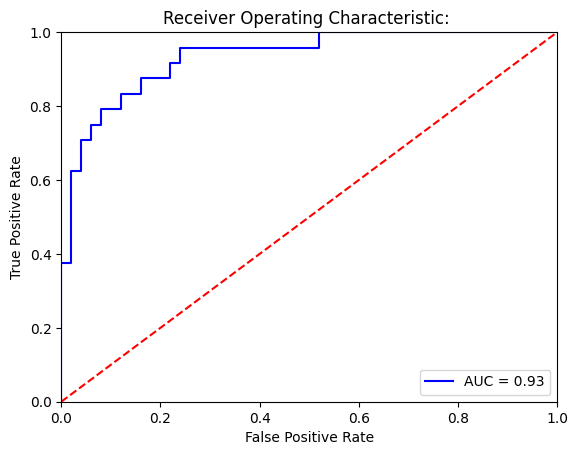

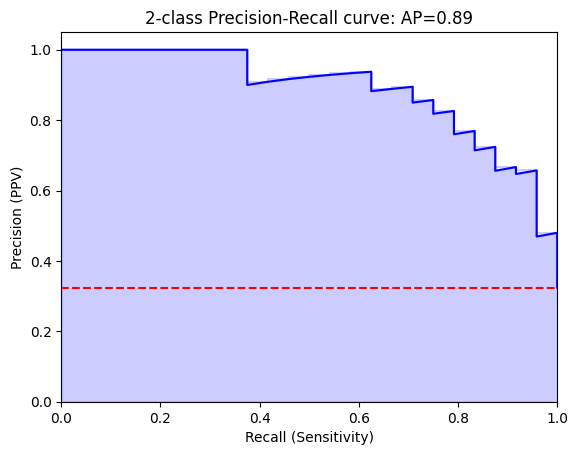

Threshold for best F1:
-0.6953208
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[46  4]
 [ 5 19]]


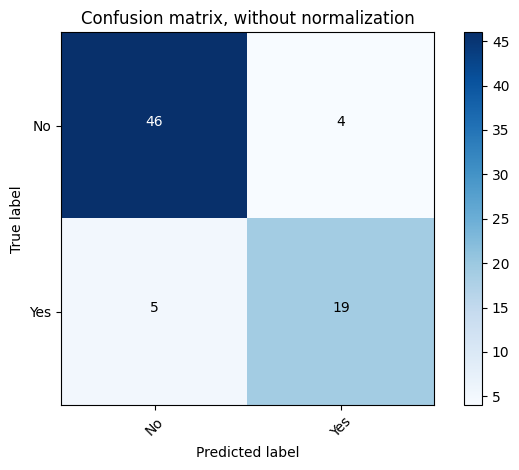

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.92      0.91        50
         Yes       0.83      0.79      0.81        24

    accuracy                           0.88        74
   macro avg       0.86      0.86      0.86        74
weighted avg       0.88      0.88      0.88        74

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[50  0]
 [17  7]]


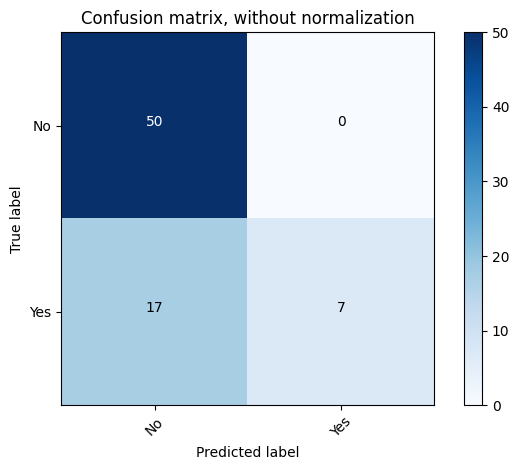

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.75      1.00      0.85        50
         Yes       1.00      0.29      0.45        24

    accuracy                           0.77        74
   macro avg       0.87      0.65      0.65        74
weighted avg       0.83      0.77      0.72        74



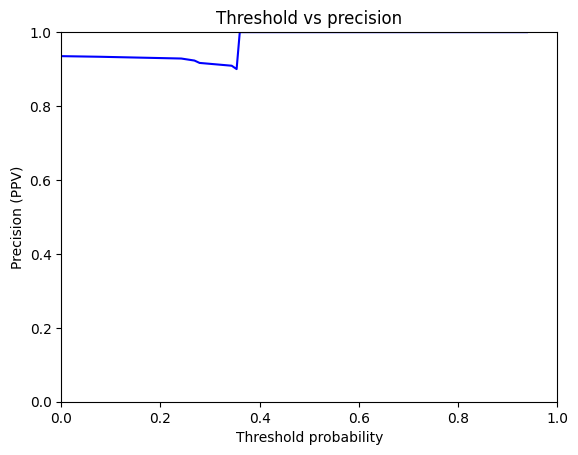

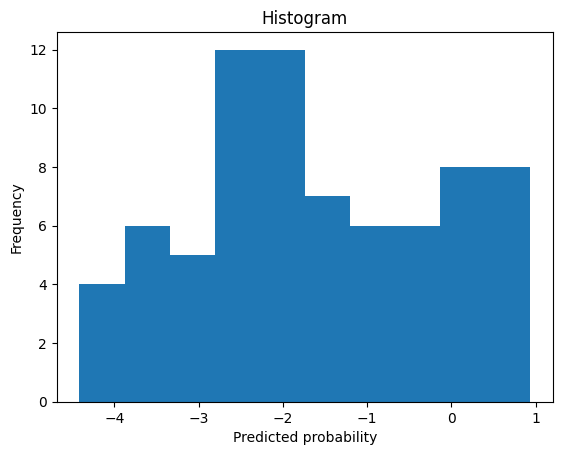

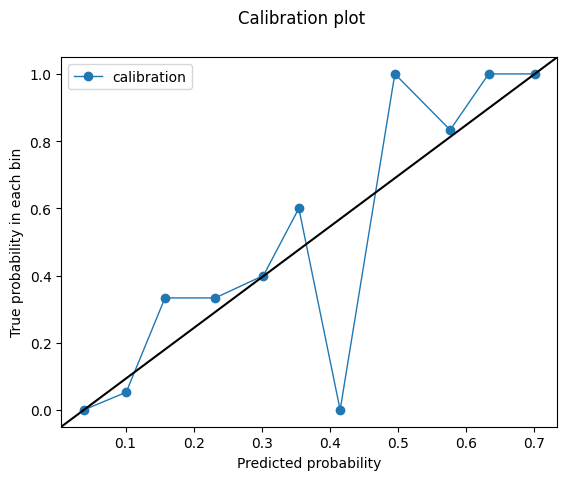

-0.6953208


In [36]:
print('model performance for Hispanic patients')

for model_type in model_paths:

    print('test set')
    print('model type')
    print(model_type)
    test = test_full[test_full.HISPANIC_IND == 'Y' ].copy()
    test_day_text = test
    test_day_text['text'] = test_day_text.text.astype(str)

    test_day_text = test_day_text.sort_values(by=['obs','dfci_mrn','time'])

    test_day_text['text'] = test_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    test_day_text = test_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #test_day_text.info()

    # write out actual test dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_test_dataset = data.DataLoader(RecistDataset(test.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_test_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['prcr_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = test_day_text.reset_index(drop=True)



    test_output = pd.concat([output, resultframe], axis=1)
    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    test_output= test_output[test_output.overall_response != 'BL']
    print('Hispanic patients')
    print('model type')
    print(model_type)
    print(eval_model(test_output.prcr_pred, test_output.outcome, graph=True))


model performance for men
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/1031396132.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.9518682108288601
Outcome probability: 0.3704866562009419
Average precision score: 0.93
Best F1: 0.8614718614718614


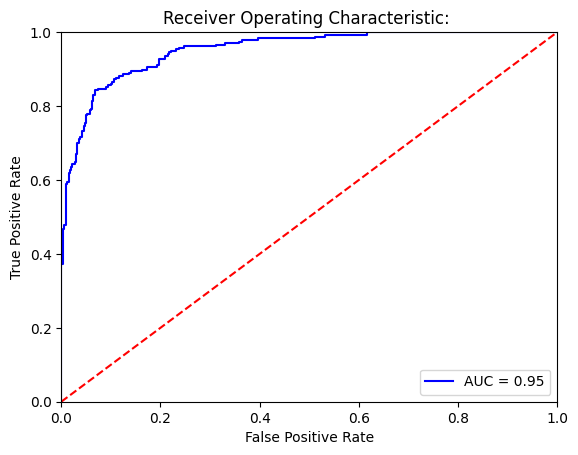

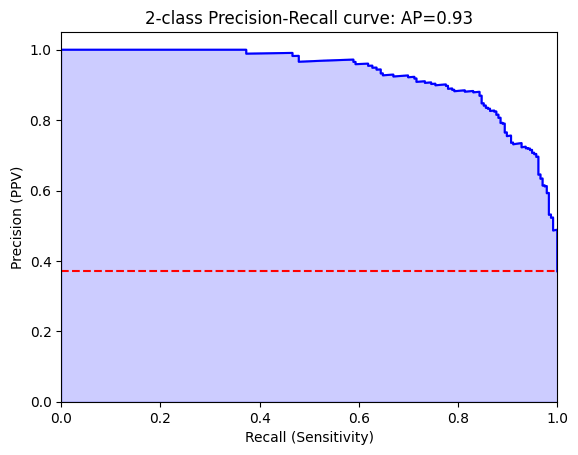

Threshold for best F1:
0.18019375
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[374  27]
 [ 37 199]]


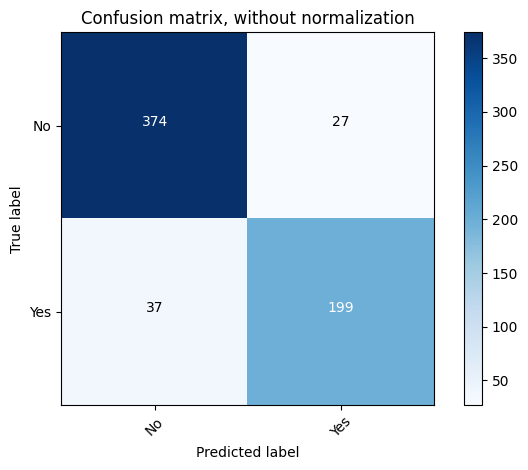

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.93      0.92       401
         Yes       0.88      0.84      0.86       236

    accuracy                           0.90       637
   macro avg       0.90      0.89      0.89       637
weighted avg       0.90      0.90      0.90       637

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[384  17]
 [ 66 170]]


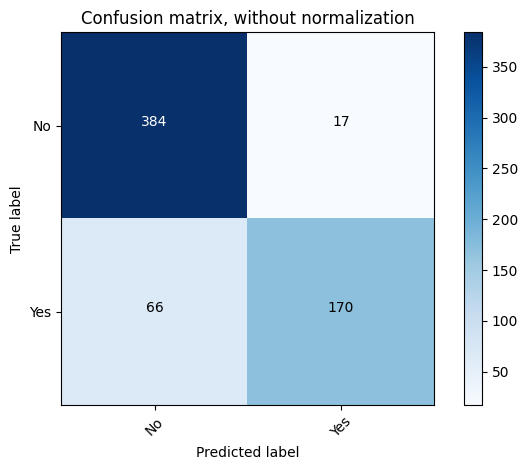

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.85      0.96      0.90       401
         Yes       0.91      0.72      0.80       236

    accuracy                           0.87       637
   macro avg       0.88      0.84      0.85       637
weighted avg       0.87      0.87      0.87       637



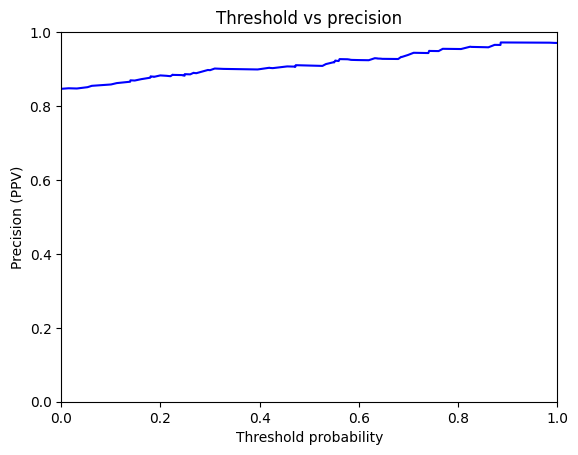

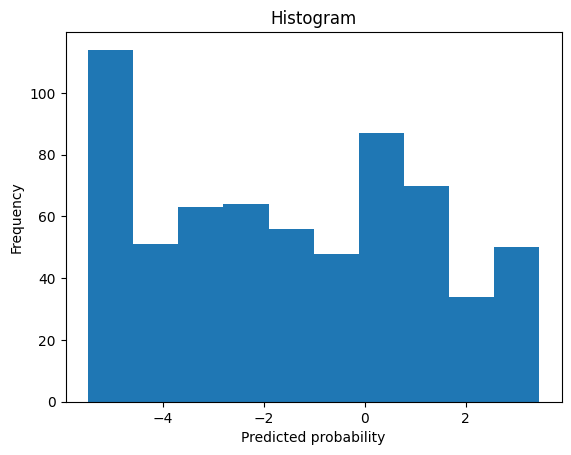

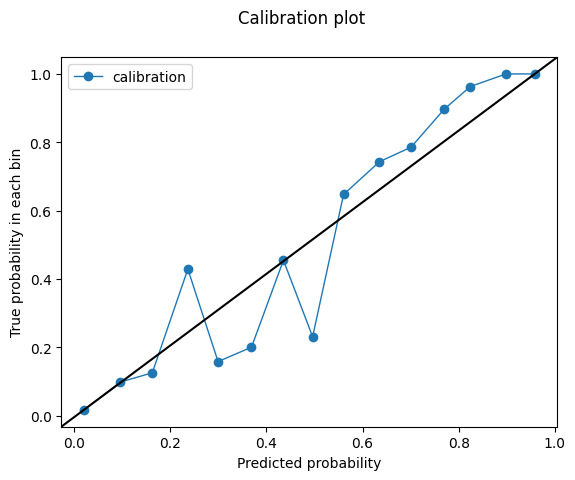

0.18019375
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/1031396132.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.9389555771587978
Outcome probability: 0.3704866562009419
Average precision score: 0.91
Best F1: 0.8475991649269311


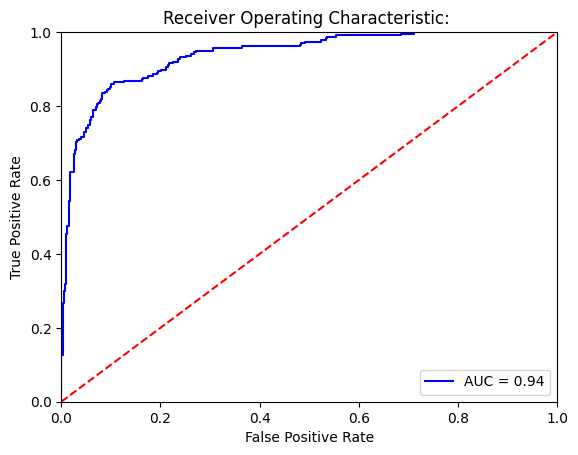

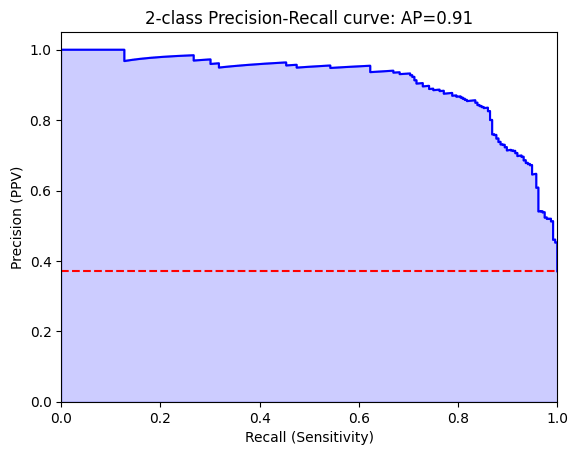

Threshold for best F1:
-0.037544545
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[361  40]
 [ 33 203]]


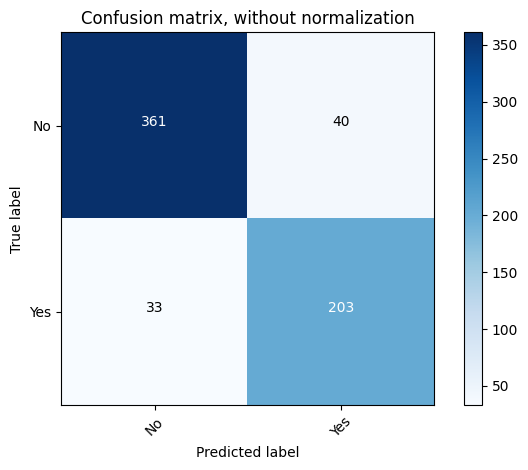

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.90      0.91       401
         Yes       0.84      0.86      0.85       236

    accuracy                           0.89       637
   macro avg       0.88      0.88      0.88       637
weighted avg       0.89      0.89      0.89       637

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[389  12]
 [ 75 161]]


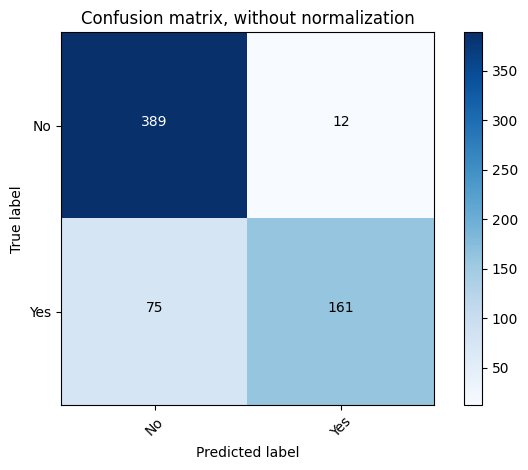

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      0.97      0.90       401
         Yes       0.93      0.68      0.79       236

    accuracy                           0.86       637
   macro avg       0.88      0.83      0.84       637
weighted avg       0.87      0.86      0.86       637



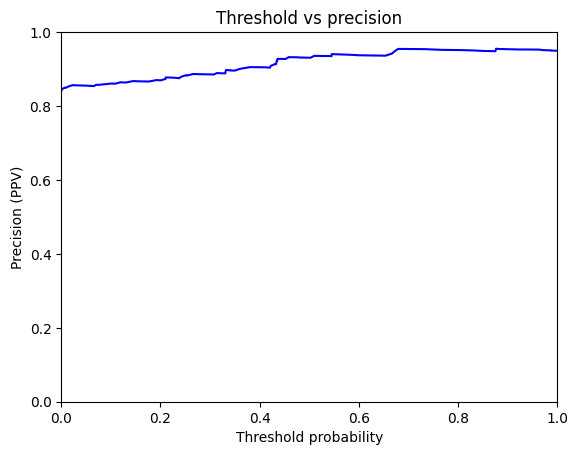

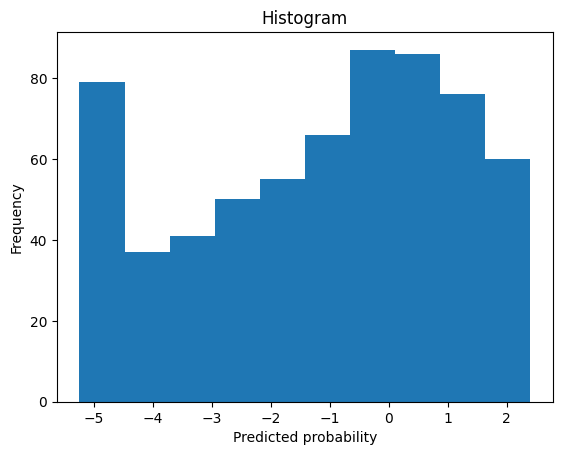

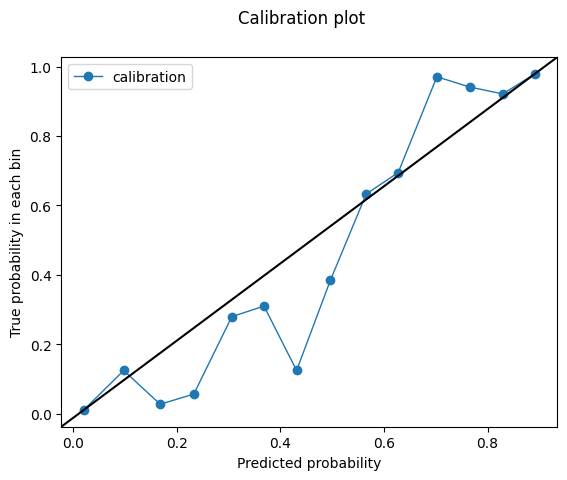

-0.037544545
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/1031396132.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.8798977133437593
Outcome probability: 0.3704866562009419
Average precision score: 0.78
Best F1: 0.766355140186916


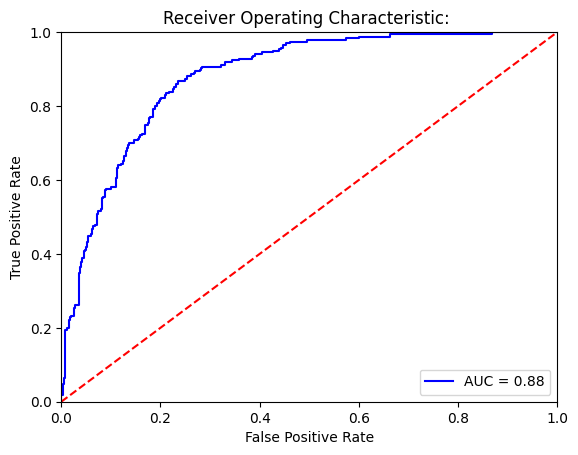

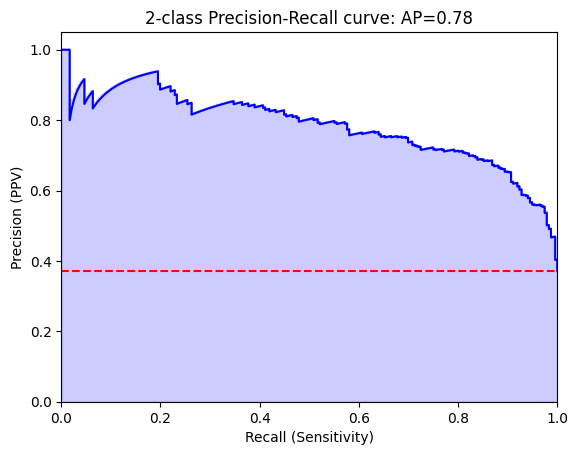

Threshold for best F1:
-1.0075308
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[307  94]
 [ 31 205]]


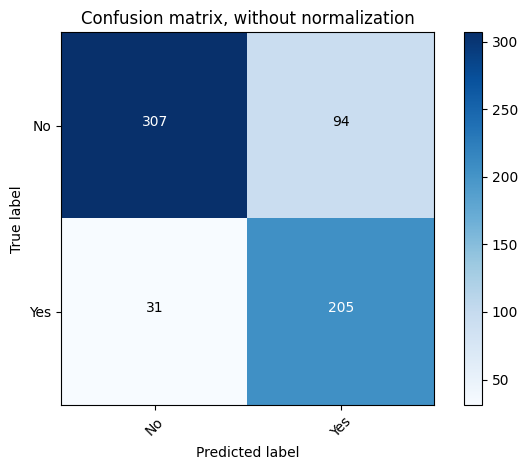

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.77      0.83       401
         Yes       0.69      0.87      0.77       236

    accuracy                           0.80       637
   macro avg       0.80      0.82      0.80       637
weighted avg       0.83      0.80      0.81       637

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[385  16]
 [147  89]]


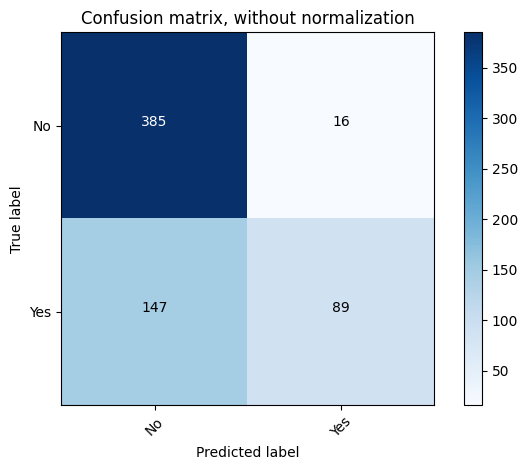

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.72      0.96      0.83       401
         Yes       0.85      0.38      0.52       236

    accuracy                           0.74       637
   macro avg       0.79      0.67      0.67       637
weighted avg       0.77      0.74      0.71       637



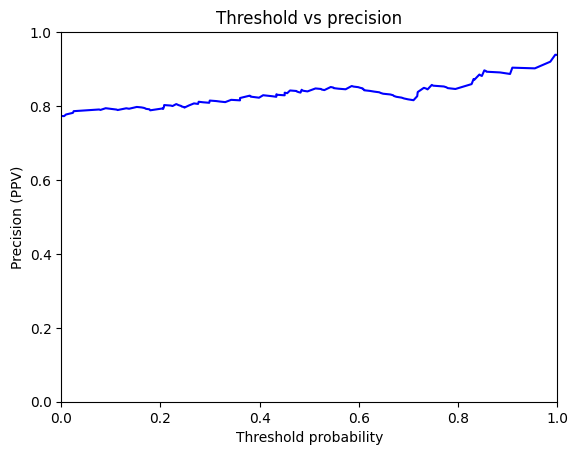

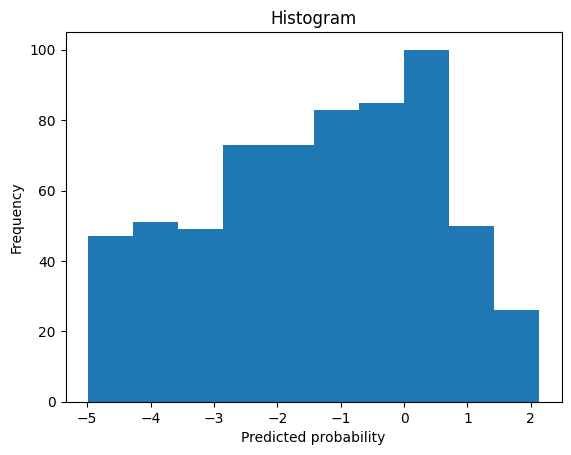

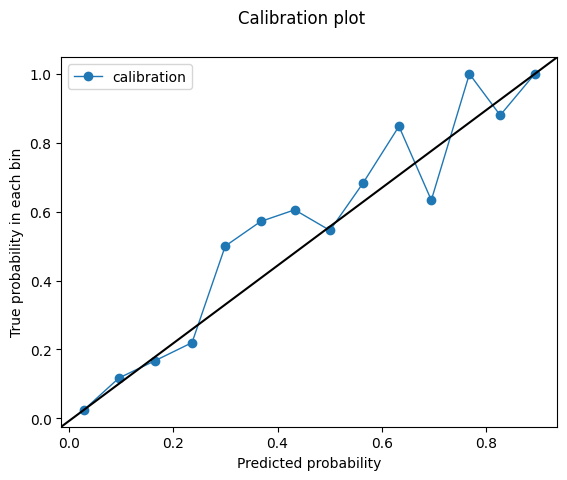

-1.0075308
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/1031396132.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.6488651253222875
Outcome probability: 0.3704866562009419
Average precision score: 0.48
Best F1: 0.5879120879120879


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


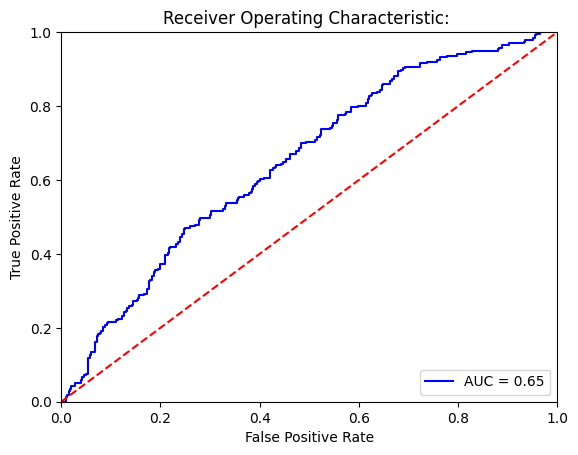

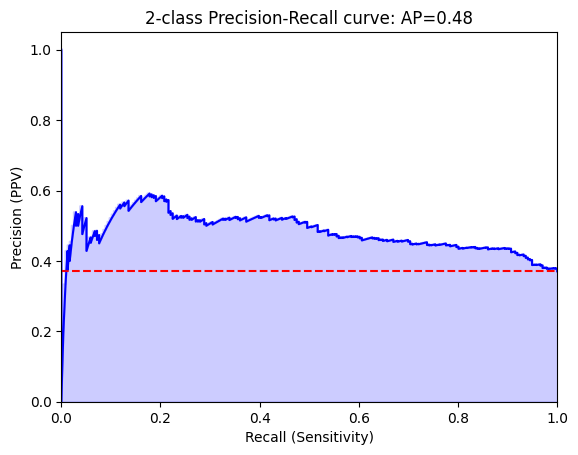

Threshold for best F1:
4.3681655
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[397   4]
 [236   0]]


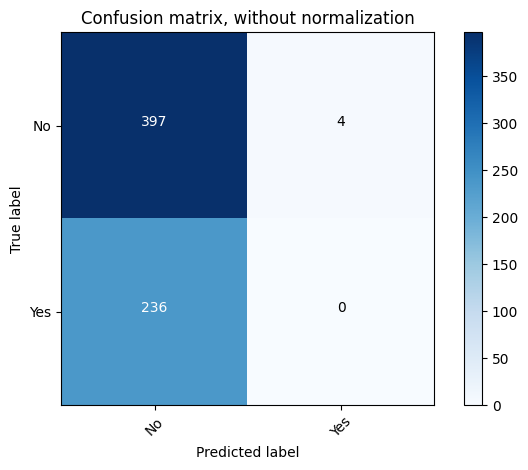

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.63      0.99      0.77       401
         Yes       0.00      0.00      0.00       236

    accuracy                           0.62       637
   macro avg       0.31      0.50      0.38       637
weighted avg       0.39      0.62      0.48       637

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[385  16]
 [224  12]]


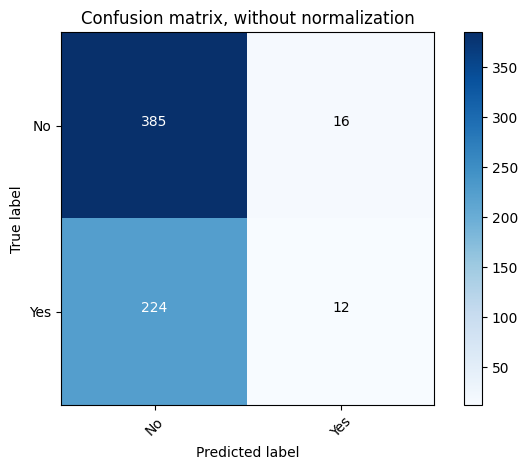

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.63      0.96      0.76       401
         Yes       0.43      0.05      0.09       236

    accuracy                           0.62       637
   macro avg       0.53      0.51      0.43       637
weighted avg       0.56      0.62      0.51       637



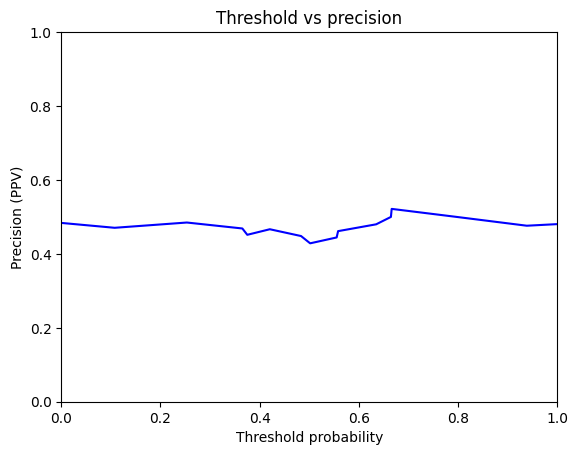

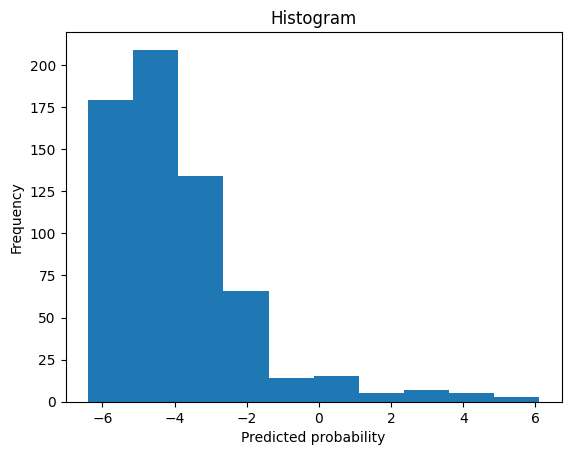

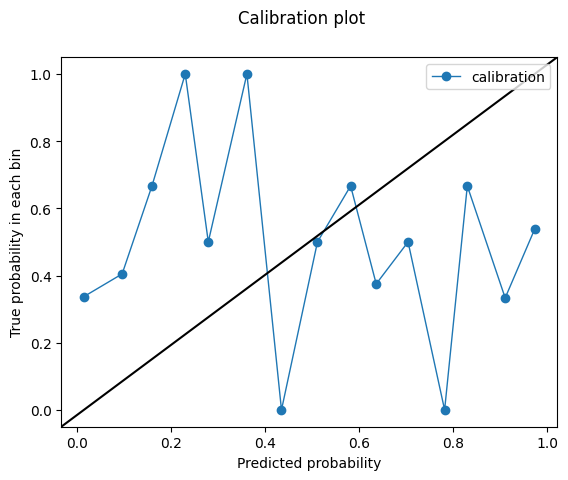

4.3681655
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/1031396132.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.925451202502219
Outcome probability: 0.3704866562009419
Average precision score: 0.89
Best F1: 0.8075313807531381


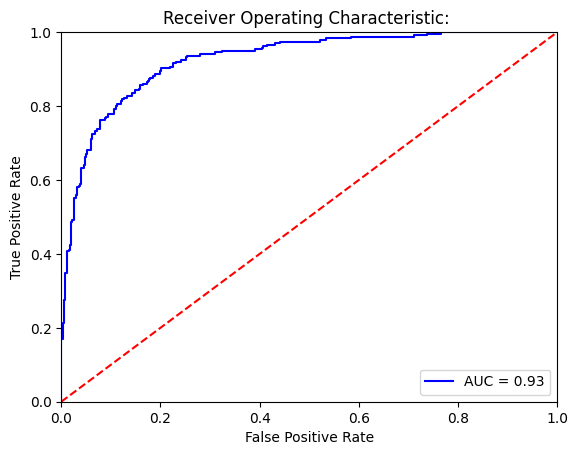

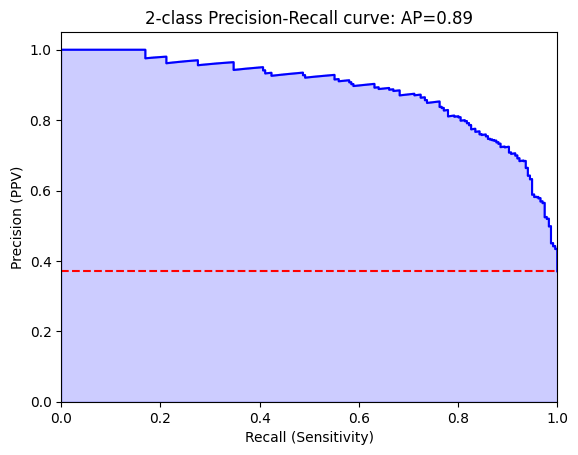

Threshold for best F1:
-1.2321199
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[352  49]
 [ 43 193]]


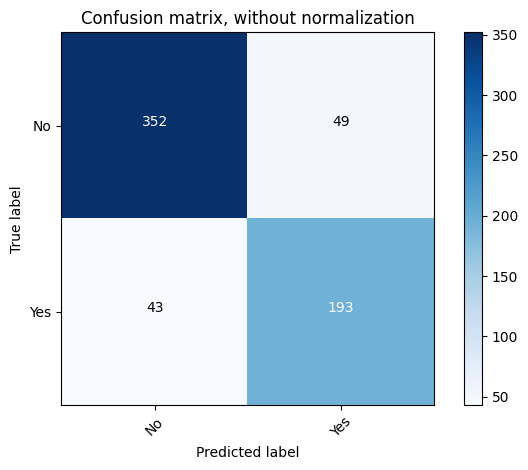

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.88      0.88       401
         Yes       0.80      0.82      0.81       236

    accuracy                           0.86       637
   macro avg       0.84      0.85      0.85       637
weighted avg       0.86      0.86      0.86       637

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[400   1]
 [191  45]]


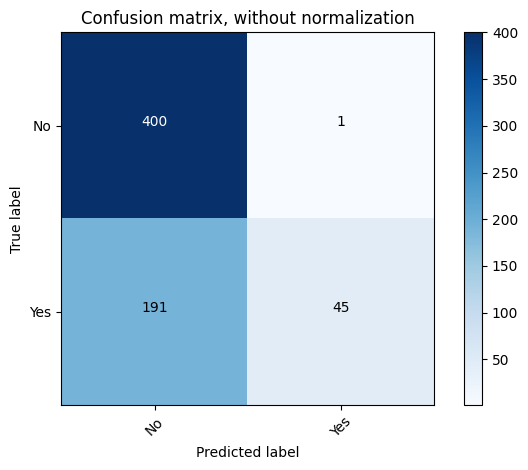

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.68      1.00      0.81       401
         Yes       0.98      0.19      0.32       236

    accuracy                           0.70       637
   macro avg       0.83      0.59      0.56       637
weighted avg       0.79      0.70      0.63       637



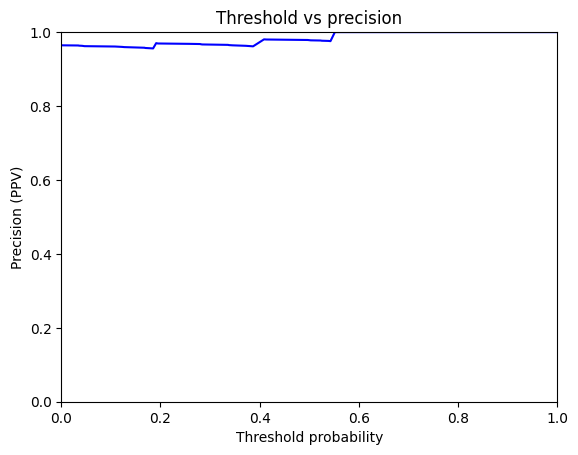

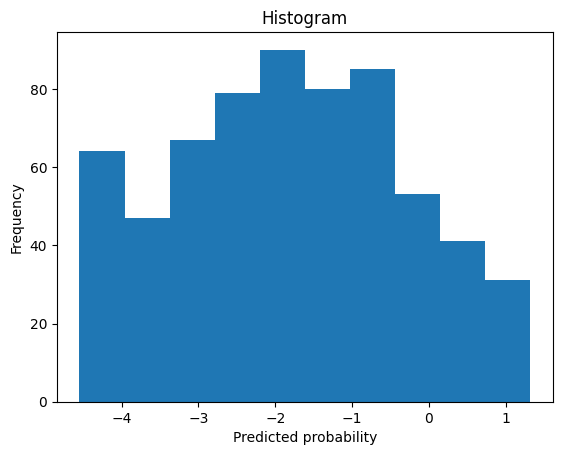

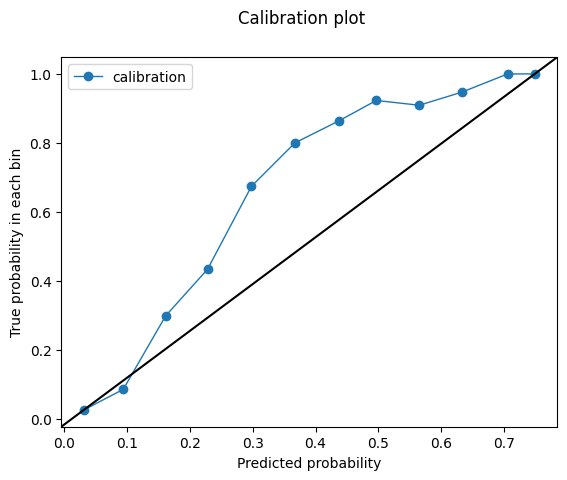

-1.2321199


In [37]:
print('model performance for men')

for model_type in model_paths:

    print('validation set')
    print('model type')
    print(model_type)
    validation = validation_full[validation_full.GENDER_NM == 'MALE' ].copy()
    validation_day_text = validation
    validation_day_text['text'] = validation_day_text.text.astype(str)

    validation_day_text = validation_day_text.sort_values(by=['obs','dfci_mrn','time'])

    validation_day_text['text'] = validation_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    validation_day_text = validation_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #validation_day_text.info()

    # write out actual validation dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_valid_dataset = data.DataLoader(RecistDataset(validation.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_valid_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['prcr_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = validation_day_text.reset_index(drop=True)



    valid_output = pd.concat([output, resultframe], axis=1)
    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    valid_output= valid_output[valid_output.overall_response != 'BL']
    print('Male patients')
    print('model type')
    print(model_type)
    print(eval_model(valid_output.prcr_pred, valid_output.outcome, graph=True))


model performance for men
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/3388354220.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.8897672902304087
Outcome probability: 0.34164070612668745
Average precision score: 0.82
Best F1: 0.7432835820895523


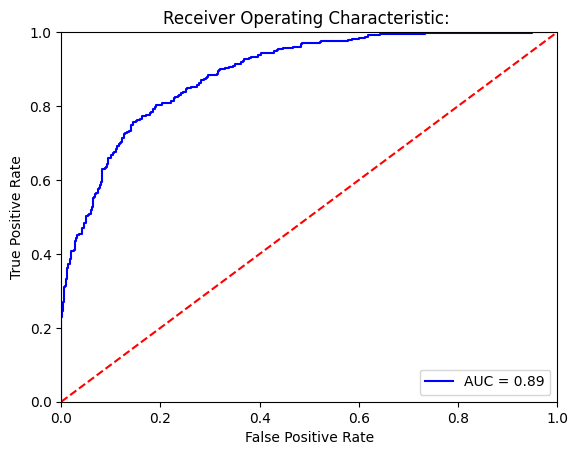

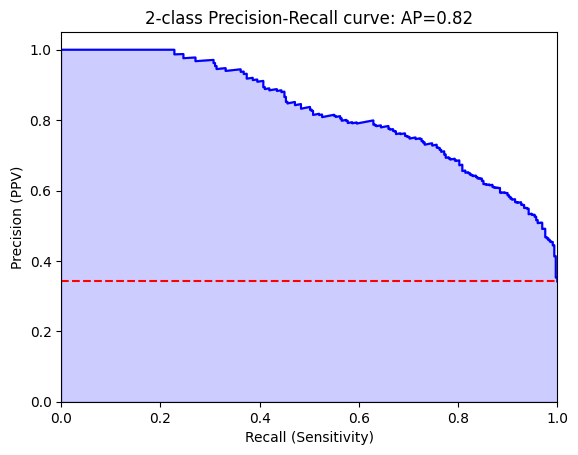

Threshold for best F1:
-0.50403047
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[542  92]
 [ 80 249]]


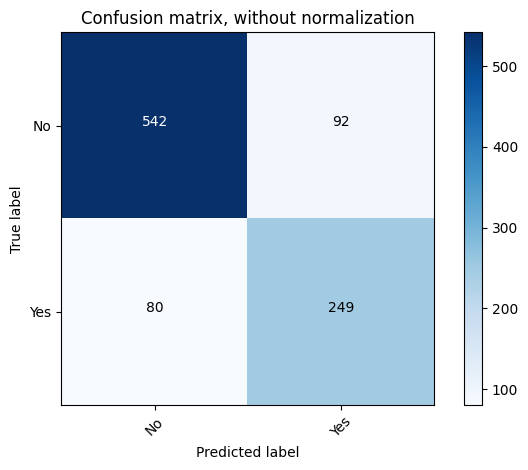

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.85      0.86       634
         Yes       0.73      0.76      0.74       329

    accuracy                           0.82       963
   macro avg       0.80      0.81      0.80       963
weighted avg       0.82      0.82      0.82       963

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[586  48]
 [139 190]]


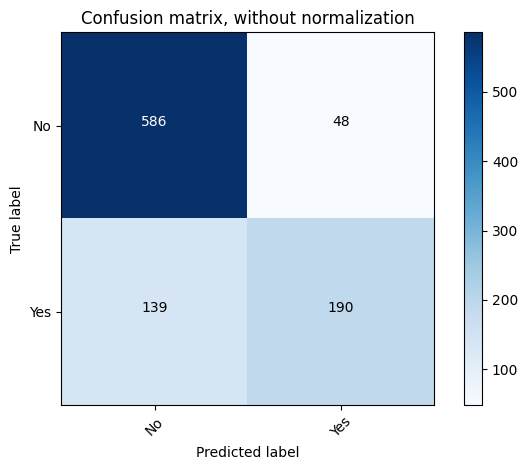

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.81      0.92      0.86       634
         Yes       0.80      0.58      0.67       329

    accuracy                           0.81       963
   macro avg       0.80      0.75      0.77       963
weighted avg       0.80      0.81      0.80       963



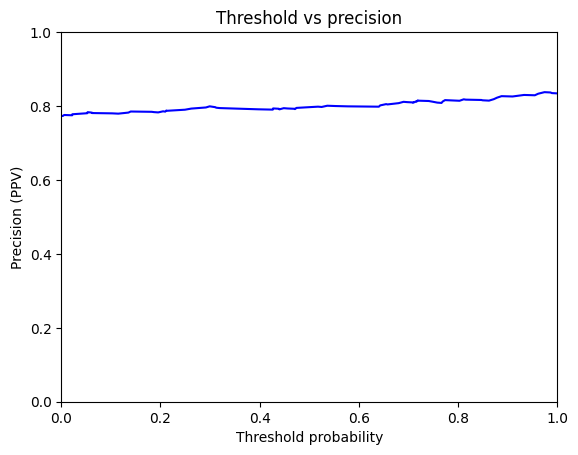

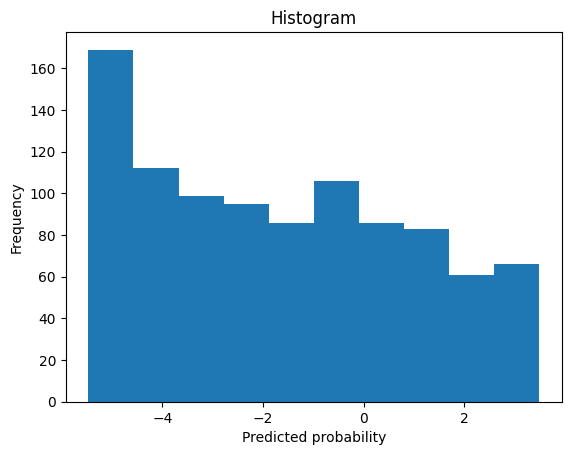

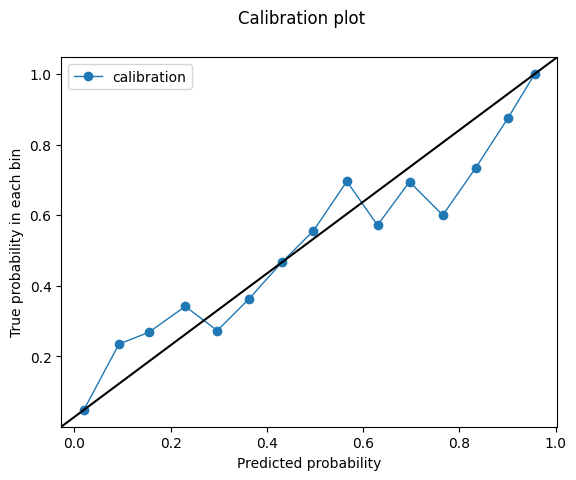

-0.50403047
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/3388354220.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.8671003806583376
Outcome probability: 0.34164070612668745
Average precision score: 0.76
Best F1: 0.7436281859070465


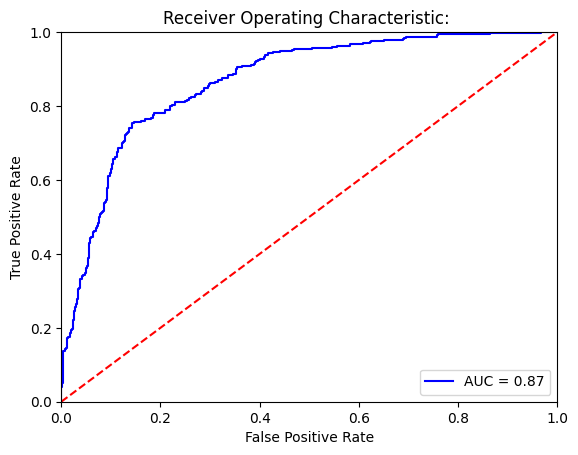

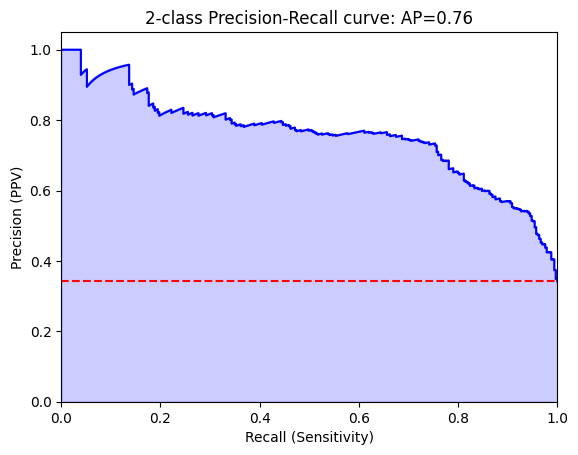

Threshold for best F1:
-0.10411236
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[544  90]
 [ 81 248]]


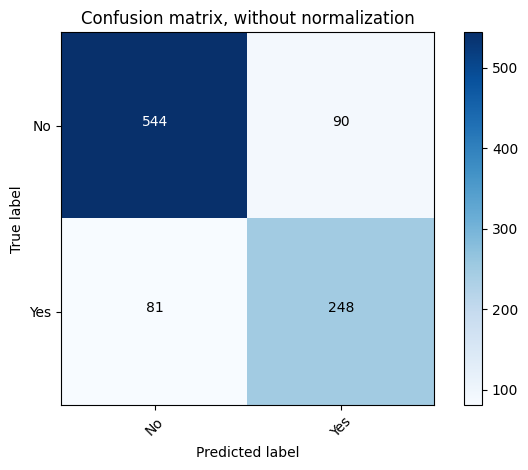

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.86      0.86       634
         Yes       0.73      0.75      0.74       329

    accuracy                           0.82       963
   macro avg       0.80      0.81      0.80       963
weighted avg       0.82      0.82      0.82       963

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[579  55]
 [154 175]]


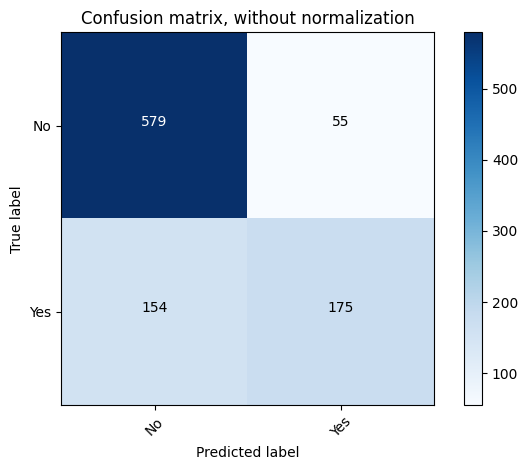

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.79      0.91      0.85       634
         Yes       0.76      0.53      0.63       329

    accuracy                           0.78       963
   macro avg       0.78      0.72      0.74       963
weighted avg       0.78      0.78      0.77       963



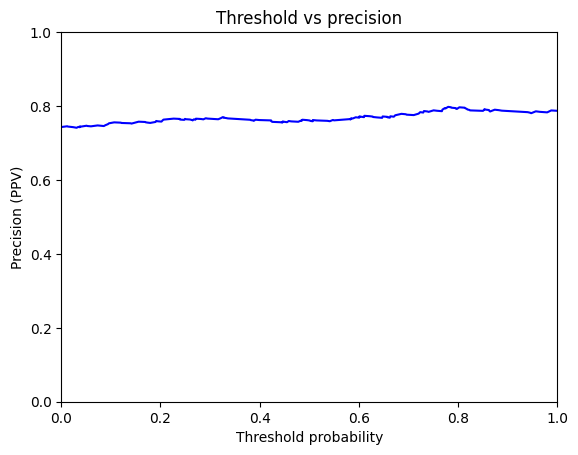

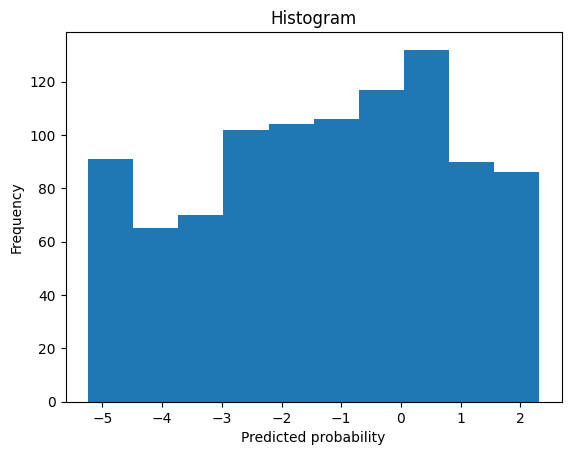

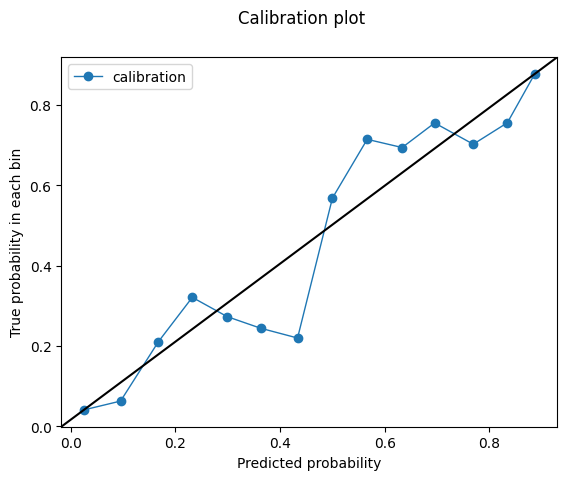

-0.10411236
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/3388354220.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.8032514166818483
Outcome probability: 0.34164070612668745
Average precision score: 0.68
Best F1: 0.6525139664804469


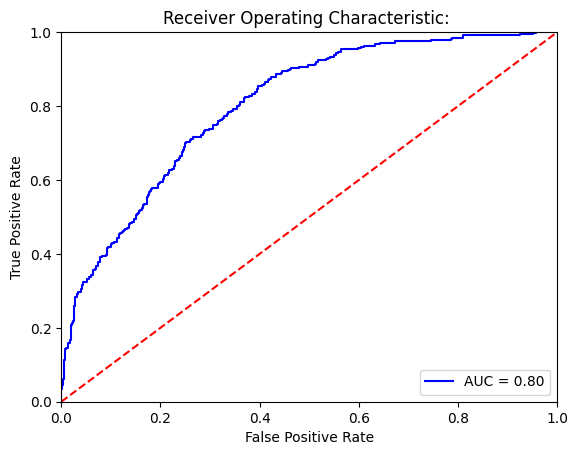

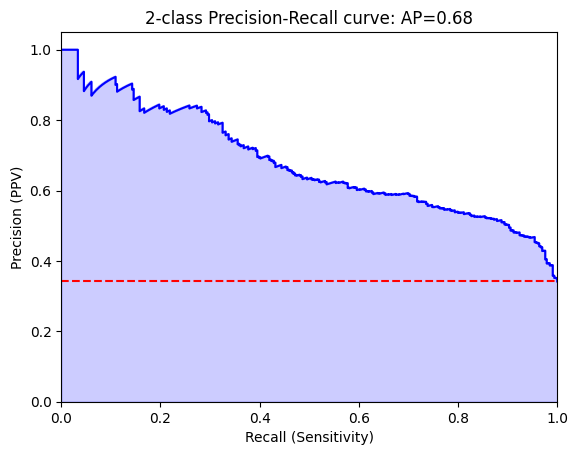

Threshold for best F1:
-1.8899466
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[360 274]
 [ 37 292]]


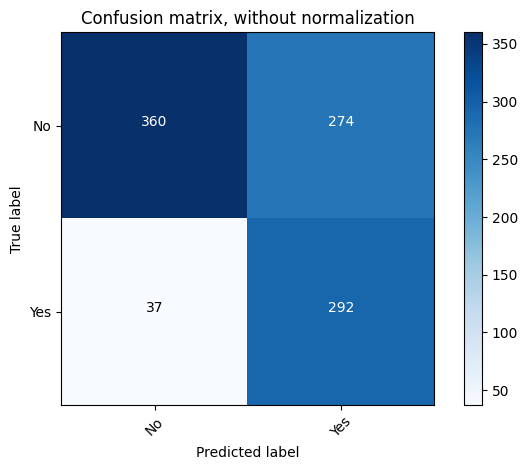

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.57      0.70       634
         Yes       0.52      0.89      0.65       329

    accuracy                           0.68       963
   macro avg       0.71      0.73      0.68       963
weighted avg       0.77      0.68      0.68       963

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[607  27]
 [227 102]]


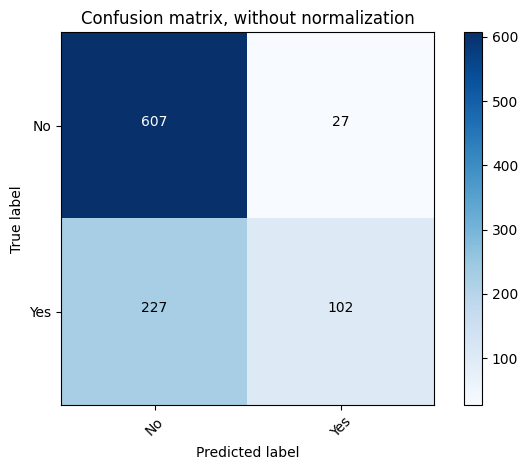

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.73      0.96      0.83       634
         Yes       0.79      0.31      0.45       329

    accuracy                           0.74       963
   macro avg       0.76      0.63      0.64       963
weighted avg       0.75      0.74      0.70       963



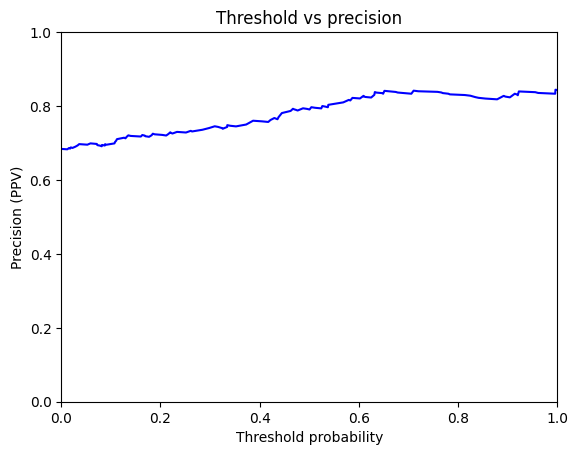

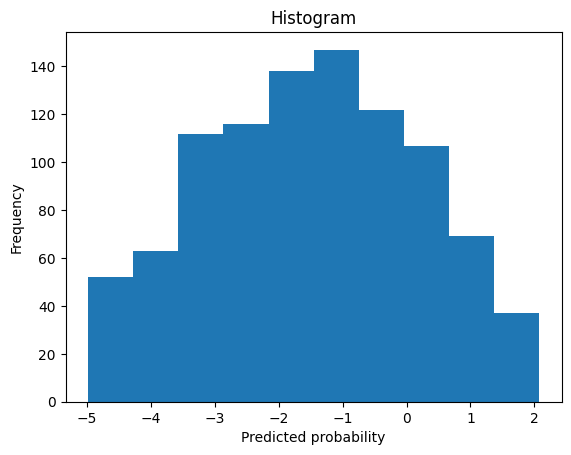

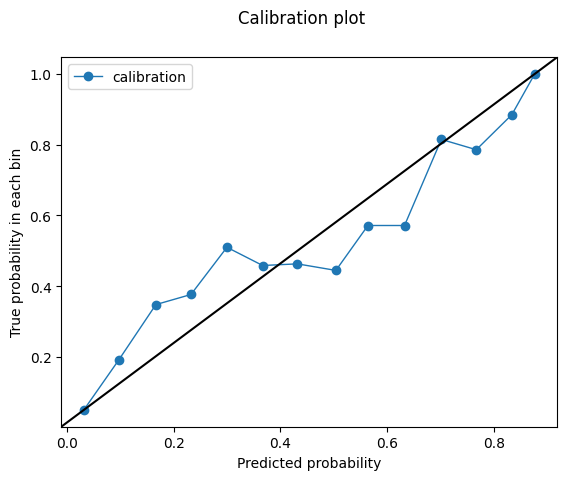

-1.8899466
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/3388354220.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.6668903953285455
Outcome probability: 0.34164070612668745
Average precision score: 0.46
Best F1: 0.5625717566016073


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


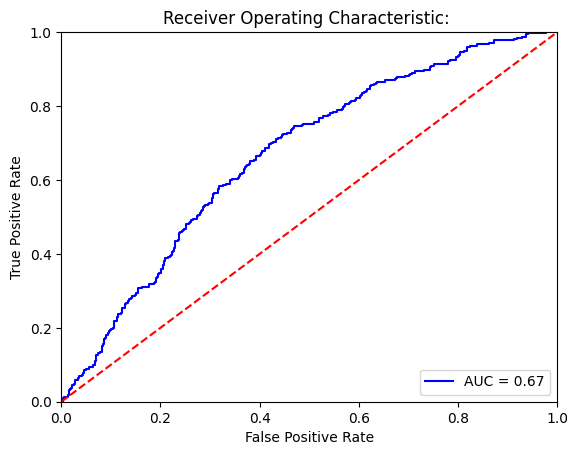

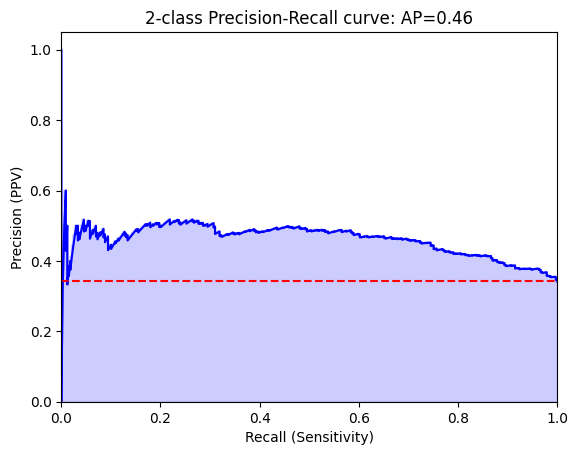

Threshold for best F1:
6.273619
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[632   2]
 [329   0]]


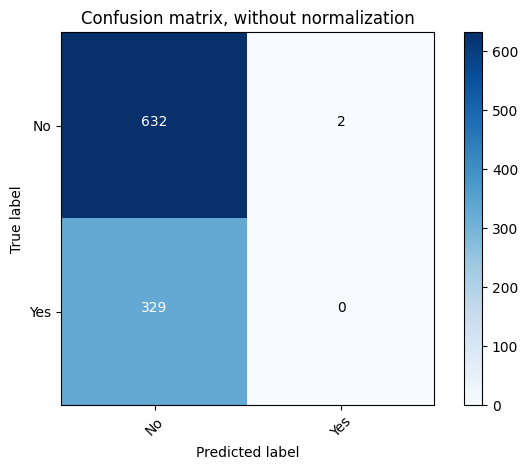

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.66      1.00      0.79       634
         Yes       0.00      0.00      0.00       329

    accuracy                           0.66       963
   macro avg       0.33      0.50      0.40       963
weighted avg       0.43      0.66      0.52       963

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[617  17]
 [311  18]]


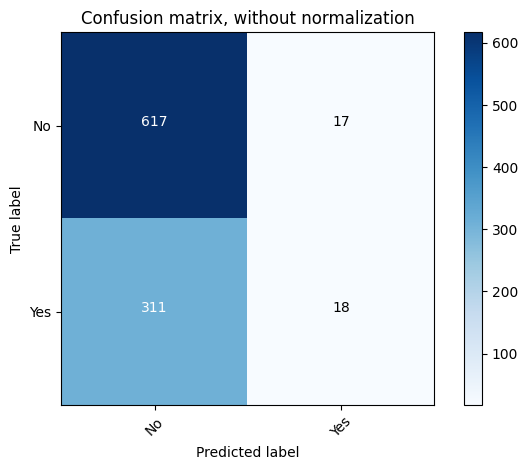

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.66      0.97      0.79       634
         Yes       0.51      0.05      0.10       329

    accuracy                           0.66       963
   macro avg       0.59      0.51      0.44       963
weighted avg       0.61      0.66      0.55       963



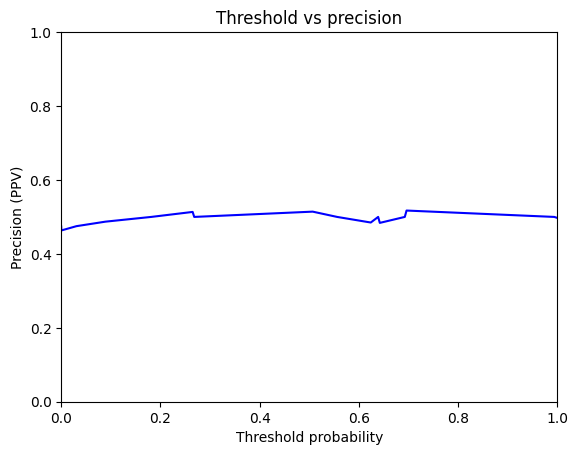

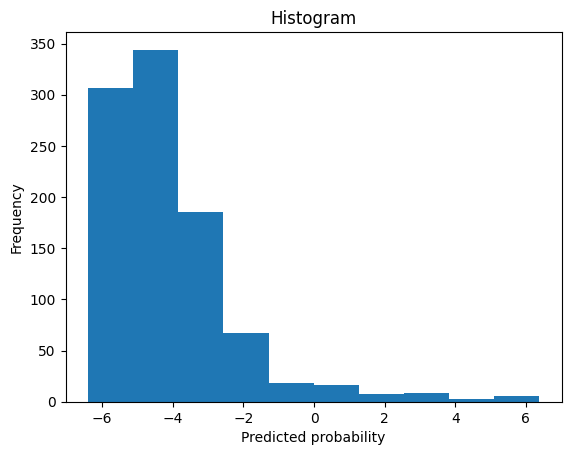

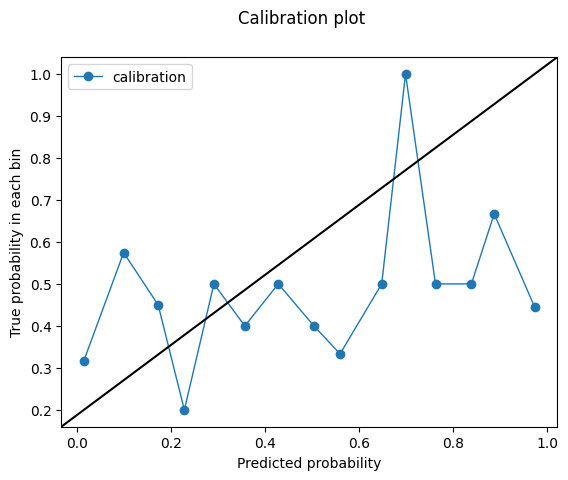

6.273619
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/3388354220.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.8441841734344587
Outcome probability: 0.34164070612668745
Average precision score: 0.73
Best F1: 0.7172995780590716


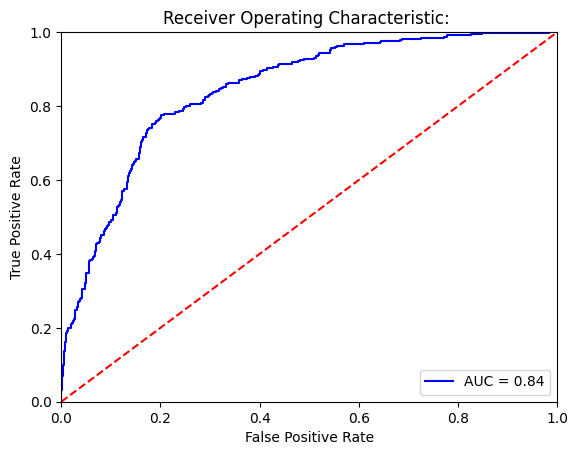

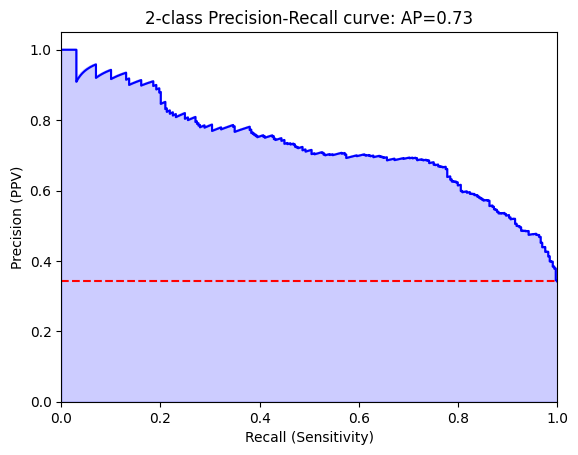

Threshold for best F1:
-1.4380164
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[507 127]
 [ 74 255]]


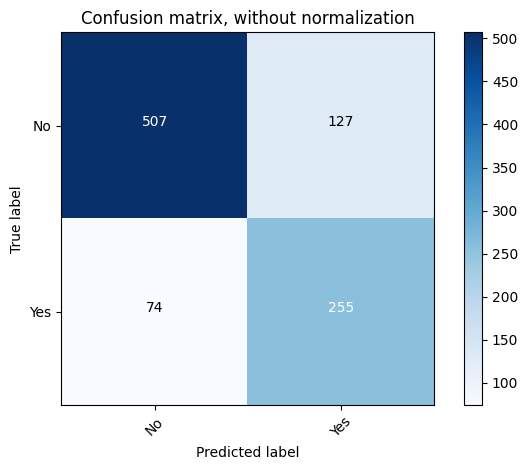

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.80      0.83       634
         Yes       0.67      0.78      0.72       329

    accuracy                           0.79       963
   macro avg       0.77      0.79      0.78       963
weighted avg       0.80      0.79      0.79       963

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[631   3]
 [287  42]]


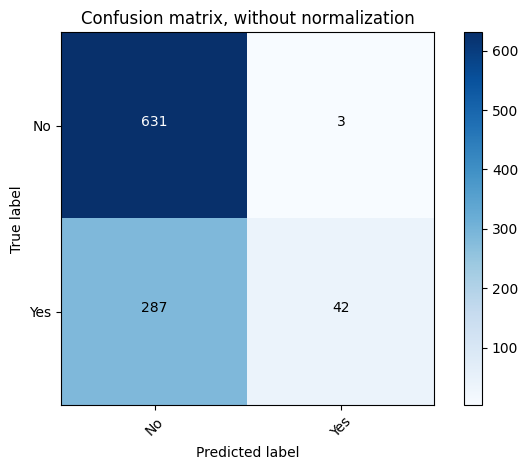

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.69      1.00      0.81       634
         Yes       0.93      0.13      0.22       329

    accuracy                           0.70       963
   macro avg       0.81      0.56      0.52       963
weighted avg       0.77      0.70      0.61       963



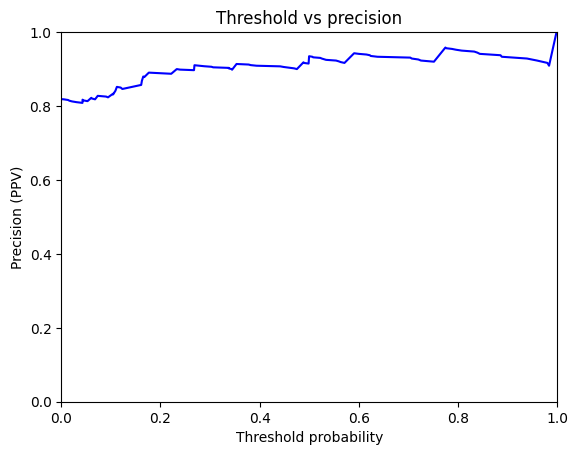

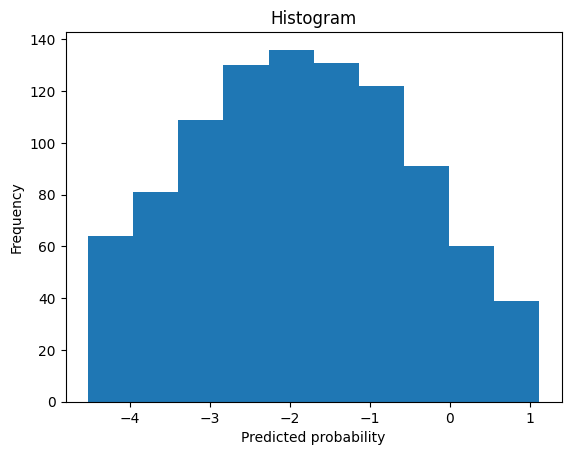

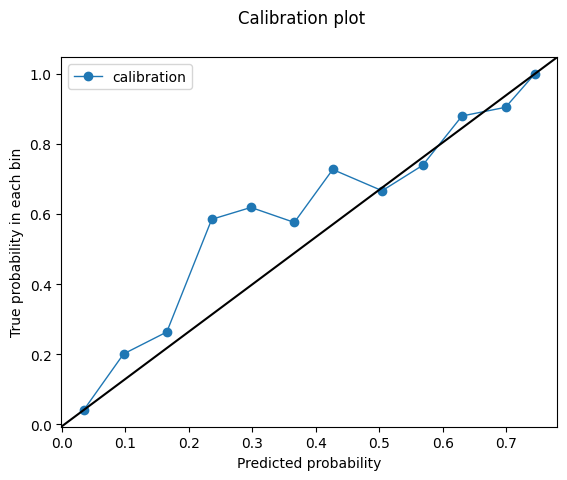

-1.4380164


In [38]:
print('model performance for men')

for model_type in model_paths:

    print('test set')
    print('model type')
    print(model_type)
    test = test_full[test_full.GENDER_NM == 'MALE' ].copy()
    test_day_text = test
    test_day_text['text'] = test_day_text.text.astype(str)

    test_day_text = test_day_text.sort_values(by=['obs','dfci_mrn','time'])

    test_day_text['text'] = test_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    test_day_text = test_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #test_day_text.info()

    # write out actual test dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_test_dataset = data.DataLoader(RecistDataset(test.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_test_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['prcr_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = test_day_text.reset_index(drop=True)



    test_output = pd.concat([output, resultframe], axis=1)
    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    test_output= test_output[test_output.overall_response != 'BL']
    print('Male patients')
    print('model type')
    print(model_type)
    print(eval_model(test_output.prcr_pred, test_output.outcome, graph=True))


model performance for women
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/3881868749.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.8629509457209225
Outcome probability: 0.3564139941690962
Average precision score: 0.79
Best F1: 0.730804810360777


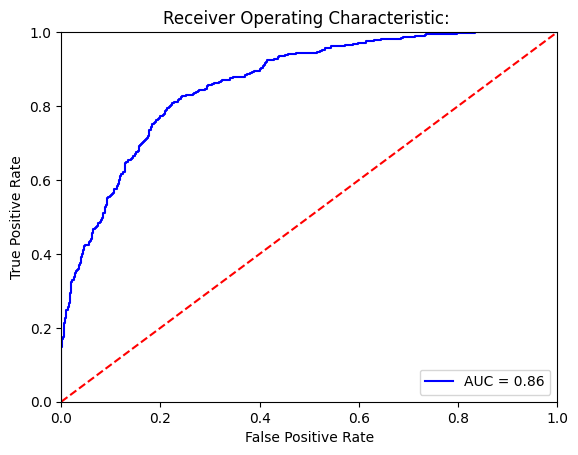

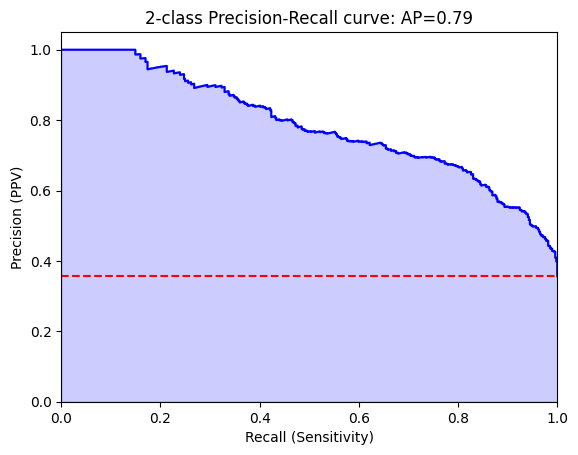

Threshold for best F1:
-0.7486489
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[686 197]
 [ 94 395]]


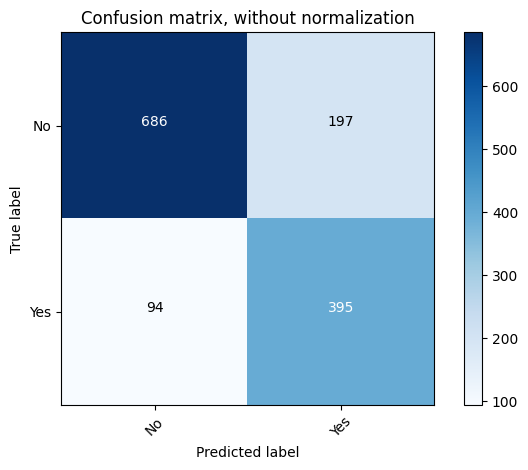

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.78      0.83       883
         Yes       0.67      0.81      0.73       489

    accuracy                           0.79      1372
   macro avg       0.77      0.79      0.78      1372
weighted avg       0.80      0.79      0.79      1372

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[803  80]
 [230 259]]


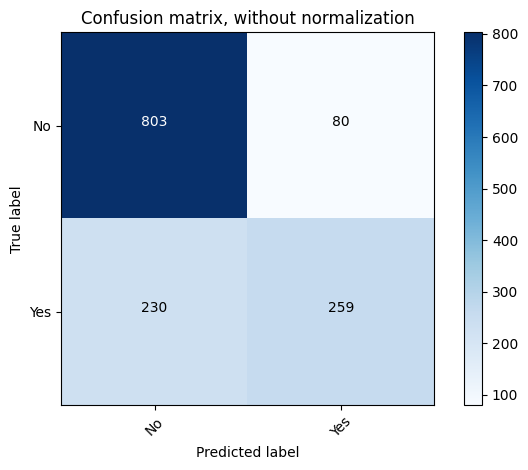

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.78      0.91      0.84       883
         Yes       0.76      0.53      0.63       489

    accuracy                           0.77      1372
   macro avg       0.77      0.72      0.73      1372
weighted avg       0.77      0.77      0.76      1372



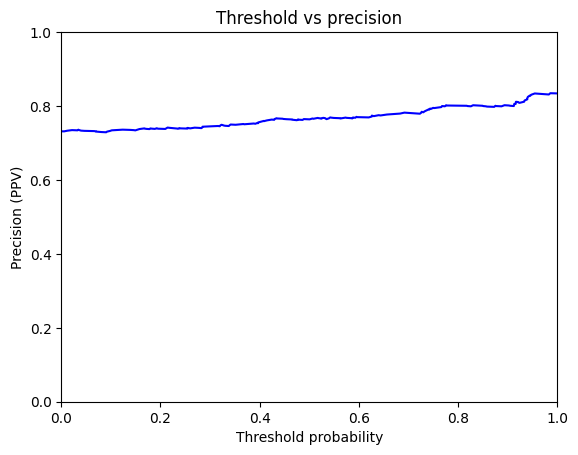

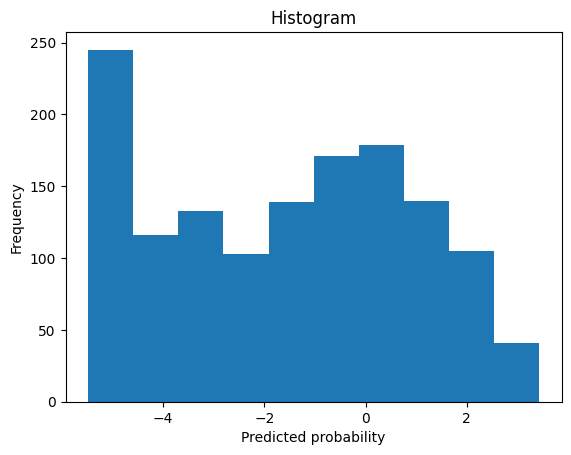

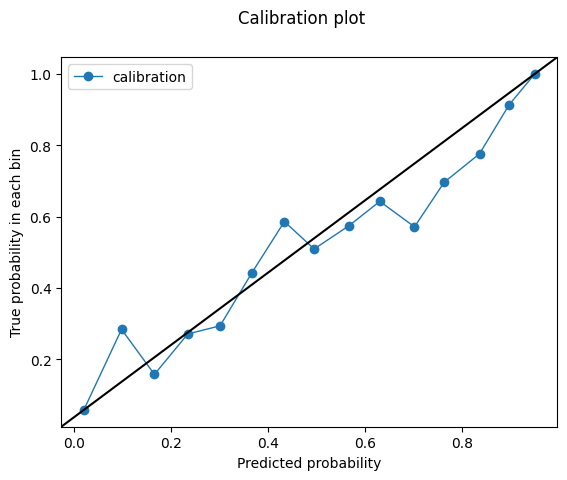

-0.7486489
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/3881868749.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.8491501596852151
Outcome probability: 0.3564139941690962
Average precision score: 0.75
Best F1: 0.7257617728531857


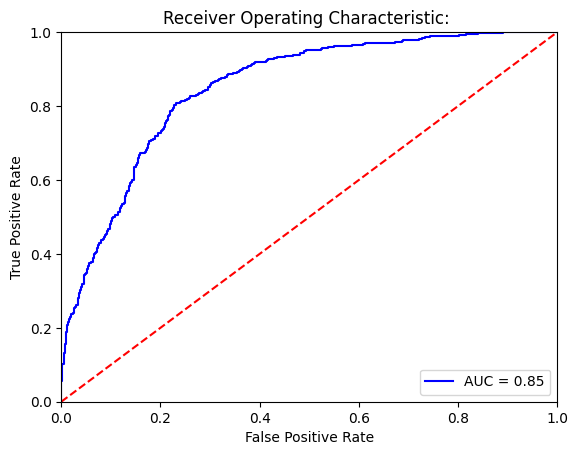

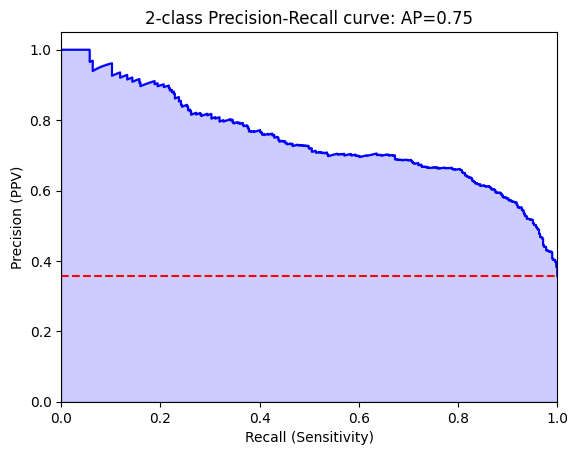

Threshold for best F1:
-0.47719592
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[682 201]
 [ 96 393]]


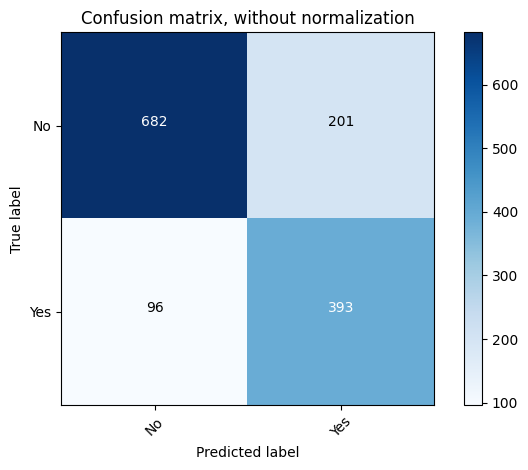

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.77      0.82       883
         Yes       0.66      0.80      0.73       489

    accuracy                           0.78      1372
   macro avg       0.77      0.79      0.77      1372
weighted avg       0.80      0.78      0.79      1372

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[792  91]
 [248 241]]


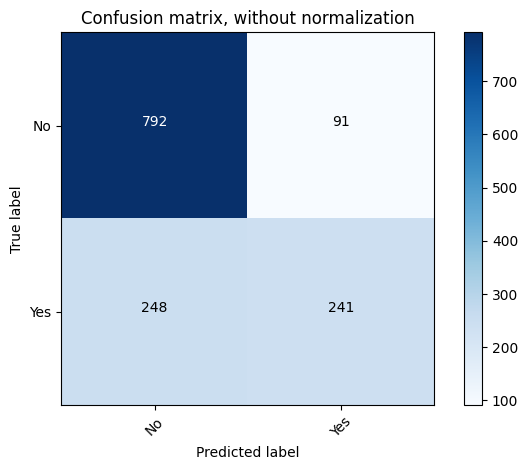

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.76      0.90      0.82       883
         Yes       0.73      0.49      0.59       489

    accuracy                           0.75      1372
   macro avg       0.74      0.69      0.71      1372
weighted avg       0.75      0.75      0.74      1372



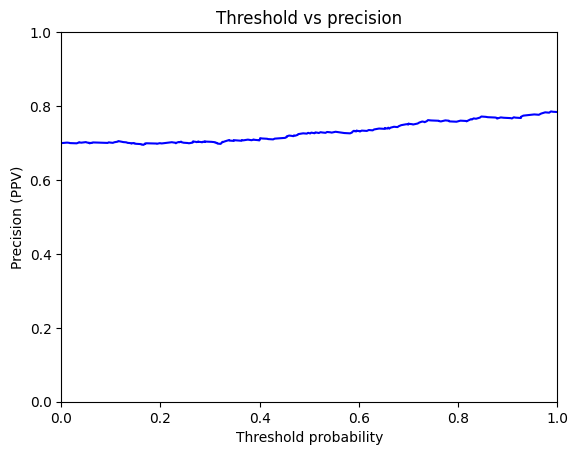

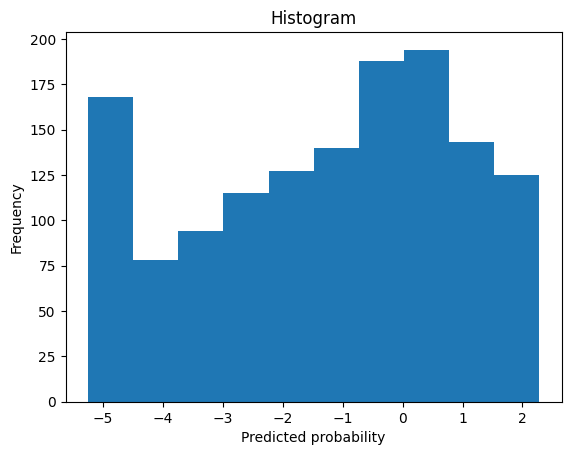

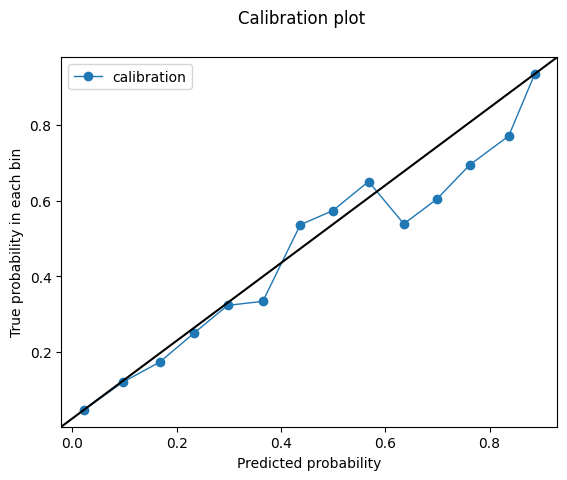

-0.47719592
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/3881868749.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.7905263474815128
Outcome probability: 0.3564139941690962
Average precision score: 0.66
Best F1: 0.6557911908646002


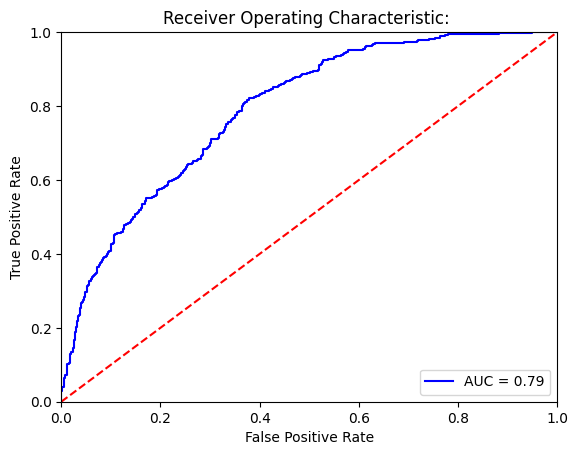

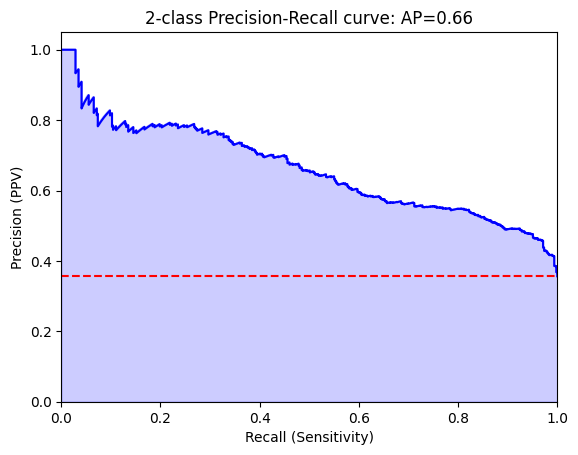

Threshold for best F1:
-1.4459002
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[548 335]
 [ 87 402]]


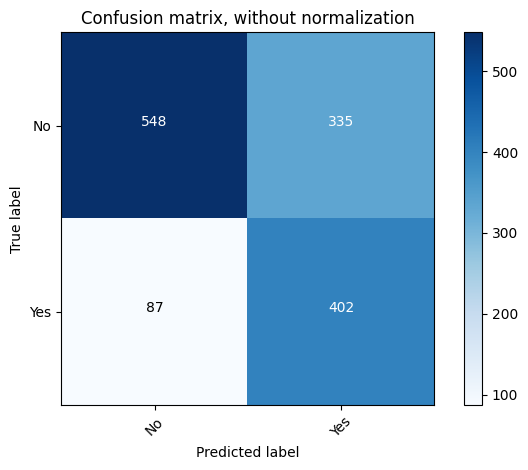

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.62      0.72       883
         Yes       0.55      0.82      0.66       489

    accuracy                           0.69      1372
   macro avg       0.70      0.72      0.69      1372
weighted avg       0.75      0.69      0.70      1372

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[837  46]
 [344 145]]


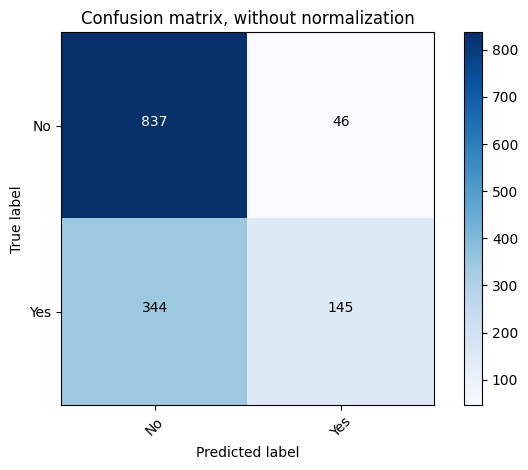

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.71      0.95      0.81       883
         Yes       0.76      0.30      0.43       489

    accuracy                           0.72      1372
   macro avg       0.73      0.62      0.62      1372
weighted avg       0.73      0.72      0.67      1372



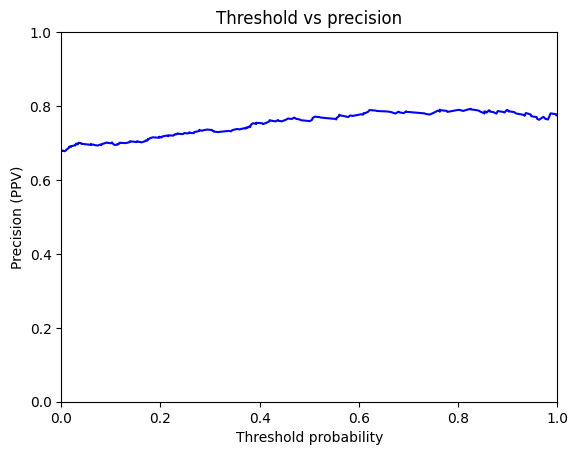

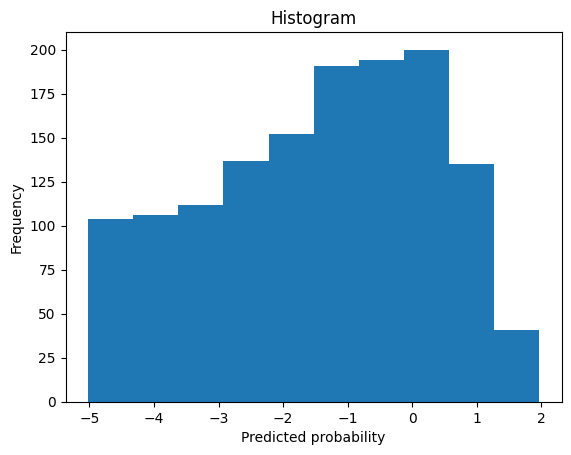

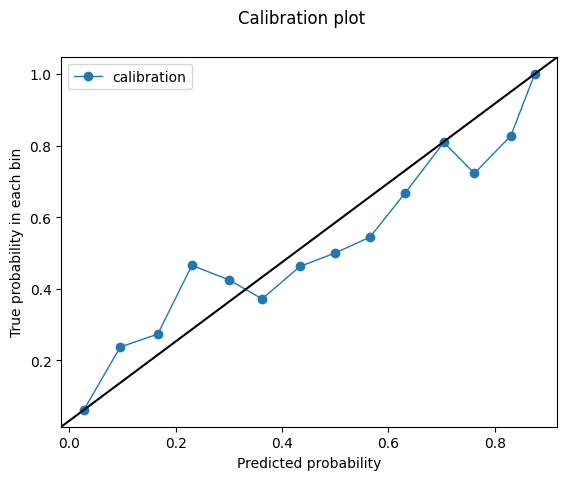

-1.4459002
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/3881868749.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.632703161512505
Outcome probability: 0.3564139941690962
Average precision score: 0.44
Best F1: 0.5629179331306992


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


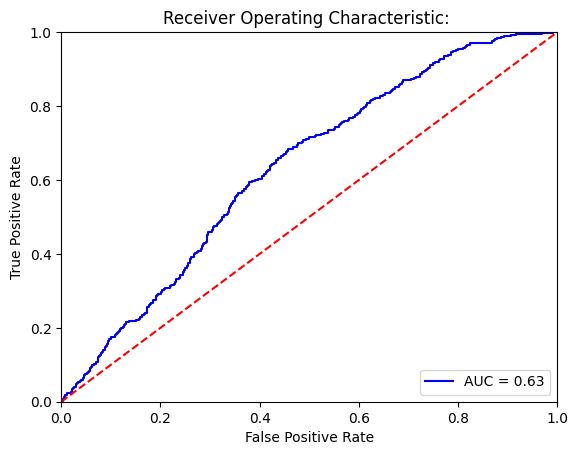

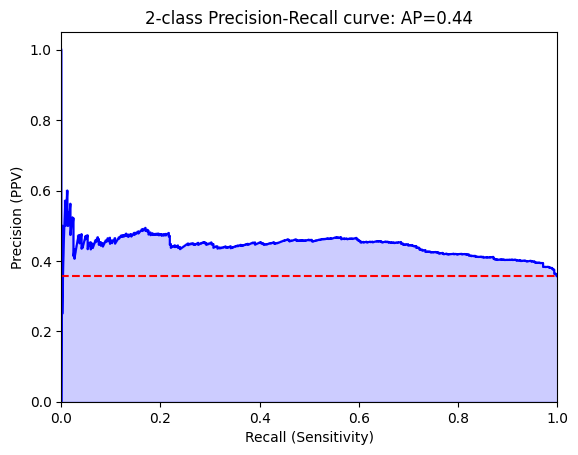

Threshold for best F1:
6.481455
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[882   1]
 [489   0]]


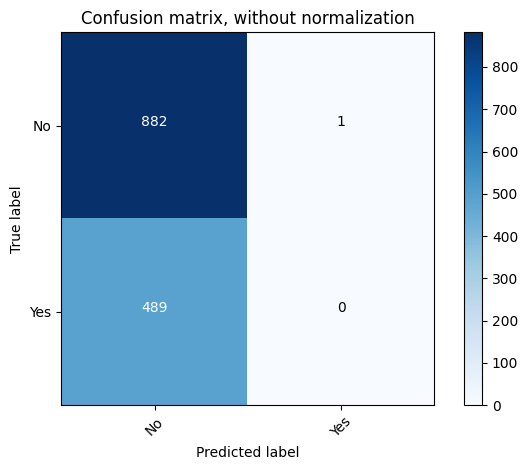

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.64      1.00      0.78       883
         Yes       0.00      0.00      0.00       489

    accuracy                           0.64      1372
   macro avg       0.32      0.50      0.39      1372
weighted avg       0.41      0.64      0.50      1372

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[856  27]
 [468  21]]


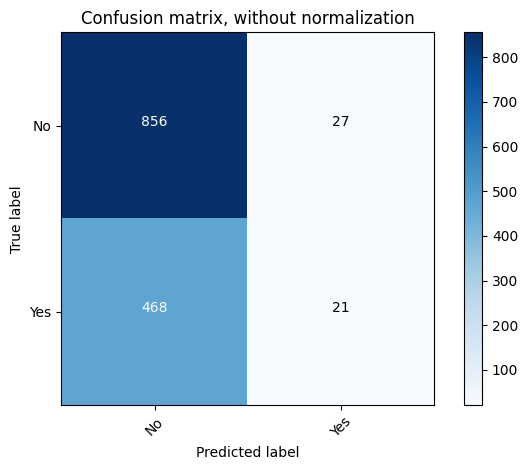

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.65      0.97      0.78       883
         Yes       0.44      0.04      0.08       489

    accuracy                           0.64      1372
   macro avg       0.54      0.51      0.43      1372
weighted avg       0.57      0.64      0.53      1372



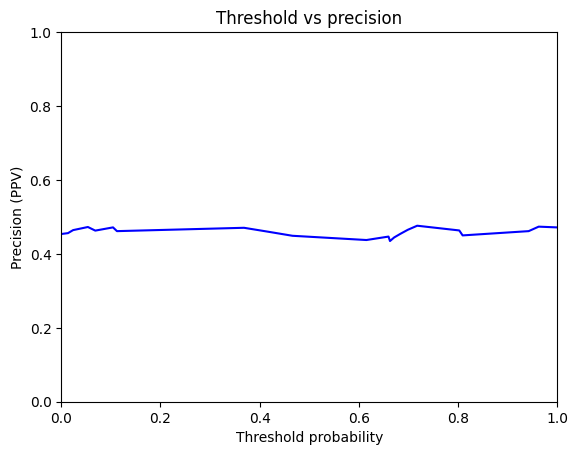

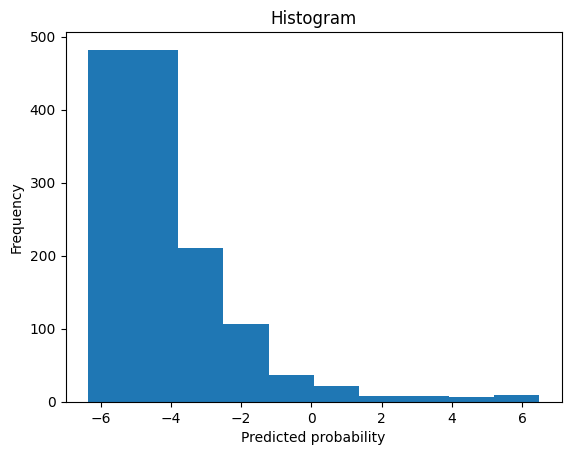

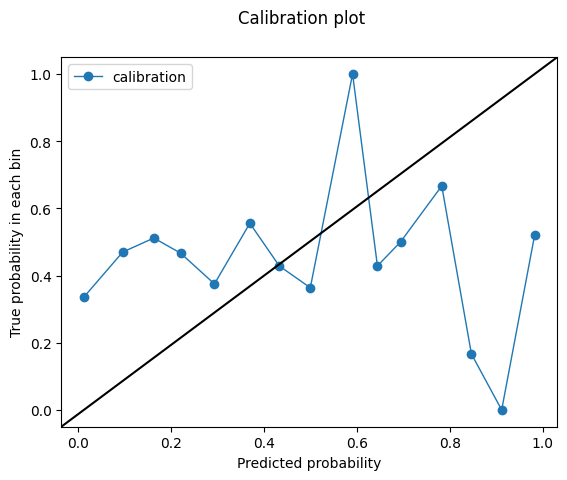

6.481455
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/3881868749.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.8135353773967257
Outcome probability: 0.3564139941690962
Average precision score: 0.68
Best F1: 0.6866614048934491


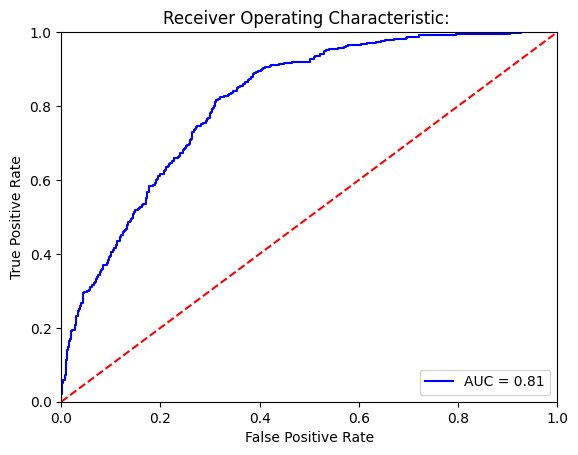

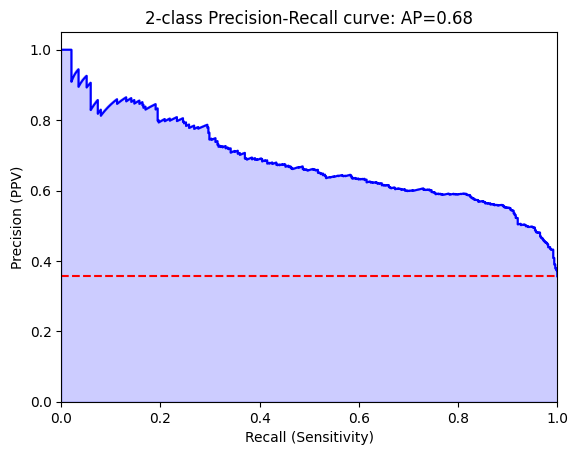

Threshold for best F1:
-1.8476719
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[540 343]
 [ 54 435]]


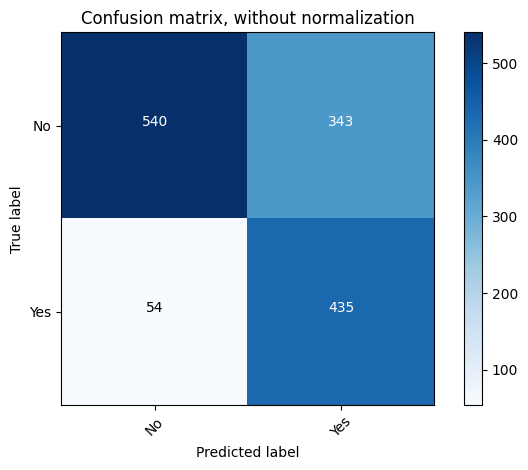

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.61      0.73       883
         Yes       0.56      0.89      0.69       489

    accuracy                           0.71      1372
   macro avg       0.73      0.75      0.71      1372
weighted avg       0.78      0.71      0.72      1372

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[875   8]
 [451  38]]


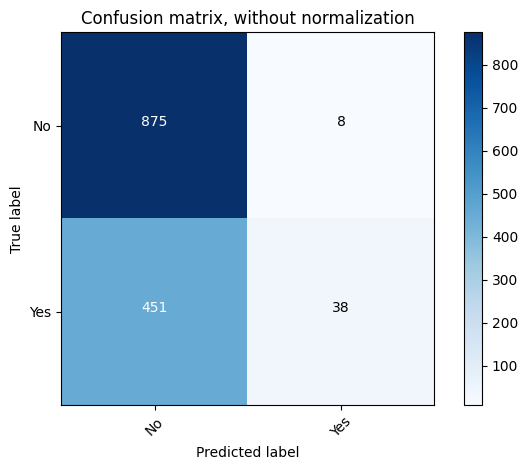

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.66      0.99      0.79       883
         Yes       0.83      0.08      0.14       489

    accuracy                           0.67      1372
   macro avg       0.74      0.53      0.47      1372
weighted avg       0.72      0.67      0.56      1372



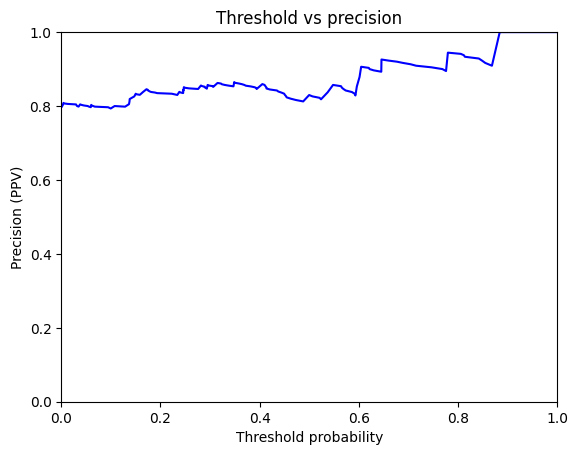

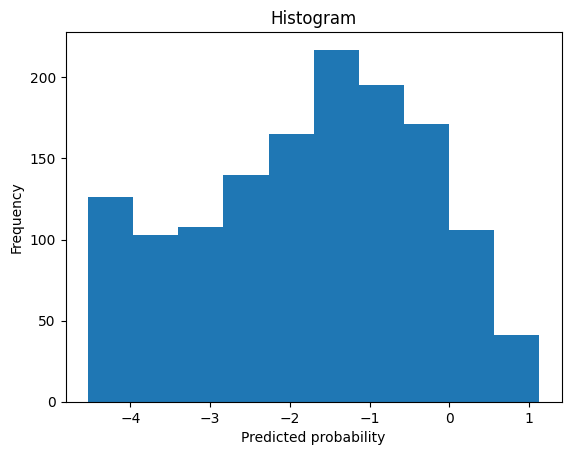

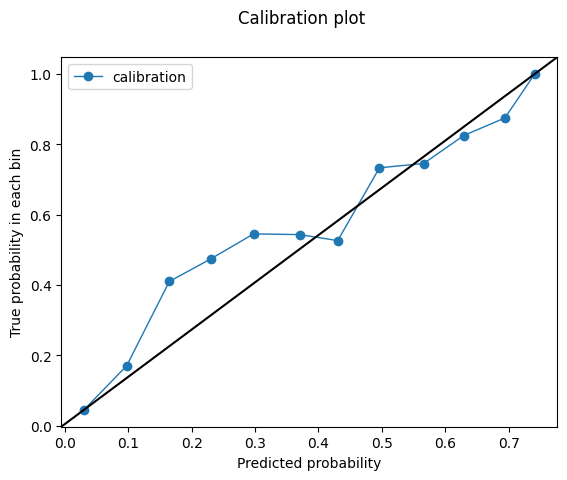

-1.8476719


In [39]:
print('model performance for women')

for model_type in model_paths:

    print('model type')
    print(model_type)
    validation = validation_full[validation_full.GENDER_NM == 'FEMALE'].copy()
    validation_day_text = validation
    validation_day_text['text'] = validation_day_text.text.astype(str)

    validation_day_text = validation_day_text.sort_values(by=['obs','dfci_mrn','time'])

    validation_day_text['text'] = validation_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    validation_day_text = validation_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #validation_day_text.info()

    # write out actual validation dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_valid_dataset = data.DataLoader(RecistDataset(validation.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_valid_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['prcr_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = validation_day_text.reset_index(drop=True)



    valid_output = pd.concat([output, resultframe], axis=1)
    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    valid_output= valid_output[valid_output.overall_response != 'BL']
    print('Female patients')
    print('model type')
    print(model_type)
    print(eval_model(valid_output.prcr_pred, valid_output.outcome, graph=True))


model performance for women
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt


/tmp/ipykernel_1594644/3501053876.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_prcr.pt
AUC 0.8932260024301335
Outcome probability: 0.31814415907207955
Average precision score: 0.78
Best F1: 0.7412280701754385


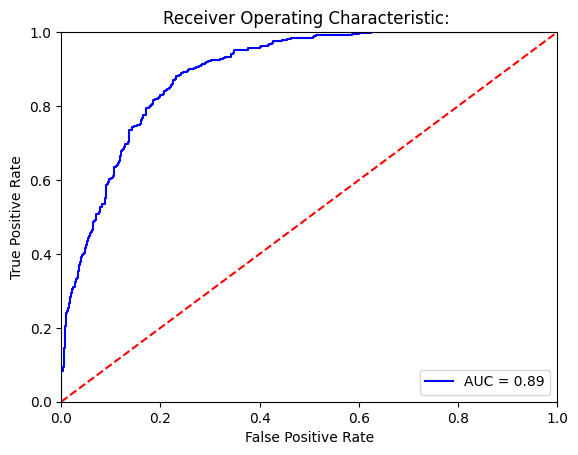

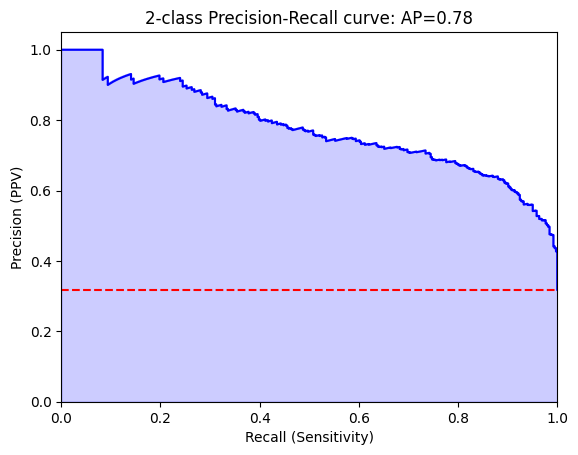

Threshold for best F1:
-0.9646237
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[633 190]
 [ 46 338]]


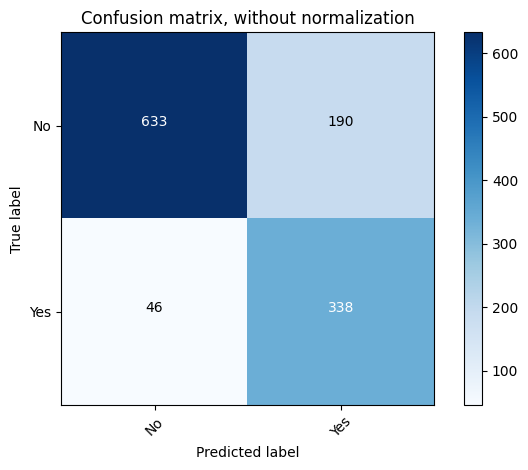

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.93      0.77      0.84       823
         Yes       0.64      0.88      0.74       384

    accuracy                           0.80      1207
   macro avg       0.79      0.82      0.79      1207
weighted avg       0.84      0.80      0.81      1207

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[749  74]
 [165 219]]


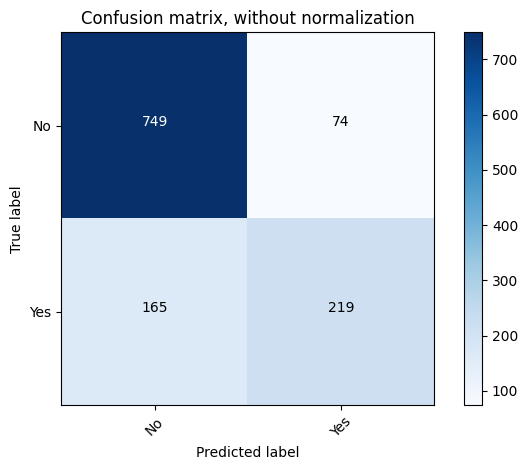

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.82      0.91      0.86       823
         Yes       0.75      0.57      0.65       384

    accuracy                           0.80      1207
   macro avg       0.78      0.74      0.75      1207
weighted avg       0.80      0.80      0.79      1207



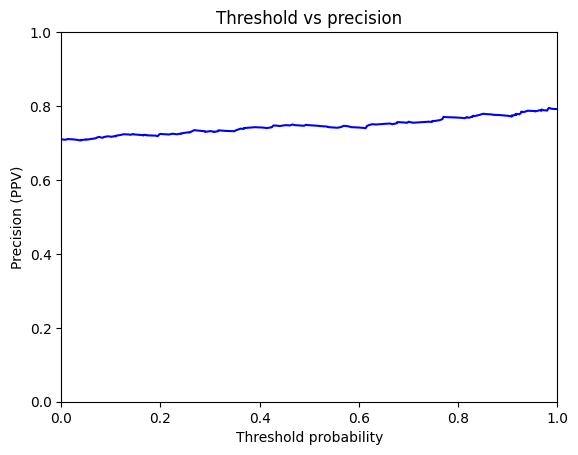

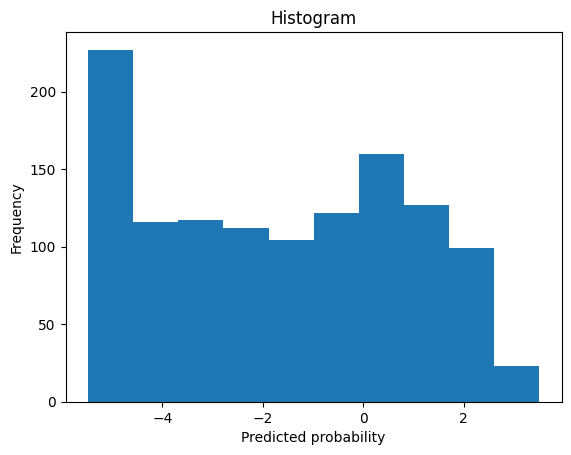

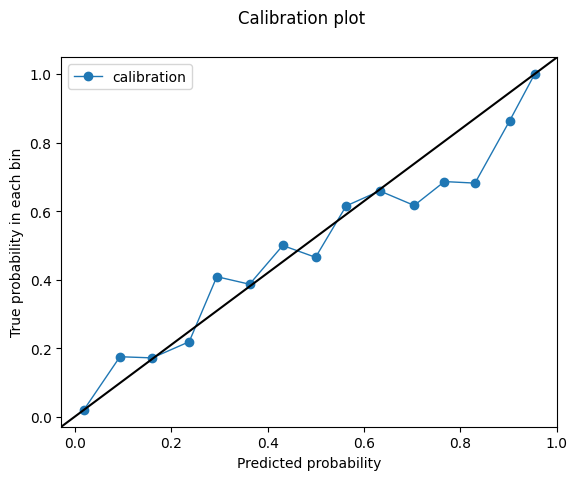

-0.9646237
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt


/tmp/ipykernel_1594644/3501053876.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_prcr.pt
AUC 0.8683329536249493
Outcome probability: 0.31814415907207955
Average precision score: 0.73
Best F1: 0.7104622871046229


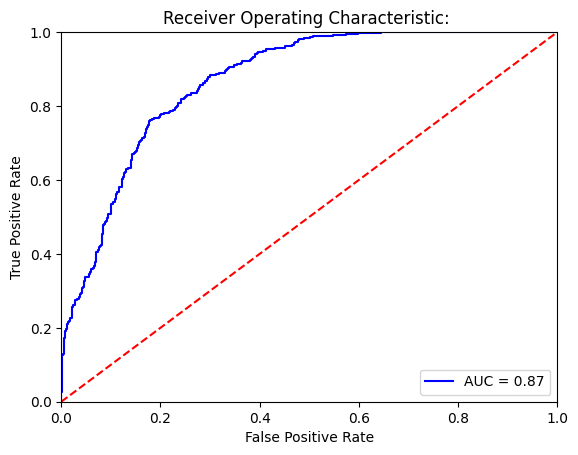

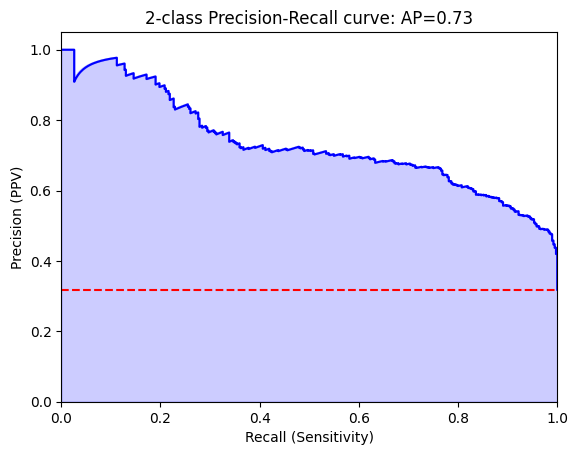

Threshold for best F1:
-0.11281989
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[677 146]
 [ 92 292]]


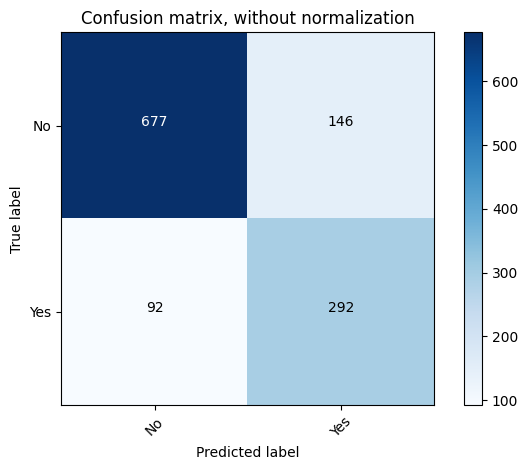

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.82      0.85       823
         Yes       0.67      0.76      0.71       384

    accuracy                           0.80      1207
   macro avg       0.77      0.79      0.78      1207
weighted avg       0.81      0.80      0.81      1207

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[735  88]
 [177 207]]


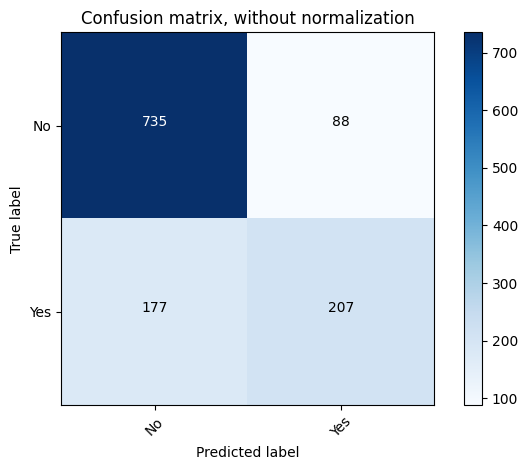

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.81      0.89      0.85       823
         Yes       0.70      0.54      0.61       384

    accuracy                           0.78      1207
   macro avg       0.75      0.72      0.73      1207
weighted avg       0.77      0.78      0.77      1207



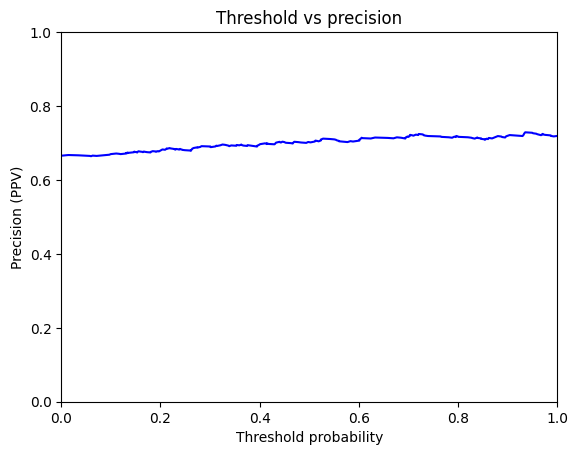

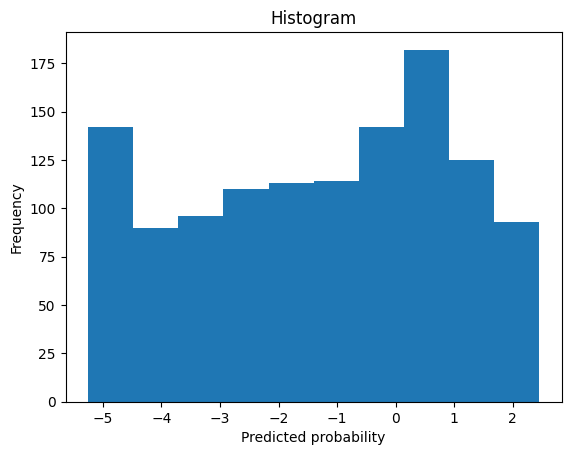

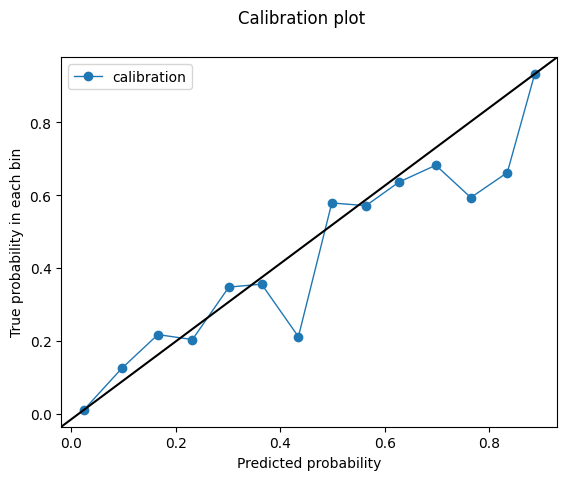

-0.11281989
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt


/tmp/ipykernel_1594644/3501053876.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_prcr.pt
AUC 0.8285743215876875
Outcome probability: 0.31814415907207955
Average precision score: 0.66
Best F1: 0.6646525679758308


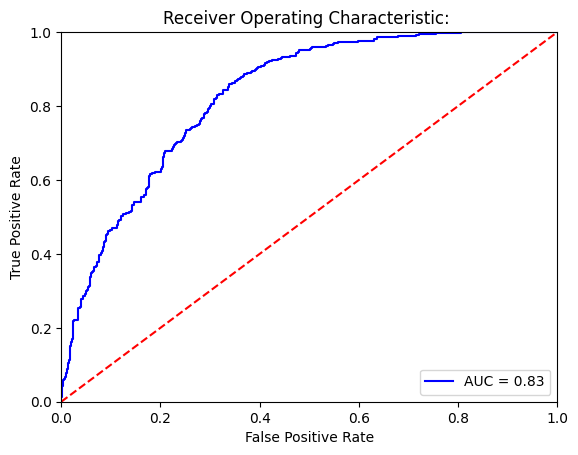

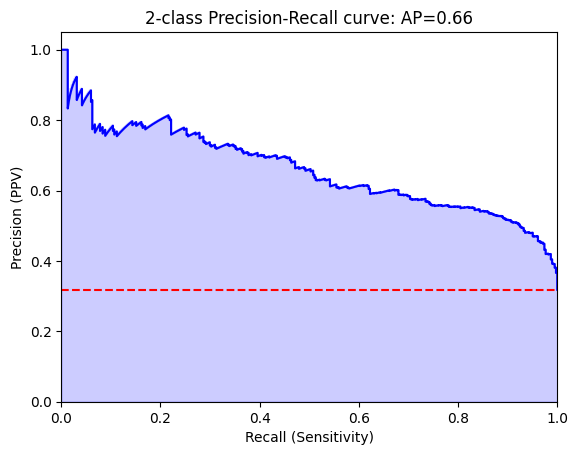

Threshold for best F1:
-1.3086139
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[544 279]
 [ 54 330]]


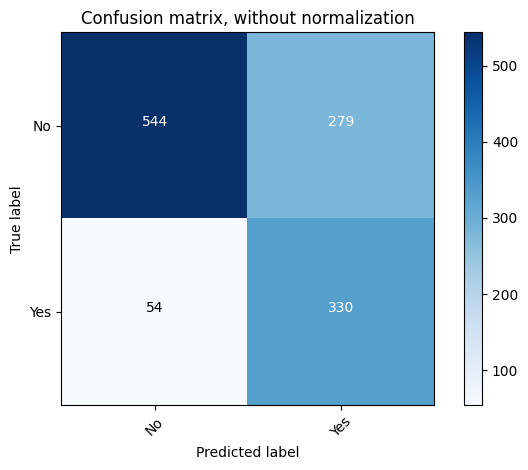

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.66      0.77       823
         Yes       0.54      0.86      0.66       384

    accuracy                           0.72      1207
   macro avg       0.73      0.76      0.72      1207
weighted avg       0.79      0.72      0.73      1207

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[760  63]
 [237 147]]


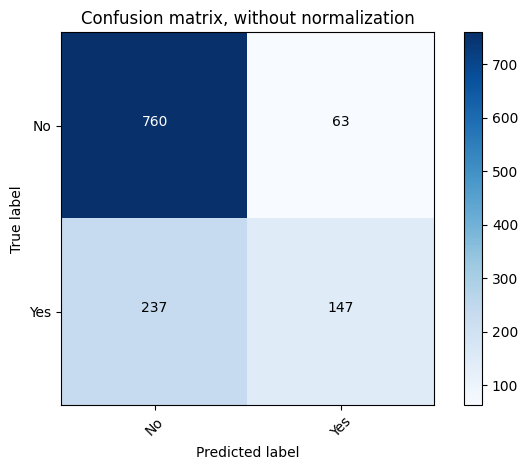

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.76      0.92      0.84       823
         Yes       0.70      0.38      0.49       384

    accuracy                           0.75      1207
   macro avg       0.73      0.65      0.67      1207
weighted avg       0.74      0.75      0.73      1207



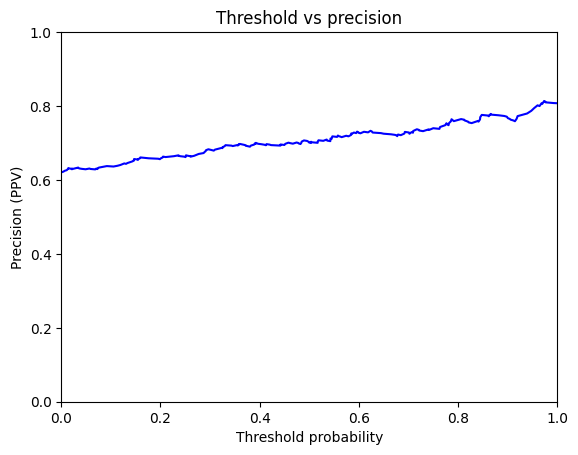

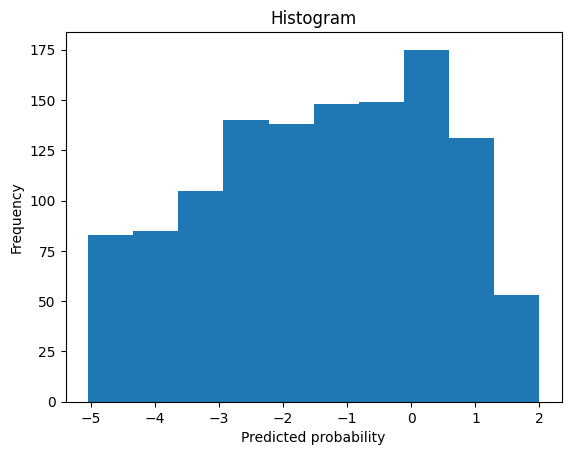

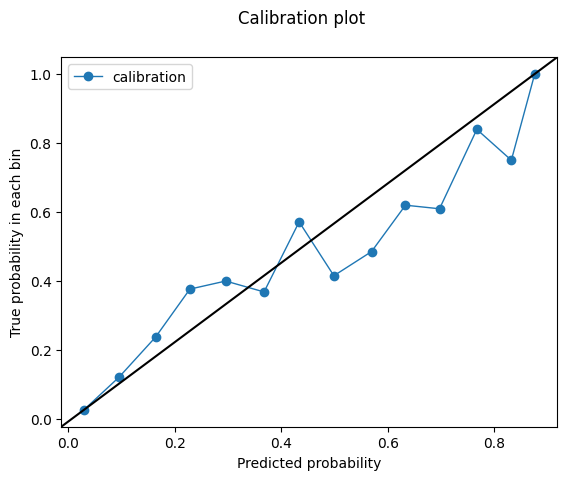

-1.3086139
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt


/tmp/ipykernel_1594644/3501053876.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_prcr.pt
AUC 0.7187816423653299
Outcome probability: 0.31814415907207955
Average precision score: 0.49
Best F1: 0.5856873822975518


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


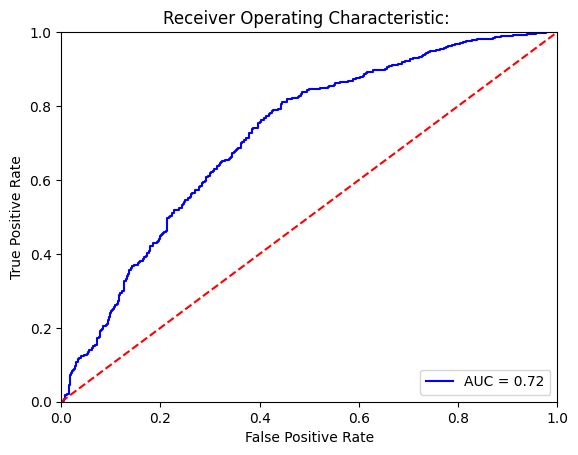

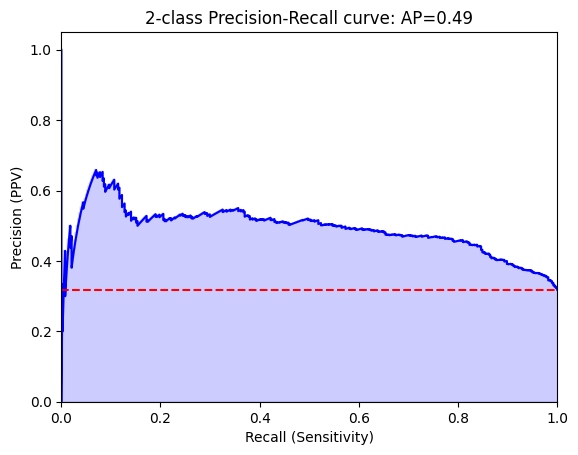

Threshold for best F1:
5.9265084
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[821   2]
 [384   0]]


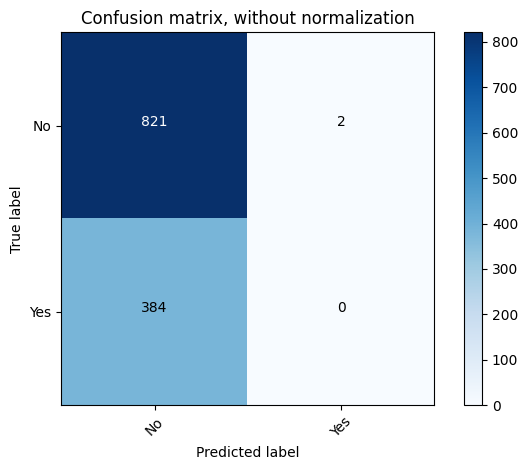

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.68      1.00      0.81       823
         Yes       0.00      0.00      0.00       384

    accuracy                           0.68      1207
   macro avg       0.34      0.50      0.40      1207
weighted avg       0.46      0.68      0.55      1207

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[810  13]
 [370  14]]


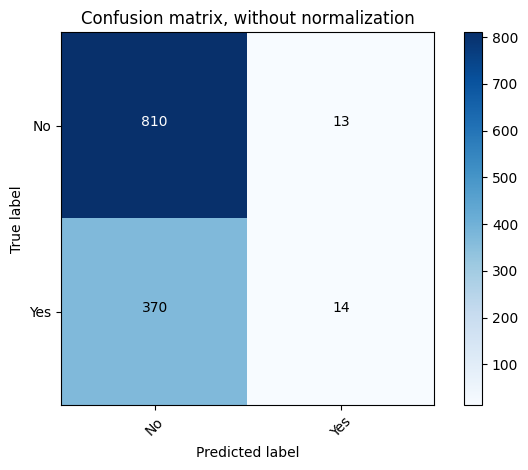

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.69      0.98      0.81       823
         Yes       0.52      0.04      0.07       384

    accuracy                           0.68      1207
   macro avg       0.60      0.51      0.44      1207
weighted avg       0.63      0.68      0.57      1207



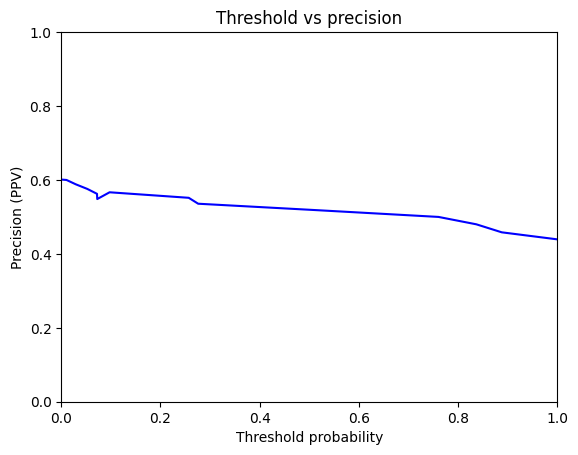

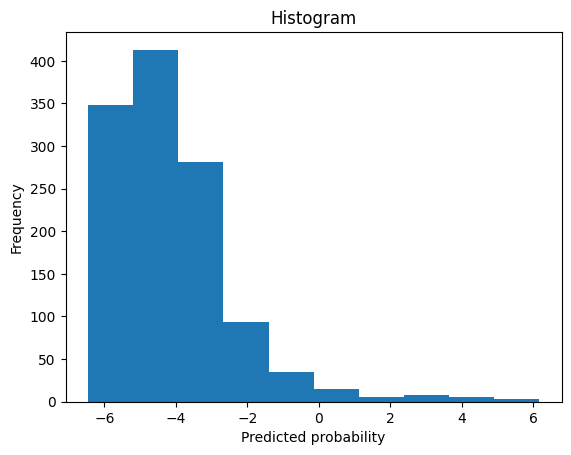

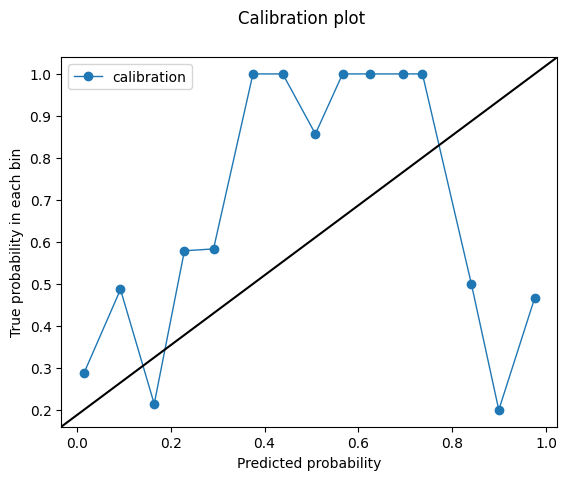

5.9265084
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt


/tmp/ipykernel_1594644/3501053876.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_prcr.pt
AUC 0.8548501417577967
Outcome probability: 0.31814415907207955
Average precision score: 0.71
Best F1: 0.6918103448275862


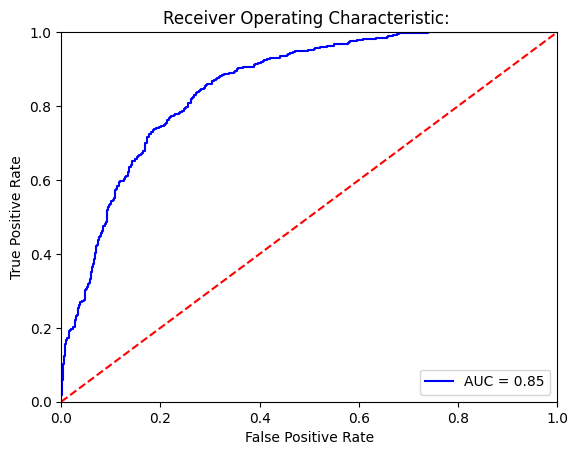

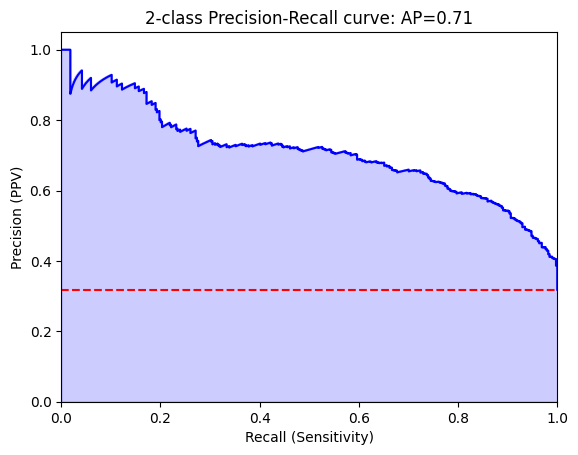

Threshold for best F1:
-1.5084841
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[600 223]
 [ 63 321]]


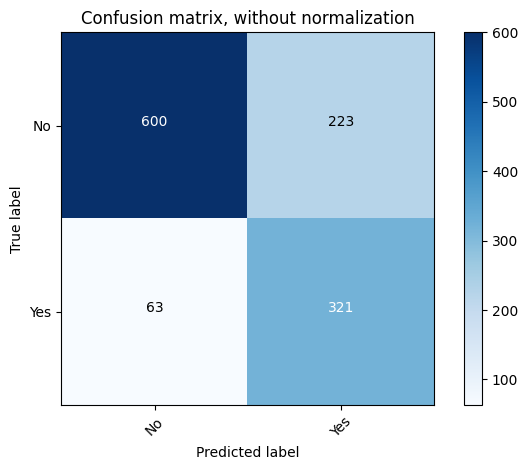

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.73      0.81       823
         Yes       0.59      0.84      0.69       384

    accuracy                           0.76      1207
   macro avg       0.75      0.78      0.75      1207
weighted avg       0.80      0.76      0.77      1207

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[817   6]
 [335  49]]


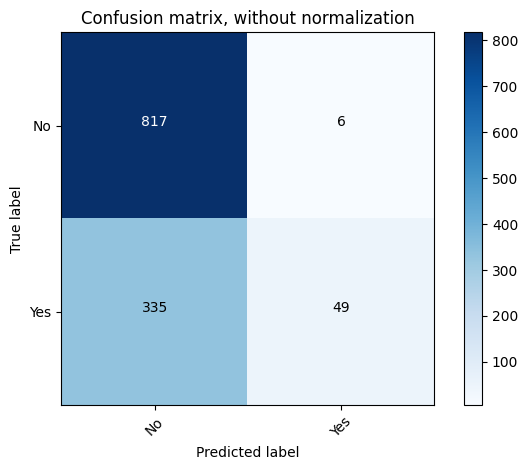

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.71      0.99      0.83       823
         Yes       0.89      0.13      0.22       384

    accuracy                           0.72      1207
   macro avg       0.80      0.56      0.53      1207
weighted avg       0.77      0.72      0.64      1207



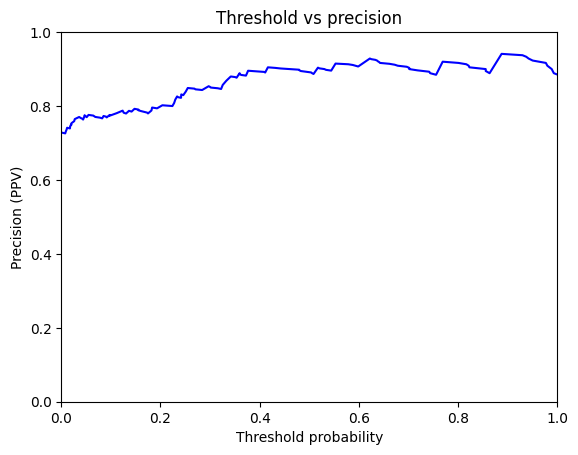

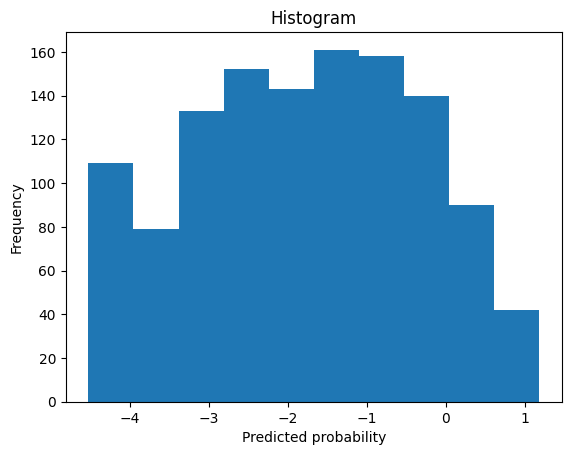

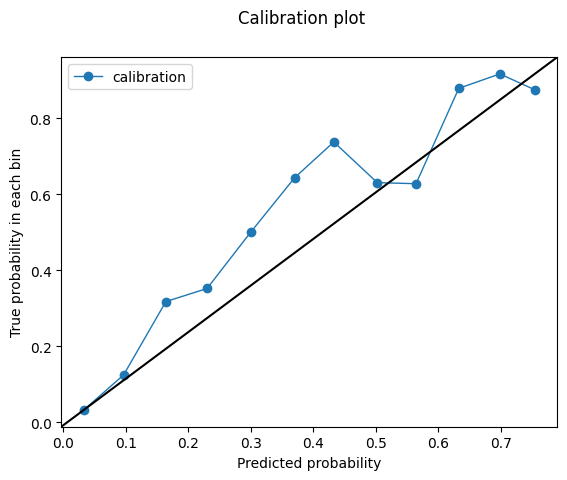

-1.5084841


In [40]:
print('model performance for women')

for model_type in model_paths:

    print('model type')
    print(model_type)
    test = test_full[test_full.GENDER_NM == 'FEMALE'].copy()
    test_day_text = test
    test_day_text['text'] = test_day_text.text.astype(str)

    test_day_text = test_day_text.sort_values(by=['obs','dfci_mrn','time'])

    test_day_text['text'] = test_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    test_day_text = test_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #test_day_text.info()

    # write out actual test dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_test_dataset = data.DataLoader(RecistDataset(test.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_test_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['prcr_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = test_day_text.reset_index(drop=True)



    test_output = pd.concat([output, resultframe], axis=1)
    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    test_output= test_output[test_output.overall_response != 'BL']
    print('Female patients')
    print('model type')
    print(model_type)
    print(eval_model(test_output.prcr_pred, test_output.outcome, graph=True))
